In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 3.5 MB/s eta 0:00:00


In [ ]:
pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.6 MB/s eta 0:00:00


In [ ]:
pip install keras-tuner --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.3 MB/s eta 0:00:00


Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import warnings
import random
import shap
import logging
import plotly.graph_objects as go
import plotly.figure_factory as ff
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedShuffleSplit
from sklearn.metrics import f1_score, confusion_matrix, classification_report, make_scorer, cohen_kappa_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, brier_score_loss, roc_curve, auc
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.calibration import calibration_curve
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import GRU, Dense, Dropout, Concatenate
from tensorflow.keras.optimizers import Adam
from keras.layers import GRU, LSTM, Dropout, Dense, BatchNormalization, Input
from keras.optimizers import Adam, Adagrad
from keras.models import load_model
from kerastuner import HyperParameters
from kerastuner.tuners import GridSearch
from statsmodels.graphics.mosaicplot import mosaic
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import EditedNearestNeighbours
from collections import Counter, defaultdict
from matplotlib.backends.backend_pdf import PdfPages

<ipython-input-4-10cf694cda96>:26: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner import HyperParameters


In [ ]:
# Ignore all warnings
warnings.filterwarnings("ignore")

# Pre-Processing

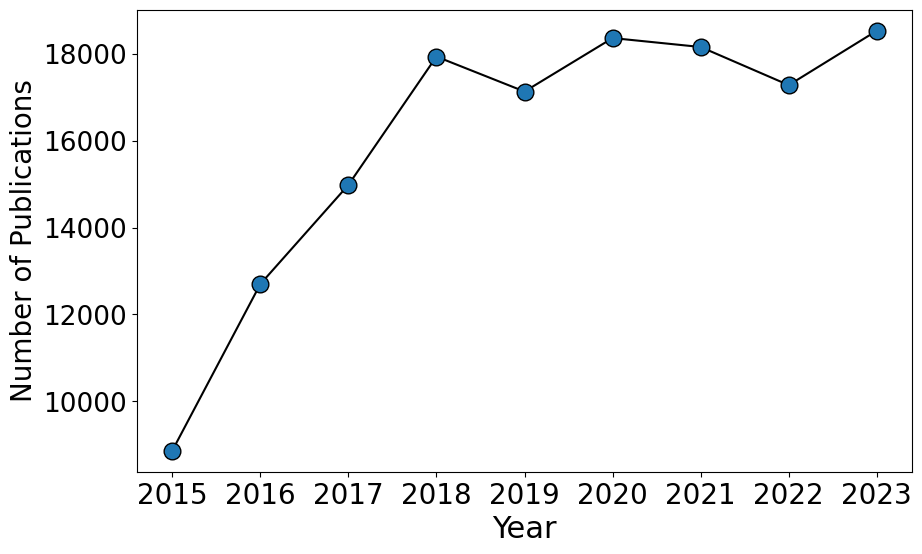

In [ ]:
years = [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
values = [8860, 12698, 14983, 17939, 17134, 18366, 18160, 17282, 18535]

# Create the line graph with increased font sizes
plt.figure(figsize=(10, 6))
plt.plot(years, values, marker='o', color='black', linestyle='-', markersize=12, markerfacecolor='tab:blue')

# Add labels and title with increased font size
plt.xlabel('Year', fontsize=22)
plt.ylabel('Number of Publications', fontsize=20)

# Increase the font size of the ticks
plt.xticks(fontsize=20)
plt.yticks(fontsize=19)

# Save the graph as a PDF
# plt.grid(True)
plt.savefig("chart_purchase.pdf", format='pdf')

# Show the graph
plt.show()

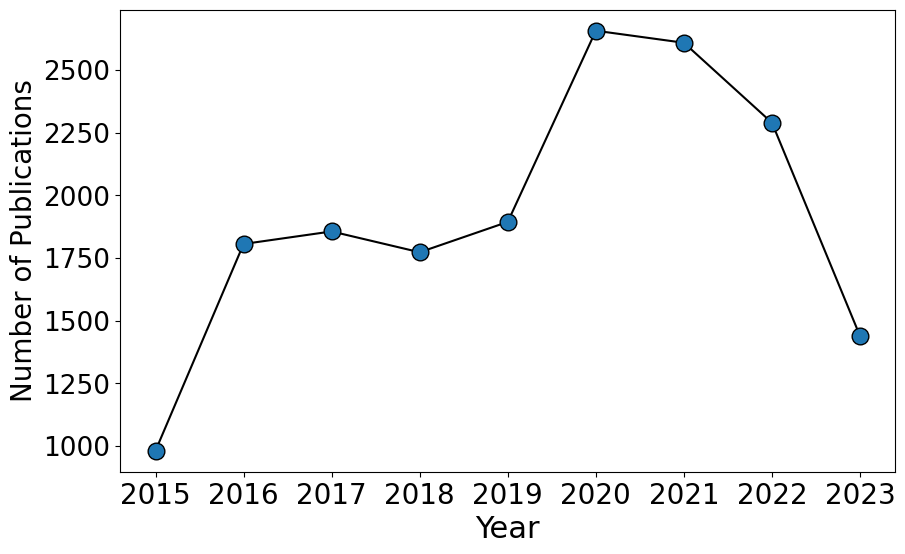

In [ ]:
years = [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
values = [982, 1806, 1856, 1773, 1894, 2656, 2608, 2289, 1439]

# Create the line graph with increased font sizes
plt.figure(figsize=(10, 6))
plt.plot(years, values, marker='o', color='black', linestyle='-', markersize=12, markerfacecolor='tab:blue')

# Add labels and title with increased font size
plt.xlabel('Year', fontsize=22)
plt.ylabel('Number of Publications', fontsize=20)

# Increase the font size of the ticks
plt.xticks(fontsize=20)
plt.yticks(fontsize=19)

# Save the graph as a PDF
# plt.grid(True)
plt.savefig("chart_cart_abandonment.pdf", format='pdf')

# Show the graph
plt.show()

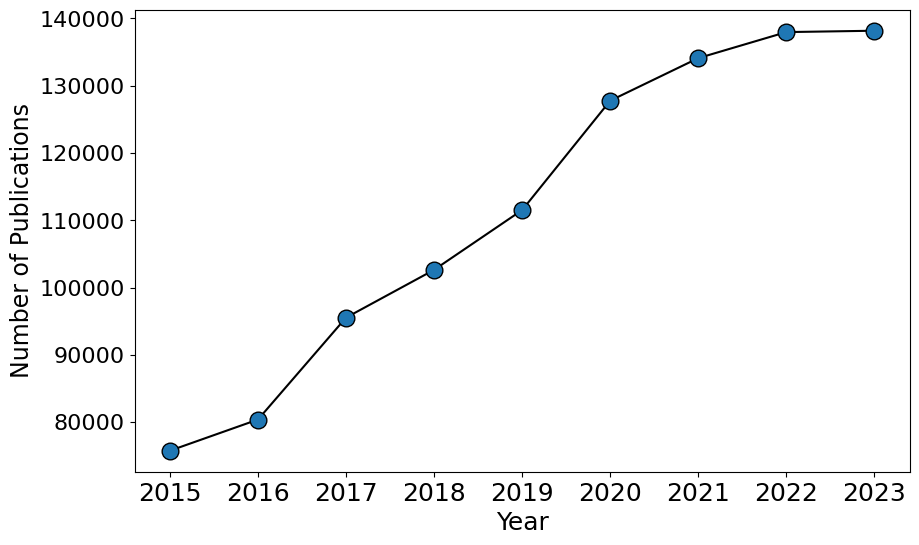

In [ ]:
# Data from the new image
years = [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
values = [75755, 80386, 95529, 102632, 111516, 127771, 134094, 137961, 138165]

# Create the line graph with increased font sizes
plt.figure(figsize=(10, 6))
plt.plot(years, values, marker='o', color='black', linestyle='-', markersize=12, markerfacecolor='tab:blue')

# Add labels and title with increased font size
plt.xlabel('Year', fontsize=18)
plt.ylabel('Number of Publications', fontsize=17)

# Increase the font size of the ticks
plt.xticks(fontsize=18)
plt.yticks(fontsize=16)

# Save the graph as a PDF
# plt.grid(True)
plt.savefig("chart_E-Commerce.pdf", format='pdf')

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/browsing_train.csv", header = 0, sep = ',')

df_train.head(10)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Thesis/Datasets/browsing_train.csv'

In [ ]:
df_train.shape

(36079307, 6)

In [ ]:
# create a column 'addcart' which is True if a session contains at least one add event and False otherwise
target_action = 'add'
df_train['addcart'] = df_train.groupby("session_id_hash")["product_action"].transform(lambda x: (x == target_action).any())

print(df_train['addcart'].value_counts())

# only keep sessions which feature at least an add event
df_train = df_train[df_train['addcart']]

# Display the result
df_train.head()

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/training_set_add_cart.csv")

In [ ]:
df_train.head()

,session_id_hash,event_type,product_action,product_sku_hash,server_timestamp_epoch_ms,hashed_url,addcart
0,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,293231f99098fc9552a19111d8ed7b6188bf0721b1a501...,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True
1,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,NaN,NaN,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True
2,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,NaN,NaN,1551545510494,744ac6435f90719fdec0276541a5c481138cc1f2f51106...,True
3,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,NaN,NaN,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True
4,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,36e8246f800db10613eef89c81513df909ec8171a875f0...,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True


In [ ]:
df_train['product_action'] = df_train['product_action'].fillna('view')

In [ ]:
# you can check whether you successfully filtered out sessions with no add to cart by computing the mean
# of the 'addcart' column. It should yield 1.
df_train["addcart"].mean()

1.0

In [ ]:
# Label the sessions (1: conversions; 0: cart-abandonement)
# create a column 'convert' which is True if a session contains at least a purchase event and False otherwise
target_action = 'purchase'
df_train['convert'] = df_train.groupby("session_id_hash")["product_action"].transform(lambda x: (x == target_action).any())

df_train.head(10)

,session_id_hash,event_type,product_action,product_sku_hash,server_timestamp_epoch_ms,hashed_url,addcart,convert
0,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,293231f99098fc9552a19111d8ed7b6188bf0721b1a501...,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True,True
1,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True,True
2,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545510494,744ac6435f90719fdec0276541a5c481138cc1f2f51106...,True,True
3,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True,True
4,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,36e8246f800db10613eef89c81513df909ec8171a875f0...,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True,True
5,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,add,36e8246f800db10613eef89c81513df909ec8171a875f0...,1551545686640,83b4fdad686c1be4eba335f70d23ae202b84b6153e109e...,True,True
6,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545760235,0ad6fab1eb3ac76010ea2fa6399a4e993b00f6501c88a2...,True,True
7,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545777947,e93e5c83aab0987e41d8fd65a30b54d2ce87491b4a7f9b...,True,True
8,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551546521904,e396b36a40f2c41d259a45b80e10cd113eb0bf7540b73f...,True,True
9,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,purchase,36e8246f800db10613eef89c81513df909ec8171a875f0...,1551546521904,e396b36a40f2c41d259a45b80e10cd113eb0bf7540b73f...,True,True


In [ ]:
# filter sessions which are either too short (<5) or too long (>100)
df_train['nevents'] = df_train.groupby('session_id_hash')['event_type'].transform("count")
condition1 = df_train['nevents'] >= 5
condition2 = df_train['nevents'] <= 155
combined_condition = condition1 & condition2

# Apply the combined condition to filter the DataFrame
df_train = df_train[combined_condition]

df_train.shape

(5782587, 9)

In [ ]:
# Checking if the conditions have been applied
df_train["nevents"].min()

5

In [ ]:
df_train["nevents"].max()

155

In [ ]:
action_counts = df_train['product_action'].value_counts()
action_counts

product_action
view        3876587
detail      1271046
add          305362
remove       263754
purchase      65838
Name: count, dtype: int64

In [ ]:
# 5 symbolize actions (map actions to integers by inverse frequency, so the most frequent event to 1, the next
# most frequent to 2, and so on...)
# Create a Counter for the actions
action_counts = Counter(df_train['product_action'])

# Create a symbol-to-index mapping based on inverse frequency
symbol2idx_inverse = {
    symbol: idx for idx, symbol in enumerate(sorted(action_counts, key=action_counts.get, reverse=True), 1)
}

# Symbolize actions and create a new column 'product_action_symb'
df_train['product_action_symb'] = df_train['product_action'].map(symbol2idx_inverse)

df_train.shape

(5782587, 10)

In [ ]:
# 1: view, 2: detail, 3: add, 4: remove, 5: purchase

In [ ]:
df_train['conversion'] = np.where((df_train['addcart'] == True) & (df_train['convert'] == True), 1,
                            np.where((df_train['addcart'] == True) & (df_train['convert'] == False), 0, np.nan))

In [ ]:
df_train["date"] = pd.to_datetime(df_train["server_timestamp_epoch_ms"], unit = "ms")
df_train["week_day"] = df_train["date"].dt.weekday
df_train['weekend'] = np.where(df_train["week_day"] >= 5, True, False)
df_train["month"] = df_train["date"].dt.month
df_train["hour"] = df_train["date"].dt.hour

In [ ]:
df_train['session_duration'] = df_train.groupby('session_id_hash')['server_timestamp_epoch_ms'].transform(
    lambda x: x.max() - x.min()
)
# Convert the session duration from ms to sec
df_train['session_duration'] = (df_train['session_duration'] / 1000).round()

In [ ]:
df_train['unique_products_viewed'] = df_train.groupby('session_id_hash')['product_sku_hash'].transform("nunique")

In [ ]:
df_train['avg_dwell_time'] = df_train["session_duration"] / df_train["nevents"]

In [ ]:
df_train.head()

,session_id_hash,event_type,product_action,product_sku_hash,server_timestamp_epoch_ms,hashed_url,addcart,convert,nevents,product_action_symb,conversion,date,week_day,weekend,month,hour,session_duration,unique_products_viewed,avg_dwell_time
0,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,293231f99098fc9552a19111d8ed7b6188bf0721b1a501...,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True,True,13,2,1.0,2019-03-02 16:51:43.415,5,True,3,16,1107.0,2,85.153846
1,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True,True,13,1,1.0,2019-03-02 16:51:43.415,5,True,3,16,1107.0,2,85.153846
2,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545510494,744ac6435f90719fdec0276541a5c481138cc1f2f51106...,True,True,13,1,1.0,2019-03-02 16:51:50.494,5,True,3,16,1107.0,2,85.153846
3,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True,True,13,1,1.0,2019-03-02 16:51:54.312,5,True,3,16,1107.0,2,85.153846
4,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,36e8246f800db10613eef89c81513df909ec8171a875f0...,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True,True,13,2,1.0,2019-03-02 16:51:54.312,5,True,3,16,1107.0,2,85.153846


In [ ]:
df_train.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed.csv", index = False)

# Exploratory Data Analysis

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed.csv")

In [ ]:
df_train.head()

,session_id_hash,event_type,product_action,product_sku_hash,server_timestamp_epoch_ms,hashed_url,addcart,convert,nevents,product_action_symb,conversion,date,week_day,weekend,month,hour,session_duration,unique_products_viewed,avg_dwell_time
0,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,293231f99098fc9552a19111d8ed7b6188bf0721b1a501...,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True,True,13,2,1.0,2019-03-02 16:51:43.415,5,True,3,16,1107.0,2,85.153846
1,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True,True,13,1,1.0,2019-03-02 16:51:43.415,5,True,3,16,1107.0,2,85.153846
2,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545510494,744ac6435f90719fdec0276541a5c481138cc1f2f51106...,True,True,13,1,1.0,2019-03-02 16:51:50.494,5,True,3,16,1107.0,2,85.153846
3,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True,True,13,1,1.0,2019-03-02 16:51:54.312,5,True,3,16,1107.0,2,85.153846
4,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,36e8246f800db10613eef89c81513df909ec8171a875f0...,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True,True,13,2,1.0,2019-03-02 16:51:54.312,5,True,3,16,1107.0,2,85.153846


## Counts and Distributions

In [ ]:
action_counts = df_train['product_action'].value_counts()
action_counts

product_action
view        3876587
detail      1271046
add          305362
remove       263754
purchase      65838
Name: count, dtype: int64

In [ ]:
# First, ensure the 'conversion' column is treated as an integer for proper grouping
df_train['conversion'] = df_train['conversion'].astype(int)

# Function to calculate percentages
def calculate_action_percentages(group):
    action_counts = group['product_action'].value_counts(normalize=True) * 100
    return action_counts

# Group by 'conversion' and apply the function
action_percentages_by_conversion = df_train.groupby('conversion').apply(calculate_action_percentages)

# Display the results
print(action_percentages_by_conversion)

conversion  product_action
0           view              66.738113
            detail            24.005816
            add                5.581363
            remove             3.674708
1           view              67.808944
            detail            16.797544
            remove             6.829846
            add                4.511294
            purchase           4.052372
Name: proportion, dtype: float64


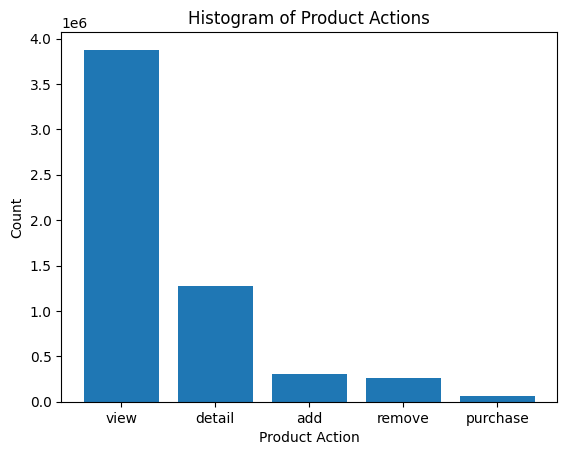

In [ ]:
action_counts = {
    'view': 3876587,
    'detail': 1271046,
    'add': 305362,
    'remove': 263754,
    'purchase': 65838
}

# Create a histogram
plt.bar(action_counts.keys(), action_counts.values())

# Adding labels and title
plt.xlabel('Product Action')
plt.ylabel('Count')
plt.title('Histogram of Product Actions')

# Display the plot
plt.show()

In [ ]:
conversion_counts = df_train['conversion'].value_counts()
conversion_counts

conversion
0    4157909
1    1624678
Name: count, dtype: int64

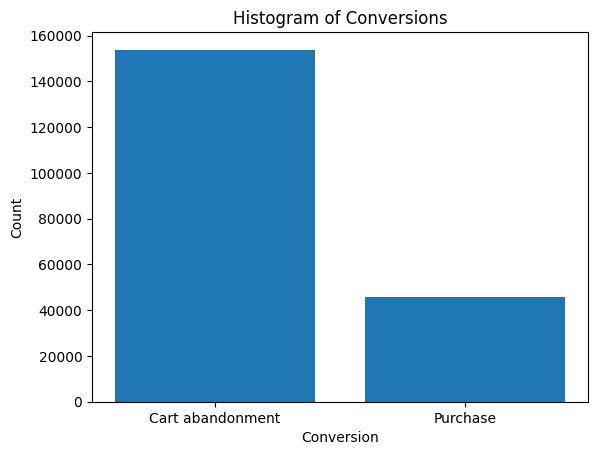

In [ ]:
# Given data
conversion_counts = {
    0.0: 153788.0,
    1.0: 45603.0
}

# Create a histogram
plt.bar(conversion_counts.keys(), conversion_counts.values())

# Adding labels and title
plt.xlabel('Conversion')
plt.ylabel('Count')
plt.title('Histogram of Conversions')

# Set custom x-axis tick labels
plt.xticks(list(conversion_counts.keys()), ['Cart abandonment', 'Purchase'])

# Display the plot
plt.show()

In [ ]:
df_train["date"].min()

'2019-01-15 05:02:57.856'

In [ ]:
df_train["date"].max()

'2019-04-15 03:58:30.415'

In [ ]:
df_train = df_train.groupby('session_id_hash').agg({'product_action_symb': list, 'nevents': 'first', 'week_day': 'first', 'weekend': 'first', 'hour': 'first', 'session_duration': 'first', 'conversion': 'first', 'unique_products_viewed': 'first', 'avg_dwell_time': 'first'}).reset_index()
df_train.head()

,session_id_hash,product_action_symb,nevents,week_day,weekend,hour,session_duration,conversion,unique_products_viewed,avg_dwell_time
0,00000114e1075962f022114fcfc17f2d874e694ac5d201...,"[1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, ...",18,1,False,20,3479.0,0,3,193.277778
1,000010504025397b03290c7457e0e7ef7ae93529f21eae...,"[2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, ...",81,3,False,12,2024.0,0,10,24.987654
2,0000913afa22ba9c31efb992bcf6388b0bbfe28056bef3...,"[1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, ...",139,4,False,14,3647.0,0,23,26.237410
3,00010d84aca1294479304044207fd268f63228844779c6...,"[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, ...",41,6,True,18,2612.0,0,3,63.707317
4,0001368d732951035a7ef7ef42b345a5c50b7d66966749...,"[1, 2, 3, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1]",16,3,False,3,265.0,0,1,16.562500


In [ ]:
df_train = df_train.rename(columns={'product_action_symb': 'session'})

In [ ]:
df_train["nevents"].sum()

5782587

In [ ]:
session_duration = df_train.groupby('conversion')['session_duration']
print(session_duration.describe())

               count         mean          std   min    25%     50%     75%  \
conversion                                                                    
0           153788.0   866.485441   967.220532   1.0  222.0   532.5  1173.0   
1            45603.0  1354.101046  1093.827045  44.0  573.0  1022.0  1806.0   

                max  
conversion           
0           15951.0  
1           10486.0  


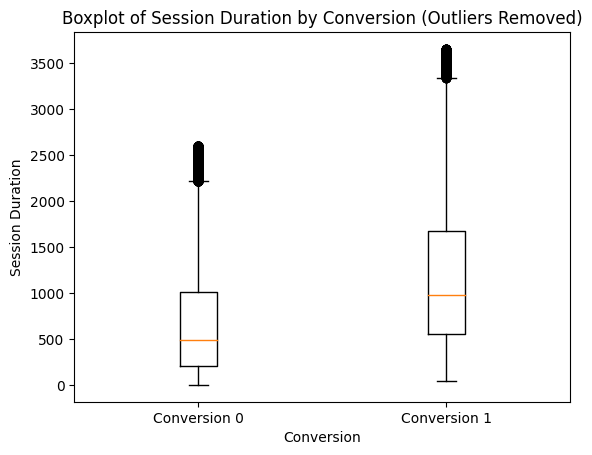

In [ ]:
# Obtain summary statistics for each conversion group
session_duration_stats = df_train.groupby('conversion')['session_duration'].describe()

# Extract specific statistics for each conversion
conversion_0_stats = session_duration_stats.loc[0]
conversion_1_stats = session_duration_stats.loc[1]

# Define lower and upper percentiles (e.g., 10th and 90th percentiles)
lower_percentile = 10
upper_percentile = 90

# Calculate lower and upper bounds for each conversion group
conversion_0_lower_bound = conversion_0_stats['25%'] - 1.5 * (conversion_0_stats['75%'] - conversion_0_stats['25%'])
conversion_0_upper_bound = conversion_0_stats['75%'] + 1.5 * (conversion_0_stats['75%'] - conversion_0_stats['25%'])
conversion_1_lower_bound = conversion_1_stats['25%'] - 1.5 * (conversion_1_stats['75%'] - conversion_1_stats['25%'])
conversion_1_upper_bound = conversion_1_stats['75%'] + 1.5 * (conversion_1_stats['75%'] - conversion_1_stats['25%'])

# Filter out data points outside of the bounds
filtered_conversion_0 = df_train[(df_train['conversion'] == 0) & (df_train['session_duration'] >= conversion_0_lower_bound) & (df_train['session_duration'] <= conversion_0_upper_bound)]
filtered_conversion_1 = df_train[(df_train['conversion'] == 1) & (df_train['session_duration'] >= conversion_1_lower_bound) & (df_train['session_duration'] <= conversion_1_upper_bound)]

# Create boxplot
plt.boxplot([filtered_conversion_0['session_duration'], filtered_conversion_1['session_duration']], labels=['Conversion 0', 'Conversion 1'])
# plt.title('Boxplot of Session Duration by Conversion')
plt.xlabel('Conversion')
plt.ylabel('Session Duration')
plt.savefig('t_SNE_without_SMOTE.pdf', format='pdf')
plt.show()


In [ ]:
session_events = df_train.groupby('conversion')['nevents']
print(session_events.describe())

               count       mean        std  min   25%   50%   75%    max
conversion                                                              
0.0         153788.0  27.036628  24.047066  5.0  11.0  19.0  35.0  155.0
1.0          45603.0  35.626560  27.341102  5.0  16.0  27.0  46.0  155.0


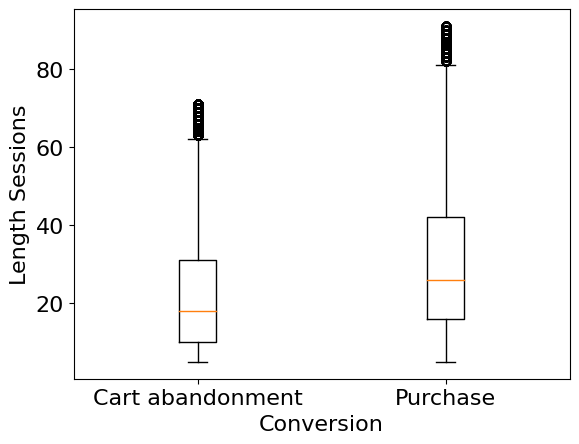

In [ ]:
# Obtain summary statistics for each conversion group
session_duration_stats = df_train.groupby('conversion')['nevents'].describe()

# Extract specific statistics for each conversion
conversion_0_stats = session_duration_stats.loc[0]
conversion_1_stats = session_duration_stats.loc[1]

# Define lower and upper percentiles (e.g., 10th and 90th percentiles)
lower_percentile = 10
upper_percentile = 90

# Calculate lower and upper bounds for each conversion group
conversion_0_lower_bound = conversion_0_stats['25%'] - 1.5 * (conversion_0_stats['75%'] - conversion_0_stats['25%'])
conversion_0_upper_bound = conversion_0_stats['75%'] + 1.5 * (conversion_0_stats['75%'] - conversion_0_stats['25%'])
conversion_1_lower_bound = conversion_1_stats['25%'] - 1.5 * (conversion_1_stats['75%'] - conversion_1_stats['25%'])
conversion_1_upper_bound = conversion_1_stats['75%'] + 1.5 * (conversion_1_stats['75%'] - conversion_1_stats['25%'])

# Filter out data points outside of the bounds
filtered_conversion_0 = df_train[(df_train['conversion'] == 0) & (df_train['nevents'] >= conversion_0_lower_bound) & (df_train['nevents'] <= conversion_0_upper_bound)]
filtered_conversion_1 = df_train[(df_train['conversion'] == 1) & (df_train['nevents'] >= conversion_1_lower_bound) & (df_train['nevents'] <= conversion_1_upper_bound)]

# Create boxplot
plt.boxplot([filtered_conversion_0['nevents'], filtered_conversion_1['nevents']], labels=['Cart abandonment', 'Purchase'])
plt.xlabel('Conversion', fontsize=16)
plt.ylabel('Length Sessions', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('nevents.pdf', format='pdf')
plt.show()

In [ ]:
avg_dwell_time = df_train.groupby('conversion')['avg_dwell_time']
print(avg_dwell_time.describe())

               count       mean        std       min        25%        50%  \
conversion                                                                   
0.0         153788.0  35.320980  36.129066  0.166667  14.400000  23.666667   
1.0          45603.0  45.374278  33.372904  2.794118  23.511111  35.952381   

                  75%         max  
conversion                         
0.0         42.138332  748.400000  
1.0         55.939338  413.777778  


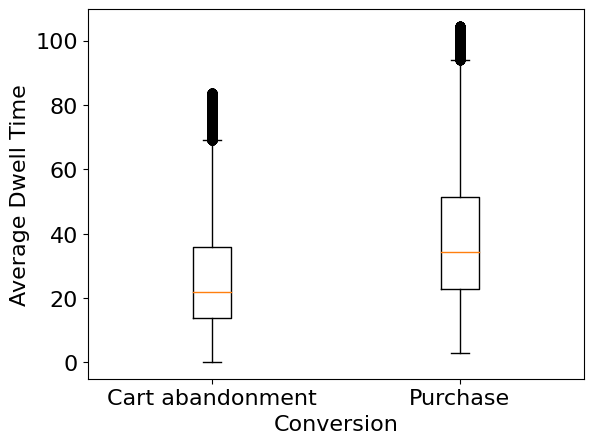

In [ ]:
# Obtain summary statistics for each conversion group
avg_dwell_time_stats = df_train.groupby('conversion')['avg_dwell_time'].describe()

# Extract specific statistics for each conversion
conversion_0_stats = avg_dwell_time_stats.loc[0]
conversion_1_stats = avg_dwell_time_stats.loc[1]

# Define lower and upper percentiles (e.g., 10th and 90th percentiles)
lower_percentile = 10
upper_percentile = 90

# Calculate lower and upper bounds for each conversion group
conversion_0_lower_bound = conversion_0_stats['25%'] - 1.5 * (conversion_0_stats['75%'] - conversion_0_stats['25%'])
conversion_0_upper_bound = conversion_0_stats['75%'] + 1.5 * (conversion_0_stats['75%'] - conversion_0_stats['25%'])
conversion_1_lower_bound = conversion_1_stats['25%'] - 1.5 * (conversion_1_stats['75%'] - conversion_1_stats['25%'])
conversion_1_upper_bound = conversion_1_stats['75%'] + 1.5 * (conversion_1_stats['75%'] - conversion_1_stats['25%'])

# Filter out data points outside of the bounds
filtered_conversion_0 = df_train[(df_train['conversion'] == 0) & (df_train['avg_dwell_time'] >= conversion_0_lower_bound) & (df_train['avg_dwell_time'] <= conversion_0_upper_bound)]
filtered_conversion_1 = df_train[(df_train['conversion'] == 1) & (df_train['avg_dwell_time'] >= conversion_1_lower_bound) & (df_train['avg_dwell_time'] <= conversion_1_upper_bound)]

# Create boxplot
plt.boxplot([filtered_conversion_0['avg_dwell_time'], filtered_conversion_1['avg_dwell_time']], labels=['Cart abandonment', 'Purchase'])
# plt.title('Boxplot of Average Dwell Time by Conversion')
plt.xlabel('Conversion',fontsize=16)
plt.ylabel('Average Dwell Time', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('avg_dwell_time.pdf', format='pdf')
plt.show()

In [ ]:
unique_products_viewed = df_train.groupby('conversion')['unique_products_viewed']
print(unique_products_viewed.describe())

               count      mean       std  min  25%  50%  75%   max
conversion                                                        
0.0         153788.0  4.534138  4.562628  1.0  2.0  3.0  6.0  61.0
1.0          45603.0  4.244041  4.399762  1.0  1.0  3.0  5.0  53.0


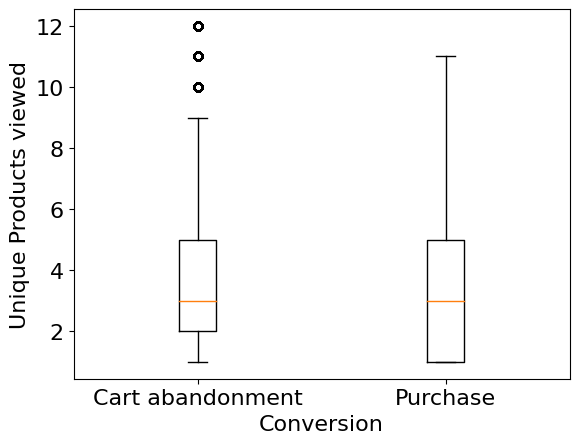

In [ ]:
# Obtain summary statistics for each conversion group
unique_products_viewed_stats = df_train.groupby('conversion')['unique_products_viewed'].describe()

# Extract specific statistics for each conversion
conversion_0_stats = unique_products_viewed_stats.loc[0]
conversion_1_stats = unique_products_viewed_stats.loc[1]

# Define lower and upper percentiles (e.g., 10th and 90th percentiles)
lower_percentile = 10
upper_percentile = 90

# Calculate lower and upper bounds for each conversion group
conversion_0_lower_bound = conversion_0_stats['25%'] - 1.5 * (conversion_0_stats['75%'] - conversion_0_stats['25%'])
conversion_0_upper_bound = conversion_0_stats['75%'] + 1.5 * (conversion_0_stats['75%'] - conversion_0_stats['25%'])
conversion_1_lower_bound = conversion_1_stats['25%'] - 1.5 * (conversion_1_stats['75%'] - conversion_1_stats['25%'])
conversion_1_upper_bound = conversion_1_stats['75%'] + 1.5 * (conversion_1_stats['75%'] - conversion_1_stats['25%'])

# Filter out data points outside of the bounds
filtered_conversion_0 = df_train[(df_train['conversion'] == 0) & (df_train['unique_products_viewed'] >= conversion_0_lower_bound) & (df_train['unique_products_viewed'] <= conversion_0_upper_bound)]
filtered_conversion_1 = df_train[(df_train['conversion'] == 1) & (df_train['unique_products_viewed'] >= conversion_1_lower_bound) & (df_train['unique_products_viewed'] <= conversion_1_upper_bound)]

# Create boxplot
plt.boxplot([filtered_conversion_0['unique_products_viewed'], filtered_conversion_1['unique_products_viewed']], labels=['Cart abandonment', 'Purchase'])
# plt.title("Boxplot of Unique Products viewed by Conversion")
plt.xlabel('Conversion', fontsize=16)
plt.ylabel('Unique Products viewed', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('products_viewed.pdf', format='pdf')
plt.show()


In [ ]:
week_day = df_train.groupby('conversion')['week_day'].value_counts()
print(week_day)

conversion  week_day
0.0         6           23108
            3           22530
            4           22507
            0           22162
            5           21941
            1           21896
            2           19644
1.0         0            6975
            1            6948
            4            6606
            6            6499
            2            6245
            5            6235
            3            6095
Name: count, dtype: int64


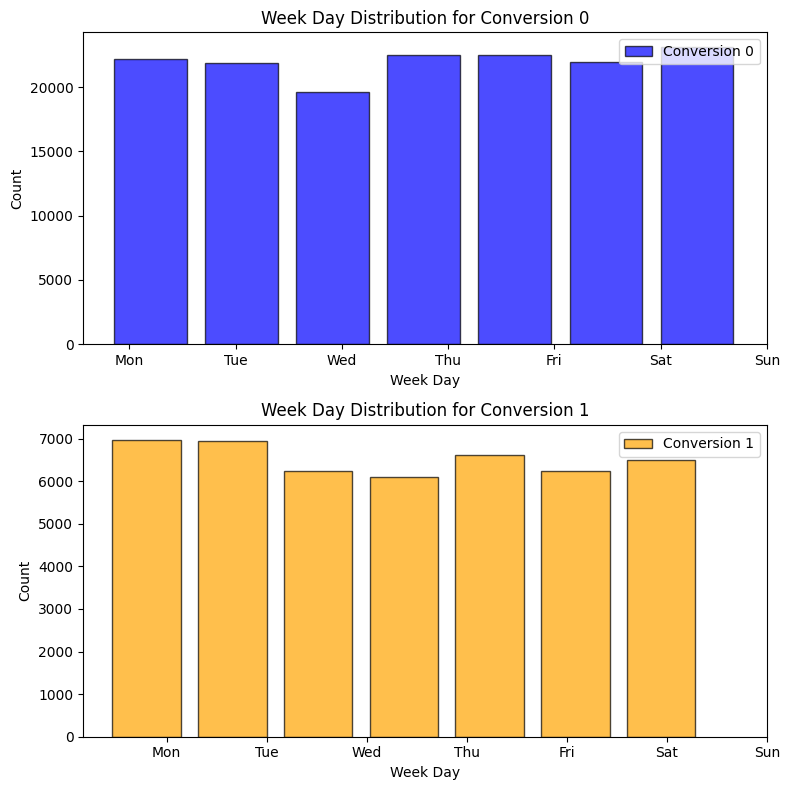

In [ ]:
# Separate data for conversion 0 and 1
conversion_0_data = df_train[df_train['conversion'] == 0]['week_day']
conversion_1_data = df_train[df_train['conversion'] == 1]['week_day']

# Plot histograms
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 8))

# Calculate the positions for each bar
positions_0 = np.arange(7) - 0.2
positions_1 = np.arange(7) + 0.2

# Plot histograms with manually centered bars
axes[0].hist(conversion_0_data, bins=7, color='blue', alpha=0.7, rwidth=0.8, edgecolor='black', align='left', label='Cart abandonment')
axes[0].set_xticks(positions_0)
axes[0].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
axes[0].set_title('Week Day Distribution for Conversion 0')
axes[0].set_xlabel('Week Day')
axes[0].set_ylabel('Count')
axes[0].legend()

axes[1].hist(conversion_1_data, bins=7, color='orange', alpha=0.7, rwidth=0.8, edgecolor='black', align='left', label='Purchase')
axes[1].set_xticks(positions_1)
axes[1].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
axes[1].set_title('Week Day Distribution for Conversion 1')
axes[1].set_xlabel('Week Day')
axes[1].set_ylabel('Count')
axes[1].legend()

plt.tight_layout()
plt.show()

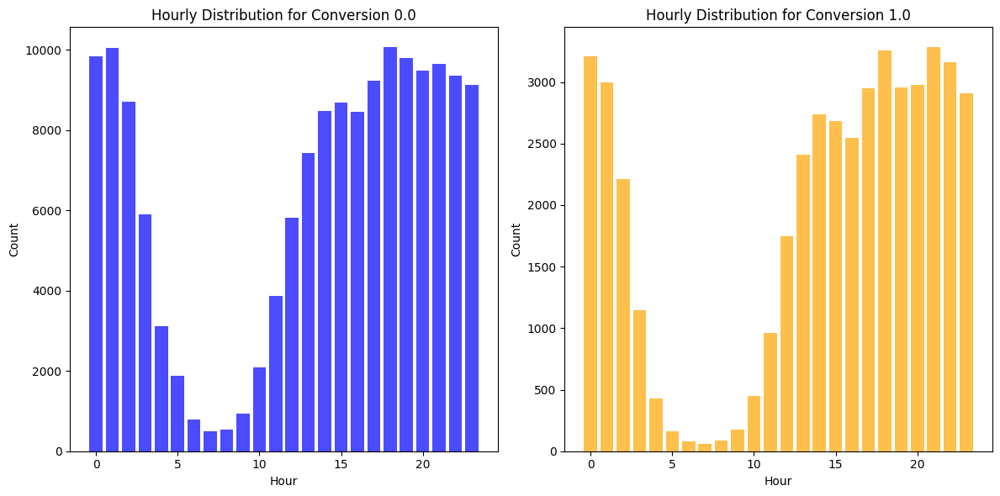

In [ ]:
hour_data = df_train.groupby('conversion')['hour'].value_counts()
# Extract data for conversion 0.0 and 1.0
conversion_0_data = {key[1]: value for key, value in hour_data.items() if key[0] == 0.0}
conversion_1_data = {key[1]: value for key, value in hour_data.items() if key[0] == 1.0}

# Plot histograms
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.bar(conversion_0_data.keys(), conversion_0_data.values(), color='blue', alpha=0.7)
plt.title('Hourly Distribution for Cart Abandonment')
plt.xlabel('Hour')
plt.ylabel('Count')

plt.subplot(1, 2, 2)
plt.bar(conversion_1_data.keys(), conversion_1_data.values(), color='orange', alpha=0.7)
plt.title('Hourly Distribution for Purchase')
plt.xlabel('Hour')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

## Heatmaps Transition Sequences

In [ ]:
def filter_actions_before_purchase(group, target):
    purchase_indices = group.index[group['product_action'].eq(target)]
    if not purchase_indices.empty:
        first_purchase_index = purchase_indices.min()
        return group.loc[:first_purchase_index - 1]
    else:
        return group

target_action = 'purchase'
df_train = df_train.groupby('session_id_hash', group_keys=False).apply(
    filter_actions_before_purchase, target_action).reset_index()

Exception ignored in: <function _xla_gc_callback at 0x79853b8a0430>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 98, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


KeyboardInterrupt: 

In [ ]:
df_train = df_train.groupby('session_id_hash').agg({'product_action_symb': list, 'nevents': 'first', 'week_day': 'first', 'weekend': 'first', 'hour': 'first', 'session_duration': 'first', 'conversion': 'first', 'unique_products_viewed': 'first', 'avg_dwell_time': 'first'}).reset_index()
df_train = df_train.rename(columns={'product_action_symb': 'session'})
df_train.head()

In [ ]:
df_train.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed_trimmed.csv", index = False)

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed_trimmed.csv")

In [ ]:
symbolised_sessions = df_train["session"]
labels = df_train["conversion"]

buy_sessions, ca_sessions = [], []
for session, label in zip(symbolised_sessions, labels):
    if label == 1:
        buy_sessions.append(session)
    else:
        ca_sessions.append(session)

buy_sessions = [[int(num) for num in item.strip("[]").split(', ')] for item in buy_sessions]
ca_sessions = [[int(num) for num in item.strip("[]").split(', ')] for item in ca_sessions]

In [ ]:
# proportion of events in the two classes
events_buy = Counter([event for session in buy_sessions for event in session])
events_ca = Counter([event for session in ca_sessions for event in session])

def normalise(d):
    tot = sum(d.values())
    return {event: count/tot for event, count in d.items()}

events_buy = normalise(events_buy)
events_ca = normalise(events_ca)

for event, prop in events_buy.items():
    print('{}: {}'.format(event, prop - events_ca [event]))

1: 0.016508049351535603
2: -0.05873085629542735
3: -0.002387014126106972
4: 0.044609821069998765


In [ ]:
# bigram transitions in the two classes

def get_transitions(sessions):
    n_events = len(set(item for session in sessions for item in session))
    transitions = np.zeros((n_events, n_events))
    for session in sessions:
        for i, event in enumerate(session):
            try:
                transitions[event-1, session[i+1]-1] += 1
            except IndexError:
                pass

    row_sums = transitions.sum(axis=1)

    return transitions / row_sums[:, np.newaxis]

transitions_buy = get_transitions(buy_sessions)
transitions_ca = get_transitions(ca_sessions)

In [ ]:
transitions_buy[:7]

array([[0.67279063, 0.23537825, 0.04341376, 0.04841736],
       [0.77443372, 0.10652207, 0.10826887, 0.01077534],
       [0.80804898, 0.04214676, 0.04488158, 0.10492268],
       [0.42462335, 0.00109104, 0.0355015 , 0.53878411]])

In [ ]:
transitions_ca[:7]

array([[0.6143655 , 0.31501073, 0.04391765, 0.02670611],
       [0.79190228, 0.10816802, 0.09158685, 0.00834285],
       [0.76599459, 0.09767202, 0.04904338, 0.08729001],
       [0.54288602, 0.00183646, 0.09597167, 0.35930584]])

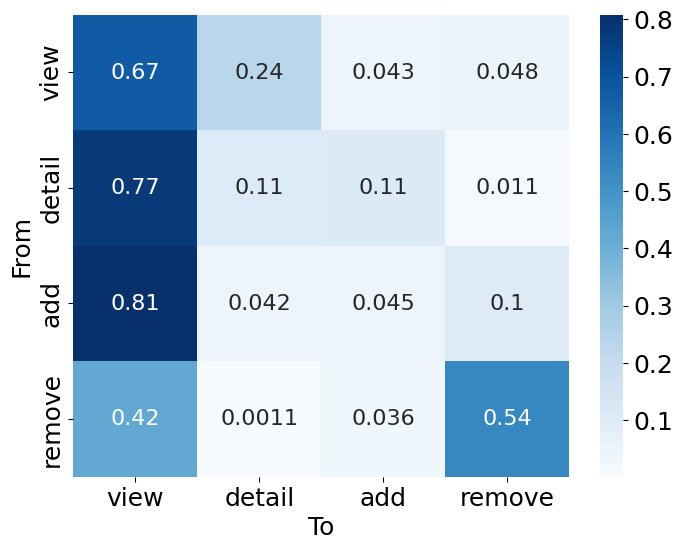

In [ ]:
# Define the actions for labeling
actions = ["view", "detail", "add", "remove"]

# Create a figure object for more control over the save functionality
plt.figure(figsize=(8, 6))
ax = sns.heatmap(transitions_buy, cmap='Blues', xticklabels=actions, yticklabels=actions, annot=True, annot_kws={"size": 16})  # Increase annotation text size

# Set title and labels with increased font sizes
# ax.set_title('Transition Probabilities Buying', fontsize=18)  # Increase title font size
plt.xlabel('To', fontsize=18)  # Increase x-axis label font size
plt.ylabel('From', fontsize=18)  # Increase y-axis label font size

# Increase tick labels font size
ax.tick_params(axis='both', which='major', labelsize=18)

# Increase color bar size and font size
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)  # Increase color bar tick labels font size

# Save the figure to a PDF file
plt.savefig('heatmap_buying_sessions.pdf', format='pdf')

# Display the plot
plt.show()

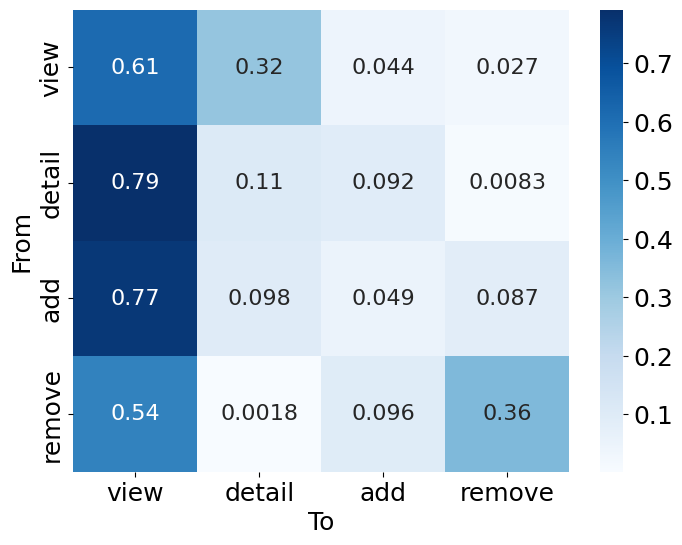

In [ ]:
# Define the actions for labeling
actions = ["view", "detail", "add", "remove"]

# Create a figure object for more control over the save functionality
plt.figure(figsize=(8, 6))
ax = sns.heatmap(transitions_ca, cmap='Blues', xticklabels=actions, yticklabels=actions, annot=True, annot_kws={"size": 16})  # Increase annotation text size

# Set title and labels with increased font sizes
# ax.set_title('Transition Probabilities Cart Abandonment', fontsize=18)  # Increase title font size
plt.xlabel('To', fontsize=18)  # Increase x-axis label font size
plt.ylabel('From', fontsize=18)  # Increase y-axis label font size

# Increase tick labels font size
ax.tick_params(axis='both', which='major', labelsize=18)

# Increase color bar size and font size
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)  # Increase color bar tick labels font size

# Save the figure to a PDF file
plt.savefig('heatmap_ca_sessions.pdf', format='pdf')

# Display the plot
plt.show()

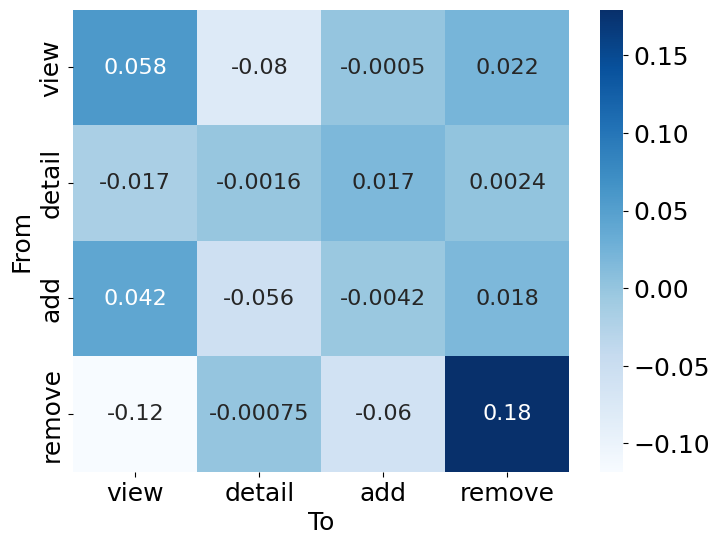

In [ ]:
# Define the actions for labeling
actions = ["view", "detail", "add", "remove"]

# Create a figure object for more control over the save functionality
plt.figure(figsize=(8, 6))
ax = sns.heatmap(transitions_buy - transitions_ca, cmap='Blues', xticklabels=actions, yticklabels=actions, annot=True, annot_kws={"size": 16})  # Increase annotation text size

# Set title and labels with increased font sizes
# ax.set_title('Transition Probabilities (Buy - Cart Abandonment)', fontsize=17)  # Increase title font size
plt.xlabel('To', fontsize=18)  # Increase x-axis label font size
plt.ylabel('From', fontsize=18)  # Increase y-axis label font size

# Increase tick labels font size
ax.tick_params(axis='both', which='major', labelsize=18)

# Increase color bar size and font size
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)  # Increase color bar tick labels font size

# Save the figure to a PDF file
plt.savefig('heatmap_buy_ca_sessions.pdf', format='pdf')

# Display the plot
plt.show()

## Profile Matrices

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed_trimmed.csv")

In [ ]:
df_train = df_train[["session_id_hash", "session", "conversion"]]

In [ ]:
df_train.head()

,session_id_hash,session,conversion
0,00000114e1075962f022114fcfc17f2d874e694ac5d201...,"[1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, ...",0.0
1,000010504025397b03290c7457e0e7ef7ae93529f21eae...,"[2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, ...",0.0
2,0000913afa22ba9c31efb992bcf6388b0bbfe28056bef3...,"[1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, ...",0.0
3,00010d84aca1294479304044207fd268f63228844779c6...,"[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, ...",0.0
4,0001368d732951035a7ef7ef42b345a5c50b7d66966749...,"[1, 2, 3, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1]",0.0


In [ ]:
symbolised_sessions = df_train["session"]
labels = df_train["conversion"]

buy_sessions, ca_sessions = [], []
for session, label in zip(symbolised_sessions, labels):
    if label == 1:
        buy_sessions.append(session)
    else:
        ca_sessions.append(session)

In [ ]:
buy_sessions[:10]

['[1, 1, 1, 1, 2, 3, 4, 1, 2, 1, 1, 1, 4, 4, 4, 1, 1, 4, 1, 4, 1, 4, 4, 4, 4, 4, 4, 4, 1]',
 '[1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 4, 1, 4, 3, 4, 1, 4, 1, 4, 4, 4, 1, 1, 4, 1, 1, 1, 1, 4, 1, 4, 1, 4, 4, 4, 4, 4, 4, 4, 4]',
 '[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 3, 1, 1, 2, 3, 1, 1, 4, 1, 1, 1, 1, 1, 1]',
 '[1, 2, 1, 2, 3, 1, 1, 2, 1, 1, 1]',
 '[1, 1, 1, 1, 2, 1, 3, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1]',
 '[1, 1, 2, 1, 3, 1, 2, 1, 1, 4, 1, 1, 1, 2, 3, 1, 1]',
 '[2, 1, 3, 1, 1, 1, 2, 1, 3, 1, 1, 1, 1]',
 '[1, 2, 3, 1, 1, 1]',
 '[1, 1, 1, 3, 1, 1, 1]',
 '[2, 1, 3, 1]']

In [ ]:
# Given input sequences
sequences = ca_sessions

max_length = 30

# Convert strings to lists of integers
sequences = [[int(x) for x in seq.strip('[]').split(', ')] for seq in sequences]
sequences = pad_sequences(sequences, maxlen= max_length, padding='post', truncating='post')

# Define mapping from numerical representation to labels
mapping = {0:"padding", 1: "view", 2: "detail", 3: "add", 4: "remove"}

# Initialize the profile matrix
profile_matrix_ca = np.zeros((5, max_length), dtype=float)  # 4 rows for "view", "detail", "add", "remove"

# Populate the profile matrix
for i in range(max_length):
    count_per_position = {0:0, 1: 0, 2: 0, 3: 0, 4: 0}
    for seq in sequences:
        if i < len(seq):  # Check if index is within the sequence length
            num = seq[i]  # numerical representation
            if num in mapping:
                count_per_position[num] += 1

    # Normalize counts at each position
    total_count = sum(count_per_position.values())
    for num, count in count_per_position.items():
        if total_count > 0:
            profile_matrix_ca[list(mapping.keys()).index(num), i] = count / total_count

print("Profile Matrix:")
print(profile_matrix_ca)


Profile Matrix:
[[0.         0.         0.         0.         0.         0.04491898
  0.08867402 0.13169428 0.17234765 0.21194762 0.24799074 0.28452805
  0.31759955 0.35059953 0.38027024 0.40999948 0.43727079 0.46372929
  0.48827607 0.51228314 0.53400135 0.55467267 0.57414753 0.59340131
  0.61141962 0.62792936 0.64374333 0.65956382 0.67374568 0.68754389]
 [0.77525555 0.72553125 0.64012147 0.6785835  0.63463339 0.62345567
  0.57922595 0.57012901 0.53396884 0.51551486 0.49248316 0.47060239
  0.44879965 0.43287513 0.40874451 0.39213073 0.37120582 0.35790179
  0.33922673 0.32542851 0.30934143 0.29702578 0.28532785 0.2719653
  0.26061851 0.25064374 0.23793144 0.22739746 0.21843057 0.20896299]
 [0.21934741 0.26493615 0.20118605 0.24202799 0.22979036 0.23875075
  0.21950347 0.2126889  0.20108851 0.19539236 0.17949385 0.17615809
  0.16504539 0.15600047 0.15081801 0.14406196 0.13786511 0.12972404
  0.12493823 0.11795459 0.11330533 0.10853903 0.10205608 0.09929253
  0.09299815 0.08922023 0.08611

In [ ]:
print((profile_matrix_ca[0][25]+ profile_matrix_ca[1][25] + profile_matrix_ca[2][25] + profile_matrix_ca[3][25] + profile_matrix_ca[4][25]))

1.0


In [ ]:
# Given input sequences
sequences = buy_sessions

max_length = 30

# Convert strings to lists of integers
sequences = [[int(x) for x in seq.strip('[]').split(', ')] for seq in sequences]
sequences = pad_sequences(sequences, maxlen= max_length, padding='post', truncating='post')

# Define mapping from numerical representation to labels
mapping = {0:"padding", 1: "view", 2: "detail", 3: "add", 4: "remove"}


# Initialize the profile matrix
profile_matrix_buy = np.zeros((5, max_length), dtype=float)  # 4 rows for "view", "detail", "add", "remove"

# Populate the profile matrix
for i in range(max_length):
    count_per_position = {0:0, 1: 0, 2: 0, 3: 0, 4: 0}
    for seq in sequences:
        if i < len(seq):  # Check if index is within the sequence length
            num = seq[i]  # numerical representation
            if num in mapping:
                count_per_position[num] += 1

    # Normalize counts at each position
    total_count = sum(count_per_position.values())
    for num, count in count_per_position.items():
        if total_count > 0:
            profile_matrix_buy[list(mapping.keys()).index(num), i] = count / total_count

print("Profile Matrix:")
print(profile_matrix_buy)

Profile Matrix:
[[0.00000000e+00 3.07158999e-04 6.80137783e-04 2.10623313e-03
  1.55773492e-02 4.16200443e-02 7.06904495e-02 1.01186950e-01
  1.33394765e-01 1.65514820e-01 1.97700695e-01 2.30413129e-01
  2.60690230e-01 2.93117444e-01 3.23613945e-01 3.53912986e-01
  3.82149674e-01 4.08806687e-01 4.35046842e-01 4.59817021e-01
  4.83797363e-01 5.05144913e-01 5.25636806e-01 5.46128700e-01
  5.64536300e-01 5.83009719e-01 5.99662125e-01 6.16358411e-01
  6.32001580e-01 6.46043134e-01]
 [8.16143399e-01 7.66076483e-01 6.99576559e-01 7.19388315e-01
  6.78755567e-01 6.63485377e-01 6.36740604e-01 6.21623994e-01
  5.97248733e-01 5.76712960e-01 5.48937010e-01 5.32438184e-01
  5.09269620e-01 4.87527151e-01 4.61681915e-01 4.44766230e-01
  4.21970644e-01 4.04111543e-01 3.84848285e-01 3.66287106e-01
  3.50073499e-01 3.33113934e-01 3.20169376e-01 3.05952303e-01
  2.93775642e-01 2.81598982e-01 2.69159043e-01 2.57179842e-01
  2.44652142e-01 2.34011277e-01]
 [1.74576011e-01 2.19311525e-01 1.58318524e-01 1.9

In [ ]:
print((profile_matrix_buy[0][25]+ profile_matrix_buy[1][25] + profile_matrix_buy[2][25] + profile_matrix_buy[3][25] + profile_matrix_buy[4][25]))

1.0


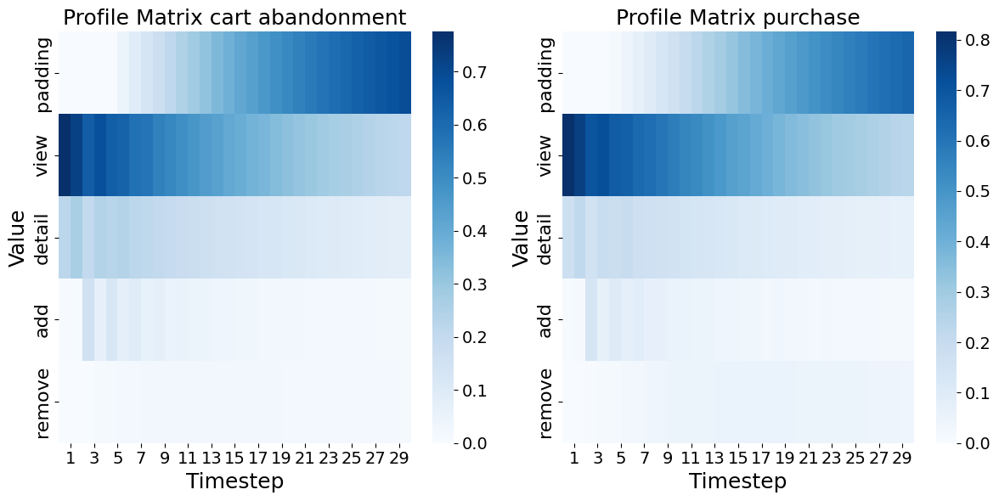

In [ ]:
# Plotting heatmaps
plt.figure(figsize=(12, 6))

yticklabels = ["padding", "view", "detail", "add", "remove"]

# Plot heatmap for profile matrix 1
plt.subplot(1, 2, 1)
ax1 = sns.heatmap(profile_matrix_ca, cmap='Blues', fmt=".2f", cbar=True, yticklabels=yticklabels)
# plt.title('Profile Matrix cart abandonment', fontsize=18)
plt.xlabel('Timestep', fontsize=18)
plt.ylabel('Value', fontsize=18)
ticks = np.arange(1, 31, 2)
plt.xticks(ticks, ticks, fontsize=14)
plt.yticks(fontsize=16)
cbar = ax1.collections[0].colorbar
cbar.ax.tick_params(labelsize=14)  # Increase color bar tick labels font size

# Plot heatmap for profile matrix 2
plt.subplot(1, 2, 2)
ax2 = sns.heatmap(profile_matrix_buy, cmap='Blues', fmt=".2f", cbar=True, yticklabels=yticklabels)
# plt.title('Profile Matrix purchase', fontsize=18)
plt.xlabel('Timestep', fontsize=18)
plt.ylabel('Value', fontsize=18)
ticks = np.arange(1, 31, 2)
plt.xticks(ticks, ticks, fontsize=14)
plt.yticks(fontsize=16)
cbar = ax2.collections[0].colorbar
cbar.ax.tick_params(labelsize=14)  # Increase color bar tick labels font size

plt.tight_layout()

plt.savefig('heatmap_plots.pdf', format='pdf', bbox_inches='tight')
plt.show()

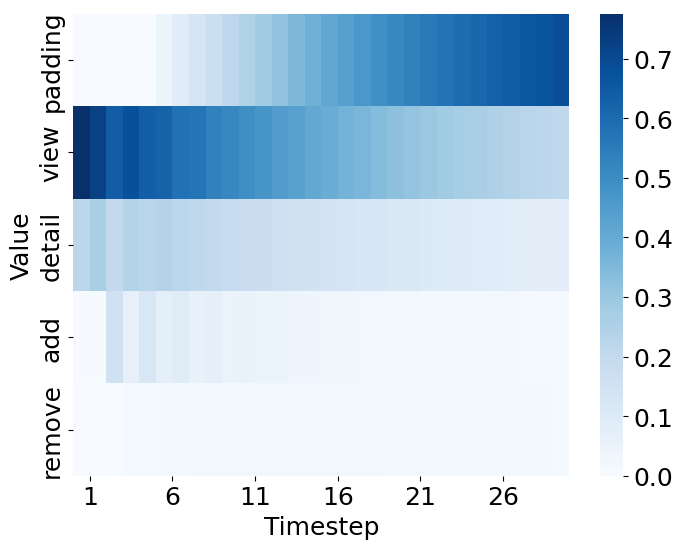

In [ ]:
# Plotting heatmaps
plt.figure(figsize=(8, 6))

yticklabels = ["padding", "view", "detail", "add", "remove"]

# Plot heatmap for profile matrix 1
ax1 = sns.heatmap(profile_matrix_ca, cmap='Blues', fmt=".2f", cbar=True, yticklabels=yticklabels)
# plt.title('Profile Matrix cart abandonment', fontsize=18)
plt.xlabel('Timestep', fontsize=18)
plt.ylabel('Value', fontsize=18)
ticks = np.arange(1, 31, 5)
plt.xticks(ticks, ticks, fontsize=18, rotation = 0)
plt.yticks(fontsize=18)
cbar = ax1.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)
plt.savefig('heatmap_cart_abandonment.pdf', format='pdf', bbox_inches='tight') # Increase color bar tick labels font size

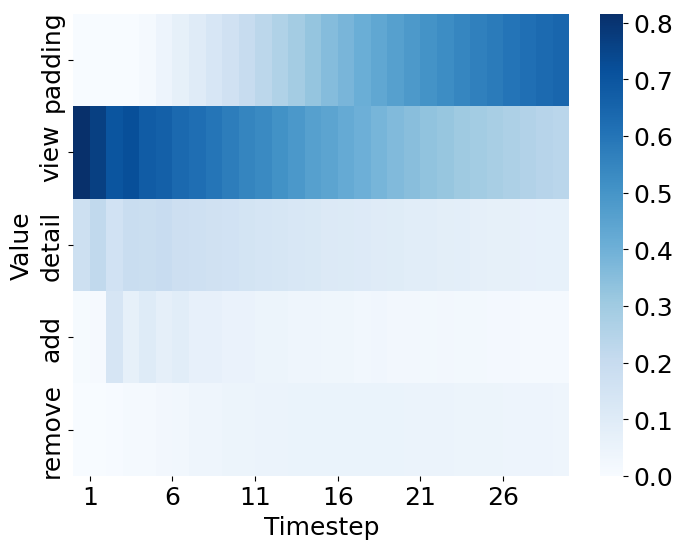

In [ ]:
# Plotting heatmaps
plt.figure(figsize=(8, 6))

yticklabels = ["padding", "view", "detail", "add", "remove"]

# Plot heatmap for profile matrix 1
ax1 = sns.heatmap(profile_matrix_buy, cmap='Blues', fmt=".2f", cbar=True, yticklabels=yticklabels)
plt.xlabel('Timestep', fontsize=18)
plt.ylabel('Value', fontsize=18)
ticks = np.arange(1, 31, 5)
plt.xticks(ticks, ticks, fontsize=18, rotation = 0)
plt.yticks(fontsize=18)
cbar = ax1.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)
plt.savefig('heatmap_purchase.pdf', format='pdf', bbox_inches='tight') # Increase color bar tick labels font size

In [ ]:
profile_matrix_ca1 = profile_matrix_ca[:, :30]
profile_matrix = profile_matrix_buy - profile_matrix_ca1

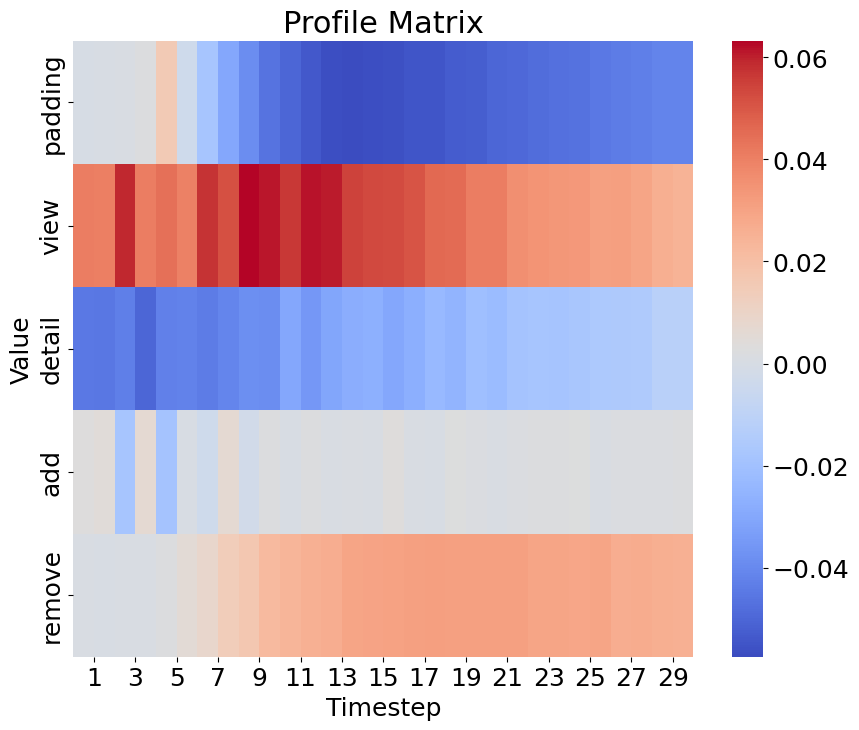

In [ ]:
# Plotting the heatmap
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
ax = sns.heatmap(profile_matrix, cmap='coolwarm', fmt=".2f", cbar=True, yticklabels=yticklabels)

# Set title and labels with increased font sizes
plt.title('Profile Matrix', fontsize=22)
plt.xlabel('Timestep', fontsize=18)
plt.ylabel('Value', fontsize=18)

# Set custom x-ticks to display every second timestep starting from 1 to 30
ticks = np.arange(1, 31, 2)
plt.xticks(ticks, ticks, fontsize=18)
plt.yticks(fontsize=18)

# Increase the font size of the color bar tick labels
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)  # Increase color bar tick labels font size

# Save the plot to a PDF file
plt.savefig('heatmap_plots_conc.pdf', format='pdf', bbox_inches='tight')

# Show the plot
plt.show()

## t-SNE

In [ ]:
# Convert strings to lists of integers
max_length = 30
symbolised_sessions = [[int(x) for x in seq.strip('[]').split(', ')] for seq in symbolised_sessions]
symbolised_sessions = pad_sequences(symbolised_sessions, maxlen= max_length, padding='post', truncating='post')

In [ ]:
# Get the total number of instances
total_instances = len(symbolised_sessions)
sample_size = 10000

# Generate random indices for sampling
random_indices = np.random.choice(total_instances, sample_size, replace=False)

# Sample sessions and labels using the random indices
sampled_sessions = symbolised_sessions[random_indices]
sampled_labels = labels[random_indices]

In [ ]:
tsne = TSNE(perplexity=30, learning_rate=200)

# Fit and transform the data to reduce dimensionality
X_embedded = tsne.fit_transform(sampled_sessions)

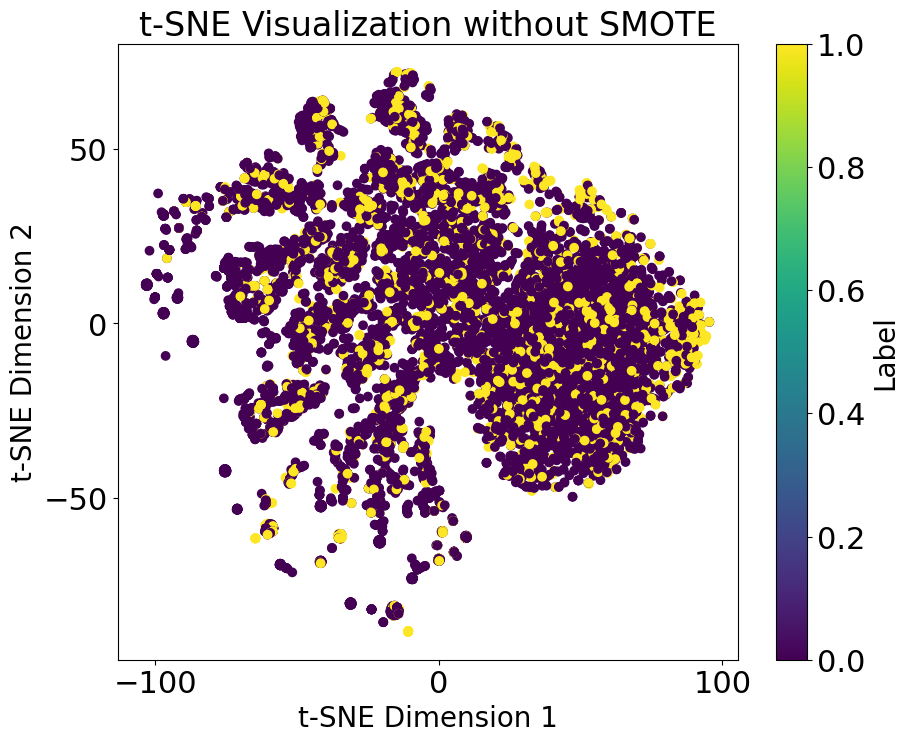

In [ ]:
# Plot the embedded data
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_embedded[:, 0], X_embedded[:, 1], marker='o', c=sampled_labels)
plt.title('t-SNE Visualization without SMOTE', fontsize=24)  # Increase title font size
plt.xlabel('t-SNE Dimension 1', fontsize=20)  # Increase x-axis label font size
plt.ylabel('t-SNE Dimension 2', fontsize=20)  # Increase y-axis label font size
plt.xticks(fontsize=22)  # Increase x-axis tick font size
plt.yticks(fontsize=22)  # Increase y-axis tick font size

# Create a colorbar with increased font size
cbar = plt.colorbar(scatter)
cbar.set_label('Label', fontsize=20)  # Set colorbar label font size
cbar.ax.tick_params(labelsize=22)  # Set colorbar tick label font size

# Save the plot to a PDF file
plt.savefig('t_SNE_without_SMOTE.pdf', format='pdf')
plt.show()

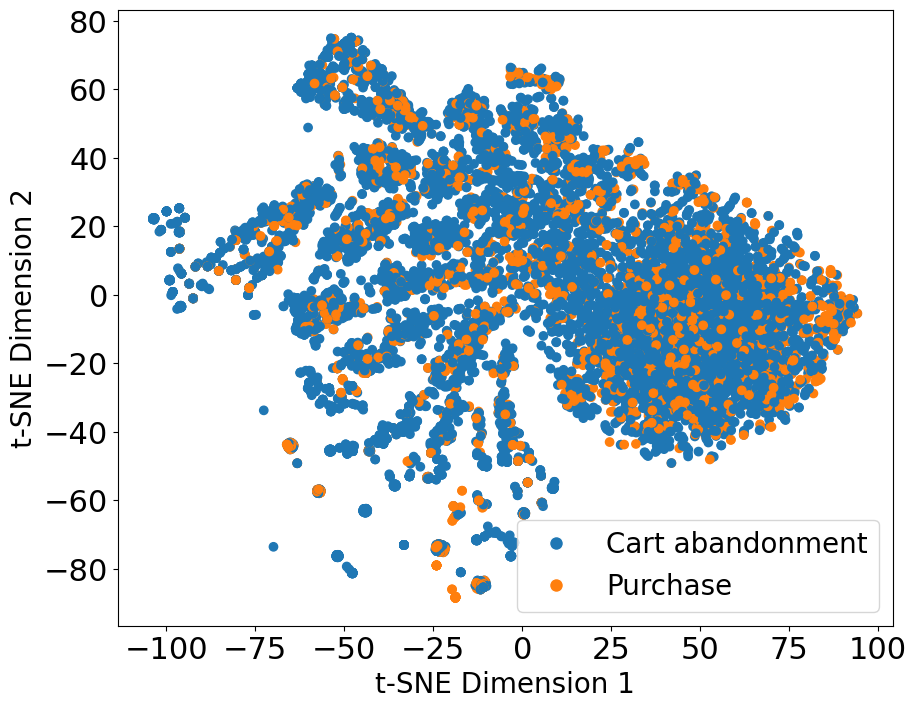

In [ ]:
# Plot the embedded data
plt.figure(figsize=(10, 8))

# Define colors for the scatter plot
colors = ['tab:blue' if label == 0 else 'tab:orange' for label in sampled_labels]

scatter = plt.scatter(X_embedded[:, 0], X_embedded[:, 1], marker='o', c=colors)
# plt.title('t-SNE Visualization without SMOTE', fontsize=24)  # Increase title font size
plt.xlabel('t-SNE Dimension 1', fontsize=20)  # Increase x-axis label font size
plt.ylabel('t-SNE Dimension 2', fontsize=20)  # Increase y-axis label font size
plt.xticks(fontsize=22)  # Increase x-axis tick font size
plt.yticks(fontsize=22)  # Increase y-axis tick font size

# Create legend
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:blue', markersize=10, label='Cart abandonment'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:orange', markersize=10, label='Purchase')
], fontsize=20)

# Save the plot to a PDF file
plt.savefig('t_SNE_without_SMOTE.pdf', format='pdf')
plt.show()

## Clickstream trajectory

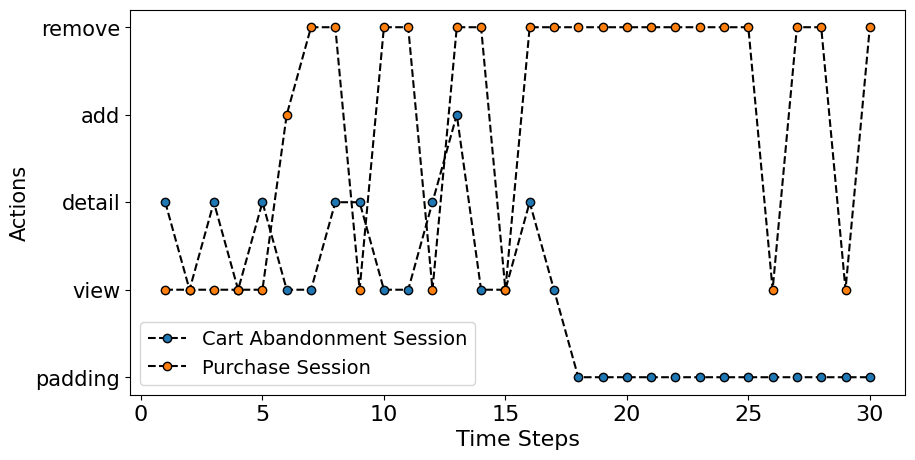

In [ ]:
cart_abandonment = [2, 1, 2, 1, 2, 1, 1, 2, 2, 1, 1, 2, 3, 1, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
purchase_sessions = [1, 1, 1, 1, 1, 3, 4, 4, 1, 4, 4, 1, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 4, 4, 1, 4]

# Create custom x-axis values starting from 1 to 30
time_steps = list(range(1, 31))  # Generate a list from 1 to 30

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10, 5))

# Plotting both sequences with the new time_steps array using tab10 colors
tab10 = plt.get_cmap('tab10')
ax.plot(time_steps, cart_abandonment, marker='o', linestyle='dashed', label='Cart Abandonment Session', color='black', markerfacecolor=tab10(0), markeredgecolor='black')
ax.plot(time_steps, purchase_sessions, marker='o', linestyle='dashed', label='Purchase Session', color='black', markerfacecolor=tab10(1), markeredgecolor='black')

# Adding title and labels with increased font size
# ax.set_title('Clickstream Trajectory', fontsize=22)  # Increase title font size
ax.set_xlabel('Time Steps', fontsize=16)  # Increase x-axis label font size
ax.set_ylabel('Actions', fontsize=15)  # Increase y-axis label font size

# Setting custom y-axis labels with increased tick font size
y_ticks = [0, 1, 2, 3, 4]
y_labels = ['padding', 'view', 'detail', 'add', 'remove']
ax.set_yticks(y_ticks)
ax.set_yticklabels(y_labels, fontsize=15)  # Increase y-axis tick labels font size

# Increasing x-axis tick labels font size
ax.tick_params(axis='x', labelsize=16)

# Removing grid for enhanced clarity
ax.grid(False)

# Adding a legend with increased font size
ax.legend(fontsize=14)

# Show the plot
plt.show()

# Optionally, save the plot to a PDF file
fig.savefig('clickstream_trajectory.pdf')

## Distribution Events

In [ ]:
sequences_train = X['session'].tolist()
sequences_train = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train]
# Pad sequences to a fixed length
max_length = 30  # Choose the maximum length you want
padded_sequences_train = pad_sequences(sequences_train, maxlen= max_length, padding='post', truncating='post')
# Convert padded sequences to NumPy array
sequences_train = np.array(padded_sequences_train)

In [ ]:
symbolised_sessions = sequences_train
labels = y

buy_sessions, ca_sessions = [], []
for session, label in zip(symbolised_sessions, labels):
    if label == 1:
        buy_sessions.append(session)
    else:
        ca_sessions.append(session)

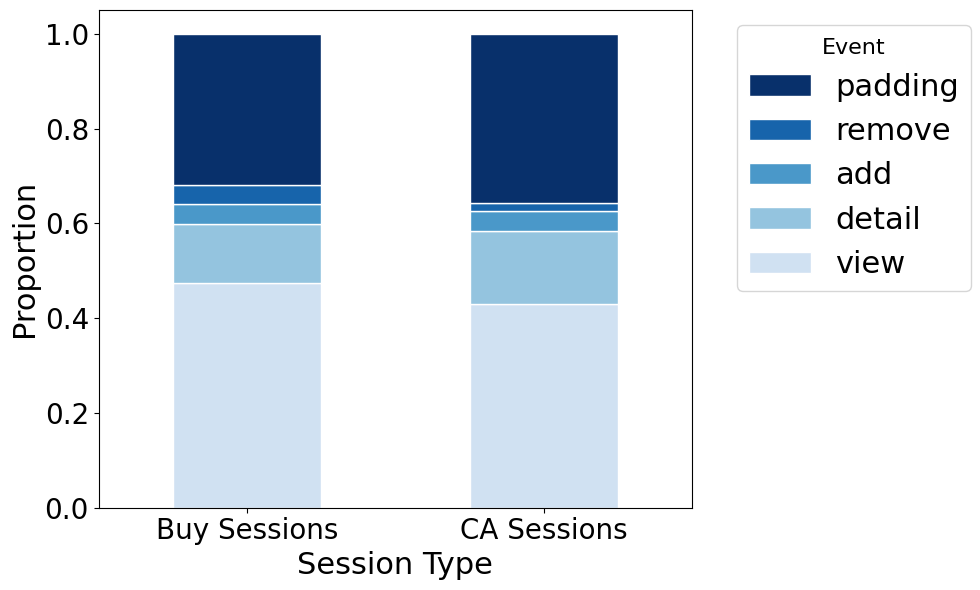

In [ ]:
# Define the actions for labeling
event_dict = {0: 'padding', 1: 'view', 2: 'detail', 3: 'add', 4: 'remove'}

# Properly flatten all session arrays into one single array
buy_flattened = np.concatenate(buy_sessions)  # Flatten all buy_sessions into one array
ca_flattened = np.concatenate(ca_sessions)    # Flatten all ca_sessions into one array

# Convert numerical events to string labels
buy_labels = np.vectorize(event_dict.get)(buy_flattened)
ca_labels = np.vectorize(event_dict.get)(ca_flattened)

# Create DataFrames for the mosaic plot
df_buy = pd.DataFrame({'Event': buy_labels, 'Session Type': ['Buy Sessions'] * len(buy_labels)})
df_ca = pd.DataFrame({'Event': ca_labels, 'Session Type': ['CA Sessions'] * len(ca_labels)})
df = pd.concat([df_buy, df_ca])

# Calculate the proportion of each event type within each session type
session_event_counts = df.groupby(['Session Type', 'Event']).size().unstack(fill_value=0)
session_event_proportions = session_event_counts.div(session_event_counts.sum(axis=1), axis=0)

# Define color scheme using the "Blues" palette
blues_palette = plt.get_cmap('Blues')
color_scheme = {
    'view': blues_palette(0.2),      # light blue
    'detail': blues_palette(0.4),    # blue
    'add': blues_palette(0.6),       # medium blue
    'remove': blues_palette(0.8),    # darker blue
    'padding': blues_palette(1.0),   # darkest blue
}

# Ensure the columns are ordered as per the desired legend order
order = ['view', 'detail', 'add', 'remove', 'padding']
session_event_proportions = session_event_proportions[order]

# Plot the stacked bar chart
fig, ax = plt.subplots(figsize=(10, 6))

bars = session_event_proportions.plot(kind='bar', stacked=True, ax=ax, color=[color_scheme[event] for event in order], edgecolor='white')

# Increase font sizes
# ax.set_title('Event Distribution in Sessions', fontsize=22)
ax.set_xlabel('Session Type', fontsize=22)
ax.set_ylabel('Proportion', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=20)

# Create custom legend with increased font size
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], title='Event', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=22, title_fontsize=16)

plt.xticks(rotation=0)
plt.tight_layout()

# Save the plot to a PDF file
plt.savefig('event_distribution_sessions.pdf', format='pdf')

plt.show()

# Models without adressing class imbalance

Train - Test Split

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed_trimmed.csv")

In [ ]:
df_train.head()

,session_id_hash,session,nevents,week_day,weekend,hour,session_duration,conversion,unique_products_viewed,avg_dwell_time
0,00000114e1075962f022114fcfc17f2d874e694ac5d201...,"[1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, ...",18,1,False,20,3479.0,0.0,3,193.277778
1,000010504025397b03290c7457e0e7ef7ae93529f21eae...,"[2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, ...",81,3,False,12,2024.0,0.0,10,24.987654
2,0000913afa22ba9c31efb992bcf6388b0bbfe28056bef3...,"[1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, ...",139,4,False,14,3647.0,0.0,23,26.237410
3,00010d84aca1294479304044207fd268f63228844779c6...,"[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, ...",41,6,True,18,2612.0,0.0,3,63.707317
4,0001368d732951035a7ef7ef42b345a5c50b7d66966749...,"[1, 2, 3, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1]",16,3,False,3,265.0,0.0,1,16.562500


In [ ]:
X = df_train[["session_id_hash", "session"]]  # Features
y = df_train["conversion"]  # Target variable

# Splitting the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Markov Chain

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed.csv")

In [ ]:
df_train.head()

,session_id_hash,event_type,product_action,product_sku_hash,server_timestamp_epoch_ms,hashed_url,addcart,convert,nevents,product_action_symb,conversion,date,week_day,weekend,month,hour,session_duration,unique_products_viewed,avg_dwell_time
0,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,293231f99098fc9552a19111d8ed7b6188bf0721b1a501...,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True,True,13,2,1.0,2019-03-02 16:51:43.415,5,True,3,16,1107.0,2,85.153846
1,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545503415,4e8321996f16f2734a5af4b4c780b4c4669fb316cf24ad...,True,True,13,1,1.0,2019-03-02 16:51:43.415,5,True,3,16,1107.0,2,85.153846
2,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545510494,744ac6435f90719fdec0276541a5c481138cc1f2f51106...,True,True,13,1,1.0,2019-03-02 16:51:50.494,5,True,3,16,1107.0,2,85.153846
3,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,pageview,view,NaN,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True,True,13,1,1.0,2019-03-02 16:51:54.312,5,True,3,16,1107.0,2,85.153846
4,8256e7aaf7ade5e68787f3118077de97ae8eec18f47f97...,event_product,detail,36e8246f800db10613eef89c81513df909ec8171a875f0...,1551545514312,15c3f072fa3c3caa710d9cc114fa017f37deb117ec158c...,True,True,13,2,1.0,2019-03-02 16:51:54.312,5,True,3,16,1107.0,2,85.153846


In [ ]:
df_train = df_train.groupby('session_id_hash').agg({'product_action_symb': list, 'conversion': 'first'}).reset_index()

In [ ]:
df_train = df_train.rename(columns={'product_action_symb': 'session'})
df_train.head(10)

,session_id_hash,session,conversion
0,00000114e1075962f022114fcfc17f2d874e694ac5d201...,"[1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, ...",0.0
1,000010504025397b03290c7457e0e7ef7ae93529f21eae...,"[2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, ...",0.0
2,0000913afa22ba9c31efb992bcf6388b0bbfe28056bef3...,"[1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, ...",0.0
3,00010d84aca1294479304044207fd268f63228844779c6...,"[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, ...",0.0
4,0001368d732951035a7ef7ef42b345a5c50b7d66966749...,"[1, 2, 3, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1]",0.0
5,0001c180fb742f96ff388ba8f67a568e6fa66aed30d0d2...,"[1, 1, 1, 1, 2, 3, 4, 1, 2, 1, 1, 1, 4, 4, 4, ...",1.0
6,00024a2cbef8be2015bf16d355226c4b4d60b4e5216dea...,"[1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",0.0
7,0002629c632e1d3211649ba4498194a13a280c35c6bd57...,"[1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 4, ...",1.0
8,00029b95dceb71ae63445fb5fdc844104aabd047793277...,"[1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, ...",0.0
9,0002cc06d46d4835503b88e9eed2c8fc1ae97f5cc262a9...,"[1, 2, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, ...",0.0


In [ ]:
df_train.shape

(199391, 3)

In [ ]:
X = df_train[["session_id_hash", "session"]]  # Features
y = df_train["conversion"]  # Target variable

# Splitting the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
sequences_train = X_train['session'].tolist()
sequences_test = X_test['session'].tolist()

# Pad sequences to a fixed length
max_length = 30
padded_sequences_train = pad_sequences(sequences_train, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test = pad_sequences(sequences_test, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train = np.array(padded_sequences_train)
labels_train = np.array(y_train)
sequences_test = np.array(padded_sequences_test)
labels_test = np.array(y_test)

In [ ]:
def get_transitions(sessions):
    n_events = len(set(item for session in sessions for item in session if item != 0))
    transitions = np.zeros((n_events, n_events))
    for session in sessions:
        for i, event in enumerate(session):
            # If the event is not 0 and there is a next event in the session
            if event != 0 and i < len(session) - 1:
                transitions[event - 1, session[i + 1] - 1] += 1
    row_sums = transitions.sum(axis=1)
    return transitions / row_sums[:, np.newaxis]

# Example usage
transitions_session = get_transitions(sequences_train)

In [ ]:
transitions_session[:7]

array([[6.02924715e-01, 2.78256787e-01, 4.88495781e-02, 2.26616328e-02,
        4.73072864e-02],
       [7.63370598e-01, 1.03243505e-01, 1.09265995e-01, 5.78581093e-03,
        1.83340914e-02],
       [7.46728958e-01, 7.78434276e-02, 4.78785936e-02, 8.21284803e-02,
        4.54205408e-02],
       [5.20335446e-01, 1.70167159e-03, 7.28710302e-02, 3.86918752e-01,
        1.81731004e-02],
       [6.93037058e-01, 3.87232195e-03, 0.00000000e+00, 3.61899247e-05,
        3.03054430e-01]])

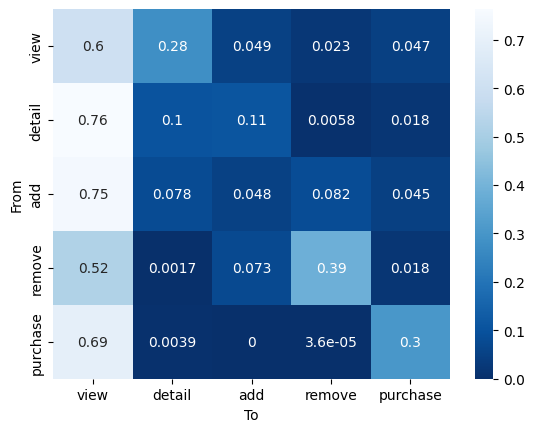

In [ ]:
%matplotlib inline
actions = ["view", "detail", "add", "remove", "purchase"]
ax = sns.heatmap(transitions_session, cmap='Blues_r',xticklabels = actions, yticklabels = actions, annot = True)
# We read the heatmap as a conditional probability from the row event to the column event
# ax.set_title('Transition Probabilities')
plt.xlabel('To')
plt.ylabel('From')

# Save the figure to a PDF file
# plt.savefig('transition_matrix.pdf', format='pdf')

# Display the plot
plt.show()

In [ ]:
class MarkovChain:
    def __init__(self, transition_matrix, actions):
        self.transition_matrix = transition_matrix
        self.actions = actions

    def predict_purchase_probability(self, sequence):
        final_state = sequence[-1]  # Last action in the sequence
        purchase_probability = self.transition_matrix[final_state - 1][self.actions.index(5)]
        return purchase_probability

actions = [1, 2, 3, 4, 5]
# Example usage:
transition_matrix = np.array([[6.02924715e-01, 2.78256787e-01, 4.88495781e-02, 2.26616328e-02, 4.73072864e-02],
                              [7.63370598e-01, 1.03243505e-01, 1.09265995e-01, 5.78581093e-03, 1.83340914e-02],
                              [7.46728958e-01, 7.78434276e-02, 4.78785936e-02, 8.21284803e-02, 4.54205408e-02],
                              [5.20335446e-01, 1.70167159e-03, 7.28710302e-02, 3.86918752e-01, 1.81731004e-02],
                              [6.93037058e-01, 3.87232195e-03, 0.00000000e+00, 3.61899247e-05, 3.03054430e-01]])

markov_model = MarkovChain(transition_matrix, actions)

# Example clickstream sequence
clickstream_sequence = [1, 2, 3, 4, 4, 5]

# Predict purchase probability
purchase_probability = markov_model.predict_purchase_probability(clickstream_sequence)
print("Probability of purchase:", purchase_probability)

Probability of purchase: 0.30305443


In [ ]:
def predict_df(df):
    predictions = []
    true_labels = []
    for index, row in df.iterrows():
        sequence = row['session']
        purchase_probability = markov_model.predict_purchase_probability(sequence)
        predicted_label = 1 if purchase_probability > random.random() else 0
        predictions.append(predicted_label)
        true_labels.append(row['conversion'])
    return predictions, true_labels

data = {'session': X_train["session"], 'conversion': y_train}
X_train = pd.DataFrame(data)

# Make predictions on the dataframe
predicted_labels, true_labels = predict_df(X_train)

# Calculate F1 score
f1 = f1_score(true_labels, predicted_labels)
print("F1 Score:", f1)

F1 Score: 0.171866112448042


In [ ]:
def predict_df(df):
    predictions = []
    true_labels = []
    for index, row in df.iterrows():
        sequence = row['session']
        purchase_probability = markov_model.predict_purchase_probability(sequence)
        predicted_label = 1 if purchase_probability > random.random() else 0
        predictions.append(predicted_label)
        true_labels.append(row['conversion'])
    return predictions, true_labels

data = {'session': X_test["session"], 'conversion': y_test}
X_test = pd.DataFrame(data)

# Make predictions on the dataframe
predicted_labels_mv, true_labels = predict_df(X_test)

# Calculate F1 score
f1 = f1_score(true_labels, predicted_labels_mv)
print("F1 Score:", f1)


F1 Score: 0.17667907141591352


### Error Analysis

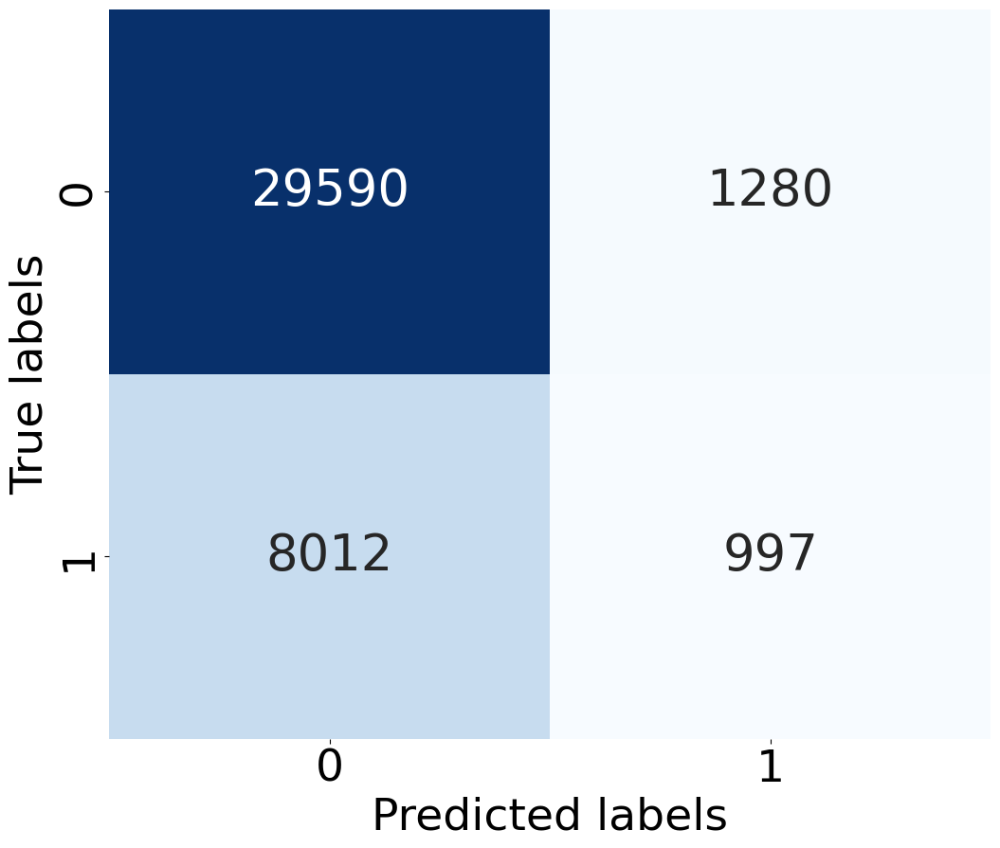

In [ ]:
conf_matrix = confusion_matrix(true_labels, predicted_labels_mv)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 38})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix Markov Chain', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_MV.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
# Compute confusion matrix and classification report
conf_matrix = confusion_matrix(y_test, y_pred_binary_GRU)
cr_error = classification_report(y_test, y_pred_binary_GRU)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 32})
plt.xlabel('Predicted labels', fontsize=30)
plt.ylabel('True labels', fontsize=30)
plt.title('Confusion Matrix GRU', fontsize=32)
plt.xticks(fontsize=28)
plt.yticks(fontsize=28)
plt.savefig('Confusion_Matrix_GRU.pdf', format='pdf')
plt.show()

## Markov Chain Second Order

In [ ]:
class SecondOrderMarkovChain:
    def __init__(self, num_states):
        self.num_states = num_states
        self.transition_matrix = np.zeros((num_states, num_states, num_states))

    def train(self, sequences):
        for sequence in sequences:
            trimmed_sequence = np.trim_zeros(sequence, 'b')
            for i in range(2, len(trimmed_sequence)):
                self.transition_matrix[trimmed_sequence[i-2]-1, trimmed_sequence[i-1]-1, trimmed_sequence[i]-1] += 1

        # Normalize transition probabilities
        for i in range(self.num_states):
            for j in range(self.num_states):
                total = np.sum(self.transition_matrix[i, j])
                if total > 0:
                    self.transition_matrix[i, j] /= total

    def predict_probability(self, sequence):
        if len(sequence) < 2:
            return 0
        prev_prev_state = sequence[-2] - 1
        prev_state = sequence[-1] - 1
        probabilities = self.transition_matrix[prev_prev_state, prev_state]
        return np.sum(probabilities)  # Sum of probabilities to next states

def create_and_train_model(sequences, num_states):
    model = SecondOrderMarkovChain(num_states)
    model.train(sequences)
    return model

# Split your data based on the labels
sequences_label_0 = sequences_train[labels_train == 0]
sequences_label_1 = sequences_train[labels_train == 1]

num_states = 5  # Assuming 5 possible states, adjust as needed

# Train two separate models
model_0 = create_and_train_model(sequences_label_0, num_states)
model_1 = create_and_train_model(sequences_label_1, num_states)

# Function to predict label for a new sequence
def predict_sequence_label(sequence, model_0, model_1):
    probability_0 = model_0.predict_probability(sequence)
    probability_1 = model_1.predict_probability(sequence)
    return 0 if probability_0 > probability_1 else 1

# Predict and evaluate on the test set
predicted_labels = [predict_sequence_label(seq, model_0, model_1) for seq in sequences_test]
f1 = f1_score(labels_test, predicted_labels)
print("F1 Score:", f1)

F1 Score: 0.3359620350338474


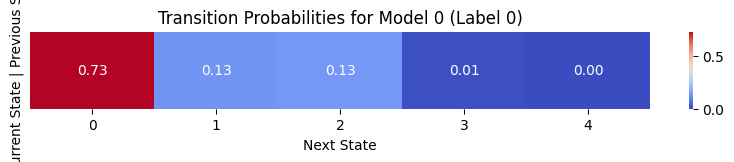

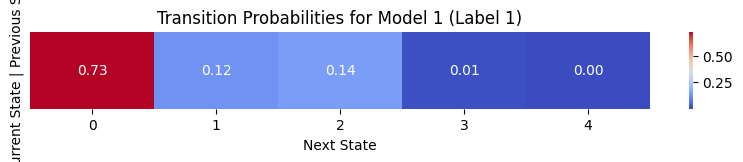

In [ ]:
def display_transition_matrix(matrix_slice, title):
    # Reshape the matrix slice (1D array) into a 2D array for heatmap display
    matrix_slice_2d = matrix_slice.reshape(-1, len(matrix_slice))
    plt.figure(figsize=(10, 1))  # Adjust figure size to fit the elongated shape of the matrix slice
    sns.heatmap(matrix_slice_2d, annot=True, fmt=".2f", cmap='coolwarm', yticklabels=False)
    plt.title(title)
    plt.xlabel('Next State')
    plt.ylabel('Current State | Previous State')
    plt.show()

# Example state indices
i, j = 0, 1  # Indices for the previous and current state
display_transition_matrix(model_0.transition_matrix[i, j], "Transition Probabilities for Model 0 (Label 0)")
display_transition_matrix(model_1.transition_matrix[i, j], "Transition Probabilities for Model 1 (Label 1)")

In [ ]:
i, j, k = 1, 2, 3  # Example states
print(f"Probability of transitioning from ({i+1}, {j+1}) to {k+1} in model 0: {model_0.transition_matrix[i, j, k]:.4f}")
print(f"Probability of transitioning from ({i+1}, {j+1}) to {k+1} in model 1: {model_1.transition_matrix[i, j, k]:.4f}")


Probability of transitioning from (2, 3) to 4 in model 0: 0.0648
Probability of transitioning from (2, 3) to 4 in model 1: 0.0821


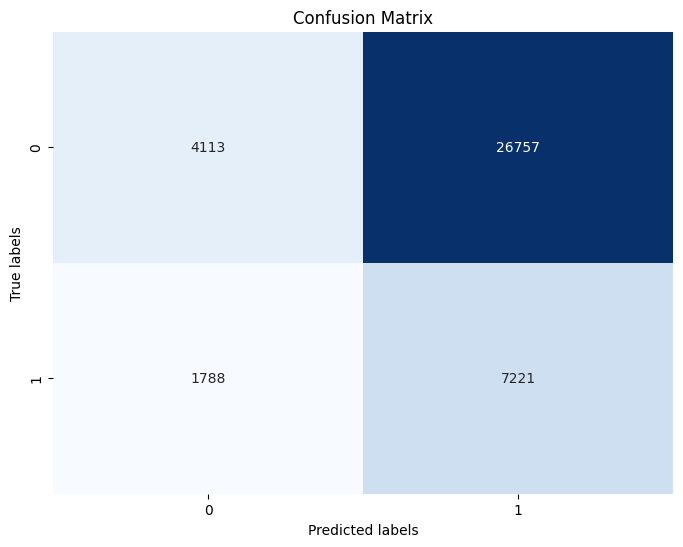

In [ ]:
conf_matrix = confusion_matrix(labels_test, predicted_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

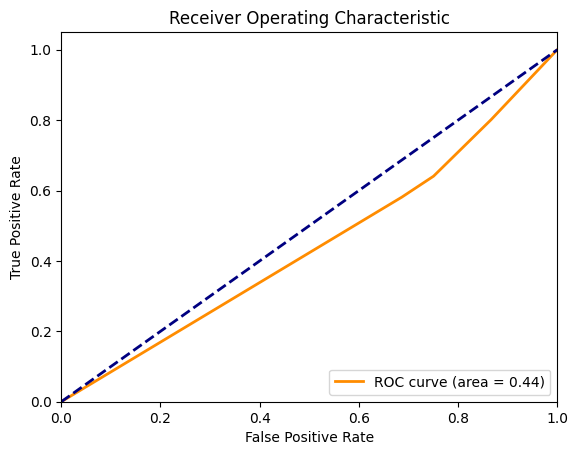

In [ ]:
import numpy as np
from sklearn.metrics import roc_curve, auc, f1_score
import matplotlib.pyplot as plt

class SecondOrderMarkovChain:
    def __init__(self, num_states):
        self.num_states = num_states
        self.transition_matrix = np.zeros((num_states, num_states, num_states))

    def train(self, sequences):
        for sequence in sequences:
            trimmed_sequence = np.trim_zeros(sequence, 'b')
            for i in range(2, len(trimmed_sequence)):
                self.transition_matrix[trimmed_sequence[i-2]-1, trimmed_sequence[i-1]-1, trimmed_sequence[i]-1] += 1

        # Normalize transition probabilities
        for i in range(self.num_states):
            for j in range(self.num_states):
                total = np.sum(self.transition_matrix[i, j])
                if total > 0:
                    self.transition_matrix[i, j] /= total

    def predict_probability(self, sequence):
        if len(sequence) < 2:
            return 0
        prev_prev_state = sequence[-2] - 1
        prev_state = sequence[-1] - 1
        probabilities = self.transition_matrix[prev_prev_state, prev_state]
        return np.sum(probabilities)  # Sum of probabilities to next states

def create_and_train_model(sequences, num_states):
    model = SecondOrderMarkovChain(num_states)
    model.train(sequences)
    return model

# Assuming sequences_train and labels_train are defined
num_states = 5  # Adjust the number of states as needed

# Train two separate models for the two classes
model_0 = create_and_train_model(sequences_train[labels_train == 0], num_states)
model_1 = create_and_train_model(sequences_train[labels_train == 1], num_states)

# Modify prediction function to return probabilities
def predict_sequence_probability(sequence, model_0, model_1):
    probability_0 = model_0.predict_probability(sequence)
    probability_1 = model_1.predict_probability(sequence)
    return probability_1 / (probability_0 + probability_1) if (probability_0 + probability_1) > 0 else 0

# Generate probabilities for the test set
probabilities = [predict_sequence_probability(seq, model_0, model_1) for seq in sequences_test]

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(labels_test, probabilities)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


In [ ]:
probabilities[:5]

[1.0, 1.0, 0.49999999999999994, 1.0, 0.5]

## GRU

In [ ]:
X_train.head()

,session_id_hash,session
317,006663e8030ec06f59b5f7b9401fc5a85fedfba541296a...,"[1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, ..."
150615,c0ea26f06f885f2e647ff6c945f64621596170c285f857...,"[1, 2, 2, 1, 1, 2, 1, 2, 1, 2, 1, 2, 3, 1, 2, ..."
191502,f5d3c2a190d0fe44b3f5cb6b093dd8e1092ac9d7f29fe4...,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, ..."
181330,e8b5f2ba42ff1168c314d7220983403053457ddf968c7b...,"[1, 2, 3, 4, 1, 4, 1, 4, 4, 1, 4, 4, 4, 4, 4, ..."
147450,bce118d59635f73d6afa0816e5fa154d7a4ce65f651a42...,"[1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 3, 1, 2, 1, 1, ..."


In [ ]:
sequences_train = X_train['session'].tolist()
sequences_test = X_test['session'].tolist()
sequences_train = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train]
sequences_test = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_test]

# Pad sequences to a fixed length
max_length = 30  # Choose the maximum length you want
padded_sequences_train = pad_sequences(sequences_train, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test = pad_sequences(sequences_test, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train = np.array(padded_sequences_train)
labels_train = np.array(y_train)
sequences_test = np.array(padded_sequences_test)
labels_test = np.array(y_test)

In [ ]:
# Split the data into train, validation, and test sets
X_train, X_val, y_train, y_val = train_test_split(sequences_train, labels_train, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(X_train, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

In [ ]:
X_train_reshaped.shape

(119619, 30, 1)

In [ ]:
X_val_reshaped.shape

(39874, 30, 1)

In [ ]:
# Define the GRU model with increased complexity and additional techniques
model_GRU = Sequential([
    GRU(32, input_shape=(None, 1)),
    Dropout(0),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.01)
model_GRU.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model_GRU.fit(X_train_reshaped, y_train, epochs=10, batch_size=128, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
935/935 [==============================] - 8s 7ms/step - loss: 0.4928 - accuracy: 0.7772 - val_loss: 0.4413 - val_accuracy: 0.7807
Epoch 2/10
935/935 [==============================] - 7s 7ms/step - loss: 0.4369 - accuracy: 0.7821 - val_loss: 0.4375 - val_accuracy: 0.7825
Epoch 3/10
935/935 [==============================] - 6s 6ms/step - loss: 0.4315 - accuracy: 0.7830 - val_loss: 0.4336 - val_accuracy: 0.7834
Epoch 4/10
935/935 [==============================] - 7s 7ms/step - loss: 0.4290 - accuracy: 0.7841 - val_loss: 0.4289 - val_accuracy: 0.7832
Epoch 5/10
935/935 [==============================] - 5s 6ms/step - loss: 0.4277 - accuracy: 0.7850 - val_loss: 0.4307 - val_accuracy: 0.7876
Epoch 6/10
935/935 [==============================] - 7s 7ms/step - loss: 0.4238 - accuracy: 0.7865 - val_loss: 0.4252 - val_accuracy: 0.7857
Epoch 7/10
935/935 [==============================] - 6s 6ms/step - loss: 0.4229 - accuracy: 0.7870 - val_loss: 0.4262 - val_accuracy: 0.7870
Epoch 

In [ ]:
# 1	batch size: 64;	Dropout: 0.00;	Learning Rate: 0.001 --> 0.52443 (Threshold = 0.23)
# 2	batch size: 128;	Dropout: 0.00;	Learning Rate: 0.001 --> 0.52131 (Threshold = 0.29)
# 3	batch size: 32;	Dropout: 0.00;	Learning Rate: 0.001 --> 0.52541 (Threshold = 0.24)
# 4	batch size: 32;	Dropout: 0.00;	Learning Rate: 0.010 --> 0.51447 (Threshold = 0.27)


# 5	batch size: 128; 	Dropout:0.00; 	Learning Rate: 0.010 --> 0.52750 (Threshold = 0.27)

In [ ]:
model_save_name = 'model_GRU.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_GRU.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_GRU.predict(X_train_reshaped)
y_pred_binary_train = (y_pred > 0.27587).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train, y_pred_binary_train)

print("F1 Score:", f1)

3739/3739 [==============================] - 11s 3ms/step
F1 Score: 0.5307759327593276


In [ ]:
def calculate_f1(y_true, y_pred_probs, threshold):
    """Calculate F1 score for a given threshold."""
    y_pred = (y_pred_probs > threshold).astype(int)
    return f1_score(y_true, y_pred)
def binary_search_threshold(y_true, y_pred_probs, lower=0.0, upper=1.0, precision=0.001):
    """Perform binary search to find the optimal threshold for F1 score."""
    best_threshold = lower
    best_f1 = 0.0
    while upper - lower > precision:
        mid = (lower + upper) / 2
        f1_mid = calculate_f1(y_true, y_pred_probs, mid)

        # Check thresholds at the midpoint between lower and mid, and mid and upper
        mid_lower = (lower + mid) / 2
        mid_upper = (mid + upper) / 2

        f1_mid_lower = calculate_f1(y_true, y_pred_probs, mid_lower)
        f1_mid_upper = calculate_f1(y_true, y_pred_probs, mid_upper)

        # Determine which segment to retain based on where the maximum F1 score was found
        if f1_mid_lower > f1_mid and f1_mid_lower > f1_mid_upper:
            upper = mid  # Focus on the lower segment
            best_f1 = f1_mid_lower
            best_threshold = mid_lower
        elif f1_mid_upper > f1_mid:
            lower = mid  # Focus on the upper segment
            best_f1 = f1_mid_upper
            best_threshold = mid_upper
        else:
            lower = mid_lower
            upper = mid_upper
            best_f1 = f1_mid
            best_threshold = mid

    return best_threshold, best_f1

# Predict labels for the test set
y_pred_probs = model_GRU.predict(X_train_reshaped)

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_train, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)


3739/3739 [==============================] - 24s 6ms/step
Optimal Threshold: 0.27587890625
Optimal F1 Score: 0.530763908464239


In [ ]:
# Predict labels for the test set
y_pred = model_GRU.predict(X_train_reshaped)
y_pred_binary_train = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train, y_pred_binary_train)

print("F1 Score:", f1)

3739/3739 [==============================] - 9s 2ms/step
F1 Score: 0.20545454545454545


In [ ]:
# Predict labels for the test set
y_pred = model_GRU.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.27587).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.5226732141486995


In [ ]:
# Predict labels for the test set
y_pred = model_GRU.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.20513778608127045


In [ ]:
# Predict labels for the test set
y_pred = model_GRU.predict(padded_sequences_test)
y_pred_binary_GRU = (y_pred > 0.27587).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU)

print("F1 Score:", f1)

1247/1247 [==============================] - 9s 6ms/step
F1 Score: 0.5268936921718432


In [ ]:
# Predict labels for the test set
y_pred = model_GRU.predict(padded_sequences_test)
y_pred_binary_GRU = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.2001874414245548


### Hyperparameter Tuning

In [ ]:
import logging
import pandas as pd
from sklearn.metrics import f1_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from kerastuner import HyperParameters
from kerastuner.tuners import GridSearch

# Suppress TensorFlow logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# Define a function to build the model
def build_model(hp):
    model = Sequential()
    model.add(GRU(units=32, input_shape=(None, 1)))
    model.add(Dropout(rate=hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.25)))
    model.add(Dense(units=32, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    learning_rate = hp.Choice("learning_rate", [0.001, 0.01])
    batch_size = hp.Choice("batch_size", [128, 64, 32])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Initialize a GridSearch tuner
tuner = GridSearch(
    build_model,
    objective='val_loss')

# Perform the search
tuner.search(X_train_reshaped, y_train, epochs=10, validation_data=(X_val_reshaped, y_val))

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hps.values)

Trial 18 Complete [00h 04m 24s]
val_loss: 0.44654446840286255

Best val_loss So Far: 0.42483192682266235
Total elapsed time: 01h 22m 42s
Best Hyperparameters:
{'dropout': 0.0, 'learning_rate': 0.001, 'batch_size': 64}


In [ ]:
hyperparameters_data = []
for trial in tuner.oracle.get_best_trials(num_trials=len(tuner.oracle.trials)):
    hyperparameters = trial.hyperparameters.values
    val_loss = trial.score
    hyperparameters_data.append({
        'Batch Size': hyperparameters['batch_size'],
        'Dropout': hyperparameters['dropout'],
        'Learning Rate': hyperparameters['learning_rate'],
        'Validation Loss': val_loss
    })

# Create DataFrame
df_results_GRU = pd.DataFrame(hyperparameters_data)

In [ ]:
df_results_GRU

,Batch Size,Dropout,Learning Rate,Validation Loss
0,64,0.00,0.001,0.424832
1,128,0.00,0.001,0.424850
2,32,0.00,0.001,0.426645
3,32,0.00,0.010,0.427222
4,128,0.00,0.010,0.428786
5,128,0.25,0.001,0.428916
6,32,0.50,0.001,0.430197
7,32,0.25,0.001,0.430277
8,128,0.50,0.001,0.430381
9,64,0.25,0.001,0.431359


In [ ]:
df_results_GRU.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_GRU.csv", index = False)

NameError: name 'df_results_GRU' is not defined

In [ ]:
df_results_GRU = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_GRU.csv")

In [ ]:
results_df = df_results_GRU

In [ ]:
# Define hyperparameters and F1 scores
hyperparameters = ['Dropout Rate', 'Batch Size', 'Learning Rate']
vl_scores = ['Validation Loss']

# Create pairplot
fig = ff.create_scatterplotmatrix(
    results_df,
    diag='histogram',
    index='Validation Loss',
    colormap='Rainbow',
    colormap_type='seq',
    height=800,
    width=800
)

# Update layout
fig.update_layout(
    title='Pairplot of Hyperparameters vs Validation loss',
    xaxis=dict(title='Hyperparameters'),
    yaxis=dict(title='Hyperparameters')
)

fig.show()

In [ ]:
import plotly.graph_objects as go
import plotly.io as pio

# Create the contour plot
fig = go.Figure(data=go.Contour(
    x=results_df['Dropout'],
    y=results_df['Learning Rate'],
    z=results_df['Validation Loss'],
    colorscale='Blues',  # Choose a colorscale
    colorbar=dict(
        title=dict(text='Validation Loss', font=dict(size=26)),
        thickness=50,  # Increase the thickness of the colorbar
        len=1.1,
        tickfont=dict(size=24)
    ),
))

# Update layout with increased font sizes
fig.update_layout(
#    title=dict(text='Contour Plot of Hyperparameters GRU', font=dict(size=22)),
    xaxis=dict(title=dict(text='Dropout Rate', font=dict(size=26)), tickfont=dict(size=24)),
    yaxis=dict(title=dict(text='Learning Rate', font=dict(size=26)), tickfont=dict(size=24))
)

fig.show()
pio.write_image(fig, 'hyperparameters_contour_plot_GRU.pdf')

In [ ]:
pip install -U kaleido

### SHAP

#### Kmeans

In [ ]:
# Set a fixed random seed for reproducibility
np.random.seed(42)
# Define the sample size
sample_size = 500
# Initialize StratifiedShuffleSplit
splitter = StratifiedShuffleSplit(n_splits=1, test_size=sample_size, random_state=42)
# Generate the stratified sample
for train_index, test_index in splitter.split(padded_sequences_test, labels_test):
    subset_X_test_reshaped = padded_sequences_test[test_index]
    subset_y_test = labels_test[test_index]
# Display the shape of the subset to verify
print(subset_X_test_reshaped.shape)
print(subset_y_test.shape)

(500, 30)
(500,)


In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_GRU.predict, background_summary)

# Compute SHAP values for the test data
shap_values_test_kernel_GRU = kernel_explainer.shap_values(subset_X_test_reshaped)

1/1 [==============================] - 1s 1s/step


  0%|          | 0/500 [00:00<?, ?it/s]

329/329 [==============================] - 1s 3ms/step


In [ ]:
np.save('/content/drive/My Drive/Thesis/Datasets/shap_values_test_kernel_GRU500.npy', shap_values_test_kernel_GRU)

In [ ]:
file_path = '/content/drive/My Drive/Thesis/Datasets/shap_values_test_kernel_GRU500.npy'
shap_values_test_kernel_GRU = np.load(file_path)

In [ ]:
# Define feature names based on the time steps in the sequence
# TS = Time Step
feature_names = [f"TS {i+1}" for i in range(subset_X_test_reshaped.shape[1])]

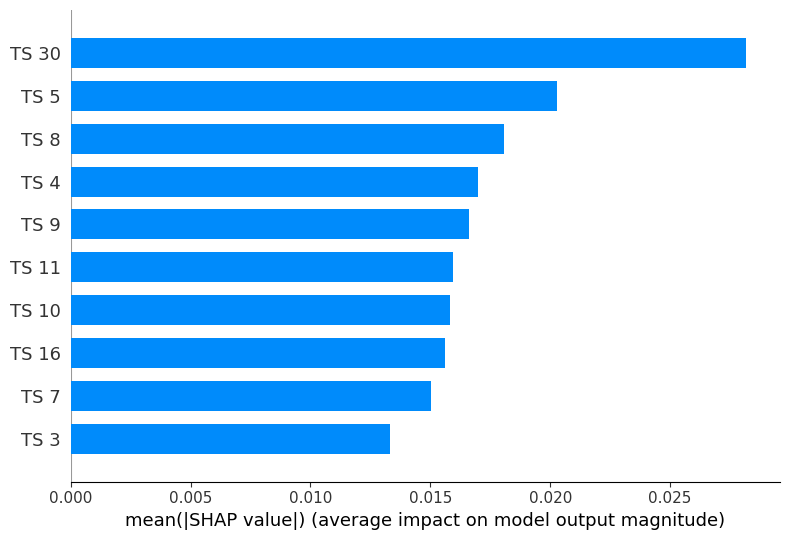

In [ ]:
# Reshape the SHAP values matrix to match the shape of the features matrix
shap_values_test_kernel_GRU_reshaped = shap_values_test_kernel_GRU.reshape(shap_values_test_kernel_GRU.shape[0], shap_values_test_kernel_GRU.shape[1], -1)

# Aggregate SHAP values across all features
shap_values_aggregated = np.mean(shap_values_test_kernel_GRU, axis=2)

# Get the mean absolute SHAP values for each feature
mean_abs_shap_values = np.mean(np.abs(shap_values_aggregated), axis=0)

# Sort the features based on their mean absolute SHAP values
sorted_indices = np.argsort(mean_abs_shap_values)[::-1]

# Select only the top ten features
top_ten_indices_GRU = sorted_indices[:10]
top_ten_features = subset_X_test_reshaped[:, top_ten_indices_GRU]
top_ten_feature_names = [feature_names[i] for i in top_ten_indices_GRU]

# Plot the aggregated SHAP values for the top ten features
shap.summary_plot(shap_values_aggregated[:, top_ten_indices_GRU], features=top_ten_features, feature_names=top_ten_feature_names , plot_type='bar')


In [ ]:
import numpy as np
from scipy import linalg
from warnings import warn

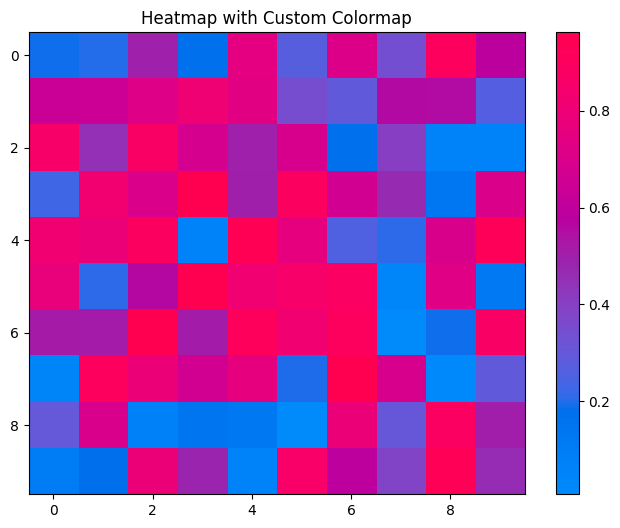

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.color import lab2rgb, lch2lab
from matplotlib.colors import LinearSegmentedColormap

def lch2rgb(x):
    return lab2rgb(lch2lab([[x]]))[0][0]

# Define our colors using Lch
blue_lch = [54., 70., 4.6588]
l_mid = 40.
red_lch = [54., 90., 0.35470565 + 2 * np.pi]
gray_lch = [55., 0., 0.]
blue_rgb = lch2rgb(blue_lch)
red_rgb = lch2rgb(red_lch)
gray_rgb = lch2rgb(gray_lch)
white_rgb = np.array([1.,1.,1.])

reds = []
greens = []
blues = []
alphas = []
nsteps = 100
l_vals = list(np.linspace(blue_lch[0], l_mid, nsteps//2)) + list(np.linspace(l_mid, red_lch[0], nsteps//2))
c_vals = np.linspace(blue_lch[1], red_lch[1], nsteps)
h_vals = np.linspace(blue_lch[2], red_lch[2], nsteps)
for pos, l, c, h in zip(np.linspace(0, 1, nsteps), l_vals, c_vals, h_vals):
    lch = [l, c, h]
    rgb = lch2rgb(lch)
    reds.append((pos, rgb[0], rgb[0]))
    greens.append((pos, rgb[1], rgb[1]))
    blues.append((pos, rgb[2], rgb[2]))
    alphas.append((pos, 1.0, 1.0))

red_blue = LinearSegmentedColormap('red_blue', {
    "red": reds,
    "green": greens,
    "blue": blues,
    "alpha": alphas
})

# Create some example data
data = np.random.rand(10, 10)

colors = [(0, 0, 1, 1), (1, 0, 0, 1)]  # From blue to red
cm = LinearSegmentedColormap.from_list("red_blue", colors, N=256)

# Plot heatmap using the custom colormap
plt.figure(figsize=(8, 6))
plt.imshow(data, cmap=red_blue, aspect='auto')
plt.colorbar()
plt.title('Heatmap with Custom Colormap')
plt.show()

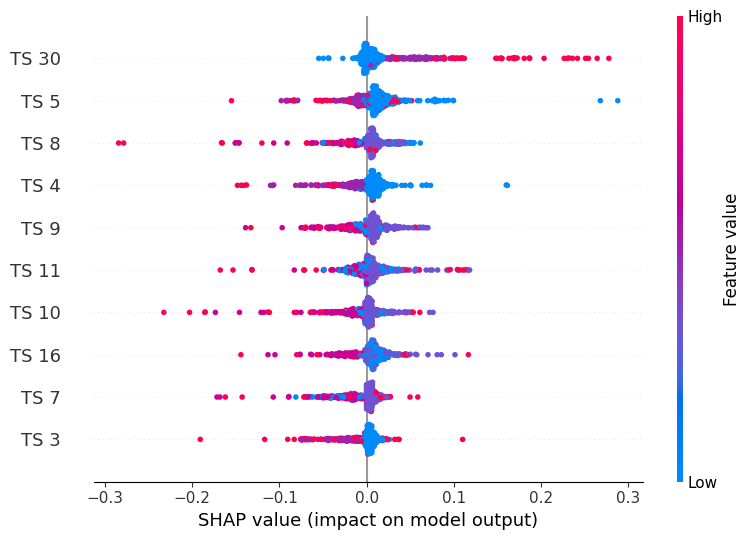

In [ ]:
# Define a simple colormap from blue to red
# colors = [(0, 0, 1, 1), (1, 0, 0, 1)]  # From blue to red
# cm = LinearSegmentedColormap.from_list("red_blue", colors, N=256)
plt.figure()
shap.summary_plot(
    shap_values_aggregated[:, top_ten_indices_GRU],
    features=top_ten_features,
    feature_names=top_ten_feature_names
)
# plt.savefig('shap_summary_plot_GRU.pdf', bbox_inches='tight')
plt.close()

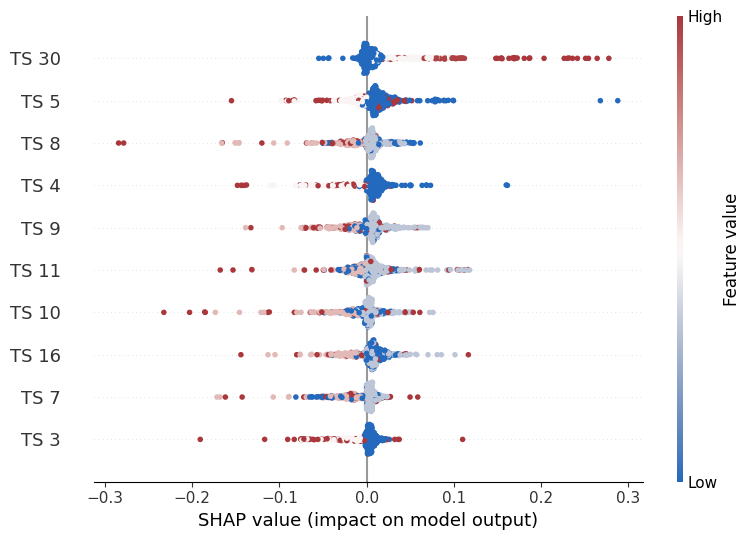

In [ ]:
# Create the color map
cmap = sns.color_palette("vlag", as_cmap=True)

# Set the color map for Matplotlib
plt.figure()

# Plot the SHAP summary plot
shap.summary_plot(
    shap_values_aggregated[:, top_ten_indices_GRU],
    features=top_ten_features,
    feature_names=top_ten_feature_names,
    cmap=cmap
)

# Optionally save the plot
plt.savefig('shap_summary_plot_GRU.pdf', bbox_inches='tight')
plt.close()

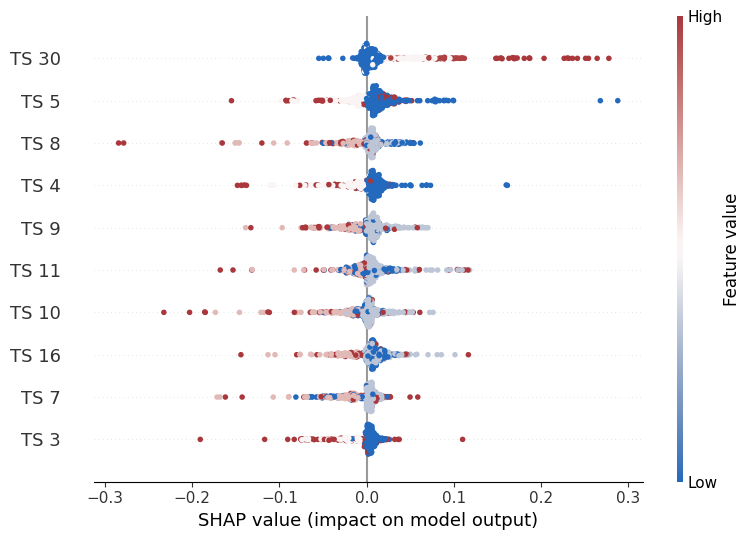

In [ ]:
plt.figure(figsize=(8, 6))

# Generate the SHAP summary plot
shap.summary_plot(shap_values_aggregated[:, top_ten_indices_GRU],
                  features=top_ten_features,
                  feature_names=top_ten_feature_names,
                  show=False,
                  cmap=cmap)  # Add 'show=False' to prevent automatic display if running in an interactive environment

# Save the plot to a PDF file
plt.savefig('shap_summary_plot_GRU.pdf', bbox_inches='tight')

# Optional: Display the plot in the script or notebook
plt.show()

# Close the plot to free up memory
plt.close()

In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_GRU.predict, background_summary)

1/1 [==============================] - 0s 30ms/step


In [ ]:
subset_X_test_reshaped[2]

array([2, 1, 3, 4, 1, 4, 1, 4, 1, 1, 1, 1, 1, 1, 1, 4, 3, 4, 1, 4, 1, 1,
       1, 1, 1, 4, 1, 4, 1, 4], dtype=int32)

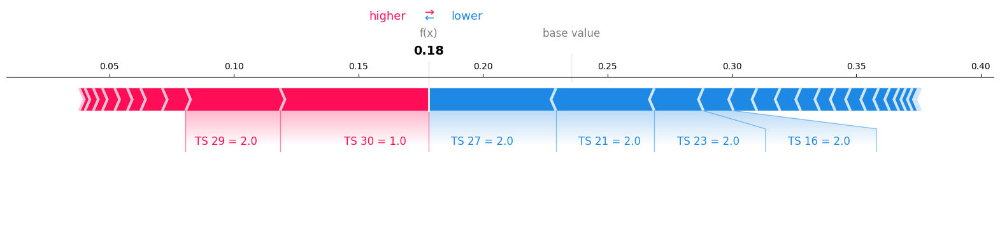

In [ ]:
import shap
import matplotlib.pyplot as plt

# Choose an instance to explain (e.g., the first instance)
instance_index = 10

# Generate force plot for the chosen instance using SHAP
shap.initjs()
force_plot = shap.force_plot(
    kernel_explainer.expected_value,
    shap_values_test_kernel_GRU[instance_index][:, 0],
    subset_X_test_reshaped[instance_index],
    matplotlib=True,
    feature_names=feature_names
)

# Display the force plot
plt.show()

In [ ]:
from IPython.display import display
# load JS visualization code to notebook
shap.initjs()
display(shap.plots.force(kernel_explainer.expected_value, shap_values_test_kernel_GRU[instance_index][:, 0], subset_X_test_reshaped[instance_index], feature_names= feature_names, plot_cmap = ["#8f8f8f", "#4d8fc6"]))

In [ ]:
# Choose an instance to explain (e.g., the first instance)
instance_index = 7

# Create the custom colormap
custom_cmap = ["#8f8f8f", "#4d8fc6"]

# Generate force plot for the chosen instance
shap.initjs()
force_plot = shap.force_plot(
    kernel_explainer.expected_value,
    shap_values_test_kernel_GRU[instance_index][:, 0],
    subset_X_test_reshaped[instance_index],
    feature_names=feature_names,
    plot_cmap=custom_cmap
)

# Save the force plot to an HTML file
html_file = 'shap_force_plot.html'
shap.save_html(html_file, force_plot)

# Display the plot
display(force_plot)

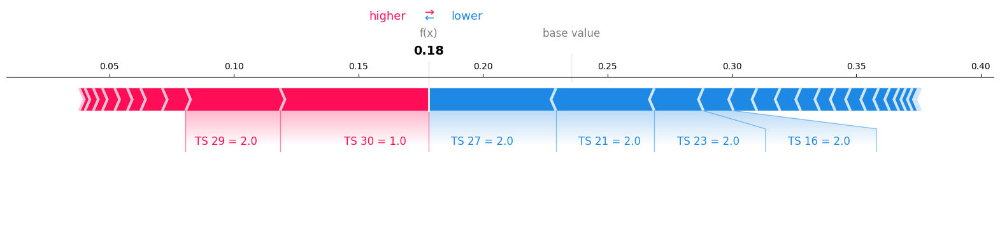

In [ ]:
# Choose an instance to explain (e.g., the first instance)
instance_index = 10

# Generate force plot for the chosen instance
shap.force_plot(kernel_explainer.expected_value, shap_values_test_kernel_GRU[instance_index][:, 0], subset_X_test_reshaped[instance_index], matplotlib=True, feature_names= feature_names)

1247/1247 [==============================] - 5s 4ms/step


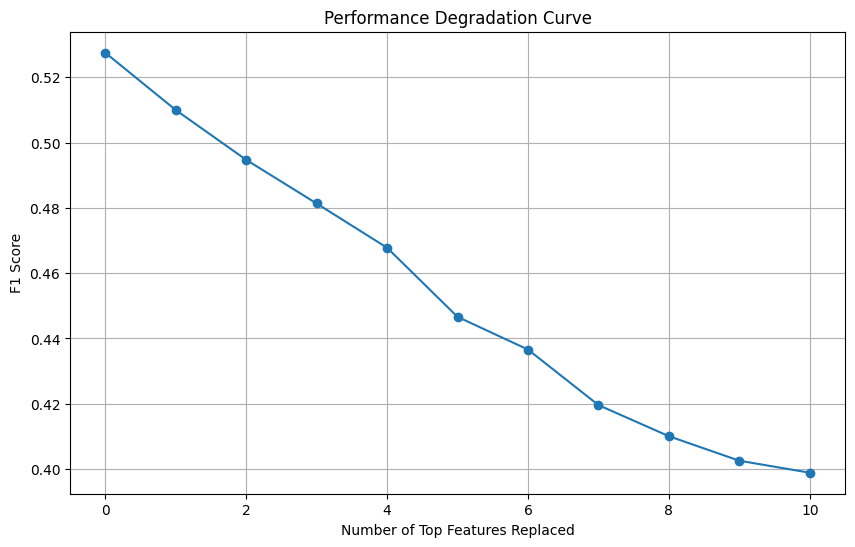

In [ ]:
# Create a copy of the test data to modify
modified_test_set = np.array(padded_sequences_test)

# Store original F1 score with unmodified data
original_pred = model_GRU.predict(padded_sequences_test)
original_f1 = f1_score(y_test, (original_pred > 0.27).astype(int))

# Initialize a list to store F1 scores after each feature modification
f1_scores_GRU = [original_f1]

# Replace each top feature with the majority value found in that feature
for i, feature_idx in enumerate(top_ten_indices_GRU):
    # Find the majority class for the current feature across all test data
    majority_value = np.bincount(modified_test_set[:, feature_idx]).argmax()

    # Replace this feature in all test samples with the majority class
    modified_test_set[:, feature_idx] = majority_value

    # Evaluate the model with the modified test set
    new_predictions = model_GRU.predict(modified_test_set)
    new_f1 = f1_score(y_test, (new_predictions > 0.27).astype(int))

    # Append the new F1 score
    f1_scores_GRU.append(new_f1)

# Plot the performance degradation curve
plt.figure(figsize=(10, 6))
plt.plot(range(len(f1_scores_GRU)), f1_scores_GRU, marker='o')
plt.title('Performance Degradation Curve')
plt.xlabel('Number of Top Features Replaced')
plt.ylabel('F1 Score')
plt.grid(True)
plt.show()

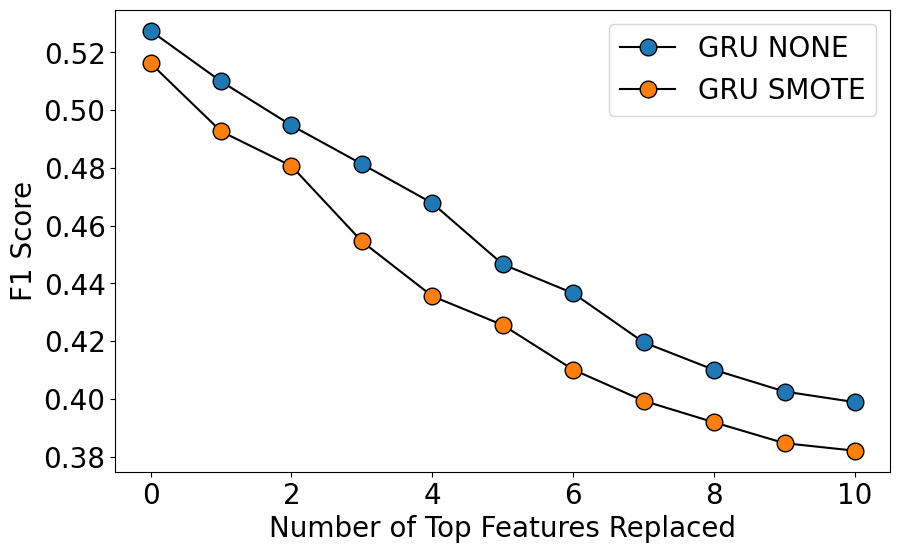

In [ ]:
# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(range(len(f1_scores_GRU)), f1_scores_GRU, marker='o', markersize = 12, color = "black", markerfacecolor = tab10(0), label='GRU NONE')
plt.plot(range(len(f1_scores_GRU_SMOTE)), f1_scores_GRU_SMOTE, marker='o', color = "black", markerfacecolor = tab10(1), markersize = 12, label='GRU SMOTE')

# Adding title and labels with increased font size
# plt.title('Performance Degradation Curves GRU', fontsize=22)  # Increase font size for the title
plt.xlabel('Number of Top Features Replaced', fontsize=20)  # Increase font size for x-axis label
plt.ylabel('F1 Score', fontsize=20)  # Increase font size for y-axis label

# Increase font size for tick labels on both axes
plt.xticks(fontsize=20)  # Increase font size for x-axis tick labels
plt.yticks(fontsize=20)  # Increase font size for y-axis tick labels

# plt.grid(True)

# Increase font size for the legend
plt.legend(fontsize=20)

# Save the plot to a PDF file
plt.savefig('Performance Degradation Curves GRU.pdf', bbox_inches='tight')
# Show the plot
plt.show()

#### Both classes

In [ ]:
# Filter the dataset for "cart abandonment" sessions (target = 0)
cart_abandonment_sessions = df_train[df_train["conversion"] == 0][["session_id_hash", "session"]]
sequences_train_ca = cart_abandonment_sessions['session'].tolist()
sequences_train_ca = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_ca]
max_length = 30  # Choose the maximum length you want
padded_sequences_ca = pad_sequences(sequences_train_ca, maxlen= max_length, padding='post', truncating='post')

# Filter the dataset for "purchase" sessions (target = 1)
purchase_sessions = df_train[df_train["conversion"] == 1][["session_id_hash", "session"]]
sequences_train_pu = purchase_sessions['session'].tolist()
sequences_train_pu = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_pu]
max_length = 30  # Choose the maximum length you want
padded_sequences_pu = pad_sequences(sequences_train_pu, maxlen= max_length, padding='post', truncating='post')

In [ ]:
# Set a fixed random seed
np.random.seed(42)

sample_size = 100
sample_indices = np.random.choice(len(padded_sequences_ca), size=sample_size, replace=False)
subset_X_test_reshaped_ca = padded_sequences_ca[sample_indices]

sample_indices = np.random.choice(len(padded_sequences_pu), size=sample_size, replace=False)
subset_X_test_reshaped_pu = padded_sequences_pu[sample_indices]

In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped_ca, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_GRU.predict, background_summary)

# Compute SHAP values for the test data
shap_values_class0 = kernel_explainer.shap_values(subset_X_test_reshaped_ca)

1/1 [==============================] - 0s 21ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

330/330 [==============================] - 1s 2ms/step


In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped_pu, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_GRU.predict, background_summary)

# Compute SHAP values for the test data
shap_values_class1 = kernel_explainer.shap_values(subset_X_test_reshaped_pu)

1/1 [==============================] - 0s 18ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

329/329 [==============================] - 1s 2ms/step


In [ ]:
# Define feature names based on the time steps in the sequence
# TS = Time Step
feature_names = [f"TS {i+1}" for i in range(subset_X_test_reshaped_ca.shape[1])]

In [ ]:
# Create the custom colormap
custom_cmap = ["#8f8f8f", "#4d8fc6"]

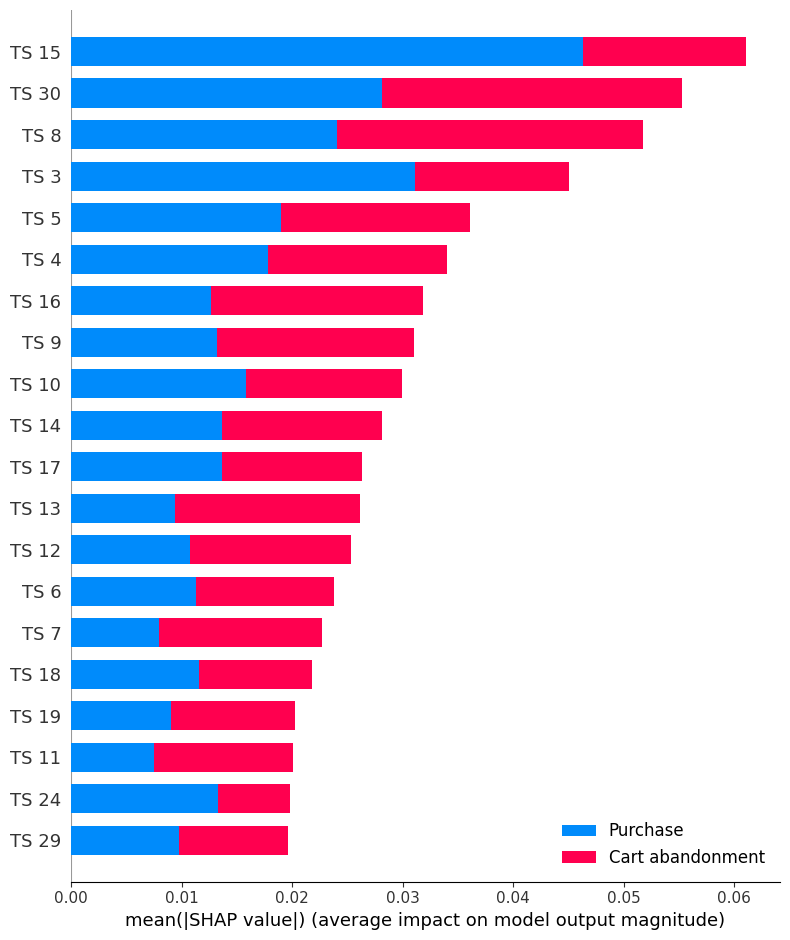

In [ ]:
# Define custom colors
color_cart_abandonment = "#8f8f8f"
color_purchase = "#4d8fc6"

# Reshape the SHAP values matrix to match the shape of the features matrix for each class
shap_values_class0_reshaped = shap_values_class0.reshape(shap_values_class0.shape[0], shap_values_class0.shape[1], -1)
shap_values_class1_reshaped = shap_values_class1.reshape(shap_values_class1.shape[0], shap_values_class1.shape[1], -1)

# Aggregate SHAP values across all features for each class
shap_values_class0_aggregated = np.mean(shap_values_class0, axis=2)
shap_values_class1_aggregated = np.mean(shap_values_class1, axis=2)

# Create a matplotlib figure and axis
fig, ax = plt.subplots()

# Plot the aggregated SHAP values for the top ten features for both classes in one summary plot
shap.summary_plot([shap_values_class0_aggregated, shap_values_class1_aggregated],
                  feature_names=feature_names,
                  plot_type='bar',
                  class_names=['Cart abandonment', 'Purchase'],
                  # color_bar = True,
                  # color_bar_label=[color_cart_abandonment, color_purchase],
                  cmap = "hsv",
                  show=False)  # Prevents immediate showing of the plot


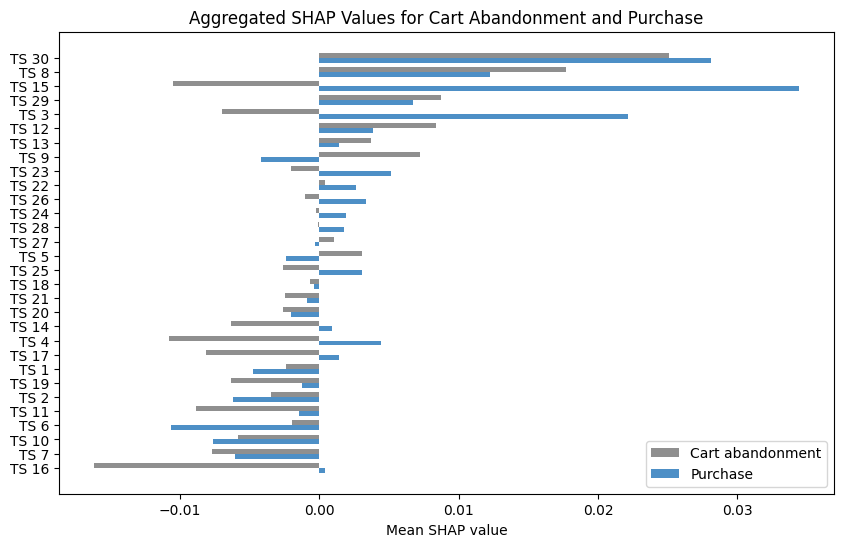

In [ ]:
# Reshape the SHAP values matrix to match the shape of the features matrix for each class
shap_values_class0_reshaped = shap_values_class0.reshape(shap_values_class0.shape[0], shap_values_class0.shape[1], -1)
shap_values_class1_reshaped = shap_values_class1.reshape(shap_values_class1.shape[0], shap_values_class1.shape[1], -1)

# Aggregate SHAP values across all features for each class
shap_values_class0_aggregated = np.mean(shap_values_class0, axis=2)
shap_values_class1_aggregated = np.mean(shap_values_class1, axis=2)

# Calculate mean SHAP values for plotting
mean_shap_values_class0 = shap_values_class0_aggregated.mean(axis=0)
mean_shap_values_class1 = shap_values_class1_aggregated.mean(axis=0)

# Combine the mean SHAP values and feature names into a single array for sorting
combined_mean_shap_values = np.stack([mean_shap_values_class0, mean_shap_values_class1], axis=1)
sorted_indices = np.argsort(combined_mean_shap_values.sum(axis=1))[::-1]
sorted_features = np.array(feature_names)[sorted_indices]
sorted_shap_values_class0 = mean_shap_values_class0[sorted_indices]
sorted_shap_values_class1 = mean_shap_values_class1[sorted_indices]

# Create a matplotlib figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Set the positions and bar width
positions = np.arange(len(sorted_features))
bar_width = 0.35

# Plot the bars for 'Cart abandonment' (left bars)
bars_class0 = ax.barh(positions, sorted_shap_values_class0, bar_width, color=color_cart_abandonment, label='Cart abandonment')

# Plot the bars for 'Purchase' (right bars)
bars_class1 = ax.barh(positions + bar_width, sorted_shap_values_class1, bar_width, color=color_purchase, label='Purchase')

# Set feature names as y-ticks
ax.set_yticks(positions + bar_width / 2)
ax.set_yticklabels(sorted_features)

# Add labels and title
ax.set_xlabel('Mean SHAP value')
ax.set_title('Aggregated SHAP Values for Cart Abandonment and Purchase')
ax.legend()

# Invert y-axis to match the provided image
ax.invert_yaxis()

### Error Analysis

In [ ]:
y_pred_GRU = model_GRU.predict(padded_sequences_test)

1247/1247 [==============================] - 11s 8ms/step


In [ ]:
y_pred_GRU_ovs = model_GRU_ovs.predict(padded_sequences_test)

1247/1247 [==============================] - 13s 9ms/step


In [ ]:
y_pred_GRU_uns = model_GRU_uns.predict(padded_sequences_test)

1247/1247 [==============================] - 12s 8ms/step


Brier Score GRU: 0.14244600806114383
Brier Score GRU_SMOTE: 0.19032967136524762
Brier Score GRU_ENN: 0.24021723747609625


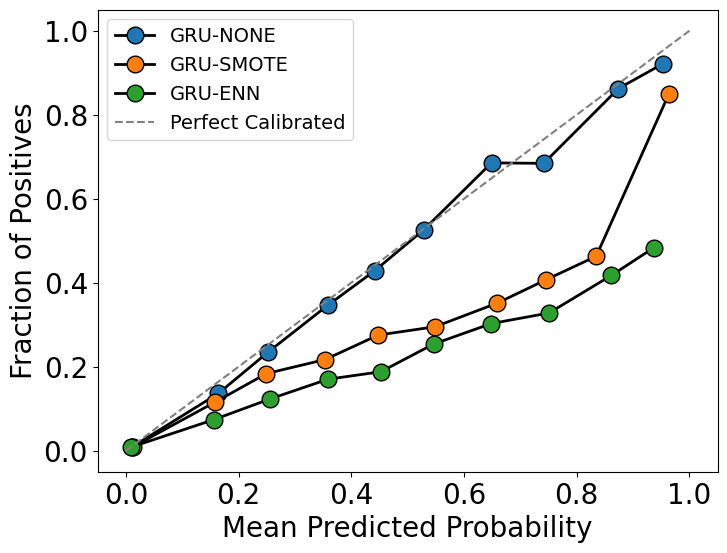

In [ ]:
prob_true_GRU, prob_pred_GRU = calibration_curve(y_test, y_pred_GRU, n_bins=10, strategy='uniform')
prob_true_GRU_ovs, prob_pred_GRU_ovs = calibration_curve(y_test, y_pred_GRU_ovs, n_bins=10, strategy='uniform')
prob_true_GRU_uns, prob_pred_GRU_uns = calibration_curve(y_test, y_pred_GRU_uns, n_bins=10, strategy='uniform')

# Compute Brier score
brier_score = brier_score_loss(y_test, y_pred_GRU)
print("Brier Score GRU:", brier_score)
brier_score = brier_score_loss(y_test, y_pred_GRU_ovs)
print("Brier Score GRU_SMOTE:", brier_score)
brier_score = brier_score_loss(y_test, y_pred_GRU_uns)
print("Brier Score GRU_ENN:", brier_score)

# Use tab10 color palette
tab10 = plt.get_cmap('tab10')

# Plot calibration curve
plt.figure(figsize=(8, 6))
plt.plot(prob_pred_GRU, prob_true_GRU, marker='o', markersize=12, linewidth=2, label='GRU-NONE', color = "black", markerfacecolor = tab10(0))
plt.plot(prob_pred_GRU_ovs, prob_true_GRU_ovs, marker='o', markersize=12, linewidth=2, label='GRU-SMOTE', color= "black", markerfacecolor = tab10(1))
plt.plot(prob_pred_GRU_uns, prob_true_GRU_uns, marker='o', markersize=12, linewidth=2, label='GRU-ENN', color= "black", markerfacecolor = tab10(2))
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Calibrated')

# Increase font sizes
plt.xlabel('Mean Predicted Probability', fontsize=20)
plt.ylabel('Fraction of Positives', fontsize=20)
# plt.title('Calibration Curves GRU', fontsize=22)
plt.xticks(fontsize=20)  # Increase tick size
plt.yticks(fontsize=20)
plt.legend(fontsize=14)
# plt.grid(True)

# Optionally save the figure in a high-quality format
plt.savefig('Calibration_Curve_GRU.pdf', format='pdf')

plt.show()

              precision    recall  f1-score   support

         0.0       0.90      0.67      0.77     30729
         1.0       0.41      0.75      0.53      9145

    accuracy                           0.69     39874
   macro avg       0.65      0.71      0.65     39874
weighted avg       0.79      0.69      0.71     39874



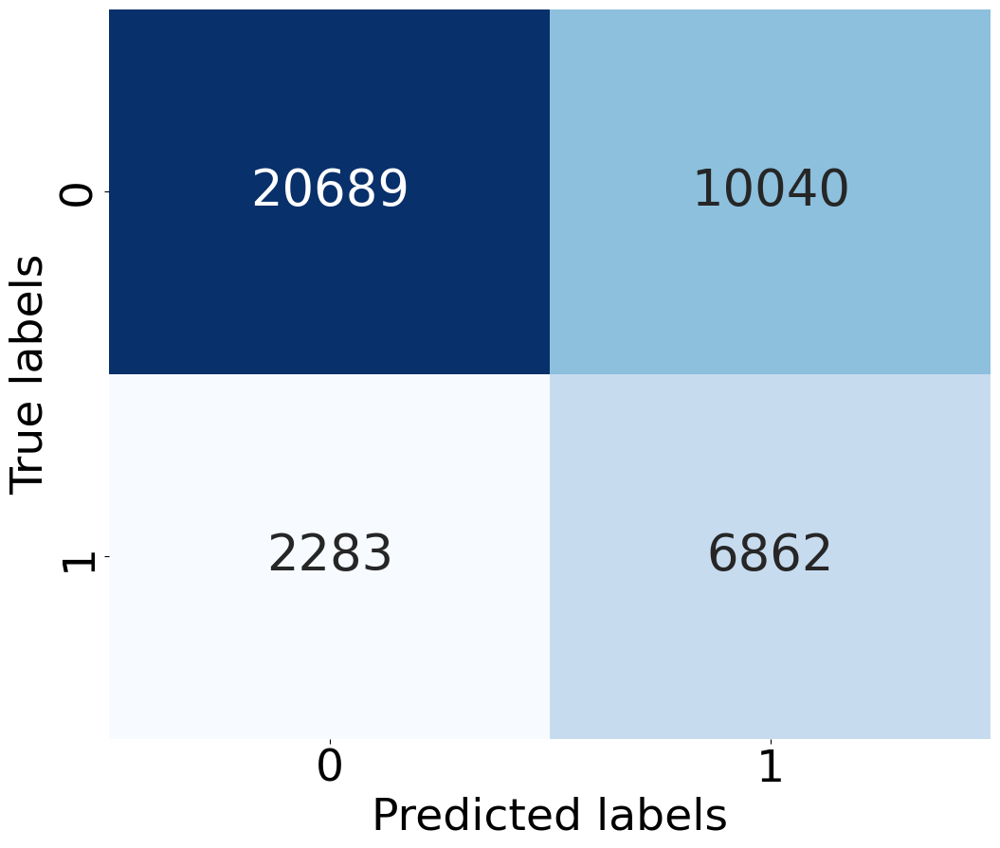

In [ ]:
# Compute confusion matrix and classification report
conf_matrix = confusion_matrix(y_test, y_pred_binary_GRU)
cr_error = classification_report(y_test, y_pred_binary_GRU)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 38})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix GRU', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_GRU.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
# Predict labels for the test set
y_pred_LSTM = model_LSTM.predict(padded_sequences_test)
y_pred_GRU = model_GRU.predict(padded_sequences_test)

1247/1247 [==============================] - 10s 8ms/step


In [ ]:
def predict_df(df):
    predictions = []
    for index, row in df.iterrows():
        sequence = row['session']
        purchase_probability = markov_model.predict_purchase_probability(sequence)
        predictions.append(purchase_probability)
    return predictions

data = {'session': X_test["session"], 'conversion': y_test}
X_test = pd.DataFrame(data)

# Make predictions on the dataframe
y_pred_markov = predict_df(X_test)

In [ ]:
y_pred_oracle = np.array([get_oracle_conversion(x) for x in padded_sequences_test])

In [ ]:
y_pred_markov = y_pred_markov[:39874]
y_pred_oracle = y_pred_oracle[:39874]

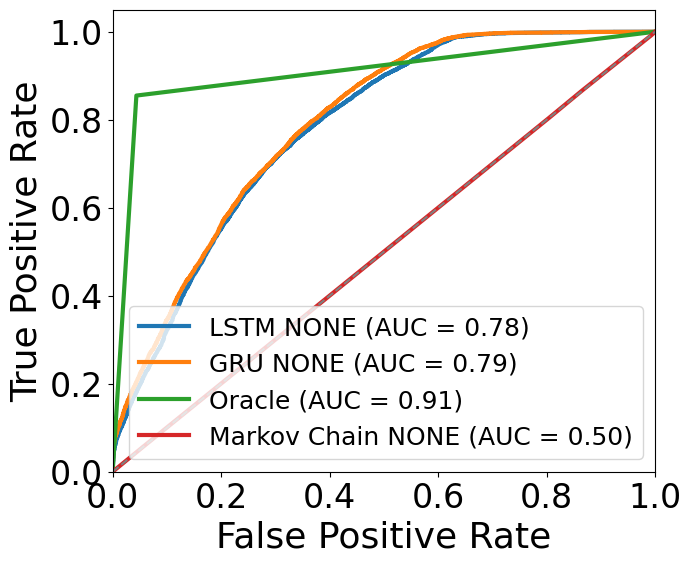

In [ ]:
# Compute ROC curve for LSTM
fpr_lstm, tpr_lstm, thresholds_lstm = roc_curve(y_test, y_pred_LSTM)
roc_auc_lstm = auc(fpr_lstm, tpr_lstm)

# Compute ROC curve for GRU
fpr_gru, tpr_gru, thresholds_gru = roc_curve(y_test, y_pred_GRU)
roc_auc_gru = auc(fpr_gru, tpr_gru)

# Compute ROC curve for Oracle
fpr_oracle, tpr_oracle, thresholds_oracle = roc_curve(y_test, y_pred_oracle)
roc_auc_oracle = auc(fpr_oracle, tpr_oracle)

# Compute ROC curve for Markov Chain
fpr_markov, tpr_markov, thresholds_markov = roc_curve(y_test, y_pred_markov)  # Adjusted true_labels to y_test
roc_auc_markov = auc(fpr_markov, tpr_markov)

# Plot ROC curve
plt.figure(figsize=(7, 6))
plt.plot(fpr_lstm, tpr_lstm, color='tab:blue', lw=3, label=f'LSTM NONE (AUC = {roc_auc_lstm:.2f})')
plt.plot(fpr_gru, tpr_gru, color='tab:orange', lw=3, label=f'GRU NONE (AUC = {roc_auc_gru:.2f})')
plt.plot(fpr_oracle, tpr_oracle, color='tab:green', lw=3, label=f'Oracle (AUC = {roc_auc_oracle:.2f})')
plt.plot(fpr_markov, tpr_markov, color='tab:red', lw=3, label=f'Markov Chain NONE (AUC = {roc_auc_markov:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=26)
plt.ylabel('True Positive Rate', fontsize=26)
# plt.title('ROC Curves', fontsize=24)
plt.legend(loc="lower right", fontsize=18)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
# plt.grid(True)
plt.savefig('ROC_Curves_without_SMOTE.pdf', format='pdf')
plt.show()

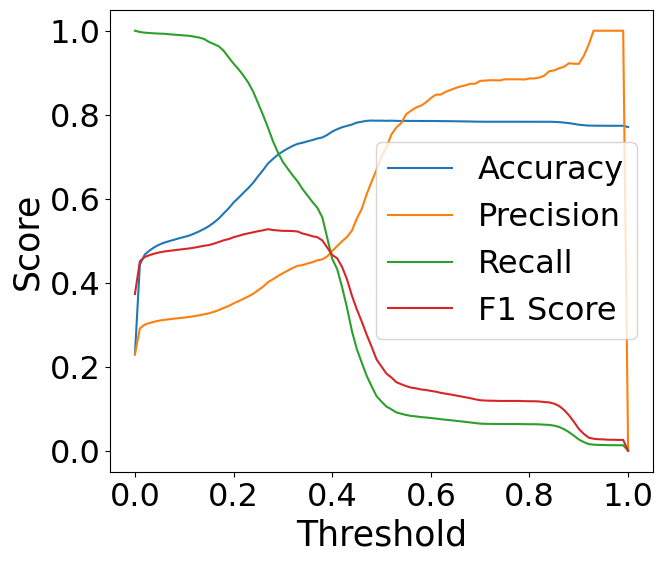

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis GRU', fontsize=30)
plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_GRU.pdf', format='pdf', bbox_inches='tight')
plt.show()

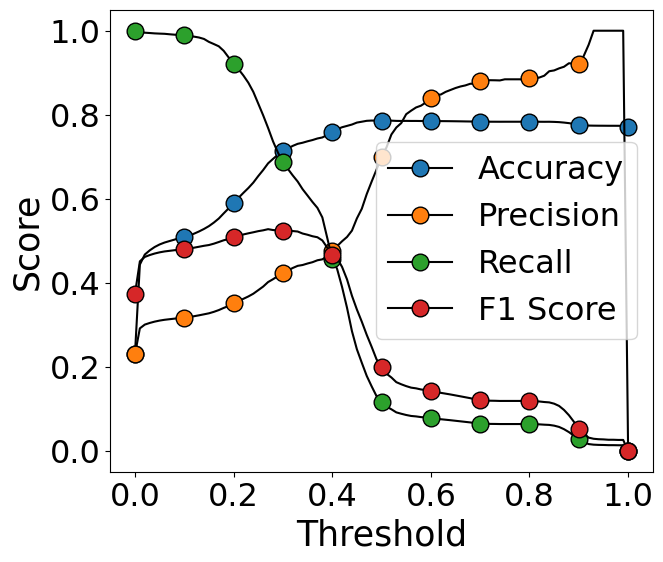

In [ ]:
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis GRU', fontsize=30)
plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_GRU.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_train = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_train, y_pred_binary_train)
    precision = precision_score(y_train, y_pred_binary_train)
    recall = recall_score(y_train, y_pred_binary_train)
    f1 = f1_score(y_train, y_pred_binary_train)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(10, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis GRU', fontsize=30)
plt.legend(fontsize=25)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
plt.grid(True)

plt.savefig('Threshold_Analysis_GRU.pdf', format='pdf')
plt.show()

ValueError: Found input variables with inconsistent numbers of samples: [159493, 39874]

Mean Probability: 0.24151507019996643
Standard Deviation: 0.1879403442144394


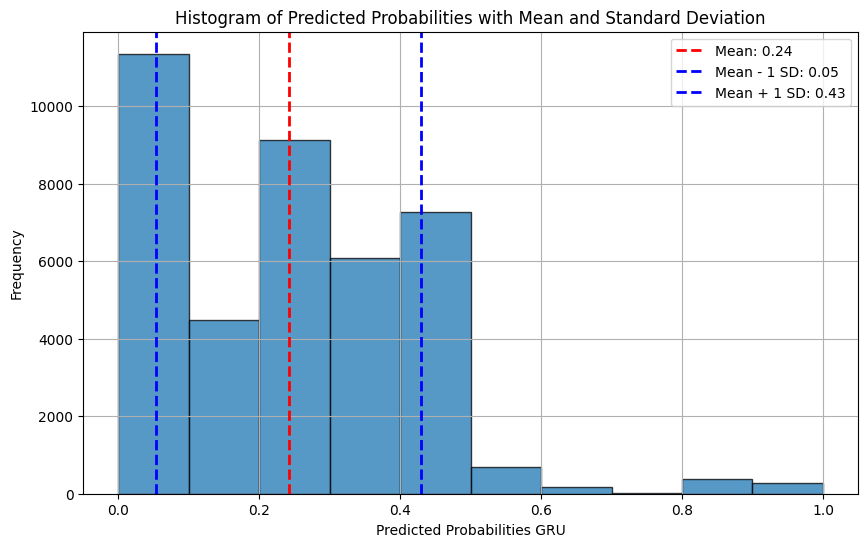

In [ ]:
# Calculate mean and standard deviation
mean_prob = np.mean(y_pred)
std_prob = np.std(y_pred)

print(f"Mean Probability: {mean_prob}")
print(f"Standard Deviation: {std_prob}")

# Plotting the probabilities with mean and standard deviation
plt.figure(figsize=(10, 6))
plt.hist(y_pred, bins=10, alpha=0.75, edgecolor='black')
plt.axvline(mean_prob, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_prob:.2f}')
plt.axvline(mean_prob - std_prob, color='blue', linestyle='dashed', linewidth=2, label=f'Mean - 1 SD: {mean_prob - std_prob:.2f}')
plt.axvline(mean_prob + std_prob, color='blue', linestyle='dashed', linewidth=2, label=f'Mean + 1 SD: {mean_prob + std_prob:.2f}')
plt.xlabel('Predicted Probabilities GRU')
plt.ylabel('Frequency')
plt.title('Histogram of Predicted Probabilities with Mean and Standard Deviation')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
X_test.head()

,session_id_hash,session
139173,b2410d2c9a0f5c3e5674b7ecfb5072e9d8cfeed51a8527...,"[1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 3, ..."
25840,2101ff15b51412a2ca58b7e266f02670345310c259a115...,"[1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, ..."
25719,20db6a581ee197ecb7b819083d1e07713c59134301d66b...,"[1, 1, 1, 1, 1, 2, 3, 1, 2, 1, 3, 1, 1, 1, 1, ..."
193479,f8666eda87b62d9ab550c7e9445ead5274b6acadebdfe2...,"[1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, ..."
50714,413508364819d4afd5d4d0246af8fb826f0ac8116b3817...,"[1, 1, 2, 3, 1, 1, 1, 1, 1]"


In [ ]:
df_train_exp_error = X_test

In [ ]:
print(len(df_train_exp_error["session"][4]))

48


In [ ]:
df_train_exp_error['session_length'] = df_train_exp_error['session'].apply(lambda x: len(x)/3)
df_train_exp_error['true'] = y_test
df_train_exp_error['exp_pred'] = y_pred_binary

# Display the updated DataFrame
df_train_exp_error.head()

,session_id_hash,session,session_length,true,exp_pred
139173,b2410d2c9a0f5c3e5674b7ecfb5072e9d8cfeed51a8527...,"[1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 3, ...",37.0,0.0,1
25840,2101ff15b51412a2ca58b7e266f02670345310c259a115...,"[1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, ...",21.0,0.0,0
25719,20db6a581ee197ecb7b819083d1e07713c59134301d66b...,"[1, 1, 1, 1, 1, 2, 3, 1, 2, 1, 3, 1, 1, 1, 1, ...",20.0,0.0,1
193479,f8666eda87b62d9ab550c7e9445ead5274b6acadebdfe2...,"[1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, ...",27.0,0.0,1
50714,413508364819d4afd5d4d0246af8fb826f0ac8116b3817...,"[1, 1, 2, 3, 1, 1, 1, 1, 1]",9.0,1.0,1


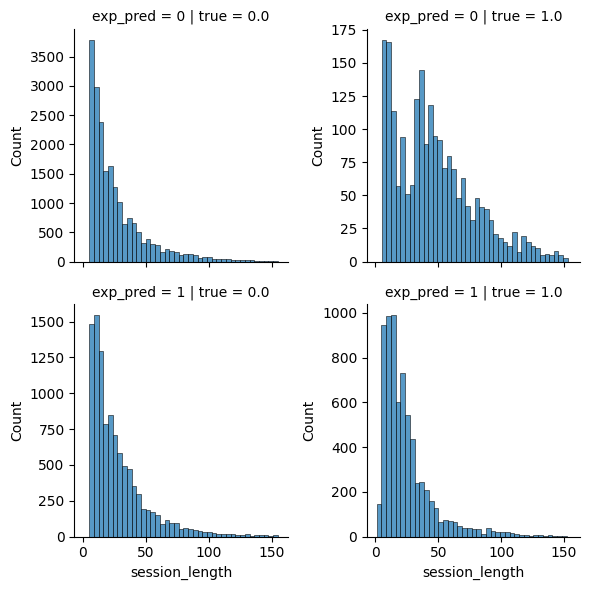

In [ ]:
g = sns.FacetGrid(df_train_exp_error, col = 'true', row = 'exp_pred', sharey=False)
g.map(sns.histplot, 'session_length', bins = 40)

In [ ]:
# model_GRU.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model_GRU.fit(X_train_reshaped, y_train, epochs=10, batch_size=128, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
935/935 [==============================] - 9s 9ms/step - loss: 0.4211 - accuracy: 0.7872 - val_loss: 0.4255 - val_accuracy: 0.7880
Epoch 2/10
935/935 [==============================] - 8s 8ms/step - loss: 0.4214 - accuracy: 0.7877 - val_loss: 0.4245 - val_accuracy: 0.7858
Epoch 3/10
935/935 [==============================] - 6s 6ms/step - loss: 0.4267 - accuracy: 0.7858 - val_loss: 0.4296 - val_accuracy: 0.7850
Epoch 4/10
935/935 [==============================] - 5s 6ms/step - loss: 0.4232 - accuracy: 0.7866 - val_loss: 0.4252 - val_accuracy: 0.7876
Epoch 5/10
935/935 [==============================] - 10s 11ms/step - loss: 0.4207 - accuracy: 0.7879 - val_loss: 0.4245 - val_accuracy: 0.7824
Epoch 6/10
935/935 [==============================] - 8s 9ms/step - loss: 0.4253 - accuracy: 0.7863 - val_loss: 0.4299 - val_accuracy: 0.7856
Epoch 7/10
935/935 [==============================] - 9s 10ms/step - loss: 0.4356 - accuracy: 0.7837 - val_loss: 0.4403 - val_accuracy: 0.7818
Epo

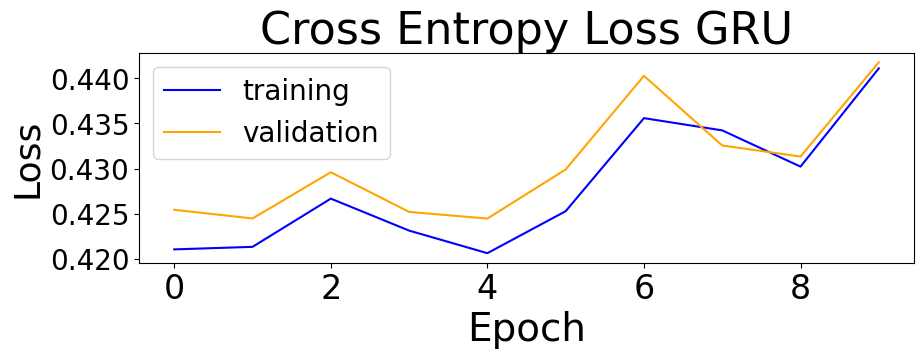

In [ ]:
# Plot Cross Entropy Loss for GRU
plt.figure(figsize=(10, 6))
plt.subplot(211)
plt.title('Cross Entropy Loss GRU', fontsize=32)
plt.plot(history.history['loss'], color='blue', label='train')
plt.plot(history.history['val_loss'], color='orange', label='test')
plt.legend(['training', 'validation'], fontsize=20)
plt.xlabel('Epoch', fontsize=28)
plt.ylabel('Loss', fontsize=26)
plt.xticks(fontsize=24)
plt.yticks(fontsize=20)
plt.savefig('Cross_Entropy_Loss_GRU.pdf', format='pdf')
plt.show()

## LSTM

In [ ]:
X_train.head()

,session_id_hash,session
317,006663e8030ec06f59b5f7b9401fc5a85fedfba541296a...,"[1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, ..."
150615,c0ea26f06f885f2e647ff6c945f64621596170c285f857...,"[1, 2, 2, 1, 1, 2, 1, 2, 1, 2, 1, 2, 3, 1, 2, ..."
191502,f5d3c2a190d0fe44b3f5cb6b093dd8e1092ac9d7f29fe4...,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, ..."
181330,e8b5f2ba42ff1168c314d7220983403053457ddf968c7b...,"[1, 2, 3, 4, 1, 4, 1, 4, 4, 1, 4, 4, 4, 4, 4, ..."
147450,bce118d59635f73d6afa0816e5fa154d7a4ce65f651a42...,"[1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 3, 1, 2, 1, 1, ..."


In [ ]:
sequences_train = X_train['session'].tolist()
sequences_test = X_test['session'].tolist()
sequences_train = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train]
sequences_test = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_test]

# Pad sequences to a fixed length
max_length = 30  # Choose the maximum length you want
padded_sequences_train = pad_sequences(sequences_train, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test = pad_sequences(sequences_test, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train = np.array(padded_sequences_train)
labels_train = np.array(y_train)
sequences_test = np.array(padded_sequences_test)
labels_test = np.array(y_test)

# Split the data into train, validation, and test sets
X_train, X_val, y_train, y_val = train_test_split(sequences_train, labels_train, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(X_train, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)


In [ ]:
# Define the GRU model with increased complexity and additional techniques
model_LSTM = Sequential([
    LSTM(32, input_shape=(None, 1)),
    Dropout(0),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])


# Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.001)
model_LSTM.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(X_train, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

# Train the model
history = model_LSTM.fit(X_train_reshaped, y_train, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
1870/1870 [==============================] - 17s 7ms/step - loss: 0.5306 - accuracy: 0.7745 - val_loss: 0.5217 - val_accuracy: 0.7791
Epoch 2/10
1870/1870 [==============================] - 13s 7ms/step - loss: 0.5002 - accuracy: 0.7794 - val_loss: 0.4800 - val_accuracy: 0.7788
Epoch 3/10
1870/1870 [==============================] - 12s 7ms/step - loss: 0.4668 - accuracy: 0.7802 - val_loss: 0.4565 - val_accuracy: 0.7809
Epoch 4/10
1870/1870 [==============================] - 13s 7ms/step - loss: 0.4507 - accuracy: 0.7805 - val_loss: 0.4588 - val_accuracy: 0.7803
Epoch 5/10
1870/1870 [==============================] - 12s 7ms/step - loss: 0.4436 - accuracy: 0.7813 - val_loss: 0.4398 - val_accuracy: 0.7822
Epoch 6/10
1870/1870 [==============================] - 14s 7ms/step - loss: 0.4390 - accuracy: 0.7817 - val_loss: 0.4367 - val_accuracy: 0.7816
Epoch 7/10
1870/1870 [==============================] - 13s 7ms/step - loss: 0.4362 - accuracy: 0.7824 - val_loss: 0.4418 - val_ac

In [ ]:
model_save_name = 'model_LSTM.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_LSTM.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM = load_model(path)

In [ ]:
# 1	batch size: 64;	Dropout: 0.00;	Learning Rate: 0.001 --> 0.52310 (Threshold = 0.27)


# 2	batch size: 32;	Dropout: 0.00;	Learning Rate: 0.001 --> 0.51586 (Threshold = 0.28)
# 3	batch size: 32;	Dropout: 0.00;	Learning Rate: 0.010 --> 0.52159 (Threshold = 0.26)
# 4	batch size: 128;	Dropout: 0.00;	Learning Rate: 0.001 --> 0.51303 (Threshold = 0.27)
# 5	batch size: 128; 	Dropout:0.00; 	Learning Rate: 0.010 -->  0.52215 (Threshold = 0.27)

In [ ]:
# Predict labels for the test set
y_pred = model_LSTM.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.28125).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train, y_pred_binary)

print("F1 Score:", f1)

3739/3739 [==============================] - 12s 3ms/step
F1 Score: 0.5216614076190733


In [ ]:
# Predict labels for the test set
y_pred_probs = model_LSTM.predict(X_train_reshaped)

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_train, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

3739/3739 [==============================] - 10s 3ms/step
Optimal Threshold: 0.28125
Optimal F1 Score: 0.5216614076190733


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train, y_pred_binary)

print("F1 Score:", f1)

3739/3739 [==============================] - 10s 2ms/step
F1 Score: 0.15813076823085923


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.28125).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.514967164900689


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.15817668257524103


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM.predict(padded_sequences_test)
y_pred_binary_LSTM = (y_pred > 0.28125).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM)

print("F1 Score:", f1)

1247/1247 [==============================] - 7s 5ms/step
F1 Score: 0.5225510494052693


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM.predict(padded_sequences_test)
y_pred_binary_LSTM = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.1588070107485233


### Hyperparameter Tuning

In [ ]:
# Suppress TensorFlow logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# Define a function to build the model
def build_model(hp):
    model = Sequential()
    model.add(LSTM(units=32, input_shape=(None, 1)))
    model.add(Dropout(rate=hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.25)))
    model.add(Dense(units=32, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    learning_rate = hp.Choice("learning_rate", [0.001, 0.01])
    batch_size = hp.Choice("batch_size", [128, 64, 32])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Initialize a GridSearch tuner
tuner = GridSearch(
    build_model,
    objective='val_loss')

# Perform the search
tuner.search(X_train_reshaped, y_train, epochs=10, validation_data=(X_val_reshaped, y_val))

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hps.values)

Trial 18 Complete [00h 04m 25s]
val_loss: 0.4362056851387024

Best val_loss So Far: 0.4253367781639099
Total elapsed time: 01h 16m 56s
Best Hyperparameters:
{'dropout': 0.0, 'learning_rate': 0.001, 'batch_size': 64}


In [ ]:
hyperparameters_data = []
for trial in tuner.oracle.get_best_trials(num_trials=len(tuner.oracle.trials)):
    hyperparameters = trial.hyperparameters.values
    val_loss = trial.score
    hyperparameters_data.append({
        'Batch Size': hyperparameters['batch_size'],
        'Dropout': hyperparameters['dropout'],
        'Learning Rate': hyperparameters['learning_rate'],
        'Validation Loss': val_loss
    })

# Create DataFrame
df_results_LSTM = pd.DataFrame(hyperparameters_data)

In [ ]:
df_results_LSTM

,Batch Size,Dropout,Learning Rate,Validation Loss
0,64,0.00,0.001,0.425337
1,32,0.00,0.001,0.427526
2,32,0.00,0.010,0.429573
3,128,0.00,0.001,0.429902
4,128,0.00,0.010,0.431657
5,32,0.25,0.001,0.432710
6,128,0.25,0.010,0.433563
7,32,0.50,0.001,0.434831
8,64,0.25,0.001,0.436001
9,32,0.50,0.010,0.436206


In [ ]:
df_results_LSTM.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_LSTM.csv", index = False)

In [ ]:
df_results_LSTM = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_LSTM.csv")

In [ ]:
results_df = df_results_LSTM

In [ ]:
fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = results_df['Validation Loss'], colorscale = 'Tealrose', showscale = True),
        dimensions = list([
            dict(range = [min(results_df['Dropout']), max(results_df['Dropout'])],
                 label = 'Dropout', values = results_df['Dropout']),
            dict(range = [min(results_df['Batch Size']), max(results_df['Batch Size'])],
                 label = 'Batch Size', values = results_df['Batch Size']),
            dict(range = [min(results_df['Learning Rate']), max(results_df['Learning Rate'])],
                 label = 'Learning Rate', values = results_df['Learning Rate']),
            dict(range = [min(results_df['Validation Loss']), max(results_df['Validation Loss'])],
                 label = 'Validation Loss', values = results_df['Validation Loss'])
        ])
    )
)

fig.show()

In [ ]:
# Define hyperparameters and F1 scores
hyperparameters = ['Dropout Rate', 'Batch Size', 'Learning Rate']
vl_scores = ['Validation Loss']

# Create pairplot
fig = ff.create_scatterplotmatrix(
    results_df,
    diag='histogram',
    index='Validation Loss',
    colormap='Rainbow',
    colormap_type='seq',
    height=800,
    width=800
)

# Update layout
fig.update_layout(
    title='Pairplot of Hyperparameters vs Validation loss',
    xaxis=dict(title='Hyperparameters'),
    yaxis=dict(title='Hyperparameters')
)

fig.show()

In [ ]:
# Create the contour plot
fig = go.Figure(data=go.Contour(
    x=results_df['Dropout'],
    y=results_df['Batch Size'],
    z=results_df['Validation Loss'],
    colorscale='Blues',  # Choose a colorscale
    colorbar=dict(title='Validation Loss'),  # Add colorbar title
))

# Create the contour plot
fig = go.Figure(data=go.Contour(
    x=results_df['Dropout'],
    y=results_df['Batch Size'],
    z=results_df['Validation Loss'],
    colorscale='Blues',  # Choose a colorscale
    colorbar=dict(
        title=dict(text='Validation Loss', font=dict(size=26)),
        thickness=50,  # Increase the thickness of the colorbar
        len=1.1,
        tickfont=dict(size=24)
    ),
))

# Update layout with increased font sizes
fig.update_layout(
#     title=dict(text='Contour Plot of Hyperparameters LSTM', font=dict(size=22)),
    xaxis=dict(title=dict(text='Dropout Rate', font=dict(size=26)), tickfont=dict(size=24)),
    yaxis=dict(title=dict(text='Batch Size', font=dict(size=26)), tickfont=dict(size=24))
)

fig.show()
pio.write_image(fig, 'hyperparameters_contour_plot_LSTM.pdf')

In [ ]:
X_val_reshaped.shape

(39874, 30, 1)

### Error Analysis

In [ ]:
y_pred_LSTM = model_LSTM.predict(padded_sequences_test)

1247/1247 [==============================] - 8s 6ms/step


In [ ]:
y_pred_LSTM_ovs = model_LSTM_ovs.predict(padded_sequences_test)

1247/1247 [==============================] - 7s 5ms/step


In [ ]:
y_pred_LSTM_uns = model_LSTM_uns.predict(padded_sequences_test)

1247/1247 [==============================] - 9s 7ms/step


Brier Score LSTM: 0.1449137130170107
Brier Score LSTM SMOTE: 0.20329834200604263
Brier Score LSTM ENN: 0.25087618987684357


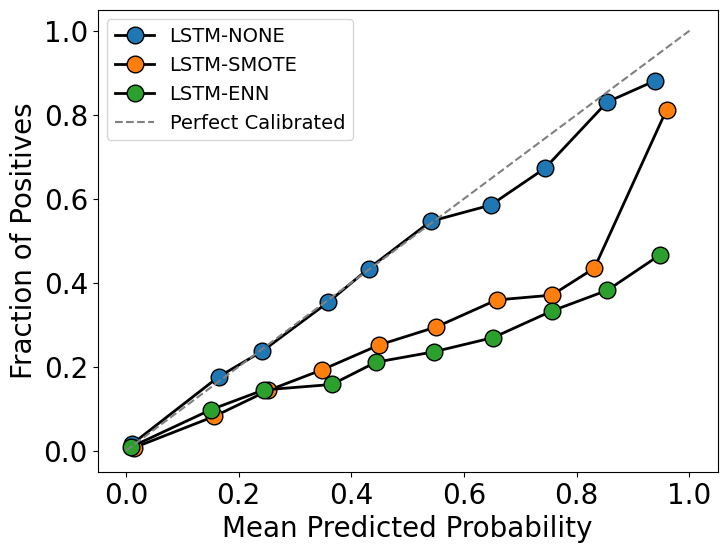

In [ ]:
prob_true_LSTM, prob_pred_LSTM = calibration_curve(y_test, y_pred_LSTM, n_bins=10, strategy='uniform')
prob_true_LSTM_ovs, prob_pred_LSTM_ovs = calibration_curve(y_test, y_pred_LSTM_ovs, n_bins=10, strategy='uniform')
prob_true_LSTM_uns, prob_pred_LSTM_uns = calibration_curve(y_test, y_pred_LSTM_uns, n_bins=10, strategy='uniform')

# Compute Brier scores
brier_score = brier_score_loss(y_test, y_pred_LSTM)
print("Brier Score LSTM:", brier_score)
brier_score = brier_score_loss(y_test, y_pred_LSTM_ovs)
print("Brier Score LSTM SMOTE:", brier_score)
brier_score = brier_score_loss(y_test, y_pred_LSTM_uns)
print("Brier Score LSTM ENN:", brier_score)

# Plot calibration curve
plt.figure(figsize=(8, 6))
plt.plot(prob_pred_LSTM, prob_true_LSTM, marker='o', markersize=12, linewidth=2, label='LSTM-NONE', color = "black", markerfacecolor = tab10(0))
plt.plot(prob_pred_LSTM_ovs, prob_true_LSTM_ovs, marker='o', markersize=12, linewidth=2, label='LSTM-SMOTE', color = "black", markerfacecolor = tab10(1))
plt.plot(prob_pred_LSTM_uns, prob_true_LSTM_uns, marker='o', markersize=12, linewidth=2, label='LSTM-ENN', color = "black", markerfacecolor = tab10(2))
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Calibrated')

# Increase font sizes for improved readability
plt.xlabel('Mean Predicted Probability', fontsize=20)
plt.ylabel('Fraction of Positives', fontsize=20)
# plt.title('Calibration Curves LSTM', fontsize=22)
plt.xticks(fontsize=20)  # Increase tick size
plt.yticks(fontsize=20)
plt.legend(fontsize=14)
# plt.grid(True)

# Optionally save the figure in high-quality format
plt.savefig('Calibration_Curve_LSTM.pdf', format='pdf')

plt.show()


              precision    recall  f1-score   support

         0.0       0.89      0.71      0.79     30729
         1.0       0.42      0.70      0.52      9145

    accuracy                           0.71     39874
   macro avg       0.65      0.70      0.65     39874
weighted avg       0.78      0.71      0.73     39874



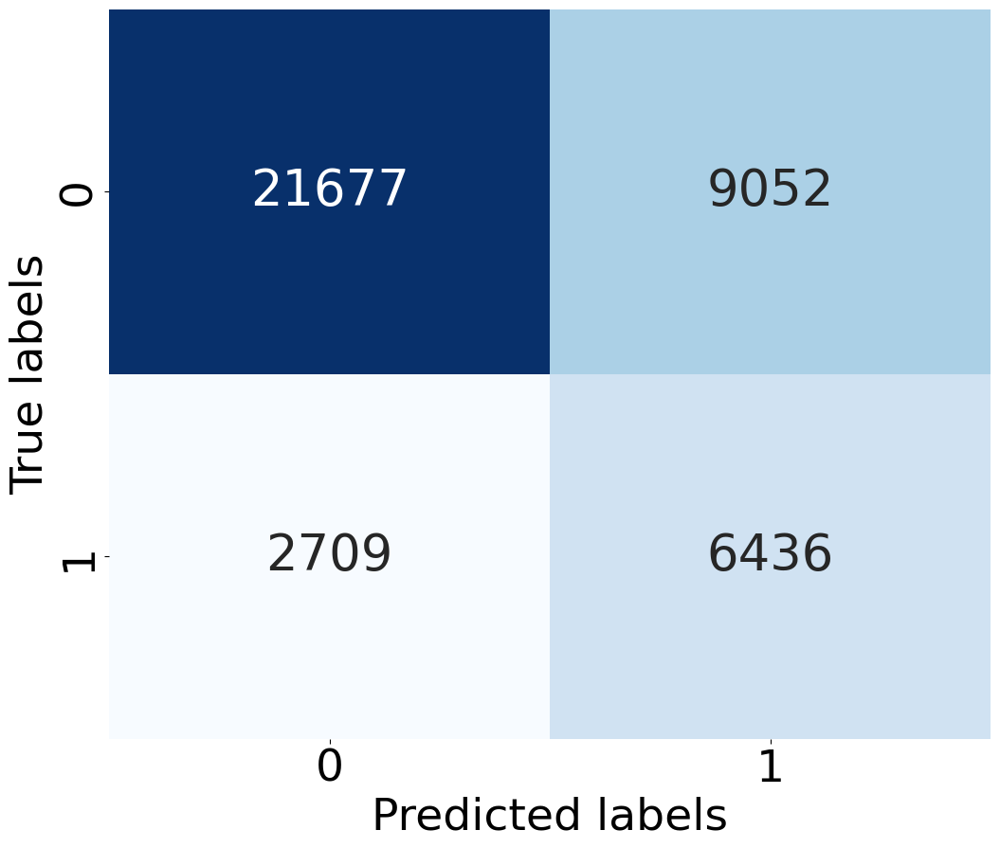

In [ ]:
# Compute confusion matrix and classification report for LSTM
conf_matrix = confusion_matrix(y_test, y_pred_binary_LSTM)
cr_error = classification_report(y_test, y_pred_binary_LSTM)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 38})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix LSTM', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_LSTM.pdf', format='pdf', bbox_inches='tight')
plt.show()

              precision    recall  f1-score   support

         0.0       0.89      0.69      0.78     30729
         1.0       0.41      0.72      0.52      9145

    accuracy                           0.70     39874
   macro avg       0.65      0.71      0.65     39874
weighted avg       0.78      0.70      0.72     39874



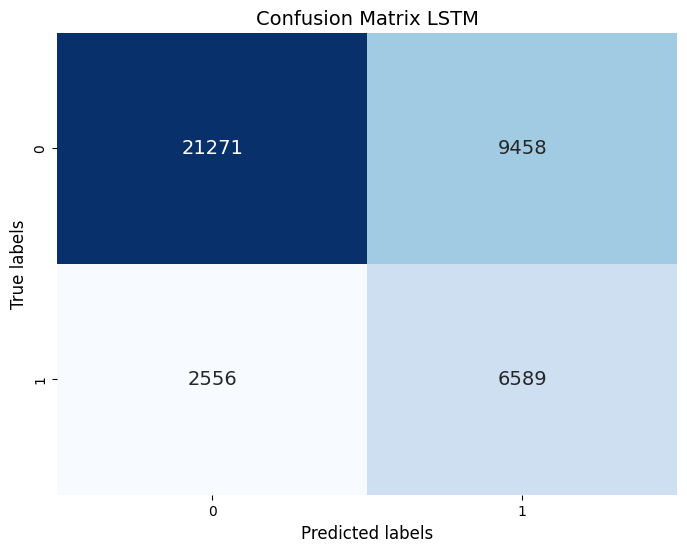

In [ ]:
# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_binary_LSTM)
cr_error = classification_report(y_test, y_pred_binary_LSTM)
print(cr_error)

# Create the plot
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 14})  # Increase font size here
plt.xlabel('Predicted labels', fontsize=12)  # Optionally increase font size of axis labels
plt.ylabel('True labels', fontsize=12)
plt.title('Confusion Matrix LSTM', fontsize=14)  # Optionally increase font size of the title
# plt.savefig('Confusion Matrix LSTM.pdf')
plt.show()

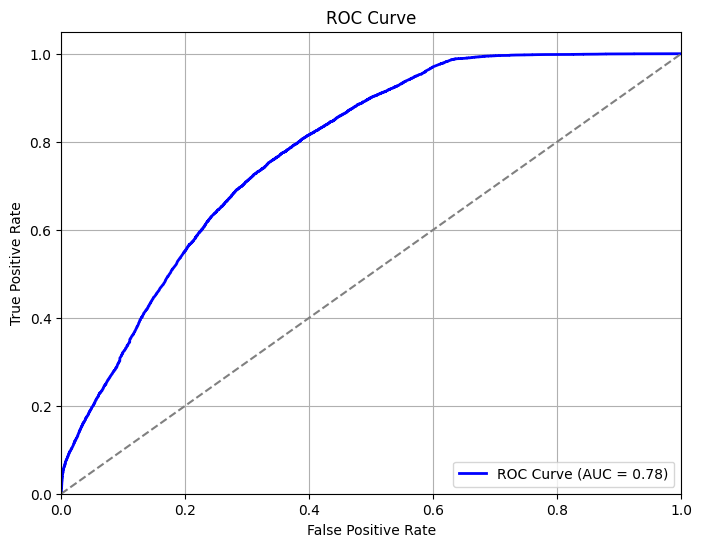

In [ ]:
# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Compute ROC-AUC score
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC Curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

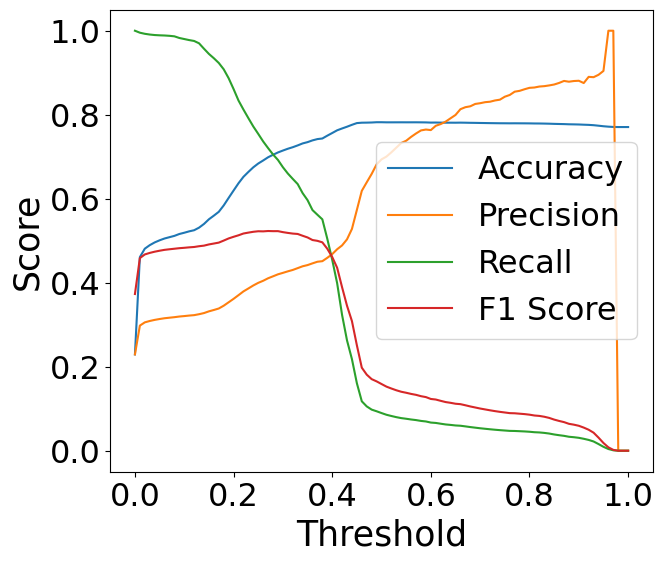

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_LSTM = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_LSTM)
    precision = precision_score(y_test, y_pred_binary_LSTM)
    recall = recall_score(y_test, y_pred_binary_LSTM)
    f1 = f1_score(y_test, y_pred_binary_LSTM)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

# Plot the evaluation metrics against thresholds
plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis LSTM', fontsize=30)
plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig('Threshold_Analysis_LSTM.pdf', format='pdf', bbox_inches='tight')
plt.show()

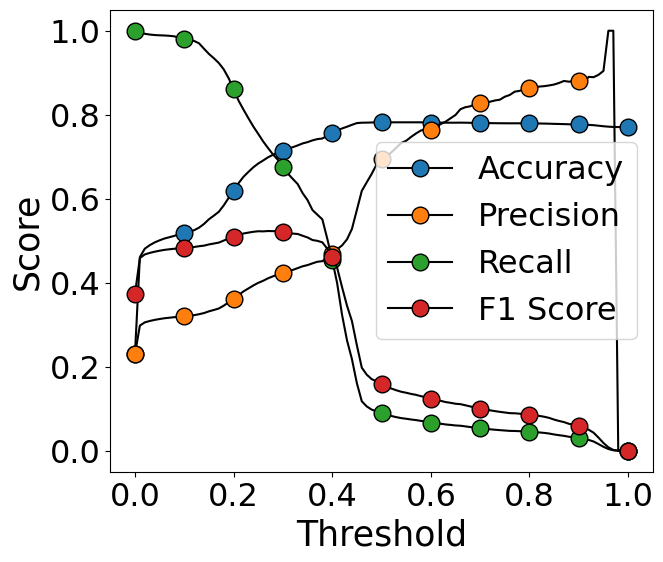

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis GRU', fontsize=30)
plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_LSTM.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
# Train the model
history = model_LSTM.fit(X_train_reshaped, y_train, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
1870/1870 [==============================] - 14s 6ms/step - loss: 0.4304 - accuracy: 0.7834 - val_loss: 0.4349 - val_accuracy: 0.7834
Epoch 2/10
1870/1870 [==============================] - 12s 6ms/step - loss: 0.4296 - accuracy: 0.7832 - val_loss: 0.4296 - val_accuracy: 0.7838
Epoch 3/10
1870/1870 [==============================] - 13s 7ms/step - loss: 0.4289 - accuracy: 0.7838 - val_loss: 0.4304 - val_accuracy: 0.7830
Epoch 4/10
1870/1870 [==============================] - 13s 7ms/step - loss: 0.4277 - accuracy: 0.7838 - val_loss: 0.4315 - val_accuracy: 0.7815
Epoch 5/10
1870/1870 [==============================] - 13s 7ms/step - loss: 0.4265 - accuracy: 0.7859 - val_loss: 0.4368 - val_accuracy: 0.7825
Epoch 6/10
1870/1870 [==============================] - 11s 6ms/step - loss: 0.4267 - accuracy: 0.7837 - val_loss: 0.4264 - val_accuracy: 0.7872
Epoch 7/10
1870/1870 [==============================] - 11s 6ms/step - loss: 0.4235 - accuracy: 0.7865 - val_loss: 0.4275 - val_ac

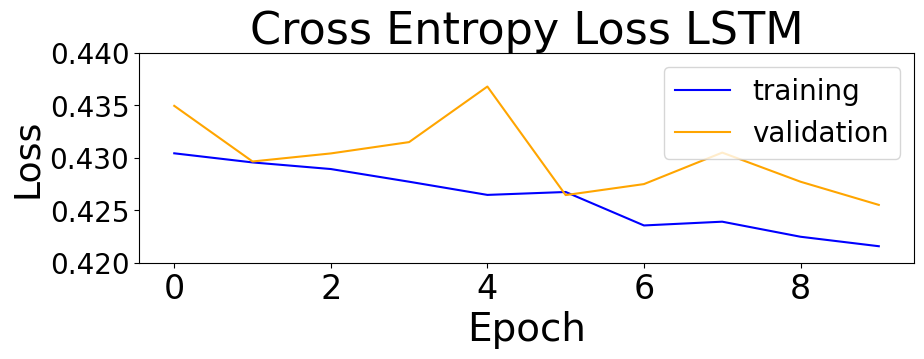

In [ ]:
# Plot Cross Entropy Loss for LSTM
plt.figure(figsize=(10, 6))
plt.subplot(211)
plt.title('Cross Entropy Loss LSTM', fontsize=32)
plt.plot(history.history['loss'], color='blue', label='train')
plt.plot(history.history['val_loss'], color='orange', label='test')
plt.legend(['training', 'validation'], fontsize=20)
plt.xlabel('Epoch', fontsize=28)
plt.ylabel('Loss', fontsize=26)
plt.xticks(fontsize=24)

# Setting the y-ticks to show only every second label
y_ticks = plt.gca().get_yticks()
plt.gca().set_yticks(y_ticks[::2])
plt.yticks(fontsize=20)

plt.savefig('Cross_Entropy_Loss_LSTM.pdf', format='pdf')
plt.show()

### SHAP

##### Kmeans

In [ ]:
# Set a fixed random seed for reproducibility
np.random.seed(42)
# Define the sample size
sample_size = 500
# Initialize StratifiedShuffleSplit
splitter = StratifiedShuffleSplit(n_splits=1, test_size=sample_size, random_state=42)
# Generate the stratified sample
for train_index, test_index in splitter.split(padded_sequences_test, labels_test):
    subset_X_test_reshaped = padded_sequences_test[test_index]
    subset_y_test = labels_test[test_index]
# Display the shape of the subset to verify
print(subset_X_test_reshaped.shape)
print(subset_y_test.shape)

(500, 30)
(500,)


In [ ]:
background_summary = shap.kmeans(subset_X_test_reshaped, 5)
kernel_explainer = shap.KernelExplainer(model_LSTM.predict, background_summary)
shap_values_test_kernel_LSTM = kernel_explainer.shap_values(subset_X_test_reshaped, verbose = False)

1/1 [==============================] - 0s 380ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

329/329 [==============================] - 1s 3ms/step


In [ ]:
np.save('/content/drive/My Drive/Thesis/Datasets/shap_values_test_kernel_LSTM.npy', shap_values_test_kernel_LSTM)

In [ ]:
file_path = '/content/drive/My Drive/Thesis/Datasets/shap_values_test_kernel_LSTM.npy'
shap_values_test_kernel_LSTM = np.load(file_path)

In [ ]:
feature_names = [f"TS {i+1}" for i in range(subset_X_test_reshaped.shape[1])]

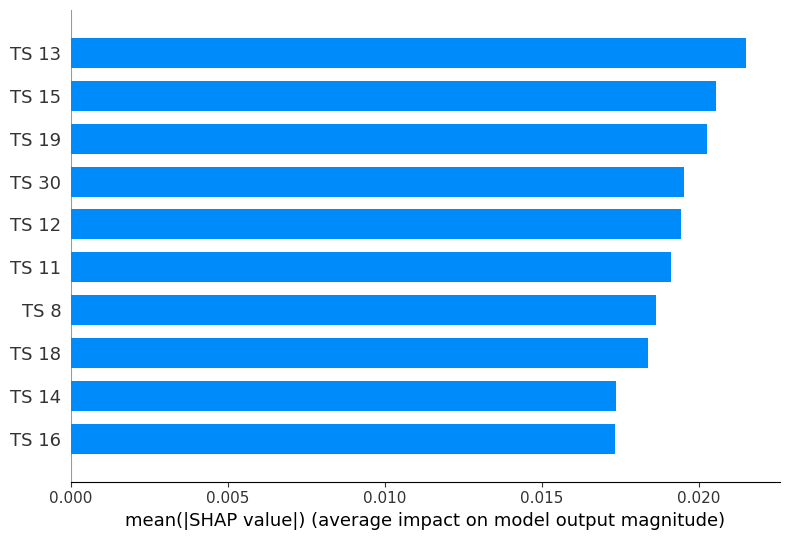

In [ ]:
# Reshape the SHAP values matrix to match the shape of the features matrix
shap_values_test_kernel_LSTM_reshaped = shap_values_test_kernel_LSTM.reshape(shap_values_test_kernel_LSTM.shape[0], shap_values_test_kernel_LSTM.shape[1], -1)

# Aggregate SHAP values across all features
shap_values_aggregated = np.mean(shap_values_test_kernel_LSTM, axis=2)

# Get the mean absolute SHAP values for each feature
mean_abs_shap_values = np.mean(np.abs(shap_values_aggregated), axis=0)

# Sort the features based on their mean absolute SHAP values
sorted_indices = np.argsort(mean_abs_shap_values)[::-1]

# Select only the top ten features
top_ten_indices = sorted_indices[:10]
top_ten_features = subset_X_test_reshaped[:, top_ten_indices]
top_ten_feature_names = [feature_names[i] for i in top_ten_indices]

# Plot the aggregated SHAP values for the top ten features
shap.summary_plot(shap_values_aggregated[:, top_ten_indices], features=top_ten_features, feature_names=top_ten_feature_names , plot_type='bar')

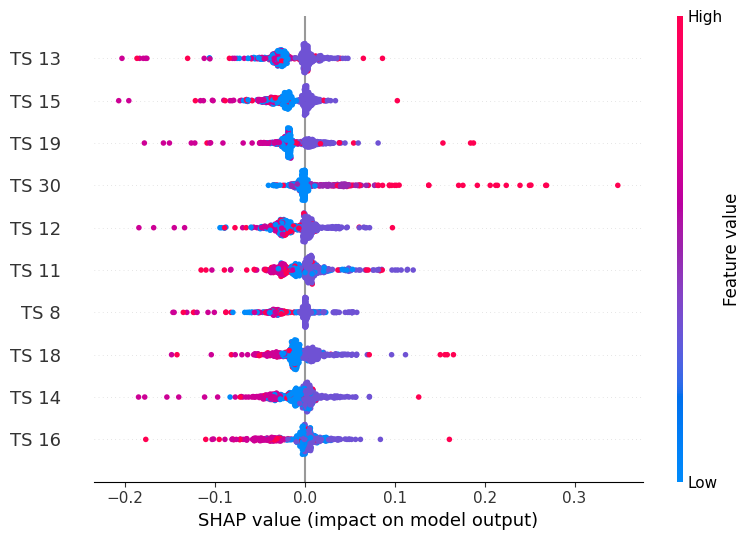

In [ ]:
shap.summary_plot(shap_values_aggregated[:, top_ten_indices], features=top_ten_features, feature_names=top_ten_feature_names)

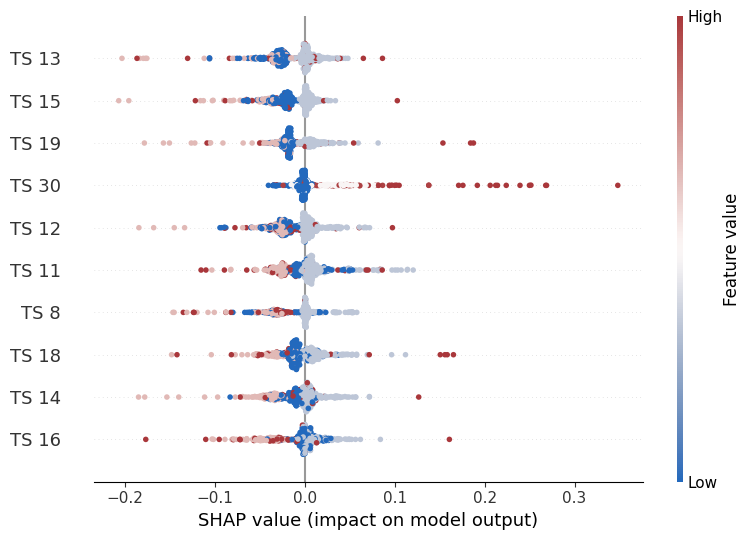

In [ ]:
# Define a simple colormap from blue to red
# colors = [(0, 0, 1, 1), (1, 0, 0, 1)]  # From blue to red
# cm = LinearSegmentedColormap.from_list("red_blue", colors, N=256)
plt.figure()
shap.summary_plot(
    shap_values_aggregated[:, top_ten_indices],
    features=top_ten_features,
    feature_names=top_ten_feature_names,
    show=False,
    cmap=cmap
)
plt.savefig('shap_summary_plot_LSTM.pdf', bbox_inches='tight')
plt.show()
plt.close()

In [ ]:
background_summary = shap.kmeans(subset_X_test_reshaped, 5)
kernel_explainer = shap.KernelExplainer(model_LSTM.predict, background_summary)

1/1 [==============================] - 0s 55ms/step


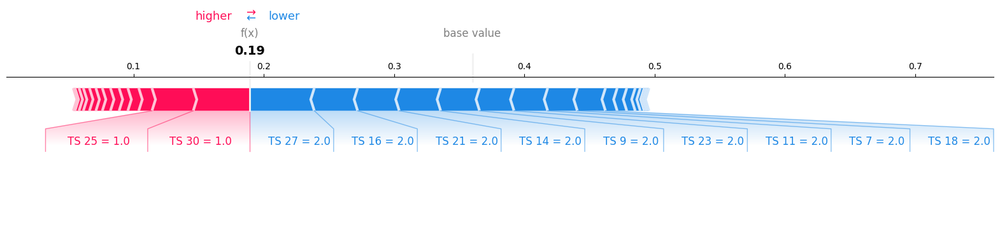

In [ ]:
# Choose an instance to explain (e.g., the first instance)
instance_index = 10

# Generate force plot for the chosen instance
shap.force_plot(kernel_explainer.expected_value, shap_values_test_kernel_LSTM[instance_index][:, 0], subset_X_test_reshaped[instance_index], matplotlib=True, feature_names= feature_names)

1247/1247 [==============================] - 5s 4ms/step


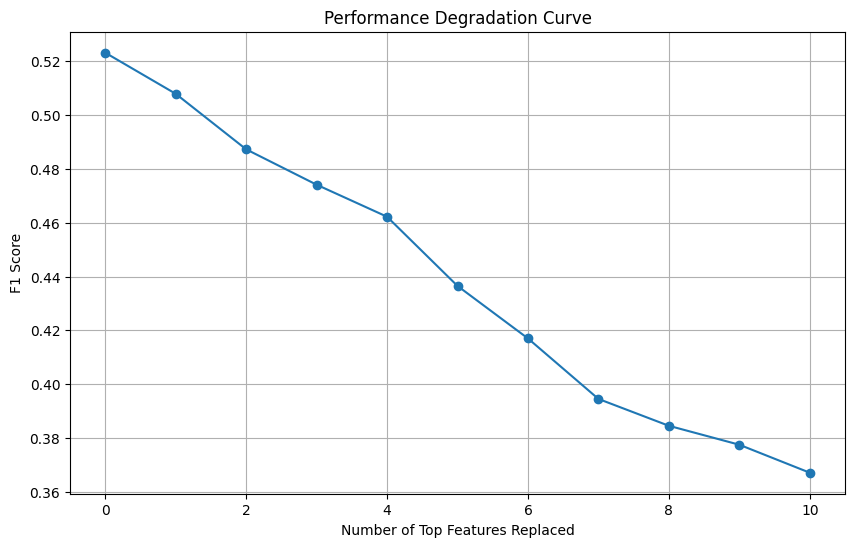

In [ ]:
# Create a copy of the test data to modify
modified_test_set = np.array(padded_sequences_test)

# Store original F1 score with unmodified data
original_pred = model_LSTM.predict(padded_sequences_test)
original_f1 = f1_score(y_test, (original_pred > 0.27).astype(int))

# Initialize a list to store F1 scores after each feature modification
f1_scores_LSTM = [original_f1]

# Replace each top feature with the majority value found in that feature
for i, feature_idx in enumerate(top_ten_indices):
    # Find the majority class for the current feature across all test data
    majority_value = np.bincount(modified_test_set[:, feature_idx]).argmax()

    # Replace this feature in all test samples with the majority class
    modified_test_set[:, feature_idx] = majority_value

    # Evaluate the model with the modified test set
    new_predictions = model_LSTM.predict(modified_test_set)
    new_f1 = f1_score(y_test, (new_predictions > 0.27).astype(int))

    # Append the new F1 score
    f1_scores_LSTM.append(new_f1)

# Plot the performance degradation curve
plt.figure(figsize=(10, 6))
plt.plot(range(len(f1_scores_LSTM)), f1_scores_LSTM, marker='o')
plt.title('Performance Degradation Curve')
plt.xlabel('Number of Top Features Replaced')
plt.ylabel('F1 Score')
plt.grid(True)

In [ ]:
f1_scores_LSTM = [0.5231025722451572,
 0.5078510202533566,
 0.48723168684595874,
 0.4740918897888444,
 0.4621942321723437,
 0.43649692181772887,
 0.4170001008708517,
 0.39454367892133696,
 0.38456939680941443,
 0.37753481553872464,
 0.3671444639921553]

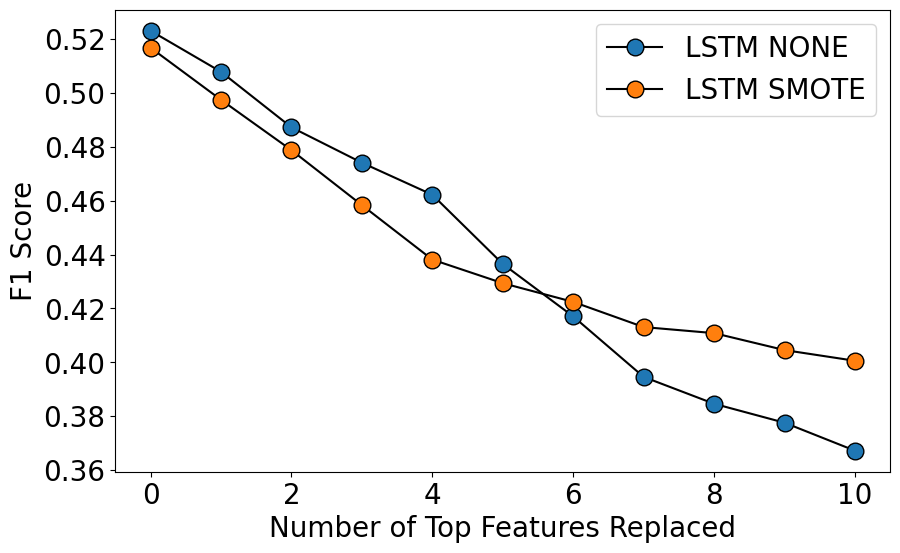

In [ ]:
# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(range(len(f1_scores_LSTM)), f1_scores_LSTM, markersize = 12, color = "black", markerfacecolor = tab10(0), marker='o', label='LSTM NONE')
plt.plot(range(len(f1_scores_LSTM_ovs)), f1_scores_LSTM_ovs, markersize = 12, color = "black", markerfacecolor = tab10(1), marker='o', label='LSTM SMOTE')

# Adding title and labels with increased font size
# plt.title('Performance Degradation Curves LSTM', fontsize=22)  # Increase font size for the title
plt.xlabel('Number of Top Features Replaced', fontsize=20)  # Increase font size for x-axis label
plt.ylabel('F1 Score', fontsize=20)  # Increase font size for y-axis label

# Increase font size for tick labels on both axes
plt.xticks(fontsize=20)  # Increase font size for x-axis tick labels
plt.yticks(fontsize=20)  # Increase font size for y-axis tick labels

# plt.grid(True)

# Increase font size for the legend
plt.legend(fontsize=20)

# Save the plot to a PDF file
plt.savefig('Performance Degradation Curves LSTM.pdf', bbox_inches='tight')
# Show the plot
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(range(len(f1_scores_LSTM)), f1_scores_LSTM, marker='o', label='LSTM')
plt.plot(range(len(f1_scores_LSTM_ovs)), f1_scores_LSTM_ovs, marker='o', label='LSTM with SMOTE')

# Adding title and labels with increased font size
plt.title('Performance Degradation Curves LSTM', fontsize=16)  # Increase font size for the title
plt.xlabel('Number of Top Features Replaced', fontsize=14)  # Increase font size for x-axis label
plt.ylabel('F1 Score', fontsize=14)  # Increase font size for y-axis label

# Increase font size for tick labels on both axes
plt.xticks(fontsize=12)  # Increase font size for x-axis tick labels
plt.yticks(fontsize=12)  # Increase font size for y-axis tick labels

plt.grid(True)

# Increase font size for the legend
plt.legend(fontsize=12)

# Save the plot to a PDF file
plt.savefig('Performance Degradation Curves LSTM.pdf')
# Show the plot
plt.show()

##### Both classes

In [ ]:
# Filter the dataset for "cart abandonment" sessions (target = 0)
cart_abandonment_sessions = df_train[df_train["conversion"] == 0][["session_id_hash", "session"]]
sequences_train_ca = cart_abandonment_sessions['session'].tolist()
sequences_train_ca = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_ca]
max_length = 30  # Choose the maximum length you want
padded_sequences_ca = pad_sequences(sequences_train_ca, maxlen= max_length, padding='post', truncating='post')

# Filter the dataset for "purchase" sessions (target = 1)
purchase_sessions = df_train[df_train["conversion"] == 1][["session_id_hash", "session"]]
sequences_train_pu = purchase_sessions['session'].tolist()
sequences_train_pu = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_pu]
max_length = 30  # Choose the maximum length you want
padded_sequences_pu = pad_sequences(sequences_train_pu, maxlen= max_length, padding='post', truncating='post')

In [ ]:
# Set a fixed random seed
np.random.seed(42)

sample_size = 100
sample_indices = np.random.choice(len(padded_sequences_ca), size=sample_size, replace=False)
subset_X_test_reshaped_ca = padded_sequences_ca[sample_indices]

sample_indices = np.random.choice(len(padded_sequences_pu), size=sample_size, replace=False)
subset_X_test_reshaped_pu = padded_sequences_pu[sample_indices]

In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped_ca, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_LSTM.predict, background_summary)

# Compute SHAP values for the test data
shap_values_class0 = kernel_explainer.shap_values(subset_X_test_reshaped_ca)

1/1 [==============================] - 0s 329ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

330/330 [==============================] - 1s 2ms/step


In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped_pu, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_LSTM.predict, background_summary)

# Compute SHAP values for the test data
shap_values_class1 = kernel_explainer.shap_values(subset_X_test_reshaped_pu)

1/1 [==============================] - 0s 19ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

329/329 [==============================] - 1s 3ms/step


In [ ]:
# Define feature names based on the time steps in the sequence
# TS = Time Step
feature_names = [f"TS {i+1}" for i in range(subset_X_test_reshaped_ca.shape[1])]

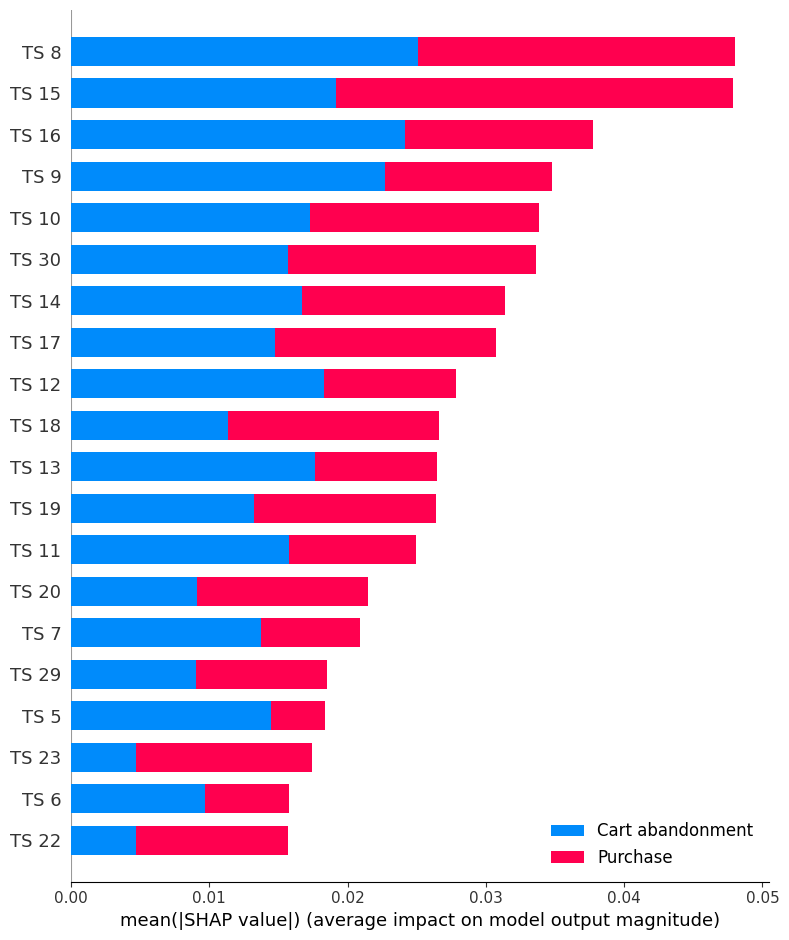

In [ ]:
# Reshape the SHAP values matrix to match the shape of the features matrix for each class
shap_values_class0_reshaped = shap_values_class0.reshape(shap_values_class0.shape[0], shap_values_class0.shape[1], -1)
shap_values_class1_reshaped = shap_values_class1.reshape(shap_values_class1.shape[0], shap_values_class1.shape[1], -1)

# Aggregate SHAP values across all features for each class
shap_values_class0_aggregated = np.mean(shap_values_class0, axis=2)
shap_values_class1_aggregated = np.mean(shap_values_class1, axis=2)

# Create a matplotlib figure and axis
fig, ax = plt.subplots()

# Plot the aggregated SHAP values for the top ten features for both classes in one summary plot
shap.summary_plot([shap_values_class0_aggregated, shap_values_class1_aggregated],
                  feature_names=feature_names,
                  plot_type='bar',
                  class_names=['Cart abandonment', 'Purchase'],
                  show=False)  # Prevents immediate showing of the plot

# Save the figure as a PDF
plt.savefig('shap_summary_plot_LSTM.pdf', bbox_inches='tight')  # Save as PDF

# If you want to display the plot as well, uncomment the next line
# plt.show()

## Oracle

In [ ]:
X_test.head()

,session_id_hash,session
139173,b2410d2c9a0f5c3e5674b7ecfb5072e9d8cfeed51a8527...,"[1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 3, ..."
25840,2101ff15b51412a2ca58b7e266f02670345310c259a115...,"[1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, ..."
25719,20db6a581ee197ecb7b819083d1e07713c59134301d66b...,"[1, 1, 1, 1, 1, 2, 3, 1, 2, 1, 3, 1, 1, 1, 1, ..."
193479,f8666eda87b62d9ab550c7e9445ead5274b6acadebdfe2...,"[1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, ..."
50714,413508364819d4afd5d4d0246af8fb826f0ac8116b3817...,"[1, 1, 2, 3, 1, 1, 1, 1, 1]"


In [ ]:
symbolised_sessions = sequences_test
labels = labels_test

In [ ]:
d = defaultdict(lambda: defaultdict(int))
for session, label in zip(symbolised_sessions, labels):
    d[str(tuple(session))][label] += 1
# print(d)
print(list(d.items())[:5])

[('(1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 3, 2, 1, 1, 1, 2, 3, 1, 4, 1, 1, 1, 1, 1, 1, 2)', defaultdict(<class 'int'>, {0.0: 1})), ('(1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 3, 3, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0)', defaultdict(<class 'int'>, {0.0: 1})), ('(1, 1, 1, 1, 1, 2, 3, 1, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)', defaultdict(<class 'int'>, {0.0: 1})), ('(1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0)', defaultdict(<class 'int'>, {0.0: 1})), ('(1, 1, 2, 3, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)', defaultdict(<class 'int'>, {1.0: 6, 0.0: 7}))]


In [ ]:
oracle = {}
for session in d.keys():
    n_buy, n_ws = 0, 0
    for label in d[session].keys():
        if label:
            n_buy += d[session][label]
        else:
            n_ws += d[session][label]
    oracle[session] = n_buy / (n_buy + n_ws)

print(list(oracle.items())[:15])

[('(1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 3, 2, 1, 1, 1, 2, 3, 1, 4, 1, 1, 1, 1, 1, 1, 2)', 0.0), ('(1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 3, 3, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0)', 0.0), ('(1, 1, 1, 1, 1, 2, 3, 1, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)', 0.0), ('(1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0)', 0.0), ('(1, 1, 2, 3, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)', 0.46153846153846156), ('(2, 1, 3, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1, 2, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1)', 1.0), ('(1, 2, 1, 2, 3, 1, 1, 1, 1, 2, 1, 3, 1, 1, 2, 1, 1, 1, 1, 2, 3, 1, 2, 1, 1, 1, 1, 1, 1, 0)', 1.0), ('(1, 2, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 2, 3, 4, 1, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0)', 1.0), ('(1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1)', 1.0), ('(1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 2, 3, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
def get_oracle_conversion(actions):
    key = str(tuple(actions))
    probability = oracle.get(key, None)
    if probability is not None:
        if random.random() < probability:
            return 1
        else:
            return 0
    else:
        return None

sessions_test = sequences_test
# sessions_test = sessions_test.to_list()
# sessions_test = [[int(num) for num in item.strip("[]").split(', ')] for item in sessions_test]
labels_test = y_test.to_list()

data = {'session': sessions_test.tolist(), 'conversion': labels_test}
X_test = pd.DataFrame(data)

In [ ]:
# Apply the function to create the new column
X_test['oracle_conversion'] = X_test['session'].apply(get_oracle_conversion)
X_test.head(15)

,session_id_hash,session,oracle_conversion
139173,b2410d2c9a0f5c3e5674b7ecfb5072e9d8cfeed51a8527...,"[1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 3, ...",None
25840,2101ff15b51412a2ca58b7e266f02670345310c259a115...,"[1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, ...",None
25719,20db6a581ee197ecb7b819083d1e07713c59134301d66b...,"[1, 1, 1, 1, 1, 2, 3, 1, 2, 1, 3, 1, 1, 1, 1, ...",None
193479,f8666eda87b62d9ab550c7e9445ead5274b6acadebdfe2...,"[1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, ...",None
50714,413508364819d4afd5d4d0246af8fb826f0ac8116b3817...,"[1, 1, 2, 3, 1, 1, 1, 1, 1]",None
111725,8eed15d52f7f65f511b552741c8cba6ddb31088446bcd1...,"[2, 1, 3, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, ...",None
4189,0559459ca26945dcc6a26a56c1e93106c492c1471523b9...,"[1, 2, 1, 2, 3, 1, 1, 1, 1, 2, 1, 3, 1, 1, 2, ...",None
42360,3686d0cde93c1e4d24629ebc87159e1a0d059d48d46552...,"[1, 2, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, ...",None
183028,eaea78e2da537b582ba2097da1f09f3ae23ac262a6b995...,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ...",None
172824,ddbadff6b1bb9c110df1e30cd0b48e1f6075b8c8e4ce9e...,"[1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 2, 3, 1, ...",None


In [ ]:
oracle_label = X_test['oracle_conversion'].tolist()
f1 = f1_score(labels, oracle_label)
print("F1 Score:", f1)

F1 Score: 0.8470973017170891


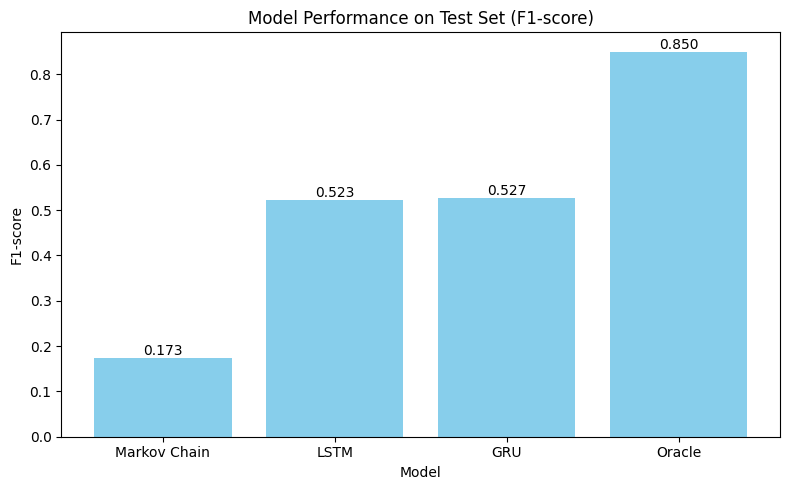

In [ ]:
data = {
    'Model': ['Markov Chain', 'LSTM', 'GRU', 'Oracle'],
    'F1-score': [0.173, 0.523, 0.527, 0.850]
}

df_test = pd.DataFrame(data)

# Plotting
fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(df_test['Model'], df_test['F1-score'], color='skyblue')

# Adding numbers to the bars
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.3f}', ha='center', va='bottom')  # Improved alignment

# Customize the plot
ax.set_title('Model Performance on Test Set (F1-score)')
ax.set_ylabel('F1-score')
ax.set_xlabel('Model')
plt.xticks(rotation=0)

# Show plot
plt.tight_layout()

# Save the plot as a PDF file
plt.savefig('Model_Performance_F1_Score.pdf')

plt.show()


# Models with adressing class imbalance

Train-Test Split

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed_trimmed.csv")

In [ ]:
X = df_train[["session_id_hash", "session"]]  # Features
y = df_train["conversion"]  # Target variable

# Splitting the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_train.head()

,session_id_hash,session
317,006663e8030ec06f59b5f7b9401fc5a85fedfba541296a...,"[1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, ..."
150615,c0ea26f06f885f2e647ff6c945f64621596170c285f857...,"[1, 2, 2, 1, 1, 2, 1, 2, 1, 2, 1, 2, 3, 1, 2, ..."
191502,f5d3c2a190d0fe44b3f5cb6b093dd8e1092ac9d7f29fe4...,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, ..."
181330,e8b5f2ba42ff1168c314d7220983403053457ddf968c7b...,"[1, 2, 3, 4, 1, 4, 1, 4, 4, 1, 4, 4, 4, 4, 4, ..."
147450,bce118d59635f73d6afa0816e5fa154d7a4ce65f651a42...,"[1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 3, 1, 2, 1, 1, ..."


## Oversampling SMOTE

### Markov Chain

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed.csv")

In [ ]:
df_train = df_train.groupby('session_id_hash').agg({'product_action_symb': list, 'conversion': 'first'}).reset_index()

In [ ]:
df_train = df_train.rename(columns={'product_action_symb': 'session'})
df_train.head(10)

,session_id_hash,session,conversion
0,00000114e1075962f022114fcfc17f2d874e694ac5d201...,"[1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, ...",0.0
1,000010504025397b03290c7457e0e7ef7ae93529f21eae...,"[2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, ...",0.0
2,0000913afa22ba9c31efb992bcf6388b0bbfe28056bef3...,"[1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, ...",0.0
3,00010d84aca1294479304044207fd268f63228844779c6...,"[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, ...",0.0
4,0001368d732951035a7ef7ef42b345a5c50b7d66966749...,"[1, 2, 3, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1]",0.0
5,0001c180fb742f96ff388ba8f67a568e6fa66aed30d0d2...,"[1, 1, 1, 1, 2, 3, 4, 1, 2, 1, 1, 1, 4, 4, 4, ...",1.0
6,00024a2cbef8be2015bf16d355226c4b4d60b4e5216dea...,"[1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",0.0
7,0002629c632e1d3211649ba4498194a13a280c35c6bd57...,"[1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 4, ...",1.0
8,00029b95dceb71ae63445fb5fdc844104aabd047793277...,"[1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, ...",0.0
9,0002cc06d46d4835503b88e9eed2c8fc1ae97f5cc262a9...,"[1, 2, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, ...",0.0


In [ ]:
X = df_train[["session_id_hash", "session"]]  # Features
y = df_train["conversion"]  # Target variable

# Splitting the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
sequences_train = X_train['session'].tolist()
sequences_test = X_test['session'].tolist()

# Pad sequences to a fixed length
max_length = 30
padded_sequences_train = pad_sequences(sequences_train, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test = pad_sequences(sequences_test, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train = np.array(padded_sequences_train)
labels_train = np.array(y_train)
sequences_test = np.array(padded_sequences_test)
labels_test = np.array(y_test)

In [ ]:
print("Class distribution before oversampling:", Counter(labels_train))
# transform the dataset
oversample = SMOTE(sampling_strategy = 'minority', k_neighbors = 3)

sequences_train_res, labels_train_res = oversample.fit_resample(sequences_train, labels_train)
# Print the distribution of classes after oversampling
print("Class distribution after oversampling:", Counter(labels_train_res))

Class distribution before oversampling: Counter({0.0: 122918, 1.0: 36594})
Class distribution after oversampling: Counter({0.0: 122918, 1.0: 122918})


In [ ]:
def get_transitions(sessions):
    n_events = len(set(item for session in sessions for item in session if item != 0))
    transitions = np.zeros((n_events, n_events))
    for session in sessions:
        for i, event in enumerate(session):
            # If the event is not 0 and there is a next event in the session
            if event != 0 and i < len(session) - 1:
                transitions[event - 1, session[i + 1] - 1] += 1
    row_sums = transitions.sum(axis=1)
    return transitions / row_sums[:, np.newaxis]

# Example usage
transitions_session = get_transitions(sequences_train_res)

In [ ]:
transitions_session[:7]

array([[6.62630031e-01, 2.20274452e-01, 4.41885827e-02, 2.13212094e-02,
        5.15857256e-02],
       [7.70037914e-01, 9.72569301e-02, 1.09119521e-01, 8.88594051e-03,
        1.46996943e-02],
       [7.72347228e-01, 6.10558676e-02, 4.63142418e-02, 8.82246383e-02,
        3.20580238e-02],
       [4.56000520e-01, 1.65959152e-02, 6.47863377e-02, 4.38240454e-01,
        2.43767733e-02],
       [6.60147341e-01, 2.07554055e-03, 5.81607518e-04, 7.18456345e-04,
        3.36477055e-01]])

<Axes: >

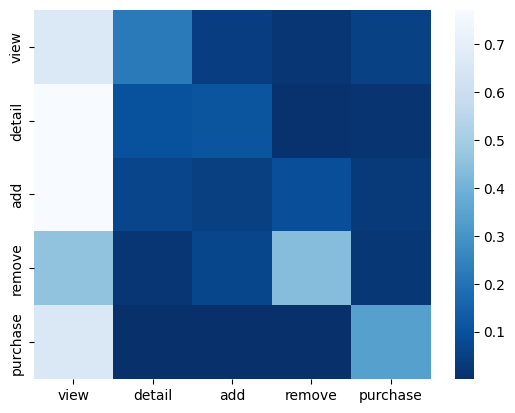

In [ ]:
actions = ["view", "detail", "add", "remove", "purchase"]
sns.heatmap(transitions_session, cmap='Blues_r',xticklabels = actions, yticklabels = actions)
# We read the heatmap as a conditional probability from the row event to the column event

In [ ]:
class MarkovChain:
    def __init__(self, transition_matrix, actions):
        self.transition_matrix = transition_matrix
        self.actions = actions

    def predict_purchase_probability(self, sequence):
        final_state = sequence[-1]  # Last action in the sequence
        purchase_probability = self.transition_matrix[final_state - 1][self.actions.index(5)]
        return purchase_probability

actions = [1, 2, 3, 4, 5]
# Example usage:
transition_matrix = np.array([[6.62562203e-01, 2.20348671e-01, 4.41439490e-02, 2.12582739e-02, 5.16869033e-02],
                              [7.69961220e-01, 9.73072879e-02, 1.09393509e-01, 8.66784157e-03, 1.46701420e-02],
                              [7.71892124e-01, 6.10777769e-02, 4.63974452e-02, 8.84723873e-02, 3.21602667e-02],
                              [4.56471727e-01, 1.59406969e-02, 6.50517488e-02, 4.37958547e-01, 2.45772806e-02],
                              [6.61405568e-01, 1.97148750e-03, 6.83752892e-04, 6.26773484e-04, 3.35312418e-01]])

markov_model = MarkovChain(transition_matrix, actions)

# Example clickstream sequence
clickstream_sequence = [1, 2, 3, 4, 4, 5]

# Predict purchase probability
purchase_probability = markov_model.predict_purchase_probability(clickstream_sequence)
print("Probability of purchase:", purchase_probability)

Probability of purchase: 0.335312418


In [ ]:
def predict_df(df):
    predictions = []
    true_labels = []
    for index, row in df.iterrows():
        sequence = row['session']
        purchase_probability = markov_model.predict_purchase_probability(sequence)
        predicted_label = 1 if purchase_probability > random.random() else 0
        predictions.append(predicted_label)
        true_labels.append(row['conversion'])
    return predictions, true_labels

data = {'session': X_train["session"], 'conversion': y_train}
X_train = pd.DataFrame(data)

# Make predictions on the dataframe
predicted_labels, true_labels = predict_df(X_train)

# Calculate F1 score
f1 = f1_score(true_labels, predicted_labels)
print("F1 Score:", f1)

F1 Score: 0.18797333160722376


In [ ]:
def predict_df(df):
    predictions = []
    true_labels = []
    for index, row in df.iterrows():
        sequence = row['session']
        purchase_probability = markov_model.predict_purchase_probability(sequence)
        predicted_label = 1 if purchase_probability > random.random() else 0
        predictions.append(predicted_label)
        true_labels.append(row['conversion'])
    return predictions, true_labels

data = {'session': X_test["session"], 'conversion': y_test}
X_test = pd.DataFrame(data)

# Make predictions on the dataframe
predicted_labels_mv_ovs, true_labels = predict_df(X_test)

# Calculate F1 score
f1 = f1_score(true_labels, predicted_labels_mv_ovs)
print("F1 Score:", f1)

F1 Score: 0.18248622167789347


#### Error Analysis

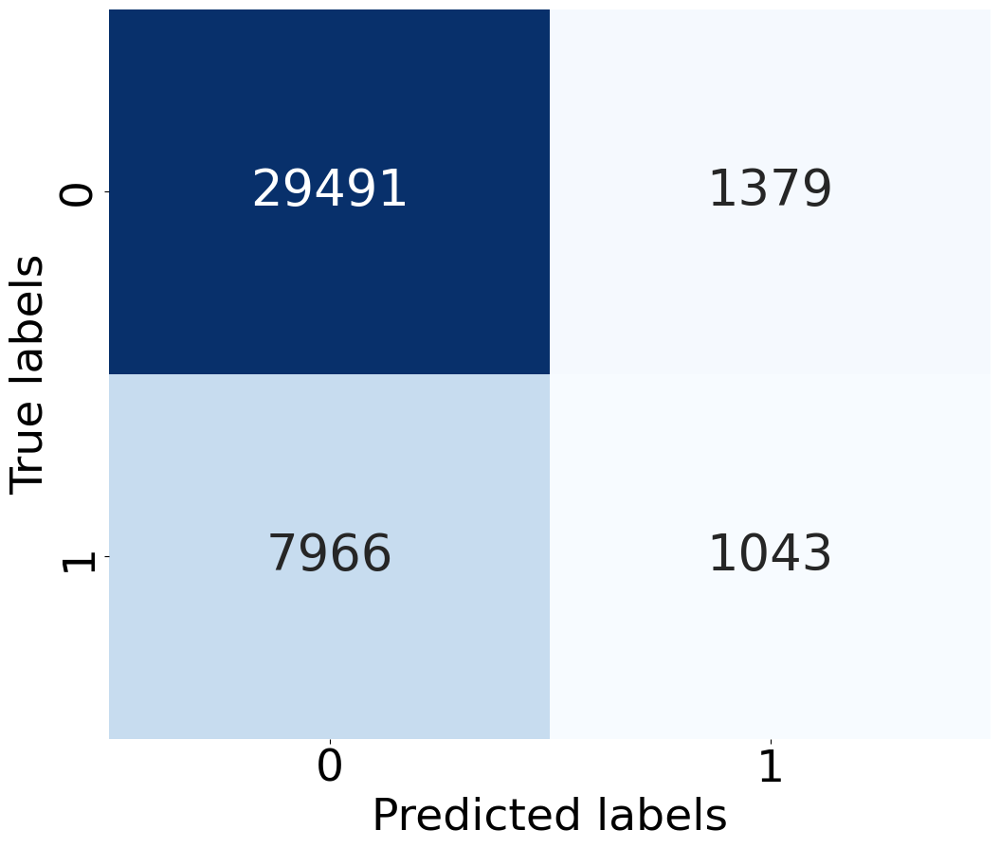

In [ ]:
conf_matrix = confusion_matrix(true_labels, predicted_labels_mv_ovs)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 38})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix Markov Chain SMOTE', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_MV_SMOTE.pdf', format='pdf', bbox_inches='tight')
plt.show()

### GRU

In [ ]:
sequences_train = X_train['session'].tolist()
sequences_test = X_test['session'].tolist()
sequences_train = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train]
sequences_test = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_test]

# Pad sequences to a fixed length
max_length = 30
padded_sequences_train = pad_sequences(sequences_train, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test = pad_sequences(sequences_test, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train = np.array(padded_sequences_train)
labels_train = np.array(y_train)
sequences_test = np.array(padded_sequences_test)
labels_test = np.array(y_test)

In [ ]:
# Split the data into train, validation, and test sets
X_train, X_val, y_train, y_val = train_test_split(sequences_train, labels_train, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(X_train, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

In [ ]:
print("Class distribution before oversampling:", Counter(labels_train))
# transform the dataset
oversample = SMOTE(sampling_strategy = 'minority', k_neighbors = 3)

padded_sequences_train_res, labels_train_res = oversample.fit_resample(X_train, y_train)
# Print the distribution of classes after oversampling
print("Class distribution after oversampling:", Counter(labels_train_res))

Class distribution before oversampling: Counter({0.0: 123059, 1.0: 36434})
Class distribution after oversampling: Counter({0.0: 92300, 1.0: 92300})


In [ ]:
# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(padded_sequences_train_res, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

t-SNE

In [ ]:
# Get the total number of instances
total_instances = len(padded_sequences_train_res)
sample_size = 10000

# Generate random indices for sampling
random_indices = np.random.choice(total_instances, sample_size, replace=False)

# Sample sessions and labels using the random indices
sampled_sessions = padded_sequences_train_res[random_indices]
sampled_labels = labels_train_res[random_indices]

In [ ]:
tsne = TSNE(perplexity=30, learning_rate=200)

# Fit and transform the data to reduce dimensionality
X_embedded = tsne.fit_transform(sampled_sessions)

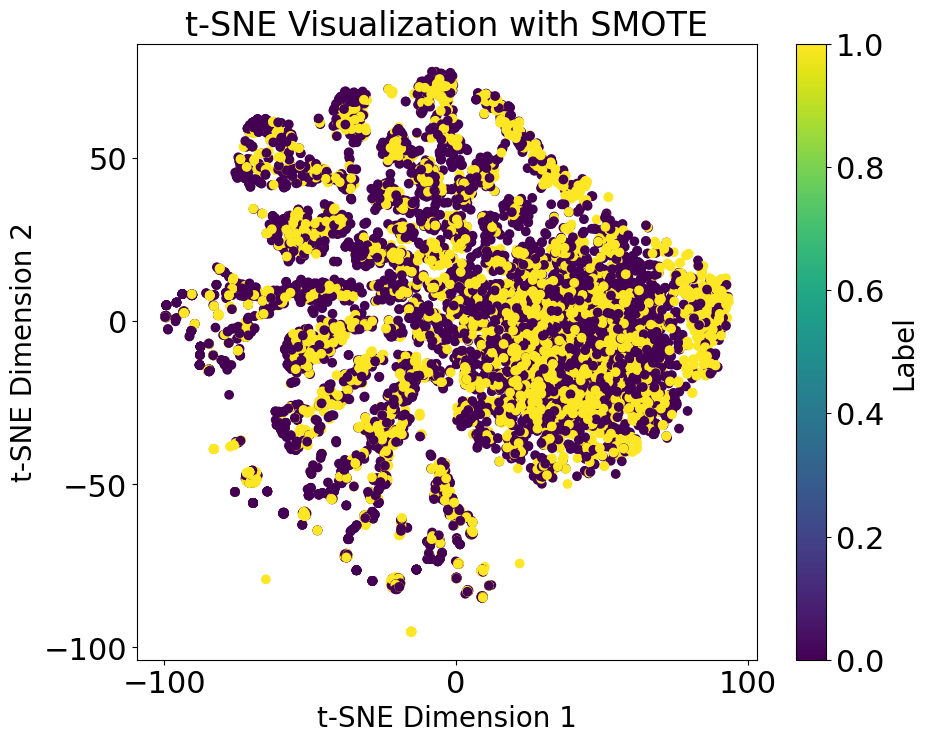

In [ ]:
# Plot the embedded data
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_embedded[:, 0], X_embedded[:, 1], marker='o', c=sampled_labels)
plt.title('t-SNE Visualization with SMOTE', fontsize=24)  # Increase title font size
plt.xlabel('t-SNE Dimension 1', fontsize=20)  # Increase x-axis label font size
plt.ylabel('t-SNE Dimension 2', fontsize=20)  # Increase y-axis label font size
plt.xticks(fontsize=22)  # Increase x-axis tick font size
plt.yticks(fontsize=22)  # Increase y-axis tick font size

# Create a colorbar with increased font size
cbar = plt.colorbar(scatter)
cbar.set_label('Label', fontsize=20)  # Set colorbar label font size
cbar.ax.tick_params(labelsize=22)  # Set colorbar tick label font size

# Save the plot to a PDF file
plt.savefig('t_SNE_with_SMOTE.pdf', format='pdf')
plt.show()

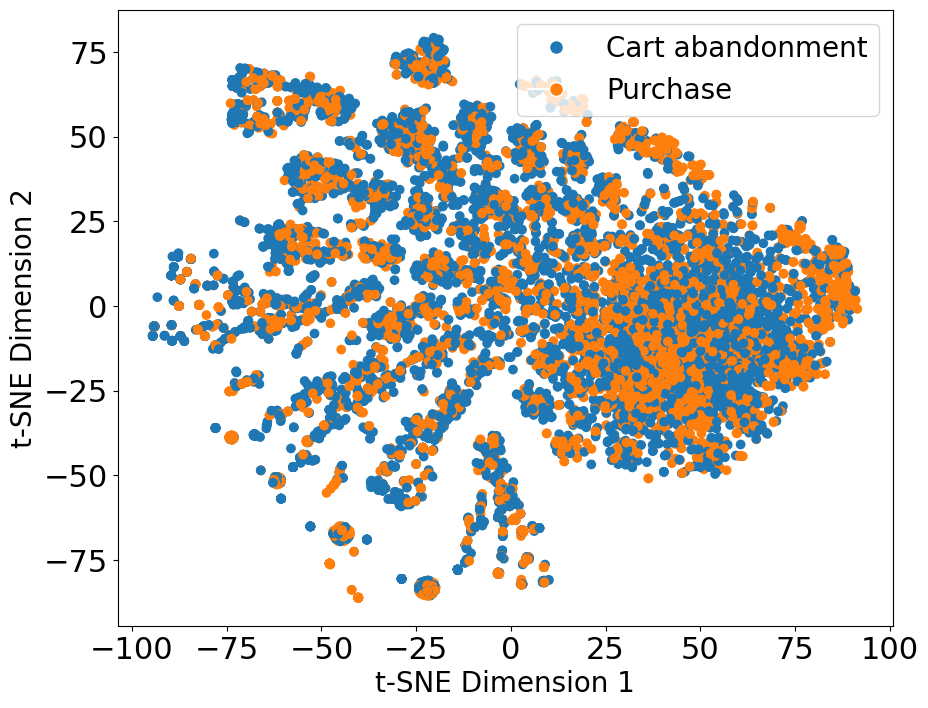

In [ ]:
# Plot the embedded data
plt.figure(figsize=(10, 8))

# Define colors for the scatter plot
colors = ['tab:blue' if label == 0 else 'tab:orange' for label in sampled_labels]

scatter = plt.scatter(X_embedded[:, 0], X_embedded[:, 1], marker='o', c=colors)
# plt.title('t-SNE Visualization with SMOTE', fontsize=24)  # Increase title font size
plt.xlabel('t-SNE Dimension 1', fontsize=20)  # Increase x-axis label font size
plt.ylabel('t-SNE Dimension 2', fontsize=20)  # Increase y-axis label font size
plt.xticks(fontsize=22)  # Increase x-axis tick font size
plt.yticks(fontsize=22)  # Increase y-axis tick font size

# Create legend
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:blue', markersize=10, label='Cart abandonment'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:orange', markersize=10, label='Purchase')
], fontsize=20)

# Save the plot to a PDF file
plt.savefig('t_SNE_with_SMOTE.pdf', format='pdf')
plt.show()


In [ ]:
model_GRU_ovs = Sequential([
    GRU(32, input_shape=(None, 1)),
    Dropout(0.25),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.001)
model_GRU_ovs.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model_GRU_ovs.fit(X_train_reshaped, labels_train_res, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
2885/2885 [==============================] - 26s 8ms/step - loss: 0.6257 - accuracy: 0.6118 - val_loss: 0.5427 - val_accuracy: 0.6674
Epoch 2/10
2885/2885 [==============================] - 21s 7ms/step - loss: 0.5191 - accuracy: 0.7339 - val_loss: 0.5466 - val_accuracy: 0.6646
Epoch 3/10
2885/2885 [==============================] - 25s 9ms/step - loss: 0.5052 - accuracy: 0.7438 - val_loss: 0.5491 - val_accuracy: 0.6678
Epoch 4/10
2885/2885 [==============================] - 18s 6ms/step - loss: 0.4986 - accuracy: 0.7488 - val_loss: 0.5441 - val_accuracy: 0.6754
Epoch 5/10
2885/2885 [==============================] - 25s 9ms/step - loss: 0.4927 - accuracy: 0.7522 - val_loss: 0.5243 - val_accuracy: 0.6892
Epoch 6/10
2885/2885 [==============================] - 18s 6ms/step - loss: 0.4888 - accuracy: 0.7546 - val_loss: 0.5197 - val_accuracy: 0.6940
Epoch 7/10
2885/2885 [==============================] - 17s 6ms/step - loss: 0.4852 - accuracy: 0.7563 - val_loss: 0.5255 - val_ac

In [ ]:
model_save_name = 'model_GRU_ovs.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_ovs.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_GRU_ovs.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_ovs = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_GRU_ovs.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.41503).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(labels_train_res, y_pred_binary)

print("F1 Score:", f1)

5769/5769 [==============================] - 14s 2ms/step
F1 Score: 0.7890234029155402


In [ ]:
# Predict labels for the test set
y_pred_probs = model_GRU_ovs.predict(X_train_reshaped)

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(labels_train_res, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

5769/5769 [==============================] - 14s 2ms/step
Optimal Threshold: 0.4150390625
Optimal F1 Score: 0.7890271386095487


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_ovs.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(labels_train_res, y_pred_binary)

print("F1 Score:", f1)

5769/5769 [==============================] - 14s 2ms/step
F1 Score: 0.7828259250062081


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_ovs.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.41503).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 3ms/step
F1 Score: 0.5153990311516566


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_ovs.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.5102174836790667


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_ovs.predict(padded_sequences_test)
y_pred_binary_GRU_ovs = (y_pred > 0.41503).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_ovs)

print("F1 Score:", f1)

1247/1247 [==============================] - 18s 14ms/step
F1 Score: 0.5147189060894825


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_ovs.predict(padded_sequences_test)
y_pred_binary_GRU_ovs = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_ovs)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.5123633826835129


In [ ]:
y_pred[12]

array([0.7410738], dtype=float32)

In [ ]:
# 1	batch size: 128;	Dropout: 0.00;	Learning Rate: 0.001 --> 0.51334 (Threshold = 0.36)
# 2	batch size: 128;	Dropout: 0.25;	Learning Rate: 0.001 --> 0.51335 (Threshold = 0.40)

# 3	batch size: 64;	Dropout: 0.25;	Learning Rate: 0.001 --> 0.51627 (Threshold = 0.40)

# 4	batch size: 64;	Dropout: 0.50;	Learning Rate: 0.001 --> 0.50874 (Threshold = 0.46)
# 5	batch size: 128; 	Dropout:0.50; 	Learning Rate: 0.001 --> 0.50932 (Threshold = 0.40)

#### Hyperparameter Tuning

In [ ]:
# Suppress TensorFlow logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# Define a function to build the model
def build_model(hp):
    model = Sequential()
    model.add(GRU(units=32, input_shape=(None, 1)))
    model.add(Dropout(rate=hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.25)))
    model.add(Dense(units=32, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    learning_rate = hp.Choice("learning_rate", [0.001, 0.01])
    batch_size = hp.Choice("batch_size", [128, 64, 32])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Initialize a GridSearch tuner
tuner = GridSearch(
    build_model,
    objective='val_loss')

# Perform the search
tuner.search(X_train_reshaped, labels_train_res, epochs=10, validation_data=(X_val_reshaped, y_val))

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hps.values)

Trial 18 Complete [00h 06m 24s]
val_loss: 0.5174962282180786

Best val_loss So Far: 0.4959281384944916
Total elapsed time: 01h 53m 21s
Best Hyperparameters:
{'dropout': 0.0, 'learning_rate': 0.001, 'batch_size': 128}


In [ ]:
hyperparameters_data = []
for trial in tuner.oracle.get_best_trials(num_trials=len(tuner.oracle.trials)):
    hyperparameters = trial.hyperparameters.values
    val_loss = trial.score
    hyperparameters_data.append({
        'Batch Size': hyperparameters['batch_size'],
        'Dropout': hyperparameters['dropout'],
        'Learning Rate': hyperparameters['learning_rate'],
        'Validation Loss': val_loss
    })

# Create DataFrame
df_results_GRU_ovs = pd.DataFrame(hyperparameters_data)

In [ ]:
df_results_GRU_ovs

,Batch Size,Dropout,Learning Rate,Validation Loss
0,128,0.00,0.001,0.495928
1,128,0.25,0.001,0.497792
2,64,0.25,0.001,0.499961
3,64,0.50,0.001,0.501572
4,128,0.50,0.001,0.502043
5,32,0.50,0.001,0.502931
6,32,0.25,0.001,0.503379
7,64,0.25,0.010,0.505081
8,32,0.00,0.001,0.512470
9,32,0.50,0.010,0.517496


In [ ]:
df_results_GRU_ovs.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_GRU_ovs.csv", index = False)

In [ ]:
df_results_GRU_ovs = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_GRU_ovs.csv")

In [ ]:
results_df = df_results_GRU_ovs

In [ ]:
def plot_parcoords(results_df):
    fig = go.Figure(data=
        go.Parcoords(
            line=dict(color=results_df['Validation Loss'], colorscale='Tealrose', showscale=True),
            dimensions=[
                dict(range=[min(results_df['Dropout']), max(results_df['Dropout'])],
                     label='Dropout', values=results_df['Dropout']),
                dict(range=[min(results_df['Batch Size']), max(results_df['Batch Size'])],
                     label='Batch Size', values=results_df['Batch Size']),
                dict(range=[min(results_df['Learning Rate']), max(results_df['Learning Rate'])],
                     label='Learning Rate', values=results_df['Learning Rate']),
                dict(range=[min(results_df['Validation Loss']), max(results_df['Validation Loss'])],
                     label='Validation Loss', values=results_df['Validation Loss'])
            ])
        )

    fig.show()

# Call the function with your dataframe
plot_parcoords(results_df)


In [ ]:
# Define hyperparameters and F1 scores
hyperparameters = ['Dropout Rate', 'Batch Size', 'Learning Rate']
vl_scores = ['Validation Loss']

# Create pairplot
fig = ff.create_scatterplotmatrix(
    results_df,
    diag='histogram',
    index='Validation Loss',
    colormap='Rainbow',
    colormap_type='seq',
    height=800,
    width=800
)

# Update layout
fig.update_layout(
    title='Pairplot of Hyperparameters vs Validation loss',
    xaxis=dict(title='Hyperparameters'),
    yaxis=dict(title='Hyperparameters')
)

fig.show()

In [ ]:
import plotly.graph_objects as go
import plotly.io as pio

# Create the contour plot
fig = go.Figure(data=go.Contour(
    x=results_df['Dropout'],
    y=results_df['Learning Rate'],
    z=results_df['Validation Loss'],
    colorscale='Blues',  # Choose a colorscale
    colorbar=dict(
        title=dict(text='Validation Loss', font=dict(size=26)),
        thickness=50,  # Increase the thickness of the colorbar
        len=1.1,
        tickfont=dict(size=24)
    ),
))

# Update layout with increased font sizes
fig.update_layout(
#     title=dict(text='Contour Plot of Hyperparameters GRU SMOTE', font=dict(size=22)),
    xaxis=dict(title=dict(text='Dropout Rate', font=dict(size=26)), tickfont=dict(size=24)),
    yaxis=dict(title=dict(text='Learning Rate', font=dict(size=26)), tickfont=dict(size=24))
)

fig.show()
pio.write_image(fig, 'hyperparameters_contour_plot_GRU_SMOTE.pdf')

#### Error Analysis

Brier Score: 0.19032967136524762


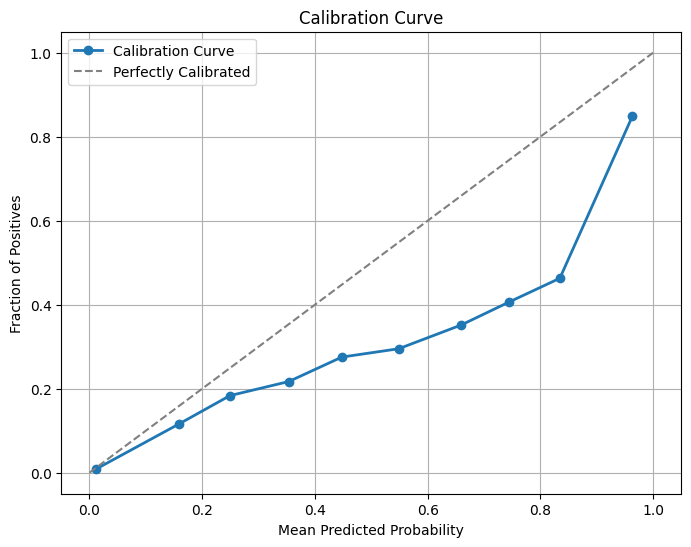

In [ ]:
prob_true, prob_pred = calibration_curve(y_test, y_pred, n_bins=10, strategy='uniform')

# Compute Brier score
brier_score = brier_score_loss(y_test, y_pred)
print("Brier Score:", brier_score)

# Plot calibration curve
plt.figure(figsize=(8, 6))
plt.plot(prob_pred, prob_true, marker='o', linewidth=2, label='Calibration Curve')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly Calibrated')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Curve')
plt.legend()
plt.grid(True)
plt.show()

              precision    recall  f1-score   support

         0.0       0.91      0.62      0.73     30729
         1.0       0.38      0.79      0.51      9145

    accuracy                           0.66     39874
   macro avg       0.65      0.70      0.62     39874
weighted avg       0.79      0.66      0.68     39874



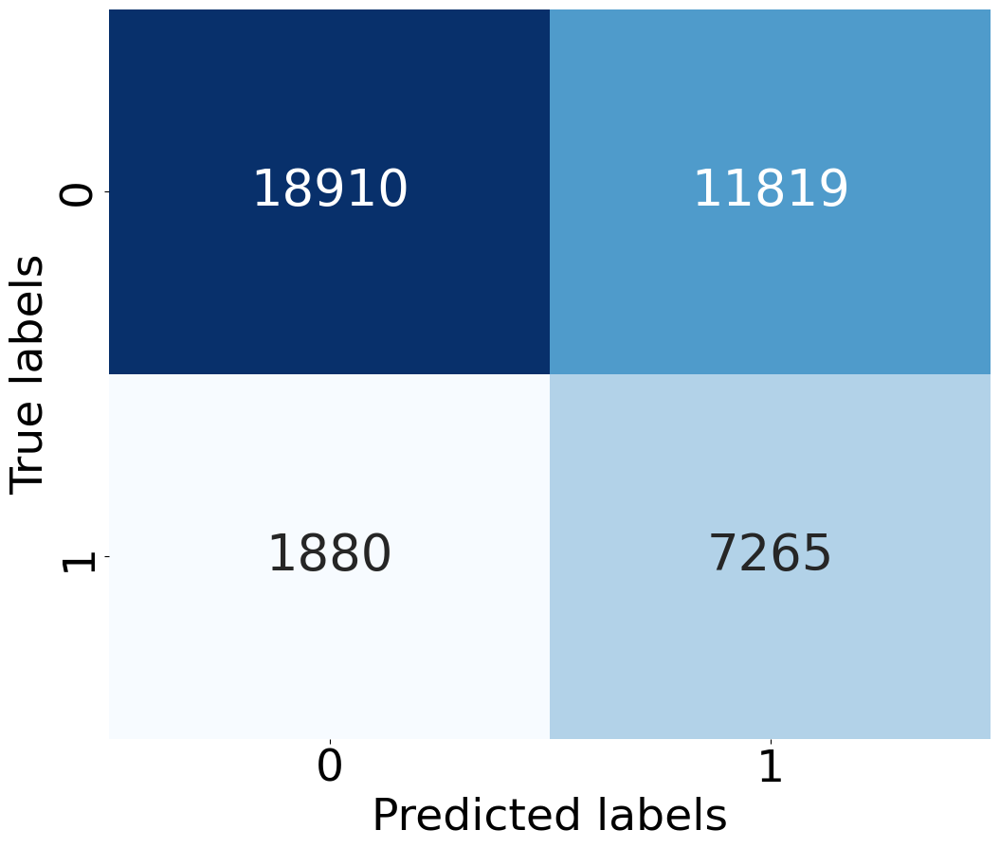

In [ ]:
# Compute confusion matrix and classification report for GRU SMOTE
conf_matrix = confusion_matrix(y_test, y_pred_binary_GRU_ovs)
cr_error = classification_report(y_test, y_pred_binary_GRU_ovs)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 38})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix GRU SMOTE', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig("Confusion_Matrix_GRU_SMOTE.pdf", format='pdf', bbox_inches='tight')
plt.show()

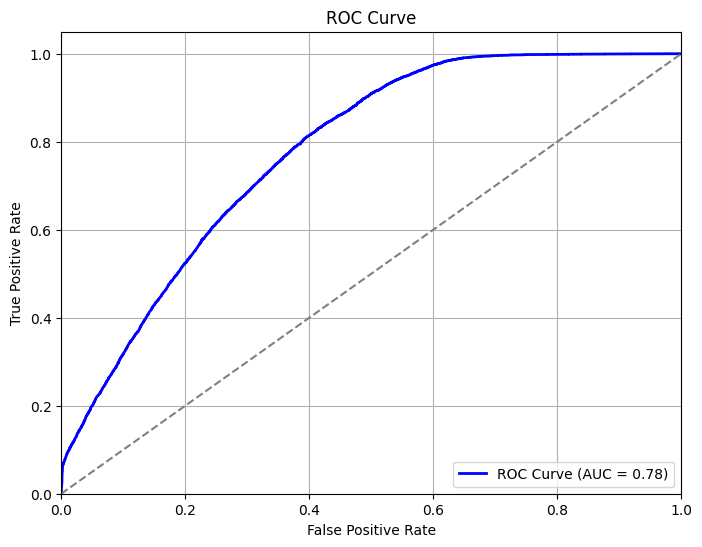

In [ ]:
# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Compute ROC-AUC score
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC Curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

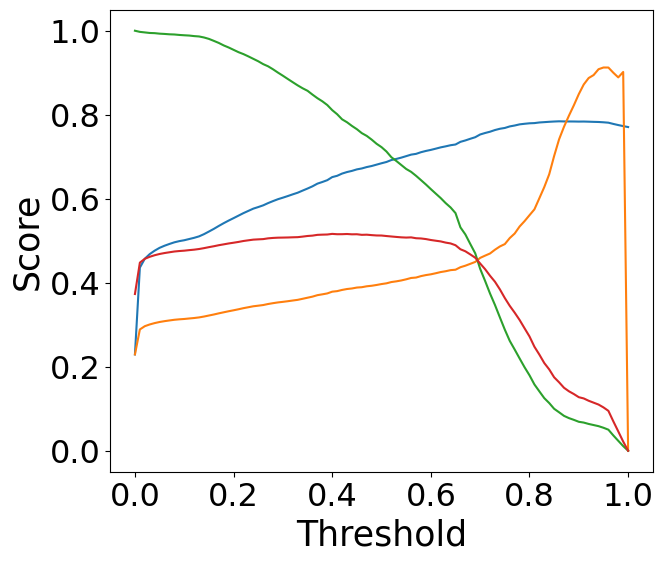

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_GRU_ovs = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_GRU_ovs)
    precision = precision_score(y_test, y_pred_binary_GRU_ovs)
    recall = recall_score(y_test, y_pred_binary_GRU_ovs)
    f1 = f1_score(y_test, y_pred_binary_GRU_ovs)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

# Plot the evaluation metrics against thresholds
plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis GRU SMOTE', fontsize=30)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig("Threshold_Analysis_GRU_SMOTE.pdf", bbox_inches='tight')
plt.show()

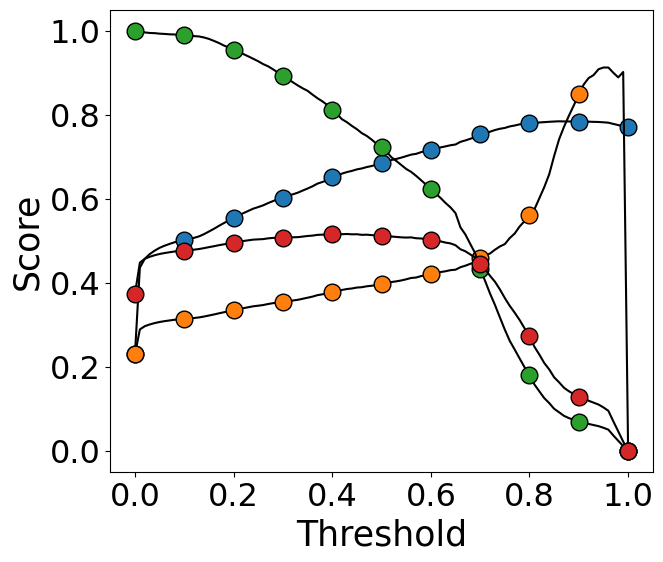

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_GRU_SMOTE.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
df_train_exp_error = X_test

In [ ]:
df_train_exp_error.head()

,session_id_hash,session,session_length,true,exp_pred
139173,b2410d2c9a0f5c3e5674b7ecfb5072e9d8cfeed51a8527...,"[1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 3, ...",37.0,0.0,1
25840,2101ff15b51412a2ca58b7e266f02670345310c259a115...,"[1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, ...",21.0,0.0,0
25719,20db6a581ee197ecb7b819083d1e07713c59134301d66b...,"[1, 1, 1, 1, 1, 2, 3, 1, 2, 1, 3, 1, 1, 1, 1, ...",20.0,0.0,1
193479,f8666eda87b62d9ab550c7e9445ead5274b6acadebdfe2...,"[1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, ...",27.0,0.0,1
50714,413508364819d4afd5d4d0246af8fb826f0ac8116b3817...,"[1, 1, 2, 3, 1, 1, 1, 1, 1]",9.0,1.0,1


In [ ]:
df_train_exp_error['session_length'] = df_train_exp_error['session'].apply(lambda x: len(x)/3)
df_train_exp_error['true'] = y_test
df_train_exp_error['exp_pred'] = y_pred_binary

# Display the updated DataFrame
df_train_exp_error.head()

,session_id_hash,session,session_length,true,exp_pred
139173,b2410d2c9a0f5c3e5674b7ecfb5072e9d8cfeed51a8527...,"[1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 3, ...",37.0,0.0,0
25840,2101ff15b51412a2ca58b7e266f02670345310c259a115...,"[1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, ...",21.0,0.0,0
25719,20db6a581ee197ecb7b819083d1e07713c59134301d66b...,"[1, 1, 1, 1, 1, 2, 3, 1, 2, 1, 3, 1, 1, 1, 1, ...",20.0,0.0,1
193479,f8666eda87b62d9ab550c7e9445ead5274b6acadebdfe2...,"[1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, ...",27.0,0.0,1
50714,413508364819d4afd5d4d0246af8fb826f0ac8116b3817...,"[1, 1, 2, 3, 1, 1, 1, 1, 1]",9.0,1.0,1


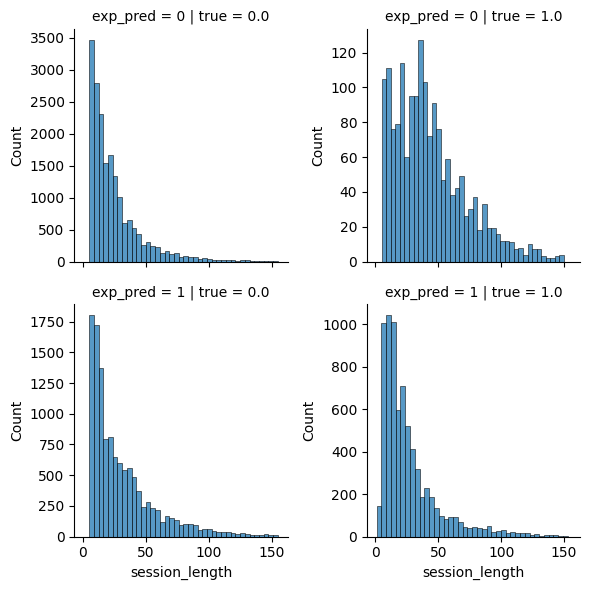

In [ ]:
g = sns.FacetGrid(df_train_exp_error, col = 'true', row = 'exp_pred', sharey=False)
g.map(sns.histplot, 'session_length', bins = 40)

In [ ]:
# Train the model
history = model_GRU_ovs.fit(X_train_reshaped, labels_train_res, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
2885/2885 [==============================] - 20s 6ms/step - loss: 0.4780 - accuracy: 0.7609 - val_loss: 0.5284 - val_accuracy: 0.6840
Epoch 2/10
2885/2885 [==============================] - 17s 6ms/step - loss: 0.4768 - accuracy: 0.7615 - val_loss: 0.5266 - val_accuracy: 0.6842
Epoch 3/10
2885/2885 [==============================] - 25s 9ms/step - loss: 0.4755 - accuracy: 0.7614 - val_loss: 0.5150 - val_accuracy: 0.6887
Epoch 4/10
2885/2885 [==============================] - 32s 11ms/step - loss: 0.4742 - accuracy: 0.7624 - val_loss: 0.5378 - val_accuracy: 0.6763
Epoch 5/10
2885/2885 [==============================] - 23s 8ms/step - loss: 0.4742 - accuracy: 0.7629 - val_loss: 0.5156 - val_accuracy: 0.6920
Epoch 6/10
2885/2885 [==============================] - 19s 6ms/step - loss: 0.4732 - accuracy: 0.7634 - val_loss: 0.5133 - val_accuracy: 0.6943
Epoch 7/10
2885/2885 [==============================] - 19s 6ms/step - loss: 0.4721 - accuracy: 0.7642 - val_loss: 0.5090 - val_a

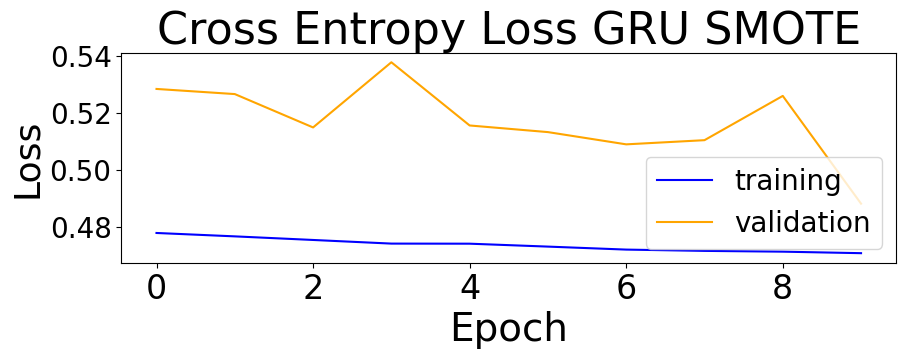

In [ ]:
# Plot Cross Entropy Loss for GRU SMOTE
plt.figure(figsize=(10, 6))
plt.subplot(211)
plt.title('Cross Entropy Loss GRU SMOTE', fontsize=32)
plt.plot(history.history['loss'], color='blue', label='train')
plt.plot(history.history['val_loss'], color='orange', label='test')
plt.legend(['training', 'validation'], fontsize=20)
plt.xlabel('Epoch', fontsize=28)
plt.ylabel('Loss', fontsize=26)
plt.xticks(fontsize=24)
plt.yticks(fontsize=20)
plt.savefig('Cross_Entropy_Loss_GRU_SMOTE.pdf', format='pdf')
plt.show()

#### SHAP

##### Kmeans

In [ ]:
# Set a fixed random seed for reproducibility
np.random.seed(42)
# Define the sample size
sample_size = 500
# Initialize StratifiedShuffleSplit
splitter = StratifiedShuffleSplit(n_splits=1, test_size=sample_size, random_state=42)
# Generate the stratified sample
for train_index, test_index in splitter.split(padded_sequences_test, labels_test):
    subset_X_test_reshaped = padded_sequences_test[test_index]
    subset_y_test = labels_test[test_index]
# Display the shape of the subset to verify
print(subset_X_test_reshaped.shape)
print(subset_y_test.shape)

(500, 30)
(500,)


In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_GRU_ovs.predict, background_summary)

# Compute SHAP values for the test data
shap_values_test_kernel_GRU_ovs = kernel_explainer.shap_values(subset_X_test_reshaped)

1/1 [==============================] - 0s 496ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

329/329 [==============================] - 1s 3ms/step


In [ ]:
np.save('/content/drive/My Drive/Thesis/Datasets/shap_values_test_kernel_GRU_ovs.npy', shap_values_test_kernel_GRU_ovs)

In [ ]:
file_path = '/content/drive/My Drive/Thesis/Datasets/shap_values_test_kernel_GRU_ovs.npy'
shap_values_test_kernel_GRU_ovs = np.load(file_path)

In [ ]:
# Define feature names based on the time steps in the sequence
# TS = Time Step
feature_names = [f"TS {i+1}" for i in range(subset_X_test_reshaped.shape[1])]

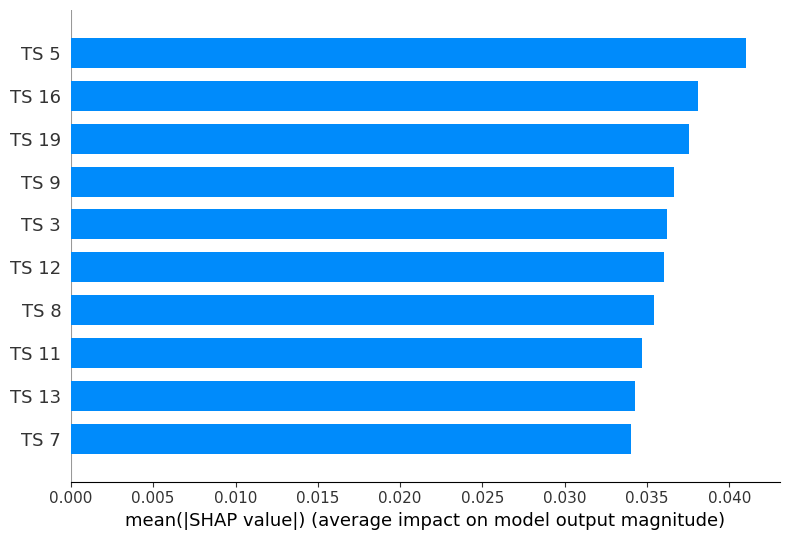

In [ ]:
# Reshape the SHAP values matrix to match the shape of the features matrix
shap_values_test_kernel_GRU_ovs_reshaped = shap_values_test_kernel_GRU_ovs.reshape(shap_values_test_kernel_GRU_ovs.shape[0], shap_values_test_kernel_GRU_ovs.shape[1], -1)

# Aggregate SHAP values across all features
shap_values_aggregated = np.mean(shap_values_test_kernel_GRU_ovs, axis=2)

# Get the mean absolute SHAP values for each feature
mean_abs_shap_values = np.mean(np.abs(shap_values_aggregated), axis=0)

# Sort the features based on their mean absolute SHAP values
sorted_indices = np.argsort(mean_abs_shap_values)[::-1]

# Select only the top ten features
top_ten_indices_GRU_SMOTE = sorted_indices[:10]
top_ten_features = subset_X_test_reshaped[:, top_ten_indices_GRU_SMOTE]
top_ten_feature_names = [feature_names[i] for i in top_ten_indices_GRU_SMOTE]

# Plot the aggregated SHAP values for the top ten features
shap.summary_plot(shap_values_aggregated[:, top_ten_indices_GRU_SMOTE], features=top_ten_features, feature_names=top_ten_feature_names , plot_type='bar')

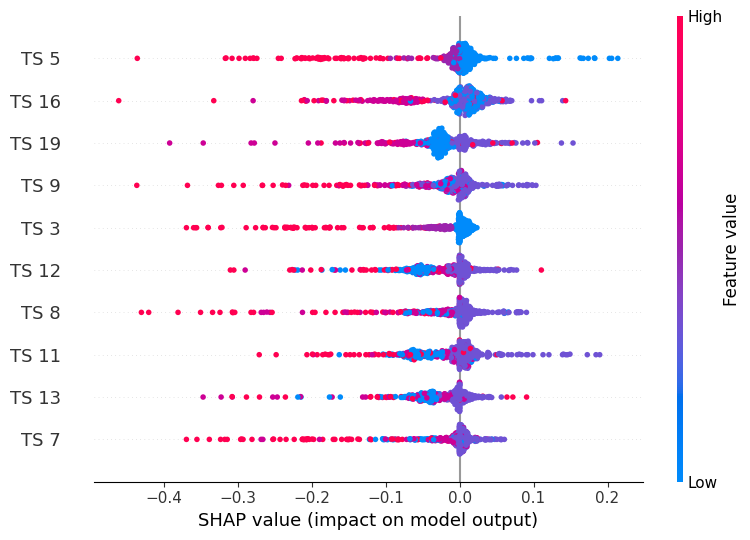

In [ ]:
shap.summary_plot(shap_values_aggregated[:, top_ten_indices_GRU_SMOTE], features=top_ten_features, feature_names=top_ten_feature_names)

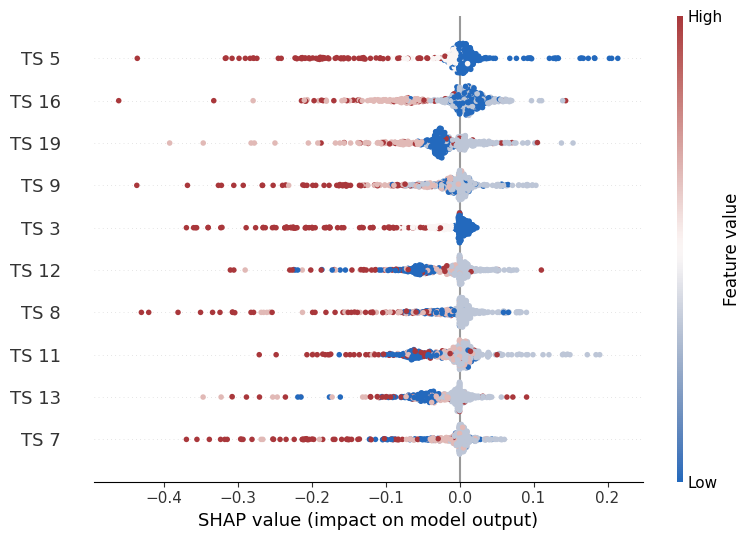

In [ ]:
# Define a simple colormap from blue to red
# colors = [(0, 0, 1, 1), (1, 0, 0, 1)]  # From blue to red
# cm = LinearSegmentedColormap.from_list("red_blue", colors, N=256)
plt.figure()
shap.summary_plot(
    shap_values_aggregated[:, top_ten_indices_GRU_SMOTE],
    features=top_ten_features,
    feature_names=top_ten_feature_names,
    show=False,
    cmap=cmap
)
plt.savefig('shap_summary_plot_GRU_SMOTE.pdf', bbox_inches='tight')
plt.show()
plt.close()

In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_GRU_ovs.predict, background_summary)

1/1 [==============================] - 0s 26ms/step


In [ ]:
# Convert to numpy array using to_numpy()
y_array_np = y_test.to_numpy()
y_test_samples = y_array_np[sample_indices]

NameError: name 'sample_indices' is not defined

In [ ]:
labels_test[test_index]

array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 1., 0., 1., 1., 1., 0., 0., 0., 0., 0.,
       1., 0., 1., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 1., 0.,
       0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       1., 0., 0., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 1., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 0., 1., 1., 0.,
       0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1.,
       1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 1., 0., 1.,
       1., 0., 1., 0., 0.

In [ ]:
# Choose an instance to explain (e.g., the first instance)
instance_index = 7

# Create the custom colormap
custom_cmap = ["#8f8f8f", "#4d8fc6"]

# Generate force plot for the chosen instance
shap.initjs()
force_plot = shap.force_plot(
    kernel_explainer.expected_value,
    shap_values_test_kernel_GRU_ovs[instance_index][:, 0],
    subset_X_test_reshaped[instance_index],
    feature_names=feature_names,
    plot_cmap=custom_cmap
)

# Save the force plot to an HTML file
html_file = 'shap_force_plot_GRU_SMOTE.html'
shap.save_html(html_file, force_plot)

# Display the plot
display(force_plot)

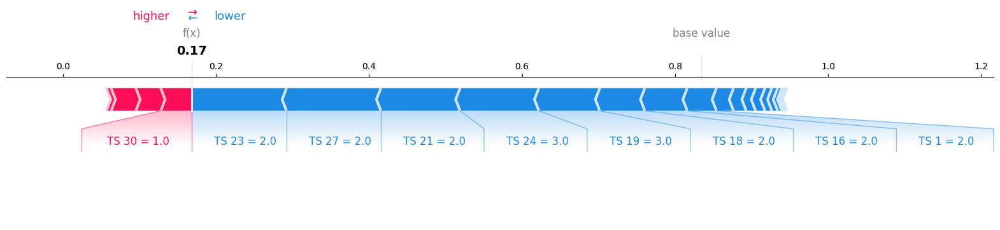

In [ ]:
# Choose an instance to explain (e.g., the first instance)
instance_index = 10

# Generate force plot for the chosen instance
shap.force_plot(kernel_explainer.expected_value, shap_values_test_kernel_GRU_ovs[instance_index][:, 0], subset_X_test_reshaped[instance_index], matplotlib=True, feature_names= feature_names)

1247/1247 [==============================] - 10s 8ms/step


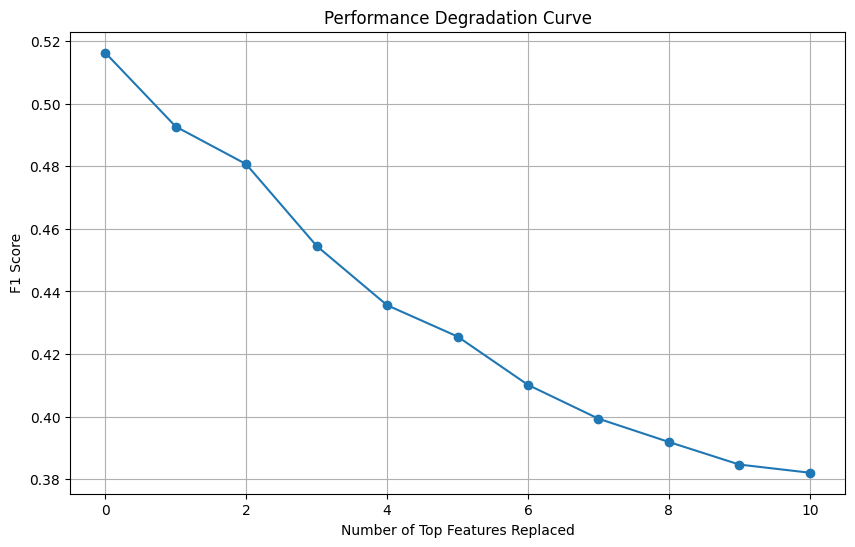

In [ ]:
# Create a copy of the test data to modify
modified_test_set = np.array(padded_sequences_test)

# Store original F1 score with unmodified data
original_pred = model_GRU_ovs.predict(padded_sequences_test)
original_f1 = f1_score(y_test, (original_pred > 0.4).astype(int))

# Initialize a list to store F1 scores after each feature modification
f1_scores_GRU_SMOTE = [original_f1]

# Replace each top feature with the majority value found in that feature
for i, feature_idx in enumerate(top_ten_indices_GRU_SMOTE):
    # Find the majority class for the current feature across all test data
    majority_value = np.bincount(modified_test_set[:, feature_idx]).argmax()

    # Replace this feature in all test samples with the majority class
    modified_test_set[:, feature_idx] = majority_value

    # Evaluate the model with the modified test set
    new_predictions = model_GRU_ovs.predict(modified_test_set)
    new_f1 = f1_score(y_test, (new_predictions > 0.4).astype(int))

    # Append the new F1 score
    f1_scores_GRU_SMOTE.append(new_f1)

# Plot the performance degradation curve
plt.figure(figsize=(10, 6))
plt.plot(range(len(f1_scores_GRU_SMOTE)), f1_scores_GRU_SMOTE, marker='o')
plt.title('Performance Degradation Curve')
plt.xlabel('Number of Top Features Replaced')
plt.ylabel('F1 Score')
plt.grid(True)

##### Both classes

In [ ]:
# Filter the dataset for "cart abandonment" sessions (target = 0)
cart_abandonment_sessions = df_train[df_train["conversion"] == 0][["session_id_hash", "session"]]
sequences_train_ca = cart_abandonment_sessions['session'].tolist()
sequences_train_ca = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_ca]
max_length = 30  # Choose the maximum length you want
padded_sequences_ca = pad_sequences(sequences_train_ca, maxlen= max_length, padding='post', truncating='post')

# Filter the dataset for "purchase" sessions (target = 1)
purchase_sessions = df_train[df_train["conversion"] == 1][["session_id_hash", "session"]]
sequences_train_pu = purchase_sessions['session'].tolist()
sequences_train_pu = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_pu]
max_length = 30  # Choose the maximum length you want
padded_sequences_pu = pad_sequences(sequences_train_pu, maxlen= max_length, padding='post', truncating='post')

In [ ]:
# Set a fixed random seed
np.random.seed(42)

sample_size = 100
sample_indices = np.random.choice(len(padded_sequences_ca), size=sample_size, replace=False)
subset_X_test_reshaped_ca = padded_sequences_ca[sample_indices]

sample_indices = np.random.choice(len(padded_sequences_pu), size=sample_size, replace=False)
subset_X_test_reshaped_pu = padded_sequences_pu[sample_indices]

In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped_ca, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_GRU_ovs.predict, background_summary)

# Compute SHAP values for the test data
shap_values_class0 = kernel_explainer.shap_values(subset_X_test_reshaped_ca)

1/1 [==============================] - 0s 396ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

330/330 [==============================] - 1s 2ms/step


In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped_pu, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_GRU_ovs.predict, background_summary)

# Compute SHAP values for the test data
shap_values_class1 = kernel_explainer.shap_values(subset_X_test_reshaped_pu)

1/1 [==============================] - 0s 20ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

329/329 [==============================] - 1s 2ms/step


In [ ]:
# Define feature names based on the time steps in the sequence
# TS = Time Step
feature_names = [f"TS {i+1}" for i in range(subset_X_test_reshaped_ca.shape[1])]

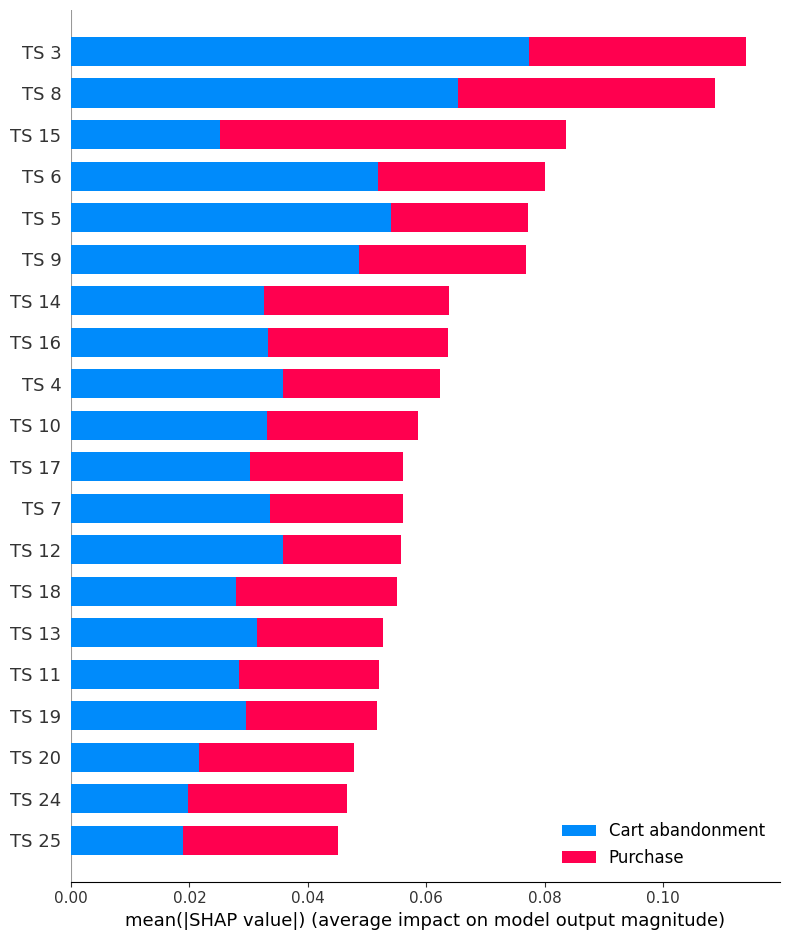

In [ ]:
# Reshape the SHAP values matrix to match the shape of the features matrix for each class
shap_values_class0_reshaped = shap_values_class0.reshape(shap_values_class0.shape[0], shap_values_class0.shape[1], -1)
shap_values_class1_reshaped = shap_values_class1.reshape(shap_values_class1.shape[0], shap_values_class1.shape[1], -1)

# Aggregate SHAP values across all features for each class
shap_values_class0_aggregated = np.mean(shap_values_class0, axis=2)
shap_values_class1_aggregated = np.mean(shap_values_class1, axis=2)

# Create a matplotlib figure and axis
fig, ax = plt.subplots()

# Plot the aggregated SHAP values for the top ten features for both classes in one summary plot
shap.summary_plot([shap_values_class0_aggregated, shap_values_class1_aggregated],
                  feature_names=feature_names,
                  plot_type='bar',
                  class_names=['Cart abandonment', 'Purchase'],
                  show=False)  # Prevents immediate showing of the plot

# Save the figure as a PDF
plt.savefig('shap_summary_plot_GRU_SMOTE.pdf', bbox_inches='tight')  # Save as PDF

# If you want to display the plot as well, uncomment the next line
# plt.show()

### LSTM

In [ ]:
print("Class distribution before oversampling:", Counter(labels_train))
# transform the dataset
oversample = SMOTE(sampling_strategy = 'minority', k_neighbors = 3)

padded_sequences_train_res, labels_train_res = oversample.fit_resample(X_train, y_train)
# Print the distribution of classes after oversampling
print("Class distribution after oversampling:", Counter(labels_train_res))

Class distribution before oversampling: Counter({0.0: 123059, 1.0: 36434})
Class distribution after oversampling: Counter({0.0: 92300, 1.0: 92300})


In [ ]:
# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(padded_sequences_train_res, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

In [ ]:
model_LSTM_ovs = Sequential([
    LSTM(32, input_shape=(None, 1)),
    Dropout(0.25),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.01)
model_LSTM_ovs.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model_LSTM_ovs.fit(X_train_reshaped, labels_train_res, epochs=10, batch_size=32, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
5769/5769 [==============================] - 46s 7ms/step - loss: 0.6916 - accuracy: 0.5128 - val_loss: 0.6900 - val_accuracy: 0.7505
Epoch 2/10
5769/5769 [==============================] - 37s 6ms/step - loss: 0.6880 - accuracy: 0.5215 - val_loss: 0.6645 - val_accuracy: 0.6637
Epoch 3/10
5769/5769 [==============================] - 37s 6ms/step - loss: 0.6854 - accuracy: 0.5209 - val_loss: 0.6989 - val_accuracy: 0.2286
Epoch 4/10
5769/5769 [==============================] - 38s 7ms/step - loss: 0.6843 - accuracy: 0.5193 - val_loss: 0.6514 - val_accuracy: 0.7786
Epoch 5/10
5769/5769 [==============================] - 38s 7ms/step - loss: 0.6841 - accuracy: 0.5192 - val_loss: 0.6866 - val_accuracy: 0.7671
Epoch 6/10
5769/5769 [==============================] - 37s 6ms/step - loss: 0.6332 - accuracy: 0.5984 - val_loss: 0.5716 - val_accuracy: 0.6356
Epoch 7/10
5769/5769 [==============================] - 37s 6ms/step - loss: 0.5225 - accuracy: 0.7281 - val_loss: 0.5345 - val_ac

In [ ]:
model_save_name = 'model_LSTM_ovs.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_ovs.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_LSTM_ovs.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_ovs = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_ovs.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.47802).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(labels_train_res, y_pred_binary)

print("F1 Score:", f1)

5769/5769 [==============================] - 14s 3ms/step
F1 Score: 0.7896903610642391


In [ ]:
# Predict labels for the test set
y_pred_probs = model_LSTM_ovs.predict(X_train_reshaped)

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(labels_train_res, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

5769/5769 [==============================] - 15s 3ms/step
Optimal Threshold: 0.47802734375
Optimal F1 Score: 0.7896940936247447


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_ovs.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(labels_train_res, y_pred_binary)

print("F1 Score:", f1)

5769/5769 [==============================] - 14s 2ms/step
F1 Score: 0.7892266064957789


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_ovs.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.47802).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.5164831298596207


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_ovs.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.5158573022786997


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_ovs.predict(padded_sequences_test)
y_pred_binary_LSTM_ovs = (y_pred > 0.47802).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_ovs)

print("F1 Score:", f1)

1247/1247 [==============================] - 16s 13ms/step
F1 Score: 0.5163435686995896


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_ovs.predict(padded_sequences_test)
y_pred_binary_LSTM_ovs = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_ovs)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 3ms/step
F1 Score: 0.5146126824321876


In [ ]:
# 1	batch size: 128;	Dropout: 0.25;	Learning Rate: 0.010 --> 0.51681 (Threshold = 0.45)


# 2	batch size: 32;	Dropout: 0.50;	Learning Rate: 0.010 --> 0.50809 (Threshold = 0.52)
# 3	batch size: 32;	Dropout: 0.25;	Learning Rate: 0.010 --> 0.49850 (Threshold = 0.52)
# 4	batch size: 64;	Dropout: 0.00;	Learning Rate: 0.001 --> 0.51618 (Threshold = 0.52)
# 5	batch size: 32; 	Dropout:0.50; 	Learning Rate: 0.001 --> 0.51255 (Threshold = 0.44)

#### Hyperparameter Tuning

In [ ]:
# Suppress TensorFlow logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# Define a function to build the model
def build_model(hp):
    model = Sequential()
    model.add(LSTM(units=32, input_shape=(None, 1)))
    model.add(Dropout(rate=hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.25)))
    model.add(Dense(units=32, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    learning_rate = hp.Choice("learning_rate", [0.001, 0.01])
    batch_size = hp.Choice("batch_size", [128, 64, 32])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Initialize a GridSearch tuner
tuner = GridSearch(
    build_model,
    objective='val_loss')

# Perform the search
tuner.search(X_train_reshaped, labels_train_res, epochs=10, validation_data=(X_val_reshaped, y_val))

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hps.values)

Reloading Tuner from ./untitled_project/tuner0.json
Best Hyperparameters:
{'dropout': 0.25, 'learning_rate': 0.01, 'batch_size': 128}


In [ ]:
hyperparameters_data = []
for trial in tuner.oracle.get_best_trials(num_trials=len(tuner.oracle.trials)):
    hyperparameters = trial.hyperparameters.values
    val_loss = trial.score
    hyperparameters_data.append({
        'Batch Size': hyperparameters['batch_size'],
        'Dropout': hyperparameters['dropout'],
        'Learning Rate': hyperparameters['learning_rate'],
        'Validation Loss': val_loss
    })

# Create DataFrame
df_results_LSTM_ovs = pd.DataFrame(hyperparameters_data)

In [ ]:
df_results_LSTM_ovs

,Batch Size,Dropout,Learning Rate,Validation Loss
0,128,0.25,0.010,0.474329
1,32,0.50,0.010,0.499044
2,32,0.25,0.010,0.501144
3,64,0.00,0.001,0.501315
4,32,0.50,0.001,0.503410
5,128,0.50,0.001,0.510190
6,128,0.25,0.001,0.511468
7,128,0.00,0.001,0.515720
8,64,0.50,0.001,0.516541
9,64,0.00,0.010,0.517721


In [ ]:
df_results_LSTM_ovs.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_LSTM_ovs.csv", index = False)

In [ ]:
df_results_LSTM_ovs = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_LSTM_ovs.csv")

In [ ]:
results_df = df_results_LSTM_ovs

In [ ]:
import plotly.graph_objects as go

def plot_parcoords(results_df):
    fig = go.Figure(data=
        go.Parcoords(
            line=dict(color=results_df['Validation Loss'], colorscale='Tealrose', showscale=True),
            dimensions=[
                dict(range=[min(results_df['Dropout']), max(results_df['Dropout'])],
                     label='Dropout', values=results_df['Dropout']),
                dict(range=[min(results_df['Batch Size']), max(results_df['Batch Size'])],
                     label='Batch Size', values=results_df['Batch Size']),
                dict(range=[min(results_df['Learning Rate']), max(results_df['Learning Rate'])],
                     label='Learning Rate', values=results_df['Learning Rate']),
                dict(range=[min(results_df['Validation Loss']), max(results_df['Validation Loss'])],
                     label='Validation Loss', values=results_df['Validation Loss'])
            ])
        )

    fig.show()

# Call the function with your dataframe
plot_parcoords(results_df)


In [ ]:
# Define hyperparameters and F1 scores
hyperparameters = ['Dropout Rate', 'Batch Size', 'Learning Rate']
vl_scores = ['Validation Loss']

# Create pairplot
fig = ff.create_scatterplotmatrix(
    results_df,
    diag='histogram',
    index='Validation Loss',
    colormap='Rainbow',
    colormap_type='seq',
    height=800,
    width=800
)

# Update layout
fig.update_layout(
    title='Pairplot of Hyperparameters vs Validation loss',
    xaxis=dict(title='Hyperparameters'),
    yaxis=dict(title='Hyperparameters')
)

fig.show()

In [ ]:
import plotly.graph_objects as go
import plotly.io as pio

# Create the contour plot
fig = go.Figure(data=go.Contour(
    x=results_df['Dropout'],
    y=results_df['Learning Rate'],
    z=results_df['Validation Loss'],
    colorscale='Blues',  # Choose a colorscale
    colorbar=dict(
        title=dict(text='Validation Loss', font=dict(size=26)),
        thickness=50,  # Increase the thickness of the colorbar
        len=1.1,  # Increase the length of the colorbar
        tickfont=dict(size=24)  # Increase the font size of the numbers on the colorbar
    ),
))

# Update layout with increased font sizes
fig.update_layout(
#     title=dict(text='Contour Plot of Hyperparameters LSTM SMOTE', font=dict(size=22)),
    xaxis=dict(title=dict(text='Dropout Rate', font=dict(size=26)), tickfont=dict(size=24)),
    yaxis=dict(title=dict(text='Learning Rate', font=dict(size=26)), tickfont=dict(size=24))
)

fig.show()
pio.write_image(fig, 'hyperparameters_contour_plot_LSTM_SMOTE.pdf')


#### Error Analysis

              precision    recall  f1-score   support

         0.0       0.91      0.62      0.73     30729
         1.0       0.38      0.80      0.52      9145

    accuracy                           0.66     39874
   macro avg       0.65      0.71      0.63     39874
weighted avg       0.79      0.66      0.68     39874



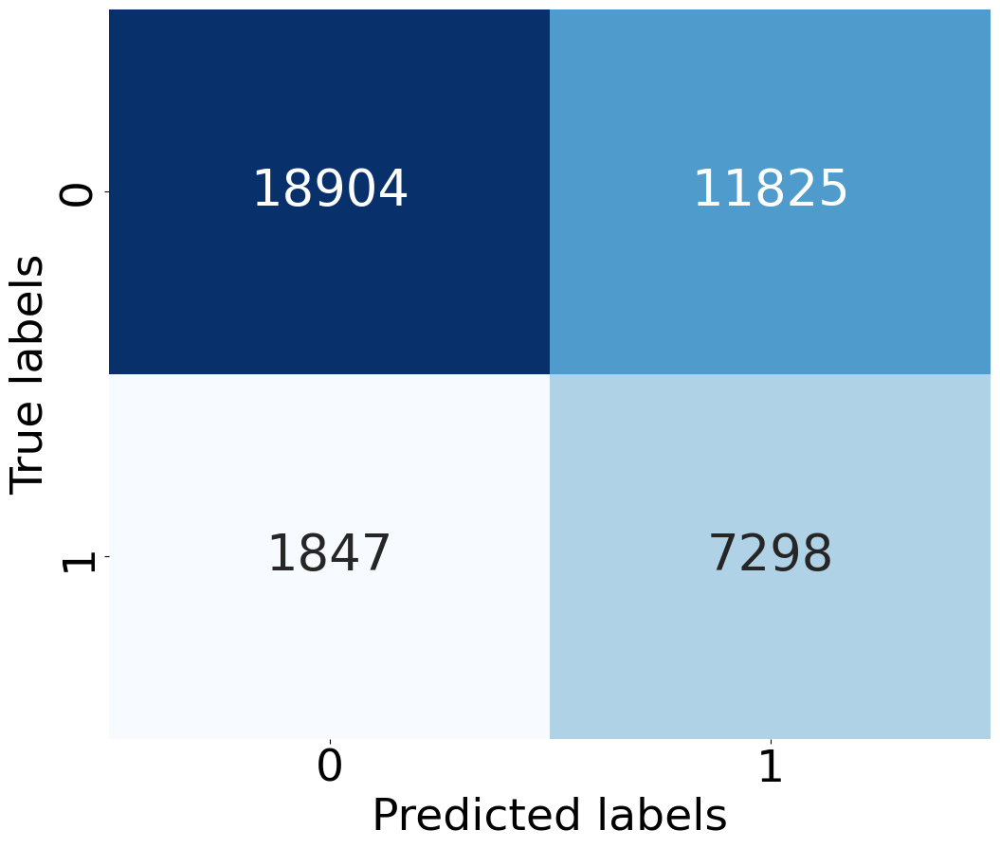

In [ ]:
# Compute confusion matrix and classification report for LSTM SMOTE
conf_matrix = confusion_matrix(y_test, y_pred_binary_LSTM_ovs)
cr_error = classification_report(y_test, y_pred_binary_LSTM_ovs)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 38})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix LSTM SMOTE', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_LSTM_SMOTE.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Compute ROC-AUC score
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC Curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

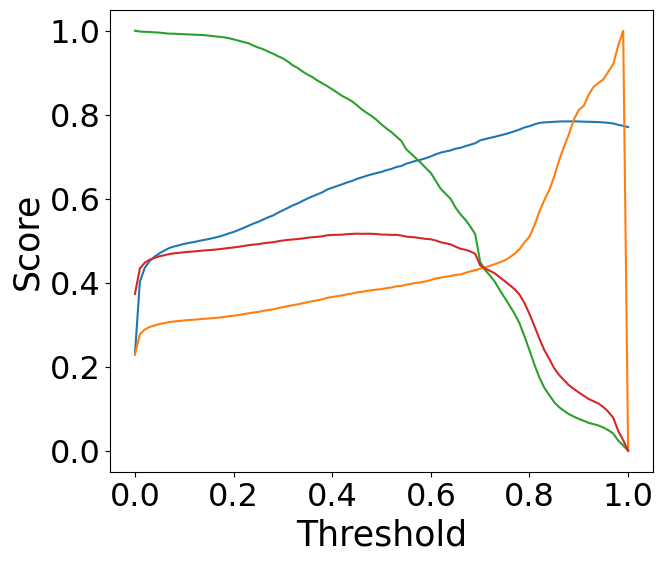

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_LSTM_ovs = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_LSTM_ovs)
    precision = precision_score(y_test, y_pred_binary_LSTM_ovs)
    recall = recall_score(y_test, y_pred_binary_LSTM_ovs)
    f1 = f1_score(y_test, y_pred_binary_LSTM_ovs)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

# Plot the evaluation metrics against thresholds
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis LSTM SMOTE', fontsize=30)
# plt.legend(fontsize=22)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig('Threshold_Analysis_LSTM_SMOTE.pdf', bbox_inches='tight')
plt.show()

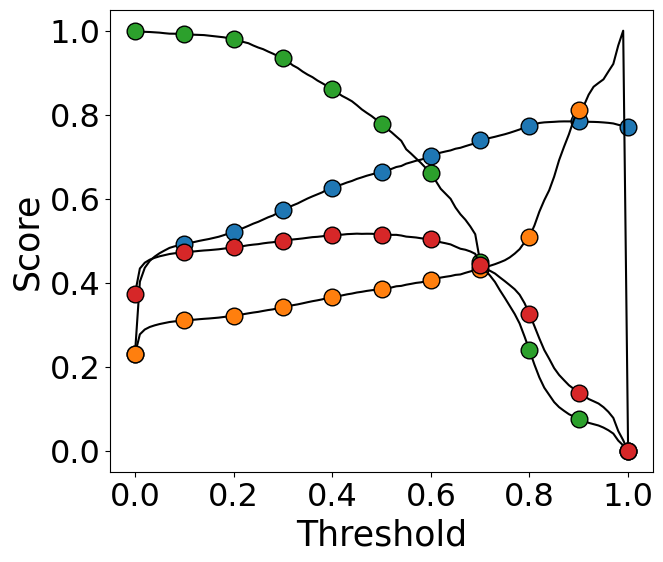

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_LSTM_SMOTE.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
# Train the model
history = model_LSTM_ovs.fit(X_train_reshaped, labels_train_res, epochs=10, batch_size=32, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
5769/5769 [==============================] - 39s 6ms/step - loss: 0.4850 - accuracy: 0.7574 - val_loss: 0.5675 - val_accuracy: 0.6666
Epoch 2/10
5769/5769 [==============================] - 53s 9ms/step - loss: 0.5203 - accuracy: 0.7290 - val_loss: 0.6558 - val_accuracy: 0.5346
Epoch 3/10
5769/5769 [==============================] - 40s 7ms/step - loss: 0.5511 - accuracy: 0.6989 - val_loss: 0.5543 - val_accuracy: 0.6574
Epoch 4/10
5769/5769 [==============================] - 35s 6ms/step - loss: 0.5044 - accuracy: 0.7460 - val_loss: 0.5242 - val_accuracy: 0.6893
Epoch 5/10
5769/5769 [==============================] - 36s 6ms/step - loss: 0.4889 - accuracy: 0.7563 - val_loss: 0.5261 - val_accuracy: 0.6870
Epoch 6/10
5769/5769 [==============================] - 37s 6ms/step - loss: 0.4838 - accuracy: 0.7575 - val_loss: 0.5203 - val_accuracy: 0.6937
Epoch 7/10
5769/5769 [==============================] - 36s 6ms/step - loss: 0.4804 - accuracy: 0.7604 - val_loss: 0.5087 - val_ac

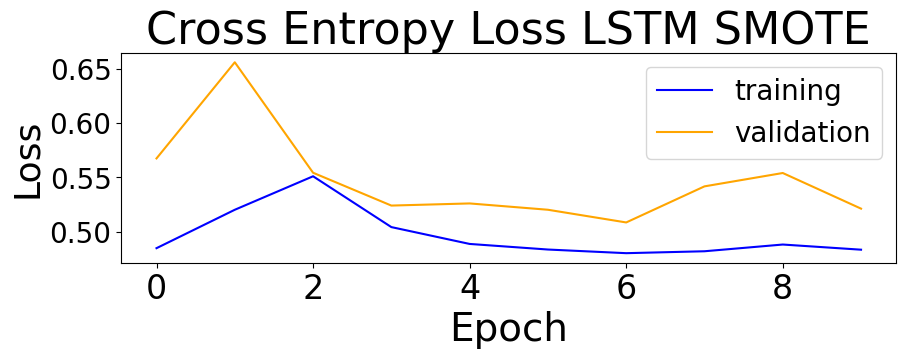

In [ ]:
# Plot Cross Entropy Loss for LSTM SMOTE
plt.figure(figsize=(10, 6))
plt.subplot(211)
plt.title('Cross Entropy Loss LSTM SMOTE', fontsize=32)
plt.plot(history.history['loss'], color='blue', label='train')
plt.plot(history.history['val_loss'], color='orange', label='test')
plt.legend(['training', 'validation'], fontsize=20)
plt.xlabel('Epoch', fontsize=28)
plt.ylabel('Loss', fontsize=26)
plt.xticks(fontsize=24)
plt.yticks(fontsize=20)
plt.savefig('Cross_Entropy_Loss_LSTM_SMOTE.pdf', format='pdf')
plt.show()

#### SHAP

##### Kmeans

In [ ]:
# Set a fixed random seed for reproducibility
np.random.seed(42)
# Define the sample size
sample_size = 500
# Initialize StratifiedShuffleSplit
splitter = StratifiedShuffleSplit(n_splits=1, test_size=sample_size, random_state=42)
# Generate the stratified sample
for train_index, test_index in splitter.split(padded_sequences_test, labels_test):
    subset_X_test_reshaped = padded_sequences_test[test_index]
    subset_y_test = labels_test[test_index]
# Display the shape of the subset to verify
print(subset_X_test_reshaped.shape)
print(subset_y_test.shape)

(500, 30)
(500,)


In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_LSTM_ovs.predict, background_summary)

# Compute SHAP values for the test data
shap_values_test_kernel_LSTM_ovs = kernel_explainer.shap_values(subset_X_test_reshaped)

1/1 [==============================] - 0s 20ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


KeyboardInterrupt: 

In [ ]:
np.save('/content/drive/My Drive/Thesis/Datasets/shap_values_test_kernel_LSTM_ovs.npy', shap_values_test_kernel_LSTM_ovs)

In [ ]:
file_path = '/content/drive/My Drive/Thesis/Datasets/shap_values_test_kernel_LSTM_ovs.npy'
shap_values_test_kernel_LSTM_ovs = np.load(file_path)

In [ ]:
# Define feature names based on the time steps in the sequence
# TS = Time Step
feature_names = [f"TS {i+1}" for i in range(subset_X_test_reshaped.shape[1])]

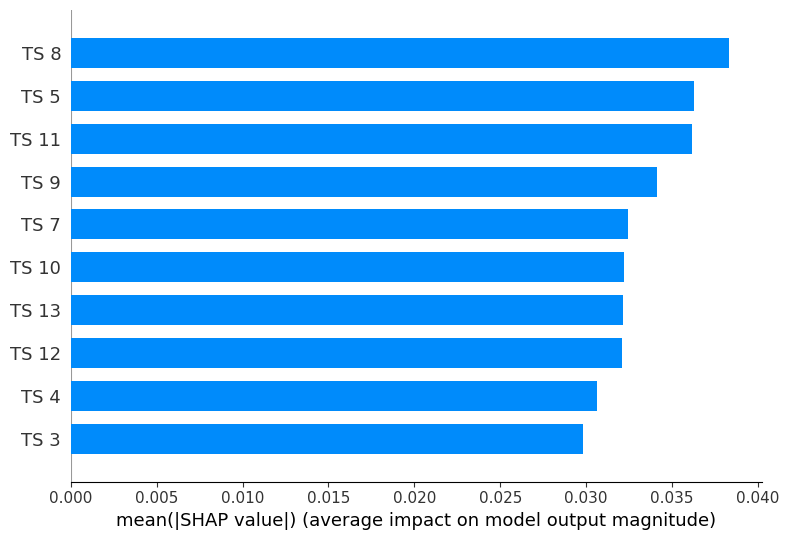

In [ ]:
# Reshape the SHAP values matrix to match the shape of the features matrix
shap_values_test_kernel_LSTM_ovs_reshaped = shap_values_test_kernel_LSTM_ovs.reshape(shap_values_test_kernel_LSTM_ovs.shape[0], shap_values_test_kernel_LSTM_ovs.shape[1], -1)

# Aggregate SHAP values across all features
shap_values_aggregated = np.mean(shap_values_test_kernel_LSTM_ovs, axis=2)

# Get the mean absolute SHAP values for each feature
mean_abs_shap_values = np.mean(np.abs(shap_values_aggregated), axis=0)

# Sort the features based on their mean absolute SHAP values
sorted_indices = np.argsort(mean_abs_shap_values)[::-1]

# Select only the top ten features
top_ten_indices = sorted_indices[:10]
top_ten_features = subset_X_test_reshaped[:, top_ten_indices]
top_ten_feature_names = [feature_names[i] for i in top_ten_indices]

# Plot the aggregated SHAP values for the top ten features
shap.summary_plot(shap_values_aggregated[:, top_ten_indices], features=top_ten_features, feature_names=top_ten_feature_names , plot_type='bar')

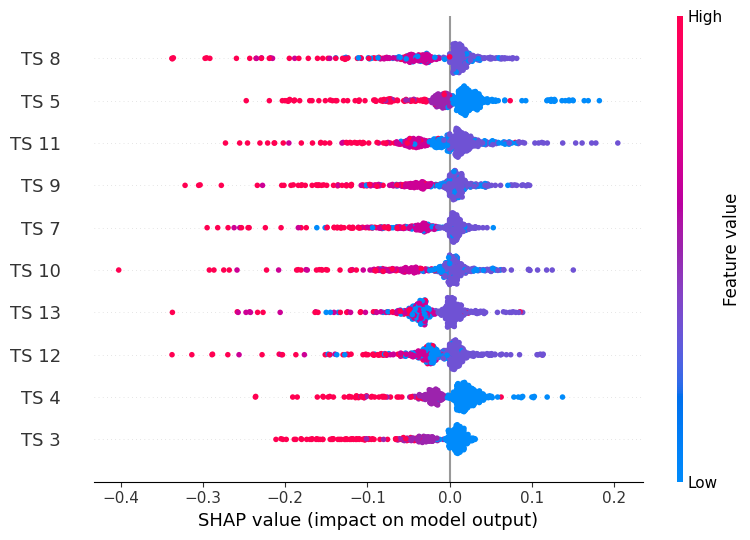

In [ ]:
shap.summary_plot(shap_values_aggregated[:, top_ten_indices], features=top_ten_features, feature_names=top_ten_feature_names)

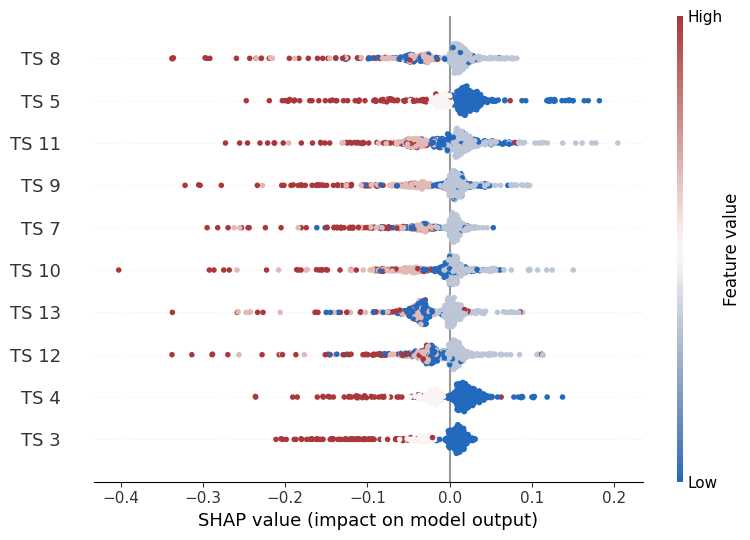

In [ ]:
# Define a simple colormap from blue to red
# colors = [(0, 0, 1, 1), (1, 0, 0, 1)]  # From blue to red
# cm = LinearSegmentedColormap.from_list("red_blue", colors, N=256)
plt.figure()
shap.summary_plot(
    shap_values_aggregated[:, top_ten_indices],
    features=top_ten_features,
    feature_names=top_ten_feature_names,
    show=False,
    cmap=cmap
)
plt.savefig('shap_summary_plot_LSTM_SMOTE.pdf', bbox_inches='tight')
plt.show()
plt.close()

In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_LSTM_ovs.predict, background_summary)

1/1 [==============================] - 0s 34ms/step


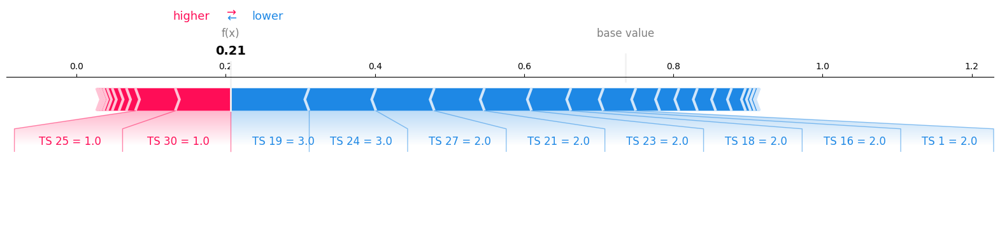

In [ ]:
# Choose an instance to explain (e.g., the first instance)
instance_index = 10

# Generate force plot for the chosen instance
shap.force_plot(kernel_explainer.expected_value, shap_values_test_kernel_LSTM_ovs[instance_index][:, 0], subset_X_test_reshaped[instance_index], matplotlib=True, feature_names= feature_names)

1247/1247 [==============================] - 5s 4ms/step


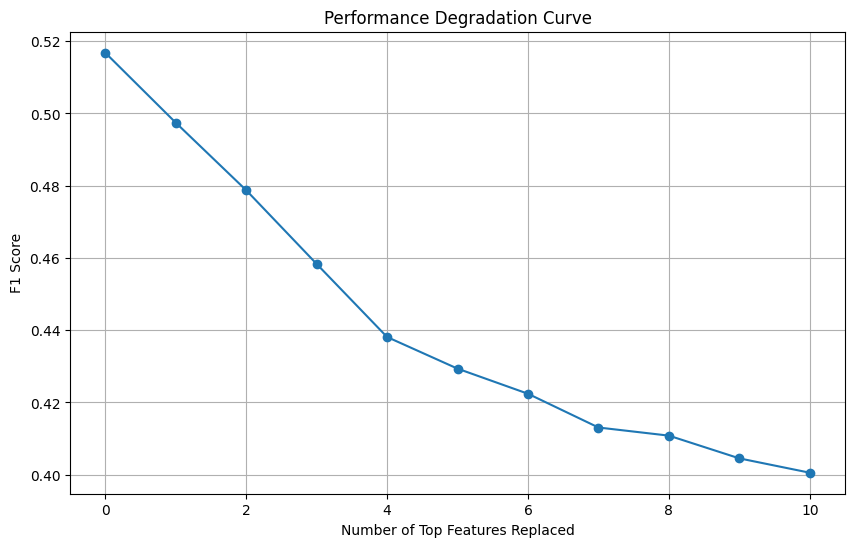

In [ ]:
# Create a copy of the test data to modify
modified_test_set = np.array(padded_sequences_test)

# Store original F1 score with unmodified data
original_pred = model_LSTM_ovs.predict(padded_sequences_test)
original_f1 = f1_score(y_test, (original_pred > 0.45).astype(int))

# Initialize a list to store F1 scores after each feature modification
f1_scores_LSTM_ovs = [original_f1]

# Replace each top feature with the majority value found in that feature
for i, feature_idx in enumerate(top_ten_indices):
    # Find the majority class for the current feature across all test data
    majority_value = np.bincount(modified_test_set[:, feature_idx]).argmax()

    # Replace this feature in all test samples with the majority class
    modified_test_set[:, feature_idx] = majority_value

    # Evaluate the model with the modified test set
    new_predictions = model_LSTM_ovs.predict(modified_test_set)
    new_f1 = f1_score(y_test, (new_predictions > 0.45).astype(int))

    # Append the new F1 score
    f1_scores_LSTM_ovs.append(new_f1)

# Plot the performance degradation curve
plt.figure(figsize=(10, 6))
plt.plot(range(len(f1_scores_LSTM_ovs)), f1_scores_LSTM_ovs, marker='o')
plt.title('Performance Degradation Curve')
plt.xlabel('Number of Top Features Replaced')
plt.ylabel('F1 Score')
plt.grid(True)

In [ ]:
f1_scores_LSTM_ovs = [0.51681148469966,
 0.4974566995042174,
 0.478753712796266,
 0.45834518055160645,
 0.4381120093919261,
 0.42935259221047195,
 0.4223997595732425,
 0.41305721646978755,
 0.41080461964302756,
 0.40451054548829435,
 0.4005383088889396]

##### Both classes

In [ ]:
# Filter the dataset for "cart abandonment" sessions (target = 0)
cart_abandonment_sessions = df_train[df_train["conversion"] == 0][["session_id_hash", "session"]]
sequences_train_ca = cart_abandonment_sessions['session'].tolist()
sequences_train_ca = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_ca]
max_length = 30  # Choose the maximum length you want
padded_sequences_ca = pad_sequences(sequences_train_ca, maxlen= max_length, padding='post', truncating='post')

# Filter the dataset for "purchase" sessions (target = 1)
purchase_sessions = df_train[df_train["conversion"] == 1][["session_id_hash", "session"]]
sequences_train_pu = purchase_sessions['session'].tolist()
sequences_train_pu = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_pu]
max_length = 30  # Choose the maximum length you want
padded_sequences_pu = pad_sequences(sequences_train_pu, maxlen= max_length, padding='post', truncating='post')

In [ ]:
# Set a fixed random seed
np.random.seed(42)

sample_size = 100
sample_indices = np.random.choice(len(padded_sequences_ca), size=sample_size, replace=False)
subset_X_test_reshaped_ca = padded_sequences_ca[sample_indices]

sample_indices = np.random.choice(len(padded_sequences_pu), size=sample_size, replace=False)
subset_X_test_reshaped_pu = padded_sequences_pu[sample_indices]

In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped_ca, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_LSTM_ovs.predict, background_summary)

# Compute SHAP values for the test data
shap_values_class0 = kernel_explainer.shap_values(subset_X_test_reshaped_ca)

1/1 [==============================] - 0s 336ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

330/330 [==============================] - 1s 2ms/step


In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped_pu, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_LSTM_ovs.predict, background_summary)

# Compute SHAP values for the test data
shap_values_class1 = kernel_explainer.shap_values(subset_X_test_reshaped_pu)

1/1 [==============================] - 0s 28ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

329/329 [==============================] - 1s 3ms/step


In [ ]:
# Define feature names based on the time steps in the sequence
# TS = Time Step
feature_names = [f"TS {i+1}" for i in range(subset_X_test_reshaped_ca.shape[1])]

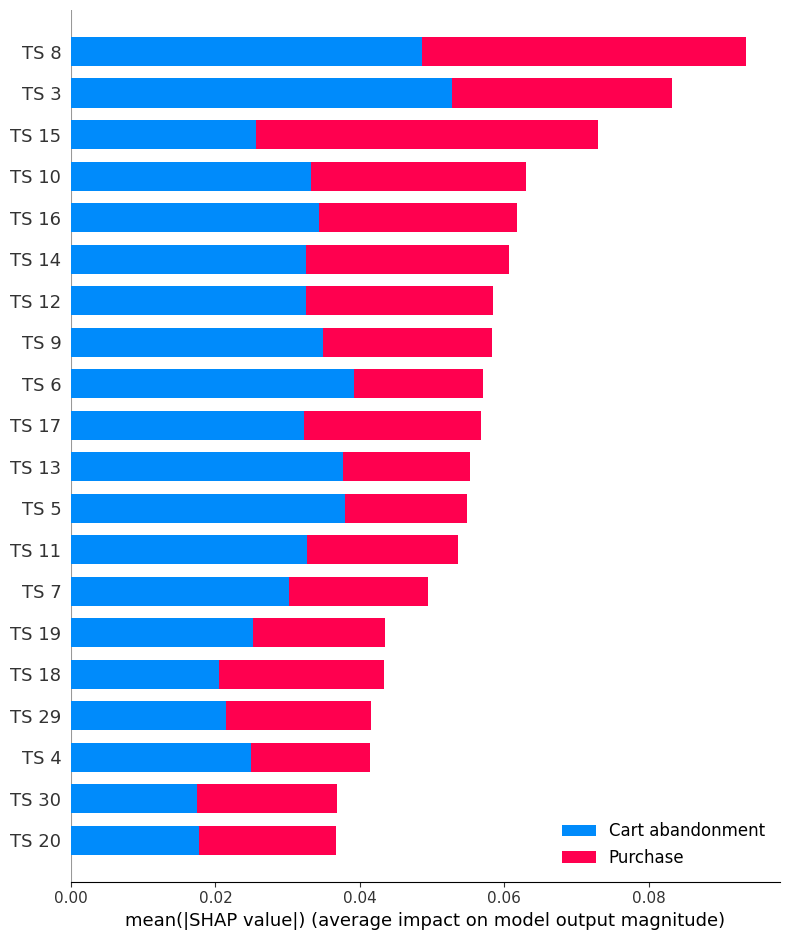

In [ ]:
# Reshape the SHAP values matrix to match the shape of the features matrix for each class
shap_values_class0_reshaped = shap_values_class0.reshape(shap_values_class0.shape[0], shap_values_class0.shape[1], -1)
shap_values_class1_reshaped = shap_values_class1.reshape(shap_values_class1.shape[0], shap_values_class1.shape[1], -1)

# Aggregate SHAP values across all features for each class
shap_values_class0_aggregated = np.mean(shap_values_class0, axis=2)
shap_values_class1_aggregated = np.mean(shap_values_class1, axis=2)

# Create a matplotlib figure and axis
fig, ax = plt.subplots()

# Plot the aggregated SHAP values for the top ten features for both classes in one summary plot
shap.summary_plot([shap_values_class0_aggregated, shap_values_class1_aggregated],
                  feature_names=feature_names,
                  plot_type='bar',
                  class_names=['Cart abandonment', 'Purchase'],
                  show=False)  # Prevents immediate showing of the plot

# Save the figure as a PDF
plt.savefig('shap_summary_plot_LSTM_SMOTE.pdf', bbox_inches='tight')  # Save as PDF

# If you want to display the plot as well, uncomment the next line
# plt.show()

## Oversampling with Undersampling (GRU)

In [ ]:
from imblearn.pipeline import Pipeline
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import AdaBoostClassifier
from imblearn.combine import SMOTEENN
from imblearn.under_sampling import EditedNearestNeighbours

In [ ]:
Counter(labels_train)

Counter({1.0: 30, 0.0: 70})

In [ ]:
print("Class distribution after oversampling:", Counter(labels_train))

#Define SMOTE-ENN
resample=SMOTEENN(enn=EditedNearestNeighbours(sampling_strategy="auto", n_neighbors= 1))

padded_sequences_train_re, labels_train_re = resample.fit_resample(X_train, y_train)
# Print the distribution of classes after oversampling
print("Class distribution after oversampling:", Counter(labels_train_re))

Class distribution after oversampling: Counter({0.0: 123059, 1.0: 36434})
Class distribution after oversampling: Counter({0.0: 92300, 1.0: 67833})


In [ ]:
# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(padded_sequences_train_re, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

In [ ]:
model_GRU_ovs_uns = Sequential([
    GRU(64, input_shape=(None, 1)),
    Dropout(0.5),
    Dense(32, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.001)
model_GRU_ovs_uns.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model_GRU_ovs_uns.fit(X_train_reshaped, labels_train_re, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
2503/2503 [==============================] - 84s 31ms/step - loss: 0.6796 - accuracy: 0.5837 - val_loss: 0.6156 - val_accuracy: 0.7606
Epoch 2/10
2503/2503 [==============================] - 63s 25ms/step - loss: 0.5537 - accuracy: 0.6967 - val_loss: 0.5355 - val_accuracy: 0.6619
Epoch 3/10
2503/2503 [==============================] - 56s 22ms/step - loss: 0.4978 - accuracy: 0.7411 - val_loss: 0.5005 - val_accuracy: 0.7373
Epoch 4/10
2503/2503 [==============================] - 57s 23ms/step - loss: 0.4831 - accuracy: 0.7515 - val_loss: 0.5056 - val_accuracy: 0.7101
Epoch 5/10
2503/2503 [==============================] - 57s 23ms/step - loss: 0.4748 - accuracy: 0.7562 - val_loss: 0.5121 - val_accuracy: 0.7176
Epoch 6/10
2503/2503 [==============================] - 54s 22ms/step - loss: 0.4677 - accuracy: 0.7602 - val_loss: 0.5324 - val_accuracy: 0.6970
Epoch 7/10
2503/2503 [==============================] - 55s 22ms/step - loss: 0.4606 - accuracy: 0.7666 - val_loss: 0.4985 -

In [ ]:
# Predict labels for the test set
y_pred = model.predict(padded_sequences_test)
y_pred_binary = (y_pred > 0.25).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 10s 8ms/step
F1 Score: 0.49515011547344107


              precision    recall  f1-score   support

         0.0       0.85      0.79      0.82     30729
         1.0       0.42      0.52      0.47      9145

    accuracy                           0.73     39874
   macro avg       0.63      0.65      0.64     39874
weighted avg       0.75      0.73      0.74     39874



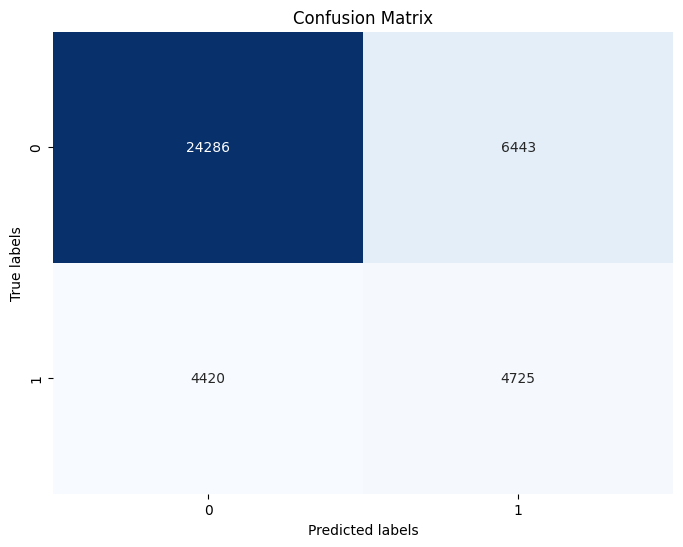

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred_binary)
cr_error = classification_report(y_test, y_pred_binary)
print(cr_error)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

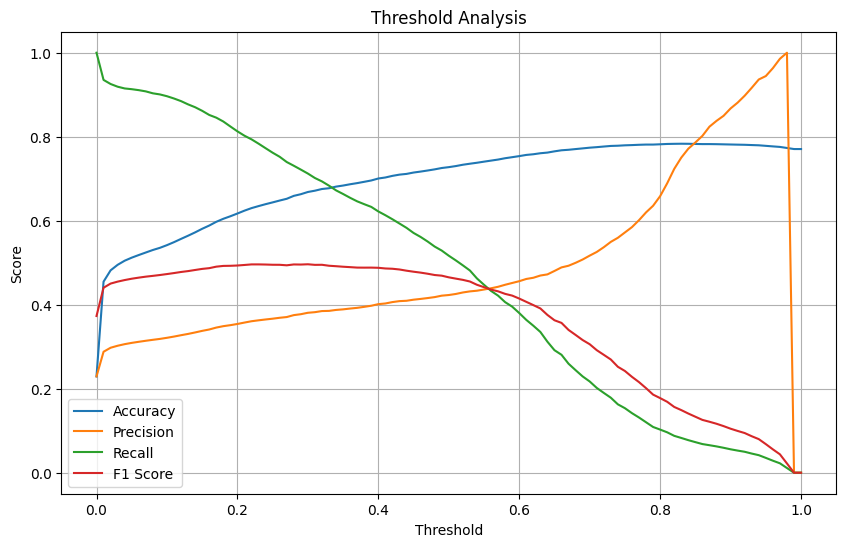

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

# Plot the evaluation metrics against thresholds
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Threshold Analysis')
plt.legend()
plt.grid(True)
plt.show()

## Undersampling ENN (GRU)

In [ ]:
sequences_train = X_train['session'].tolist()
sequences_test = X_test['session'].tolist()
sequences_train = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train]
sequences_test = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_test]

# Pad sequences to a fixed length
max_length = 30  # Choose the maximum length you want
padded_sequences_train = pad_sequences(sequences_train, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test = pad_sequences(sequences_test, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train = np.array(padded_sequences_train)
labels_train = np.array(y_train)
sequences_test = np.array(padded_sequences_test)
labels_test = np.array(y_test)

In [ ]:
# Split the data into train, validation, and test sets
X_train, X_val, y_train, y_val = train_test_split(sequences_train, labels_train, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(X_train, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

In [ ]:
X_train.shape

(119619, 30)

In [ ]:
y_train.shape

(119619,)

In [ ]:
# Original dataset
print('Original dataset shape:', Counter(y_train))

enn = EditedNearestNeighbours(n_neighbors=5)  # Adjust the n_neighbors parameter as needed
X_res, y_res = enn.fit_resample(X_train, y_train)

# Print the shape of the resampled dataset
print('Resampled dataset shape:', Counter(y_res))

Original dataset shape: Counter({0.0: 92300, 1.0: 27319})
Resampled dataset shape: Counter({0.0: 34899, 1.0: 27319})


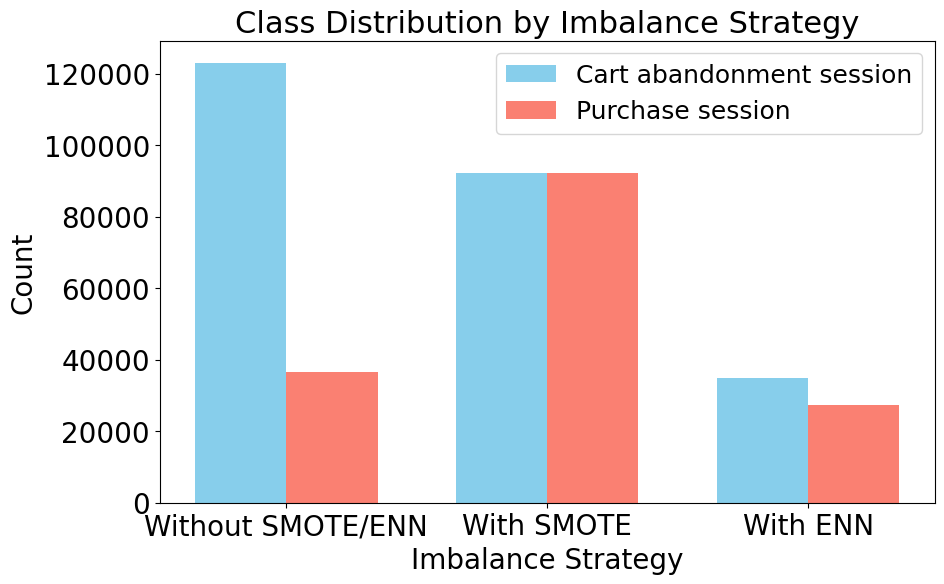

In [ ]:
# Data
strategies = ['Without SMOTE/ENN', 'With SMOTE', 'With ENN']
counts_0 = [123059, 92300, 34893]
counts_1 = [36434, 92300, 27319]

fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.35  # width of bars

index = range(len(strategies))

# Plotting
bars1 = ax.bar(index, counts_0, bar_width, label='Cart abandonment session', color='skyblue')
bars2 = ax.bar([p + bar_width for p in index], counts_1, bar_width, label='Purchase session', color='salmon')

# Increase font sizes
ax.set_xlabel('Imbalance Strategy', fontsize=20)  # Increase font size for x-axis label
ax.set_ylabel('Count', fontsize=20)  # Increase font size for y-axis label
ax.set_title('Class Distribution by Imbalance Strategy', fontsize=22)  # Increase font size for title
ax.set_xticks([p + bar_width / 2 for p in index])
ax.set_xticklabels(strategies, fontsize=18)  # Increase font size for x-axis tick labels
ax.legend(fontsize=18)  # Increase font size for legend
ax.tick_params(axis='both', which='major', labelsize=20)

plt.savefig('Class distributions.pdf', format='pdf')
plt.show()

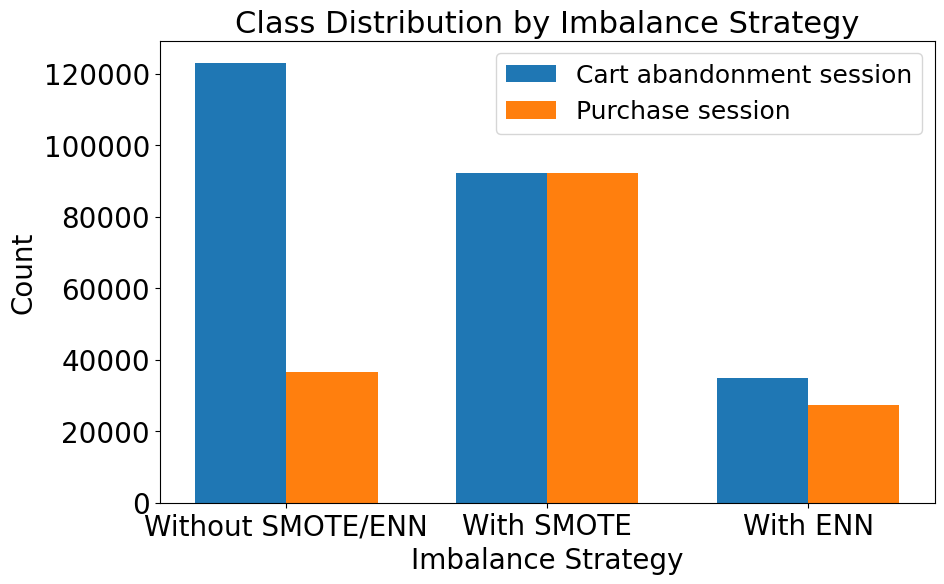

In [ ]:
# Data
strategies = ['Without SMOTE/ENN', 'With SMOTE', 'With ENN']
counts_0 = [123059, 92300, 34893]
counts_1 = [36434, 92300, 27319]

fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.35  # width of bars

index = np.arange(len(strategies))

# Define color scheme using "tab:blue" and "tab:orange"
color_scheme_0 = 'tab:blue'
color_scheme_1 = 'tab:orange'

# Plotting
bars1 = ax.bar(index, counts_0, bar_width, label='Cart abandonment session', color=color_scheme_0)
bars2 = ax.bar(index + bar_width, counts_1, bar_width, label='Purchase session', color=color_scheme_1)

# Increase font sizes
ax.set_xlabel('Imbalance Strategy', fontsize=20)  # Increase font size for x-axis label
ax.set_ylabel('Count', fontsize=20)  # Increase font size for y-axis label
ax.set_title('Class Distribution by Imbalance Strategy', fontsize=22)  # Increase font size for title
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(strategies, fontsize=18)  # Increase font size for x-axis tick labels
ax.legend(fontsize=18)  # Increase font size for legend
ax.tick_params(axis='both', which='major', labelsize=20)

plt.savefig('Class_distributions.pdf', format='pdf')
plt.show()

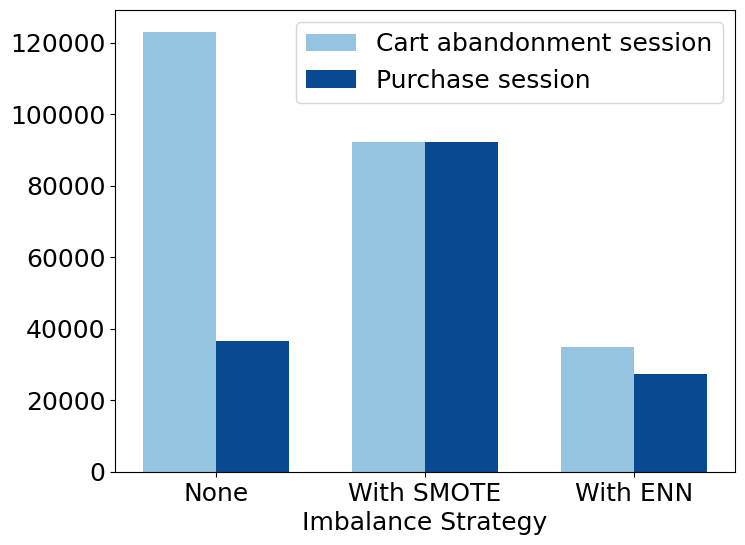

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
strategies = ['None', 'With SMOTE', 'With ENN']
counts_0 = [123059, 92300, 34893]
counts_1 = [36434, 92300, 27319]

fig, ax = plt.subplots(figsize=(8, 6))
bar_width = 0.35  # width of bars

index = np.arange(len(strategies))

# Define color scheme using the "Blues" palette
blues_palette = plt.get_cmap('Blues')
color_scheme_0 = blues_palette(0.4)
color_scheme_1 = blues_palette(0.9)

# Plotting
bars1 = ax.bar(index, counts_0, bar_width, label='Cart abandonment session', color=color_scheme_0)
bars2 = ax.bar(index + bar_width, counts_1, bar_width, label='Purchase session', color=color_scheme_1)

# Increase font sizes
ax.set_xlabel('Imbalance Strategy', fontsize=18)  # Increase font size for x-axis label
# ax.set_ylabel('Count', fontsize=14)  # Increase font size for y-axis label
# ax.set_title('Class Distribution by Imbalance Strategy', fontsize=22)  # Increase font size for title
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(strategies, fontsize=18)  # Increase font size for x-axis tick labels
ax.legend(fontsize=18)  # Increase font size for legend
ax.tick_params(axis='both', which='major', labelsize=18)

plt.savefig('Class_distributions.pdf', format='pdf')
plt.show()


In [ ]:
# n_neighbors = 3
# Resampled dataset shape: Counter({0.0: 65752, 1.0: 36434})
# n_neighbors = 5
# Resampled dataset shape: Counter({0.0: 47289, 1.0: 36434})
# n_neighbors = 7
# Resampled dataset shape: Counter({1.0: 36434, 0.0: 36060})

In [ ]:
# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(X_res, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

In [ ]:
model_GRU_uns = Sequential([
    GRU(32, input_shape=(None, 1)),
    Dropout(0.25),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.001)
model_GRU_uns.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model_GRU_uns.fit(X_train_reshaped, y_res, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
973/973 [==============================] - 14s 8ms/step - loss: 0.6393 - accuracy: 0.6271 - val_loss: 0.6263 - val_accuracy: 0.6485
Epoch 2/10
973/973 [==============================] - 7s 7ms/step - loss: 0.4352 - accuracy: 0.7798 - val_loss: 0.8151 - val_accuracy: 0.5975
Epoch 3/10
973/973 [==============================] - 8s 8ms/step - loss: 0.3861 - accuracy: 0.8103 - val_loss: 0.7959 - val_accuracy: 0.5989
Epoch 4/10
973/973 [==============================] - 7s 7ms/step - loss: 0.3703 - accuracy: 0.8165 - val_loss: 0.8035 - val_accuracy: 0.6136
Epoch 5/10
973/973 [==============================] - 8s 8ms/step - loss: 0.3606 - accuracy: 0.8207 - val_loss: 0.7114 - val_accuracy: 0.6348
Epoch 6/10
973/973 [==============================] - 8s 8ms/step - loss: 0.3535 - accuracy: 0.8240 - val_loss: 0.7441 - val_accuracy: 0.6374
Epoch 7/10
973/973 [==============================] - 6s 6ms/step - loss: 0.3498 - accuracy: 0.8240 - val_loss: 0.7113 - val_accuracy: 0.6460
Epoch

In [ ]:
model_save_name = 'model_GRU_uns.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_uns.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_GRU_uns.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_uns = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_GRU_uns.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.40039).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_res, y_pred_binary)

print("F1 Score:", f1)

1945/1945 [==============================] - 5s 3ms/step
F1 Score: 0.8252526069032414


In [ ]:
# Predict labels for the test set
y_pred_probs = model_GRU_uns.predict(X_train_reshaped)

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_res, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

1945/1945 [==============================] - 6s 3ms/step
Optimal Threshold: 0.400390625
Optimal F1 Score: 0.8252526069032414


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_uns.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_res, y_pred_binary)

print("F1 Score:", f1)

1945/1945 [==============================] - 5s 3ms/step
F1 Score: 0.8102991429563438


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_uns.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.40039).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 4s 3ms/step
F1 Score: 0.49244273921637016


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_uns.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.5117504332755632


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_uns.predict(padded_sequences_test)
y_pred_binary_GRU_uns = (y_pred > 0.40039).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_uns)

print("F1 Score:", f1)

1247/1247 [==============================] - 10s 8ms/step
F1 Score: 0.4942912756747334


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_uns.predict(padded_sequences_test)
y_pred_binary_GRU_uns = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_uns)

print("F1 Score:", f1)

1247/1247 [==============================] - 16s 13ms/step
F1 Score: 0.5176806348322428


In [ ]:
y_pred[:10]

array([[0.50895387],
       [0.00244271],
       [0.8883189 ],
       [0.82357997],
       [0.9142144 ],
       [0.45095834],
       [0.67497915],
       [0.9917505 ],
       [0.5575873 ],
       [0.00451035]], dtype=float32)

Mean Probability: 0.47926339507102966
Standard Deviation: 0.34529387950897217


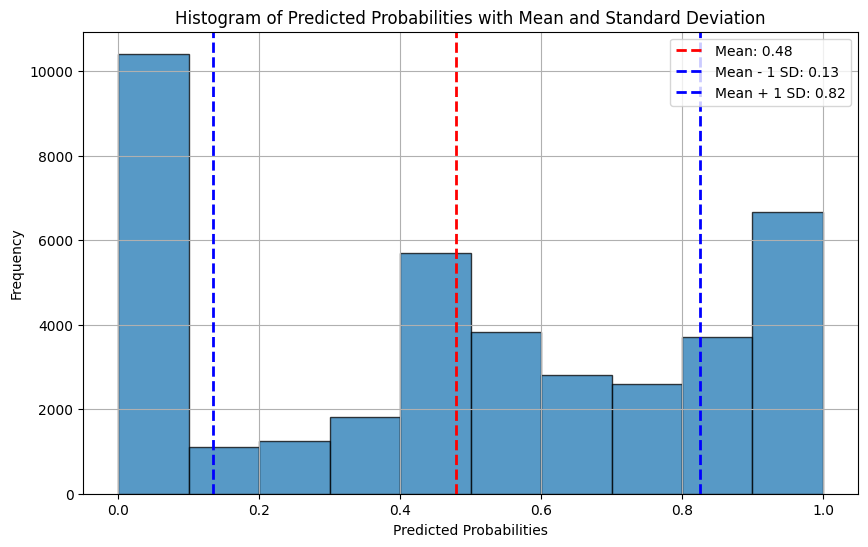

In [ ]:

# Calculate mean and standard deviation
mean_prob = np.mean(y_pred)
std_prob = np.std(y_pred)

print(f"Mean Probability: {mean_prob}")
print(f"Standard Deviation: {std_prob}")

# Plotting the probabilities with mean and standard deviation
plt.figure(figsize=(10, 6))
plt.hist(y_pred, bins=10, alpha=0.75, edgecolor='black')
plt.axvline(mean_prob, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_prob:.2f}')
plt.axvline(mean_prob - std_prob, color='blue', linestyle='dashed', linewidth=2, label=f'Mean - 1 SD: {mean_prob - std_prob:.2f}')
plt.axvline(mean_prob + std_prob, color='blue', linestyle='dashed', linewidth=2, label=f'Mean + 1 SD: {mean_prob + std_prob:.2f}')
plt.xlabel('Predicted Probabilities')
plt.ylabel('Frequency')
plt.title('Histogram of Predicted Probabilities with Mean and Standard Deviation')
plt.legend()
plt.grid(True)
plt.show()

#### Error Analysis

Brier Score: 0.25087619078274415


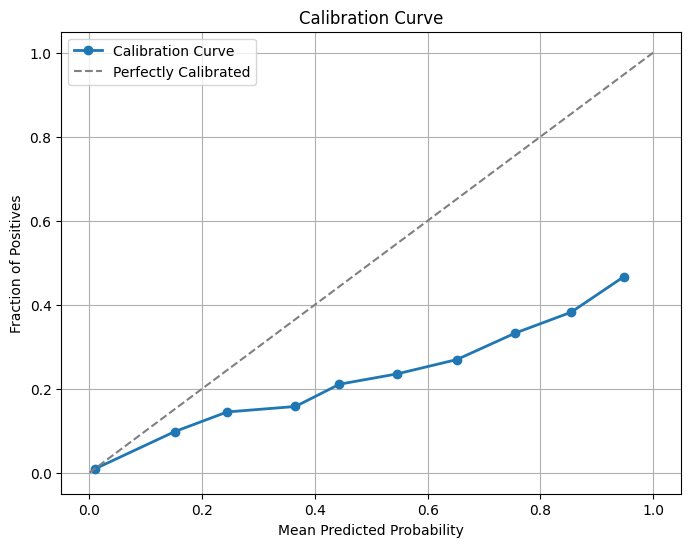

In [ ]:
prob_true, prob_pred = calibration_curve(y_test, y_pred, n_bins=10, strategy='uniform')

# Compute Brier score
brier_score = brier_score_loss(y_test, y_pred)
print("Brier Score:", brier_score)

# Plot calibration curve
plt.figure(figsize=(8, 6))
plt.plot(prob_pred, prob_true, marker='o', linewidth=2, label='Calibration Curve')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly Calibrated')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Curve')
plt.legend()
plt.grid(True)
plt.show()

              precision    recall  f1-score   support

         0.0       0.92      0.60      0.73     30729
         1.0       0.38      0.81      0.52      9145

    accuracy                           0.65     39874
   macro avg       0.65      0.71      0.62     39874
weighted avg       0.79      0.65      0.68     39874



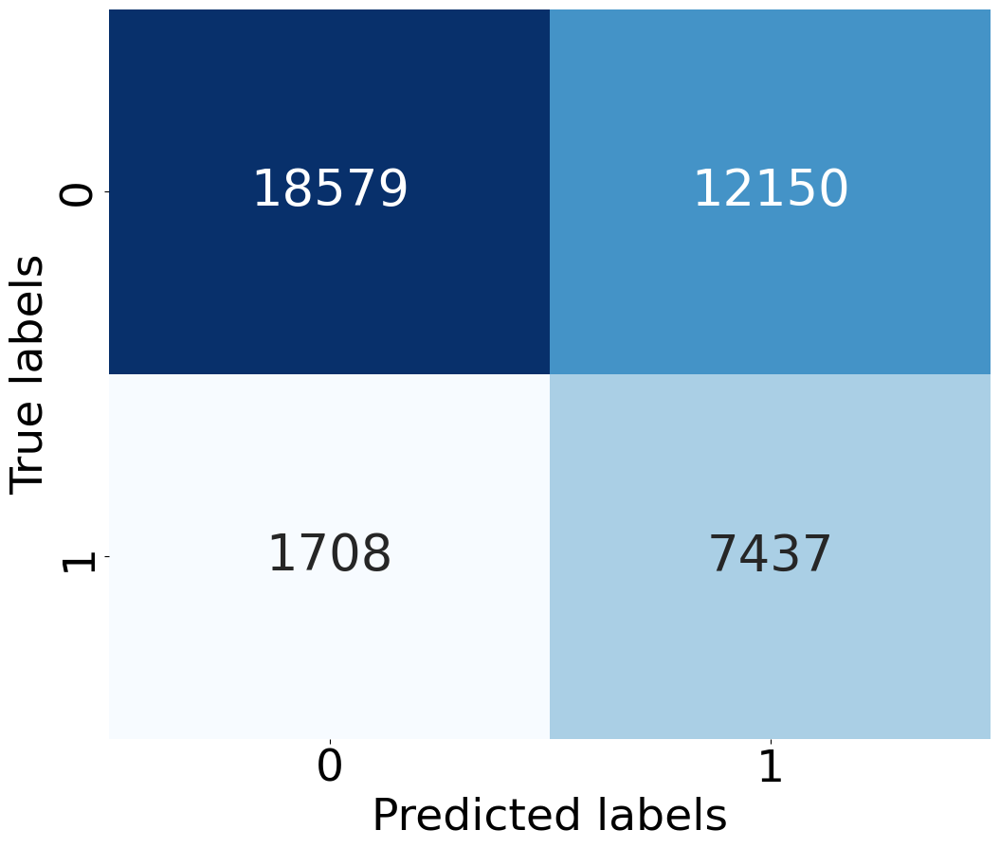

In [ ]:
# Compute confusion matrix and classification report for GRU ENN
conf_matrix = confusion_matrix(y_test, y_pred_binary_GRU_uns)
cr_error = classification_report(y_test, y_pred_binary_GRU_uns)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 38})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix GRU ENN', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig("Confusion_Matrix_GRU_ENN.pdf", format='pdf', bbox_inches='tight')
plt.show()

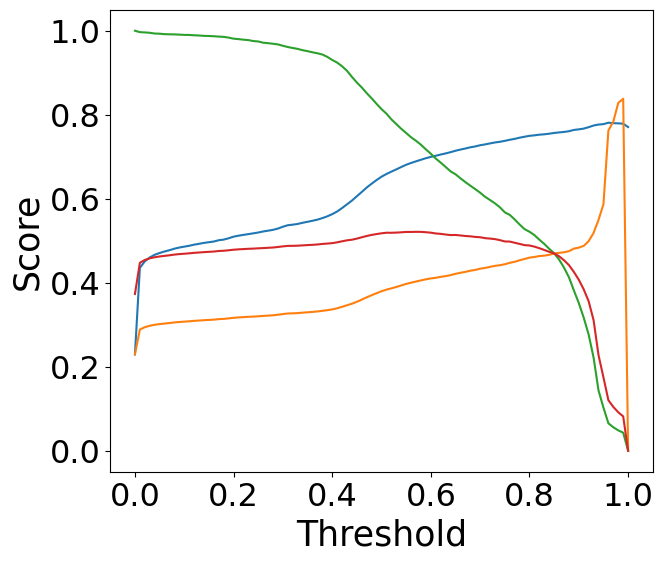

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_GRU_uns = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_GRU_uns)
    precision = precision_score(y_test, y_pred_binary_GRU_uns)
    recall = recall_score(y_test, y_pred_binary_GRU_uns)
    f1 = f1_score(y_test, y_pred_binary_GRU_uns)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis GRU ENN', fontsize=30)
# plt.legend(fontsize=22)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig('Threshold_Analysis_GRU_ENN.pdf', bbox_inches='tight')
plt.show()

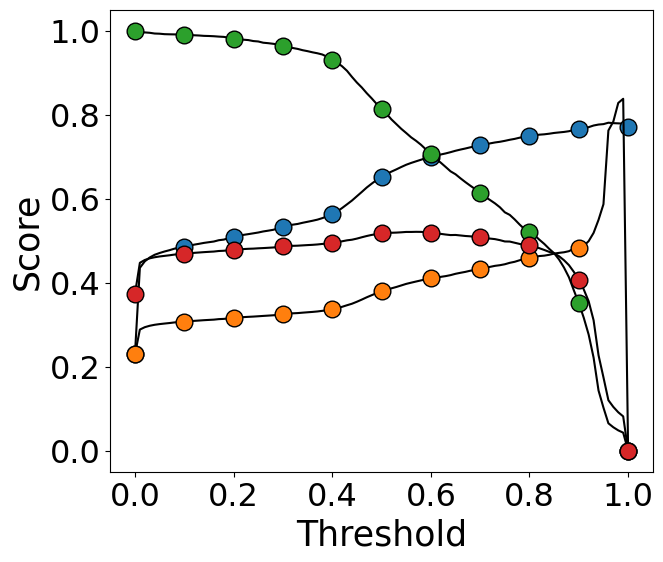

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_GRU_ENN.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
# Train the model
history = model_GRU_uns.fit(X_train_reshaped, y_res, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
973/973 [==============================] - 8s 7ms/step - loss: 0.3400 - accuracy: 0.8305 - val_loss: 0.6799 - val_accuracy: 0.6661
Epoch 2/10
973/973 [==============================] - 8s 8ms/step - loss: 0.3383 - accuracy: 0.8312 - val_loss: 0.7318 - val_accuracy: 0.6298
Epoch 3/10
973/973 [==============================] - 6s 7ms/step - loss: 0.3370 - accuracy: 0.8315 - val_loss: 0.7848 - val_accuracy: 0.6287
Epoch 4/10
973/973 [==============================] - 8s 9ms/step - loss: 0.3350 - accuracy: 0.8311 - val_loss: 0.7906 - val_accuracy: 0.6173
Epoch 5/10
973/973 [==============================] - 7s 7ms/step - loss: 0.3349 - accuracy: 0.8331 - val_loss: 0.7802 - val_accuracy: 0.6267
Epoch 6/10
973/973 [==============================] - 9s 9ms/step - loss: 0.3339 - accuracy: 0.8328 - val_loss: 0.7419 - val_accuracy: 0.6199
Epoch 7/10
973/973 [==============================] - 6s 7ms/step - loss: 0.3324 - accuracy: 0.8343 - val_loss: 0.7435 - val_accuracy: 0.6334
Epoch 

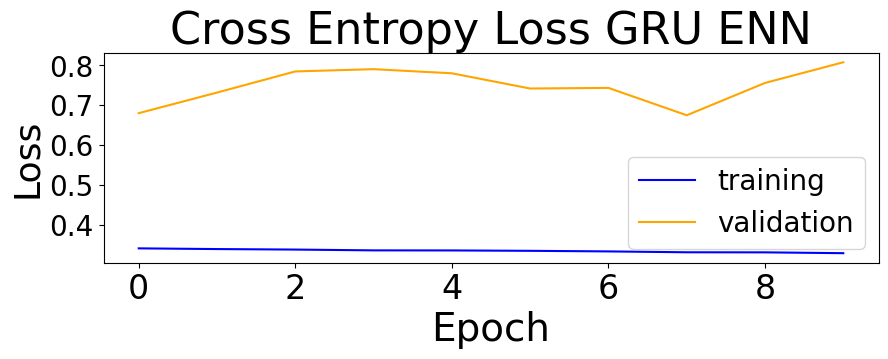

In [ ]:
# Plot Cross Entropy Loss for GRU ENN
plt.figure(figsize=(10, 6))
plt.subplot(211)
plt.title('Cross Entropy Loss GRU ENN', fontsize=32)
plt.plot(history.history['loss'], color='blue', label='train')
plt.plot(history.history['val_loss'], color='orange', label='test')
plt.legend(['training', 'validation'], fontsize=20)
plt.xlabel('Epoch', fontsize=28)
plt.ylabel('Loss', fontsize=26)
plt.xticks(fontsize=24)
plt.yticks(fontsize=20)
plt.savefig('Cross_Entropy_Loss_GRU_ENN.pdf', format='pdf')
plt.show()

In [ ]:
# Predict labels for the test set
y_pred_LSTM_ovs = model_LSTM_ovs.predict(padded_sequences_test)
y_pred_GRU_ovs = model_GRU_ovs.predict(padded_sequences_test)
y_pred_LSTM_uns = model_LSTM_uns.predict(padded_sequences_test)
y_pred_GRU_uns = model_GRU_uns.predict(padded_sequences_test)

1247/1247 [==============================] - 6s 5ms/step


In [ ]:
def predict_df(df):
    predictions = []
    for index, row in df.iterrows():
        sequence = row['session']
        purchase_probability = markov_model.predict_purchase_probability(sequence)
        predictions.append(purchase_probability)
    return predictions

data = {'session': X_test["session"], 'conversion': y_test}
X_test = pd.DataFrame(data)

# Make predictions on the dataframe
y_pred_markov = predict_df(X_test)

In [ ]:
y_pred_markov = y_pred_markov[:39874]

In [ ]:
print(len(y_pred_LSTM_ovs))

39874


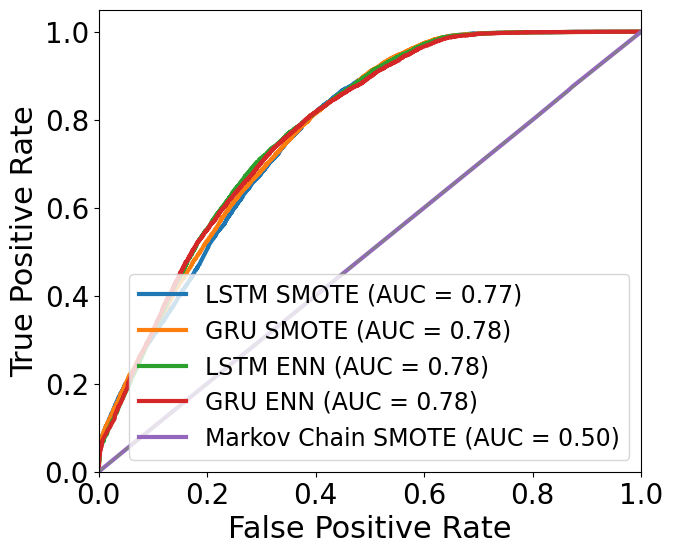

In [ ]:
# Compute ROC curve for LSTM SMOTE
fpr_lstm_ovs, tpr_lstm_ovs, thresholds_lstm_ovs = roc_curve(y_test, y_pred_LSTM_ovs)
roc_auc_lstm_ovs = auc(fpr_lstm_ovs, tpr_lstm_ovs)

# Compute ROC curve for GRU SMOTE
fpr_gru_ovs, tpr_gru_ovs, thresholds_gru_ovs = roc_curve(y_test, y_pred_GRU_ovs)
roc_auc_gru_ovs = auc(fpr_gru_ovs, tpr_gru_ovs)

# Compute ROC curve for LSTM ENN
fpr_lstm_uns, tpr_lstm_uns, thresholds_LSTM_uns = roc_curve(y_test, y_pred_LSTM_uns)
roc_auc_LSTM_uns = auc(fpr_lstm_uns, tpr_lstm_uns)

# Compute ROC curve for GRU ENN
fpr_GRU_uns, tpr_GRU_uns, thresholds_GRU_uns = roc_curve(y_test, y_pred_GRU_uns)
roc_auc_GRU_uns = auc(fpr_GRU_uns, tpr_GRU_uns)

# Compute ROC curve for Markov Chain
fpr_markov, tpr_markov, thresholds_markov = roc_curve(y_test, y_pred_markov)
roc_auc_markov = auc(fpr_markov, tpr_markov)

# Plot ROC curve
plt.figure(figsize=(7, 6))
plt.plot(fpr_lstm_ovs, tpr_lstm_ovs, color='tab:blue', lw=3, label=f'LSTM SMOTE (AUC = {roc_auc_lstm_ovs:.2f})')
plt.plot(fpr_gru_ovs, tpr_gru_ovs, color='tab:orange', lw=3, label=f'GRU SMOTE (AUC = {roc_auc_gru_ovs:.2f})')
plt.plot(fpr_lstm_uns, tpr_lstm_uns, color='tab:green', lw=3, label=f'LSTM ENN (AUC = {roc_auc_LSTM_uns:.2f})')
plt.plot(fpr_GRU_uns, tpr_GRU_uns, color='tab:red', lw=3, label=f'GRU ENN (AUC = {roc_auc_GRU_uns:.2f})')
plt.plot(fpr_markov, tpr_markov, color='tab:purple', lw=3, label=f'Markov Chain SMOTE (AUC = {roc_auc_markov:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=22)
plt.ylabel('True Positive Rate', fontsize=22)
# plt.title('ROC Curves', fontsize=24)
plt.legend(loc="lower right", fontsize=17)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
# plt.grid(True)
plt.savefig('ROC_Curves_imb.pdf', format='pdf')
plt.show()

#### SHAP

In [ ]:
# Set a fixed random seed
np.random.seed(42)

sample_size = 100
sample_indices = np.random.choice(len(padded_sequences_test), size=sample_size, replace=False)
subset_X_test_reshaped = padded_sequences_test[sample_indices]

In [ ]:
# Summarize the background data using k-means
background_summary = shap.kmeans(subset_X_test_reshaped, 5)  # You can adjust the number of clusters (K) as needed

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_GRU_uns.predict, background_summary)

# Compute SHAP values for the test data
shap_values_test_kernel = kernel_explainer.shap_values(subset_X_test_reshaped)

1/1 [==============================] - 1s 752ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

330/330 [==============================] - 2s 7ms/step


In [ ]:
# Define feature names based on the time steps in the sequence
# TS = Time Step
feature_names = [f"TS {i+1}" for i in range(subset_X_test_reshaped.shape[1])]

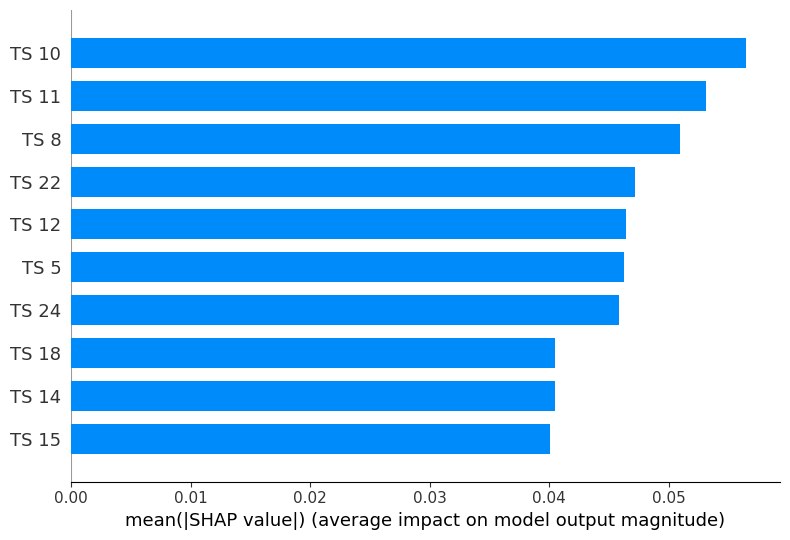

In [ ]:
# Reshape the SHAP values matrix to match the shape of the features matrix
shap_values_test_kernel_reshaped = shap_values_test_kernel.reshape(shap_values_test_kernel.shape[0], shap_values_test_kernel.shape[1], -1)

# Aggregate SHAP values across all features
shap_values_aggregated = np.mean(shap_values_test_kernel, axis=2)

# Get the mean absolute SHAP values for each feature
mean_abs_shap_values = np.mean(np.abs(shap_values_aggregated), axis=0)

# Sort the features based on their mean absolute SHAP values
sorted_indices = np.argsort(mean_abs_shap_values)[::-1]

# Select only the top ten features
top_ten_indices = sorted_indices[:10]
top_ten_features = subset_X_test_reshaped[:, top_ten_indices]
top_ten_feature_names = [feature_names[i] for i in top_ten_indices]

# Plot the aggregated SHAP values for the top ten features
shap.summary_plot(shap_values_aggregated[:, top_ten_indices], features=top_ten_features, feature_names=top_ten_feature_names , plot_type='bar')

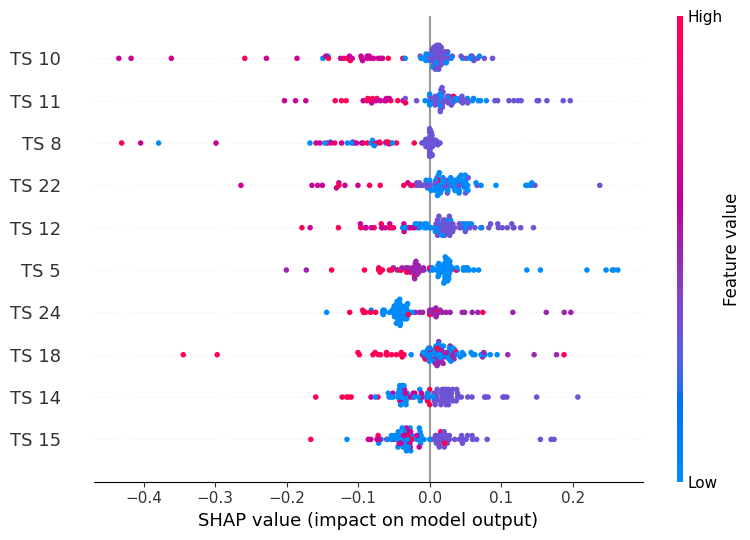

In [ ]:
shap.summary_plot(shap_values_aggregated[:, top_ten_indices], features=top_ten_features, feature_names=top_ten_feature_names)

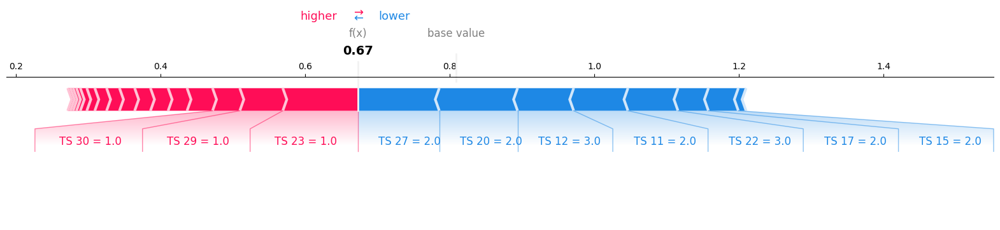

In [ ]:
# Choose an instance to explain (e.g., the first instance)
instance_index = 5

# Generate force plot for the chosen instance
shap.force_plot(kernel_explainer.expected_value, shap_values_test_kernel[instance_index][:, 0], subset_X_test_reshaped[instance_index], matplotlib=True, feature_names= feature_names)

### Random Undersampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

# Original dataset
print('Original dataset shape:', Counter(y_train))

rus = RandomUnderSampler(random_state=42)  # You can adjust the random_state parameter as needed
X_res, y_res = rus.fit_resample(X_train, y_train)

# Print the shape of the resampled dataset
print('Resampled dataset shape:', Counter(y_res))

Original dataset shape: Counter({0.0: 92300, 1.0: 27319})
Resampled dataset shape: Counter({0.0: 27319, 1.0: 27319})


In [ ]:
# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(X_res, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

In [ ]:
model_GRU_uns = Sequential([
    GRU(64, input_shape=(None, 1)),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.001)
model_GRU_uns.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model_GRU_uns.fit(X_train_reshaped, y_res, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
854/854 [==============================] - 13s 10ms/step - loss: 0.6903 - accuracy: 0.5169 - val_loss: 0.6992 - val_accuracy: 0.2290
Epoch 2/10
854/854 [==============================] - 11s 13ms/step - loss: 0.6810 - accuracy: 0.5333 - val_loss: 0.6860 - val_accuracy: 0.7542
Epoch 3/10
854/854 [==============================] - 14s 17ms/step - loss: 0.6790 - accuracy: 0.5340 - val_loss: 0.6608 - val_accuracy: 0.7558
Epoch 4/10
854/854 [==============================] - 15s 18ms/step - loss: 0.6737 - accuracy: 0.5485 - val_loss: 0.5896 - val_accuracy: 0.6910
Epoch 5/10
854/854 [==============================] - 10s 11ms/step - loss: 0.5843 - accuracy: 0.6602 - val_loss: 0.5602 - val_accuracy: 0.5932
Epoch 6/10
854/854 [==============================] - 7s 9ms/step - loss: 0.5590 - accuracy: 0.6820 - val_loss: 0.5141 - val_accuracy: 0.6687
Epoch 7/10
854/854 [==============================] - 6s 7ms/step - loss: 0.5503 - accuracy: 0.6903 - val_loss: 0.5296 - val_accuracy: 0.6

In [ ]:
# Predict labels for the test set
y_pred = model_GRU_uns.predict(padded_sequences_test)
y_pred_binary = (y_pred > 0.54).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.5215227668574273


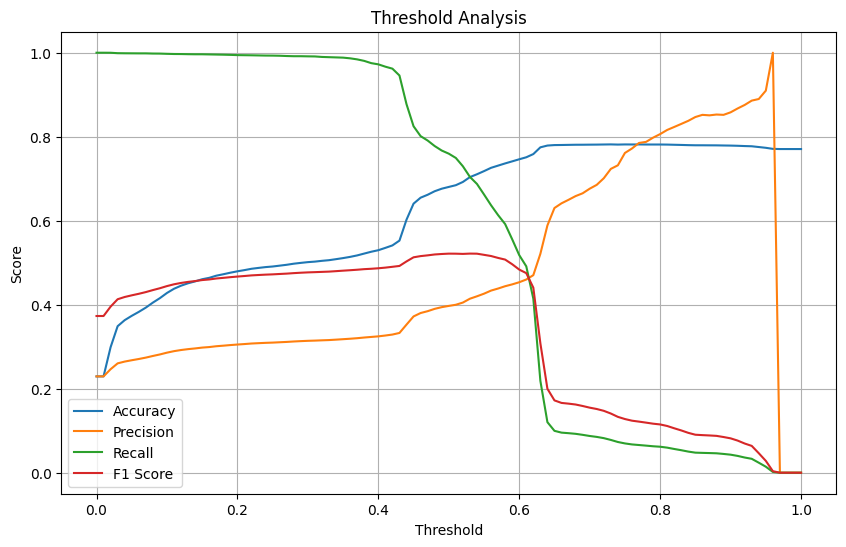

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

# Plot the evaluation metrics against thresholds
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Threshold Analysis')
plt.legend()
plt.grid(True)
plt.show()

## Undersampling ENN (LSTM)

In [ ]:
sequences_train = X_train['session'].tolist()
sequences_test = X_test['session'].tolist()
sequences_train = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train]
sequences_test = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_test]

# Pad sequences to a fixed length
max_length = 30  # Choose the maximum length you want
padded_sequences_train = pad_sequences(sequences_train, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test = pad_sequences(sequences_test, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train = np.array(padded_sequences_train)
labels_train = np.array(y_train)
sequences_test = np.array(padded_sequences_test)
labels_test = np.array(y_test)

In [ ]:
# Split the data into train, validation, and test sets
X_train, X_val, y_train, y_val = train_test_split(sequences_train, labels_train, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Reshape the input data to match the expected input shape of the GRU layer
X_train_reshaped = np.expand_dims(X_train, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

In [ ]:
X_train.shape

(119619, 30)

In [ ]:
y_train.shape

(119619,)

In [ ]:
# Original dataset
print('Original dataset shape:', Counter(y_train))

enn = EditedNearestNeighbours(n_neighbors=5)  # Adjust the n_neighbors parameter as needed
X_res, y_res = enn.fit_resample(X_train, y_train)

# Print the shape of the resampled dataset
print('Resampled dataset shape:', Counter(y_res))

Original dataset shape: Counter({0.0: 92300, 1.0: 27319})
Resampled dataset shape: Counter({0.0: 34899, 1.0: 27319})


In [ ]:
X_train_reshaped = np.expand_dims(X_res, axis=-1)
X_val_reshaped = np.expand_dims(X_val, axis=-1)

In [ ]:
model_LSTM_uns = Sequential([
    LSTM(32, input_shape=(None, 1)),
    Dropout(0.25),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.01)
model_LSTM_uns.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model_LSTM_uns.fit(X_train_reshaped, y_res, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
973/973 [==============================] - 14s 8ms/step - loss: 0.5227 - accuracy: 0.7131 - val_loss: 0.7466 - val_accuracy: 0.5466
Epoch 2/10
973/973 [==============================] - 9s 9ms/step - loss: 0.3726 - accuracy: 0.8129 - val_loss: 0.7317 - val_accuracy: 0.6192
Epoch 3/10
973/973 [==============================] - 8s 9ms/step - loss: 0.3610 - accuracy: 0.8194 - val_loss: 0.6343 - val_accuracy: 0.6546
Epoch 4/10
973/973 [==============================] - 7s 7ms/step - loss: 0.3549 - accuracy: 0.8226 - val_loss: 0.6782 - val_accuracy: 0.6761
Epoch 5/10
973/973 [==============================] - 8s 8ms/step - loss: 0.3471 - accuracy: 0.8254 - val_loss: 0.7561 - val_accuracy: 0.6013
Epoch 6/10
973/973 [==============================] - 7s 7ms/step - loss: 0.3459 - accuracy: 0.8266 - val_loss: 0.7020 - val_accuracy: 0.6452
Epoch 7/10
973/973 [==============================] - 9s 9ms/step - loss: 0.3425 - accuracy: 0.8267 - val_loss: 0.6871 - val_accuracy: 0.6305
Epoch

In [ ]:
model_save_name = 'model_LSTM_uns.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_uns.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_LSTM_uns.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_uns = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_uns.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.38867).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_res, y_pred_binary)

print("F1 Score:", f1)

1945/1945 [==============================] - 5s 2ms/step
F1 Score: 0.8311773267699151


In [ ]:
# Predict labels for the test set
y_pred_probs = model_LSTM_uns.predict(X_train_reshaped)

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_res, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

1945/1945 [==============================] - 6s 3ms/step
Optimal Threshold: 0.388671875
Optimal F1 Score: 0.8311773267699151


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_uns.predict(X_train_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_res, y_pred_binary)

print("F1 Score:", f1)

1945/1945 [==============================] - 4s 2ms/step
F1 Score: 0.8141557276505373


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_uns.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.38867).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.4979437261457439


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_uns.predict(X_val_reshaped)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary)

print("F1 Score:", f1)

1247/1247 [==============================] - 18s 13ms/step
F1 Score: 0.5140164077500435


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_uns.predict(padded_sequences_test)
y_pred_binary_LSTM_uns = (y_pred > 0.38867).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_uns)

print("F1 Score:", f1)

1247/1247 [==============================] - 10s 8ms/step
F1 Score: 0.5013198872905236


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_uns.predict(padded_sequences_test)
y_pred_binary_LSTM_uns = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_uns)

print("F1 Score:", f1)

1247/1247 [==============================] - 19s 14ms/step
F1 Score: 0.5179684763572678


### Error Analysis

Brier Score: 0.25087619078274415


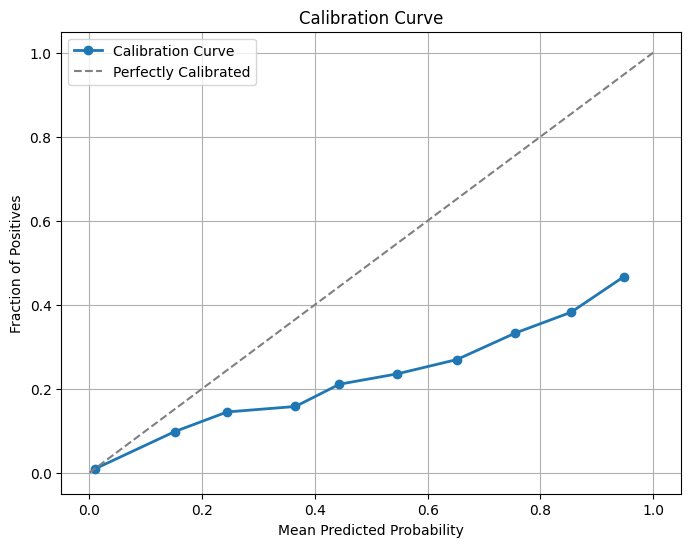

In [ ]:
prob_true, prob_pred = calibration_curve(y_test, y_pred, n_bins=10, strategy='uniform')

# Compute Brier score
brier_score = brier_score_loss(y_test, y_pred)
print("Brier Score:", brier_score)

# Plot calibration curve
plt.figure(figsize=(8, 6))
plt.plot(prob_pred, prob_true, marker='o', linewidth=2, label='Calibration Curve')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly Calibrated')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Curve')
plt.legend()
plt.grid(True)
plt.show()

              precision    recall  f1-score   support

         0.0       0.91      0.61      0.73     30729
         1.0       0.38      0.81      0.52      9145

    accuracy                           0.65     39874
   macro avg       0.65      0.71      0.62     39874
weighted avg       0.79      0.65      0.68     39874



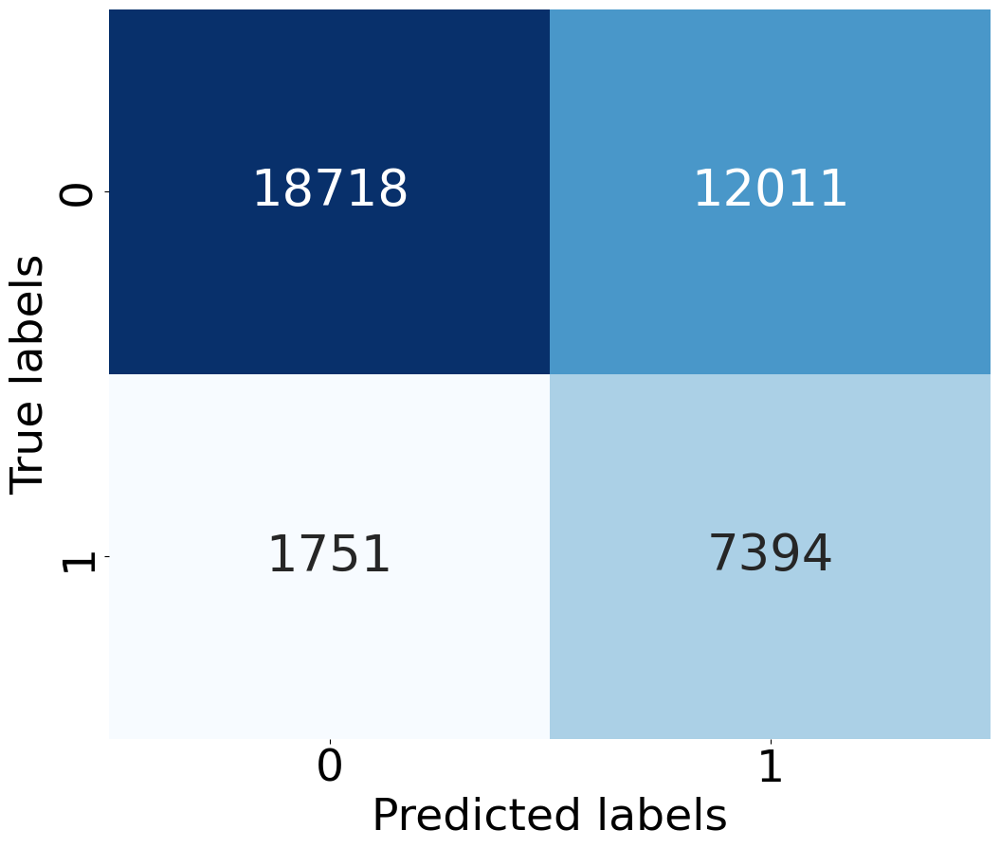

In [ ]:
# Compute confusion matrix and classification report for LSTM ENN
conf_matrix = confusion_matrix(y_test, y_pred_binary_LSTM_uns)
cr_error = classification_report(y_test, y_pred_binary_LSTM_uns)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 38})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix LSTM ENN', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_LSTM_ENN.pdf', format='pdf', bbox_inches='tight')
plt.show()

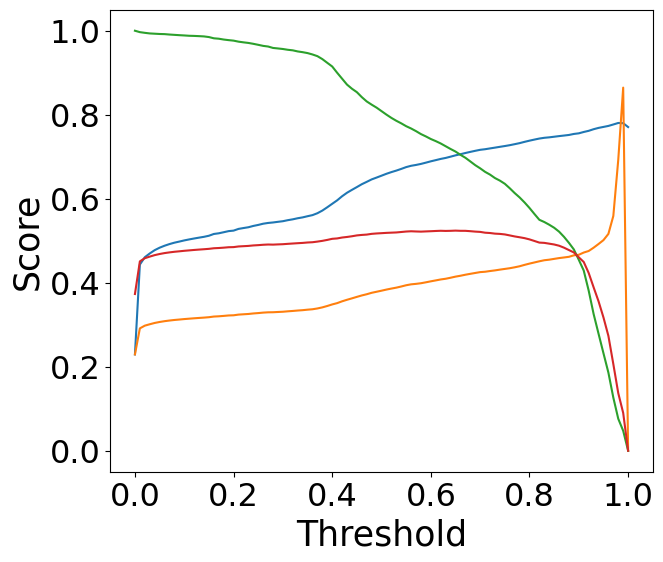

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_LSTM_uns = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_LSTM_uns)
    precision = precision_score(y_test, y_pred_binary_LSTM_uns)
    recall = recall_score(y_test, y_pred_binary_LSTM_uns)
    f1 = f1_score(y_test, y_pred_binary_LSTM_uns)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis LSTM ENN', fontsize=30)
# plt.legend(fontsize=22)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig("Threshold_Analysis_LSTM_ENN.pdf", bbox_inches='tight')
plt.show()


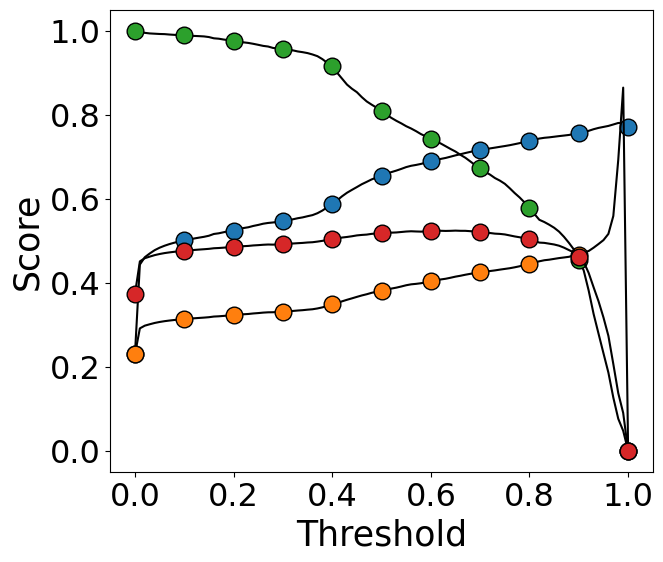

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_LSTM_ENN.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
# Train the model
history = model_LSTM_uns.fit(X_train_reshaped, y_res, epochs=10, batch_size=64, validation_data=(X_val_reshaped, y_val))

Epoch 1/10
973/973 [==============================] - 9s 8ms/step - loss: 0.3322 - accuracy: 0.8320 - val_loss: 0.7836 - val_accuracy: 0.6363
Epoch 2/10
973/973 [==============================] - 8s 8ms/step - loss: 0.3308 - accuracy: 0.8359 - val_loss: 0.7055 - val_accuracy: 0.6635
Epoch 3/10
973/973 [==============================] - 6s 7ms/step - loss: 0.3288 - accuracy: 0.8364 - val_loss: 0.6536 - val_accuracy: 0.6437
Epoch 4/10
973/973 [==============================] - 9s 9ms/step - loss: 0.3333 - accuracy: 0.8345 - val_loss: 0.7845 - val_accuracy: 0.6295
Epoch 5/10
973/973 [==============================] - 6s 7ms/step - loss: 0.3255 - accuracy: 0.8381 - val_loss: 0.7272 - val_accuracy: 0.6370
Epoch 6/10
973/973 [==============================] - 9s 9ms/step - loss: 0.3267 - accuracy: 0.8386 - val_loss: 0.8390 - val_accuracy: 0.6240
Epoch 7/10
973/973 [==============================] - 7s 8ms/step - loss: 0.3221 - accuracy: 0.8419 - val_loss: 0.7667 - val_accuracy: 0.6294
Epoch 

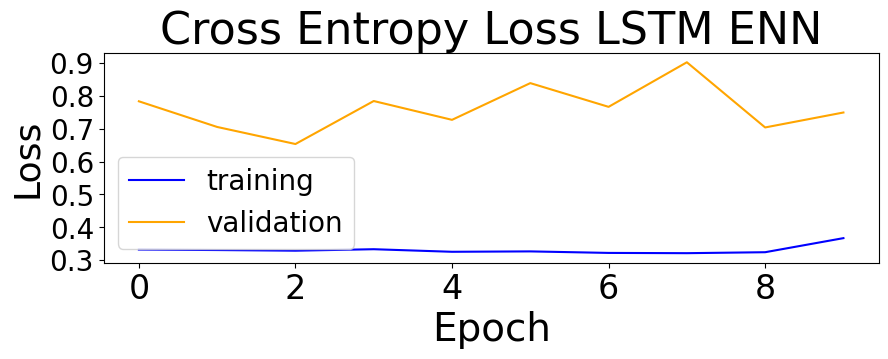

In [ ]:
# Plot Cross Entropy Loss for LSTM ENN
plt.figure(figsize=(10, 6))
plt.subplot(211)
plt.title('Cross Entropy Loss LSTM ENN', fontsize=32)
plt.plot(history.history['loss'], color='blue', label='train')
plt.plot(history.history['val_loss'], color='orange', label='test')
plt.legend(['training', 'validation'], fontsize=20)
plt.xlabel('Epoch', fontsize=28)
plt.ylabel('Loss', fontsize=26)
plt.xticks(fontsize=24)
plt.yticks(fontsize=20)
plt.savefig('Cross_Entropy_Loss_LSTM_ENN.pdf', format='pdf')
plt.show()

In [ ]:
predicted_labels_mv = predicted_labels_mv[:39874]
predicted_labels_mv_ovs = predicted_labels_mv_ovs[:39874]

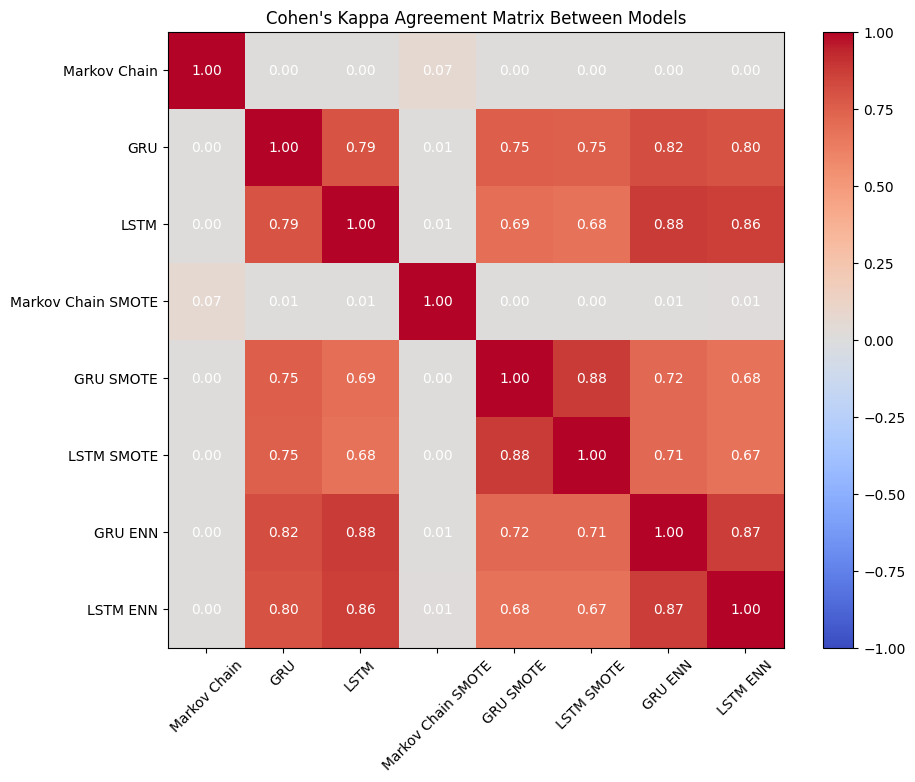

In [ ]:
# Dictionary of predictions - this part remains the same
predictions = {
    'Markov Chain': predicted_labels_mv,
    'GRU': y_pred_binary_GRU,
    'LSTM': y_pred_binary_LSTM,
    'Markov Chain SMOTE': predicted_labels_mv_ovs,
    'GRU SMOTE': y_pred_binary_GRU_ovs,
    'LSTM SMOTE': y_pred_binary_LSTM_ovs,
    'GRU ENN': y_pred_binary_GRU_uns,
    'LSTM ENN': y_pred_binary_LSTM_uns
}

# Initializing an empty matrix to store the Cohen's Kappa scores
kappa_matrix = np.zeros((len(predictions), len(predictions)))

# List of model names for labeling purposes
model_names = list(predictions.keys())

# Calculating Cohen's Kappa for each pair of models
for i, model_i in enumerate(model_names):
    for j, model_j in enumerate(model_names):
        kappa_matrix[i, j] = cohen_kappa_score(predictions[model_i], predictions[model_j])

# Plotting the Cohen's Kappa matrix
plt.figure(figsize=(10, 8))
im = plt.imshow(kappa_matrix, interpolation='nearest', cmap='coolwarm', vmin=-1, vmax=1)
plt.colorbar(im)
plt.xticks(ticks=np.arange(len(model_names)), labels=model_names, rotation=45)
plt.yticks(ticks=np.arange(len(model_names)), labels=model_names)
plt.title('Cohen\'s Kappa Agreement Matrix Between Models')

# Adding text annotations to each cell
for i in range(len(model_names)):
    for j in range(len(model_names)):
        text = plt.text(j, i, f"{kappa_matrix[i, j]:.2f}",
                       ha="center", va="center", color="w")

plt.grid(False)
plt.savefig('Cohens Kappa all models.pdf', format='pdf')
plt.show()

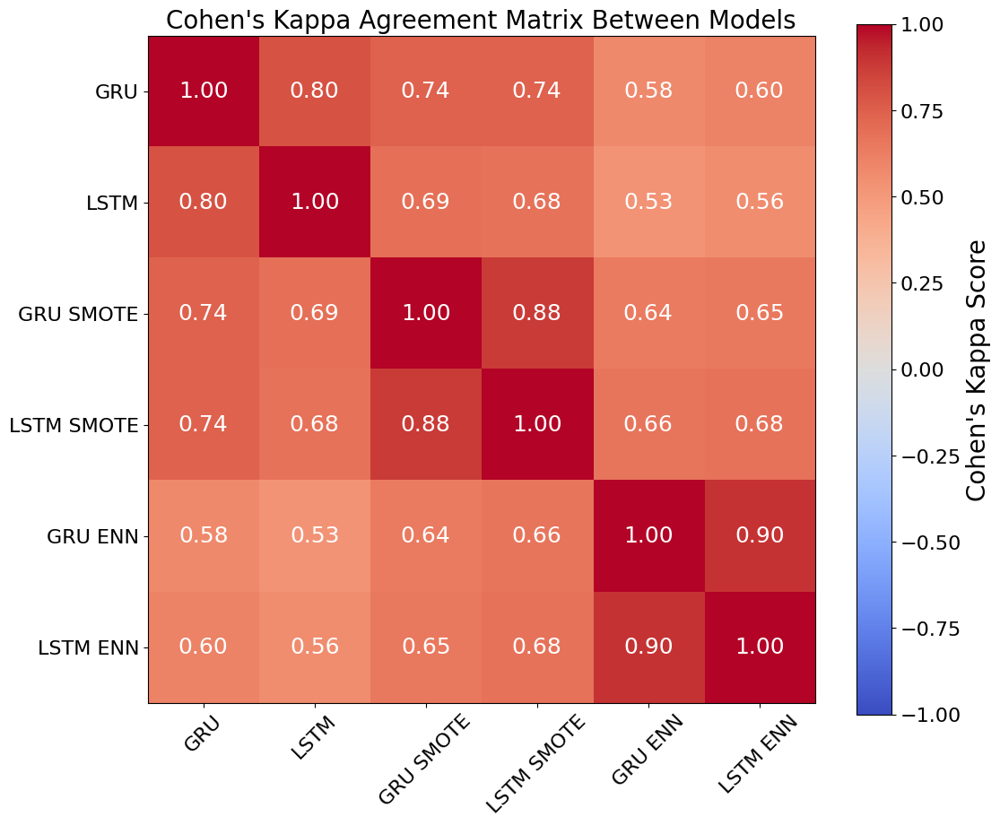

In [ ]:
# Dictionary of predictions
predictions = {
    'GRU': y_pred_binary_GRU,
    'LSTM': y_pred_binary_LSTM,
    'GRU SMOTE': y_pred_binary_GRU_ovs,
    'LSTM SMOTE': y_pred_binary_LSTM_ovs,
    'GRU ENN': y_pred_binary_GRU_uns,
    'LSTM ENN': y_pred_binary_LSTM_uns
}

# Initializing an empty matrix to store the Cohen's Kappa scores
kappa_matrix = np.zeros((len(predictions), len(predictions)))

# List of model names for labeling purposes
model_names = list(predictions.keys())

# Calculating Cohen's Kappa for each pair of models
for i, model_i in enumerate(model_names):
    for j, model_j in enumerate(model_names):
        kappa_matrix[i, j] = cohen_kappa_score(predictions[model_i], predictions[model_j])

# Plotting the Cohen's Kappa matrix
plt.figure(figsize=(12, 10))
im = plt.imshow(kappa_matrix, interpolation='nearest', cmap='coolwarm', vmin=-1, vmax=1)
cbar = plt.colorbar(im)
cbar.ax.tick_params(labelsize=16)
cbar.set_label('Cohen\'s Kappa Score', fontsize=20)

plt.xticks(ticks=np.arange(len(model_names)), labels=model_names, rotation=45, fontsize=16)
plt.yticks(ticks=np.arange(len(model_names)), labels=model_names, fontsize=16)
# plt.title('Cohen\'s Kappa Agreement Matrix Between Models', fontsize=20)

# Adding text annotations to each cell
for i in range(len(model_names)):
    for j in range(len(model_names)):
        text = plt.text(j, i, f"{kappa_matrix[i, j]:.2f}",
                       ha="center", va="center", color="w", fontsize=18)

plt.grid(False)
plt.savefig('Cohens_Kappa_GRU_LSTM.pdf', format='pdf')
plt.show()

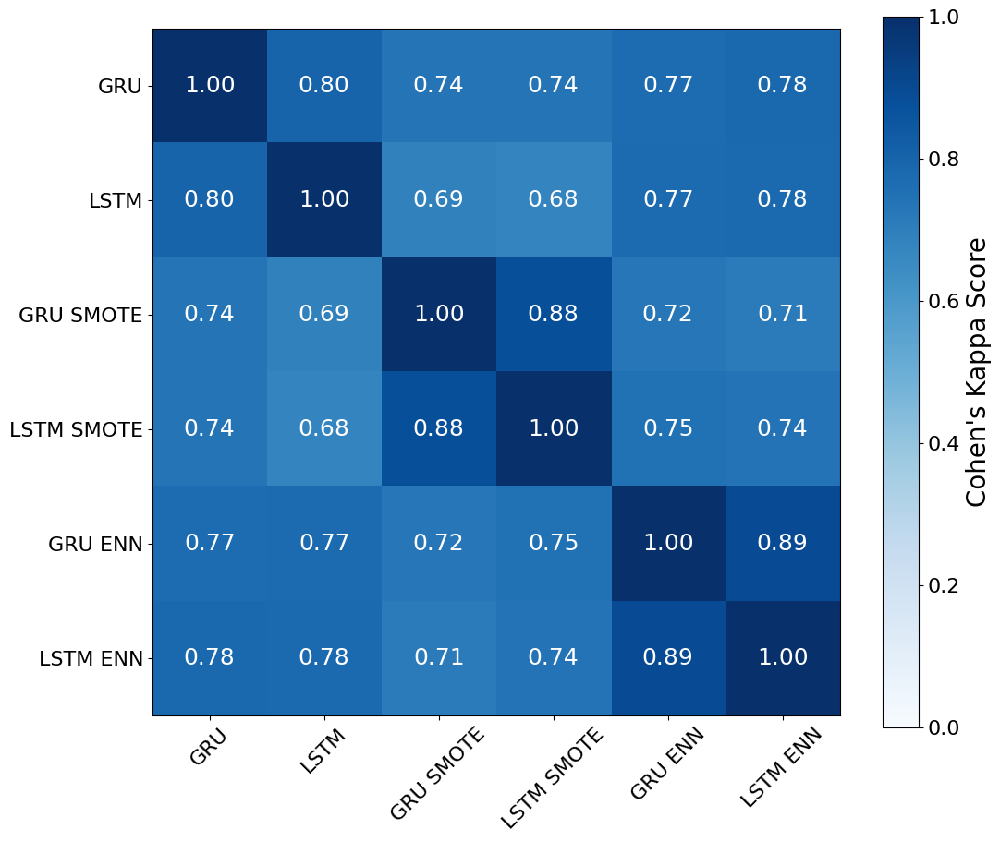

In [ ]:
# Dictionary of predictions
predictions = {
    'GRU': y_pred_binary_GRU,
    'LSTM': y_pred_binary_LSTM,
    'GRU SMOTE': y_pred_binary_GRU_ovs,
    'LSTM SMOTE': y_pred_binary_LSTM_ovs,
    'GRU ENN': y_pred_binary_GRU_uns,
    'LSTM ENN': y_pred_binary_LSTM_uns
}

# Initializing an empty matrix to store the Cohen's Kappa scores
kappa_matrix = np.zeros((len(predictions), len(predictions)))

# List of model names for labeling purposes
model_names = list(predictions.keys())

# Calculating Cohen's Kappa for each pair of models
for i, model_i in enumerate(model_names):
    for j, model_j in enumerate(model_names):
        kappa_matrix[i, j] = cohen_kappa_score(predictions[model_i], predictions[model_j])

# Plotting the Cohen's Kappa matrix
plt.figure(figsize=(12, 10))
im = plt.imshow(kappa_matrix, interpolation='nearest', cmap='Blues', vmin=0, vmax=1)
cbar = plt.colorbar(im)
cbar.ax.tick_params(labelsize=16)
cbar.set_label("Cohen's Kappa Score", fontsize=20)

plt.xticks(ticks=np.arange(len(model_names)), labels=model_names, rotation=45, fontsize=16)
plt.yticks(ticks=np.arange(len(model_names)), labels=model_names, fontsize=16)
# plt.title('Cohen\'s Kappa Agreement Matrix Between Models', fontsize=20)

# Adding text annotations to each cell
for i in range(len(model_names)):
    for j in range(len(model_names)):
        text = plt.text(j, i, f"{kappa_matrix[i, j]:.2f}",
                       ha="center", va="center", color="w", fontsize=18)

plt.grid(False)
plt.savefig('Cohens_Kappa_GRU_LSTM.pdf', format='pdf')
plt.show()


# Models with sequential and static data

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed_trimmed.csv")

In [ ]:
df_train.head()

,session_id_hash,session,nevents,week_day,weekend,hour,session_duration,conversion,unique_products_viewed,avg_dwell_time
0,00000114e1075962f022114fcfc17f2d874e694ac5d201...,"[1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, ...",18,1,False,20,3479.0,0.0,3,193.277778
1,000010504025397b03290c7457e0e7ef7ae93529f21eae...,"[2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, ...",81,3,False,12,2024.0,0.0,10,24.987654
2,0000913afa22ba9c31efb992bcf6388b0bbfe28056bef3...,"[1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, ...",139,4,False,14,3647.0,0.0,23,26.237410
3,00010d84aca1294479304044207fd268f63228844779c6...,"[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, ...",41,6,True,18,2612.0,0.0,3,63.707317
4,0001368d732951035a7ef7ef42b345a5c50b7d66966749...,"[1, 2, 3, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1]",16,3,False,3,265.0,0.0,1,16.562500


In [ ]:
X_seq = df_train[["session_id_hash", "session"]]  # Features
X_stat = df_train[["nevents", "unique_products_viewed", "avg_dwell_time"]]
y = df_train["conversion"]  # Target variable

# Splitting the data into training and test sets
X_train_seq, X_test_seq, y_train, y_test = train_test_split(X_seq, y, test_size=0.2, random_state=42)
X_train_stat, X_test_stat, y_train, y_test = train_test_split(X_stat, y, test_size=0.2, random_state=42)

## GRU

In [ ]:
sequences_train_seq = X_train_seq['session'].tolist()
sequences_test_seq = X_test_seq['session'].tolist()
sequences_train_seq = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_seq]
sequences_test_seq = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_test_seq]

# Pad sequences to a fixed length
max_length = 30  # Choose the maximum length you want
padded_sequences_train_seq = pad_sequences(sequences_train_seq, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test_seq = pad_sequences(sequences_test_seq, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train_seq = np.array(padded_sequences_train_seq)
labels_train = np.array(y_train)
sequences_test_seq = np.array(padded_sequences_test_seq)
labels_test = np.array(y_test)

In [ ]:
# Split the data into train, validation, and test sets
X_train_seq, X_val_seq, y_train, y_val = train_test_split(sequences_train_seq, labels_train, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Reshape the input data to match the expected input shape of the GRU layer
X_train_seq_reshaped = np.expand_dims(X_train_seq, axis=-1)
X_val_seq_reshaped = np.expand_dims(X_val_seq, axis=-1)

In [ ]:
X_train_stat.head()

,nevents,unique_products_viewed,avg_dwell_time
317,24,1,79.416667
150615,17,6,37.058824
191502,48,2,29.312500
181330,19,3,11.052632
147450,40,5,61.475000


In [ ]:
# Scale static features
scaler = StandardScaler()
X_train_stat = scaler.fit_transform(X_train_stat)
X_test_stat = scaler.transform(X_test_stat)

In [ ]:
X_test_stat

array([[ 0.31811282,  1.00247317, -0.63572413],
       [-0.31885065, -0.10290978, -0.24569912],
       [-0.35866087, -0.76613955, -0.72766091],
       ...,
       [-0.55771196, -0.76613955,  1.57176497],
       [-0.43828131, -0.10290978,  0.09342963],
       [-0.79657326, -0.54506296, -0.50237303]])

In [ ]:
# Input layers
seq_input = Input(shape=(None, X_train_seq_reshaped.shape[2]), name='seq_input')
stat_input = Input(shape=(X_train_stat.shape[1],), name='stat_input')

# GRU layer for the sequential data
gru_out = GRU(32)(seq_input)

# Concatenate GRU output with static data
concat_layer = Concatenate()([gru_out, stat_input])

# Dense layer(s) for prediction
dense_layer = Dense(32, activation='relu')(concat_layer)
output_layer = Dense(1, activation='sigmoid')(dense_layer)

# Build the model
model_GRU_hybrid = Model(inputs=[seq_input, stat_input], outputs=output_layer)

# Define the optimizer with the specified learning rate
optimizer = Adam(learning_rate=0.01)

In [ ]:
# Assuming static data splits
X_train_stat, X_val_stat = train_test_split(X_train_stat, test_size=0.25, random_state=42)

In [ ]:
model_GRU_hybrid.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model with validation data
history = model_GRU_hybrid.fit(
    [X_train_seq_reshaped, X_train_stat], y_train,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    batch_size=64,
    epochs=10
)

Epoch 1/10
1870/1870 [==============================] - 15s 6ms/step - loss: 0.4497 - accuracy: 0.7898 - val_loss: 0.3938 - val_accuracy: 0.8152
Epoch 2/10
1870/1870 [==============================] - 14s 8ms/step - loss: 0.3500 - accuracy: 0.8434 - val_loss: 0.3051 - val_accuracy: 0.8616
Epoch 3/10
1870/1870 [==============================] - 13s 7ms/step - loss: 0.2869 - accuracy: 0.8744 - val_loss: 0.2924 - val_accuracy: 0.8706
Epoch 4/10
1870/1870 [==============================] - 14s 7ms/step - loss: 0.2576 - accuracy: 0.8885 - val_loss: 0.2442 - val_accuracy: 0.9049
Epoch 5/10
1870/1870 [==============================] - 16s 9ms/step - loss: 0.2378 - accuracy: 0.8967 - val_loss: 0.2263 - val_accuracy: 0.8994
Epoch 6/10
1870/1870 [==============================] - 13s 7ms/step - loss: 0.2223 - accuracy: 0.9032 - val_loss: 0.2177 - val_accuracy: 0.8972
Epoch 7/10
1870/1870 [==============================] - 12s 6ms/step - loss: 0.2107 - accuracy: 0.9070 - val_loss: 0.2079 - val_ac

In [ ]:
model_save_name = 'model_GRU_hybrid.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_hybrid.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_GRU_hybrid.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_hybrid = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid.predict([X_train_seq, X_train_stat])
y_pred_binary_GRU_hybrid = (y_pred > 0.38281).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train, y_pred_binary_GRU_hybrid)

print("F1 Score:", f1)

3739/3739 [==============================] - 9s 2ms/step
F1 Score: 0.8142670566377866


In [ ]:
# Predict labels for the test set
y_pred_probs = model_GRU_hybrid.predict([X_train_seq, X_train_stat])

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_train, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

3739/3739 [==============================] - 10s 3ms/step
Optimal Threshold: 0.3828125
Optimal F1 Score: 0.8142670566377866


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid.predict([X_train_seq, X_train_stat])
y_pred_binary_GRU_hybrid = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train, y_pred_binary_GRU_hybrid)

print("F1 Score:", f1)

3739/3739 [==============================] - 10s 3ms/step
F1 Score: 0.7994848465964562


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid.predict([X_val_seq, X_val_stat])
y_pred_binary_GRU_hybrid = (y_pred > 0.38281).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_GRU_hybrid)

print("F1 Score:", f1)

1247/1247 [==============================] - 4s 3ms/step
F1 Score: 0.8101979869483464


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid.predict([X_val_seq, X_val_stat])
y_pred_binary_GRU_hybrid = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_GRU_hybrid)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.797408422626464


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid.predict([padded_sequences_test_seq, X_test_stat])
y_pred_binary_GRU_hybrid = (y_pred > 0.38281).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_hybrid)

print("F1 Score:", f1)

1247/1247 [==============================] - 32s 23ms/step
F1 Score: 0.8113800518277553


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid.predict([padded_sequences_test_seq, X_test_stat])
y_pred_binary_GRU_hybrid = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_hybrid)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 3ms/step
F1 Score: 0.7942625506704085


### Hyperparameter Tuning

In [ ]:
# Suppress TensorFlow logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

def build_model(hp):
    # Input for sequential data
    seq_input = Input(shape=(None, 1), name='seq_input')
    gru_out = GRU(units=32)(seq_input)
    # Input for static data
    stat_input = Input(shape=(X_train_stat.shape[1],), name='stat_input')
    # Concatenate GRU output with static data
    concat = Concatenate()([gru_out, stat_input])
    # Add a dense layer with dropout
    dropout_rate = hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.25)
    x = Dropout(rate=dropout_rate)(concat)
    x = Dense(units=32, activation="relu")(x)
    # Output layer
    output = Dense(1, activation="sigmoid")(x)
    # Build the model
    model = Model(inputs=[seq_input, stat_input], outputs=output)
    # Compile the model
    learning_rate = hp.Choice("learning_rate", [0.001, 0.01])
    batch_size = hp.Choice("batch_size", [128, 64, 32])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model


# Initialize a GridSearch tuner
tuner = GridSearch(
    build_model,
    objective='val_loss',
    overwrite=True)

# Perform the search
tuner.search(
    [X_train_seq_reshaped, X_train_stat], y_train,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    epochs=10)

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hps.values)

Trial 18 Complete [00h 04m 24s]
val_loss: 0.4434584081172943

Best val_loss So Far: 0.1562754511833191
Total elapsed time: 01h 24m 45s
Best Hyperparameters:
{'dropout': 0.0, 'learning_rate': 0.01, 'batch_size': 64}


In [ ]:
hyperparameters_data = []
for trial in tuner.oracle.get_best_trials(num_trials=len(tuner.oracle.trials)):
    hyperparameters = trial.hyperparameters.values
    val_loss = trial.score
    hyperparameters_data.append({
        'Batch Size': hyperparameters['batch_size'],
        'Dropout': hyperparameters['dropout'],
        'Learning Rate': hyperparameters['learning_rate'],
        'Validation Loss': val_loss
    })

# Create DataFrame
df_results_GRU_stat = pd.DataFrame(hyperparameters_data)

In [ ]:
df_results_GRU_stat

,Batch Size,Dropout,Learning Rate,Validation Loss
0,64,0.00,0.010,0.156275
1,32,0.00,0.010,0.156414
2,128,0.00,0.001,0.160828
3,64,0.00,0.001,0.161087
4,32,0.00,0.001,0.161945
5,128,0.00,0.010,0.163423
6,32,0.25,0.001,0.384477
7,64,0.25,0.001,0.388214
8,128,0.25,0.001,0.389413
9,128,0.25,0.010,0.408353


In [ ]:
df_results_GRU_stat.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_GRU_stat.csv", index = False)

In [ ]:
df_results_GRU_stat = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_GRU_stat.csv")

In [ ]:
results_df = df_results_GRU_stat

In [ ]:
def plot_parcoords(results_df):
    fig = go.Figure(data=
        go.Parcoords(
            line=dict(color=results_df['Validation Loss'], colorscale='Tealrose', showscale=True),
            dimensions=[
                dict(range=[min(results_df['Dropout']), max(results_df['Dropout'])],
                     label='Dropout', values=results_df['Dropout']),
                dict(range=[min(results_df['Batch Size']), max(results_df['Batch Size'])],
                     label='Batch Size', values=results_df['Batch Size']),
                dict(range=[min(results_df['Learning Rate']), max(results_df['Learning Rate'])],
                     label='Learning Rate', values=results_df['Learning Rate']),
                dict(range=[min(results_df['Validation Loss']), max(results_df['Validation Loss'])],
                     label='Validation Loss', values=results_df['Validation Loss'])
            ])
        )

    fig.show()

# Call the function with your dataframe
plot_parcoords(results_df)

In [ ]:
import plotly.graph_objects as go
import plotly.io as pio

# Create the contour plot
fig = go.Figure(data=go.Contour(
    x=results_df['Dropout'],
    y=results_df['Batch Size'],
    z=results_df['Validation Loss'],
    colorscale='Blues',  # Choose a colorscale
    colorbar=dict(
        title=dict(text='Validation Loss', font=dict(size=26)),
        thickness=50,  # Increase the thickness of the colorbar
        len=1.1,
        tickfont=dict(size=24)
    ),
))

# Update layout with increased font sizes
fig.update_layout(
#     title=dict(text='Contour Plot of Hyperparameters GRU Hybrid', font=dict(size=22)),
    xaxis=dict(title=dict(text='Dropout Rate', font=dict(size=26)), tickfont=dict(size=24)),
    yaxis=dict(title=dict(text='Batch Size', font=dict(size=26)), tickfont=dict(size=24))
)

fig.show()
pio.write_image(fig, 'hyperparameters_contour_plot_GRU_hybrid.pdf')

### Error Analysis

              precision    recall  f1-score   support

         0.0       0.94      0.95      0.94     30729
         1.0       0.82      0.80      0.81      9145

    accuracy                           0.91     39874
   macro avg       0.88      0.88      0.88     39874
weighted avg       0.91      0.91      0.91     39874



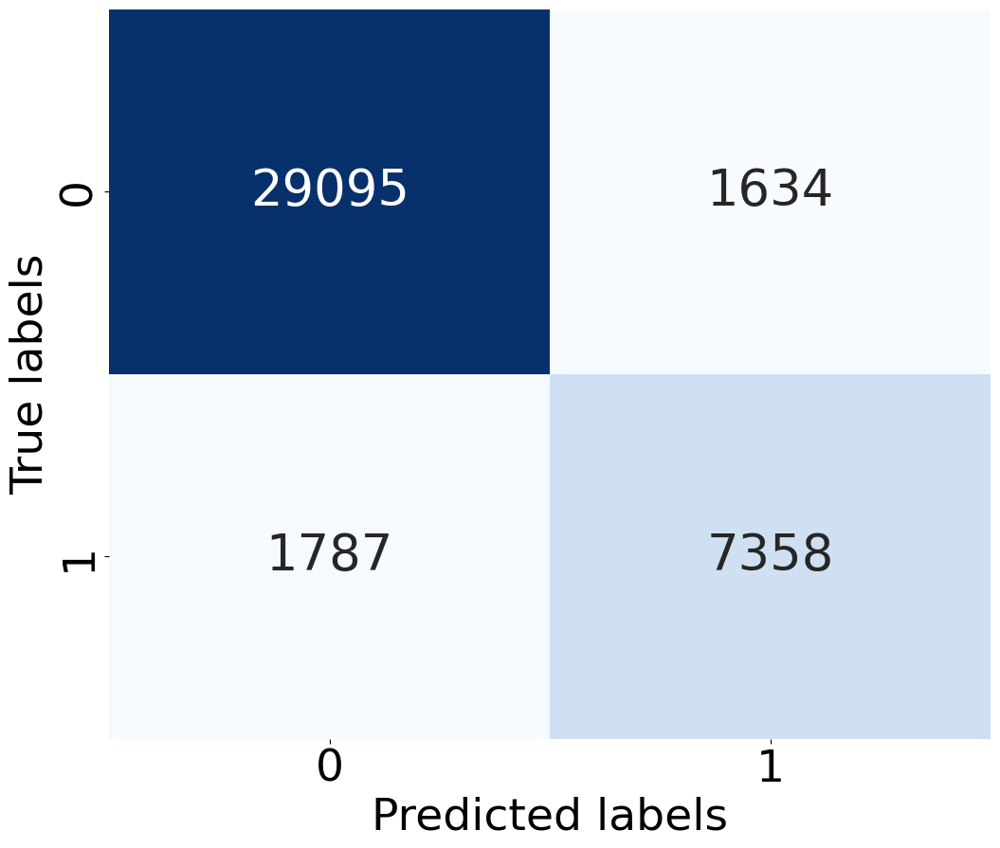

In [ ]:
# Compute confusion matrix and classification report
conf_matrix = confusion_matrix(y_test, y_pred_binary_GRU_hybrid)
cr_error = classification_report(y_test, y_pred_binary_GRU_hybrid)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 38})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix GRU stat', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_GRU_hybrid.pdf', format='pdf', bbox_inches='tight')
plt.show()

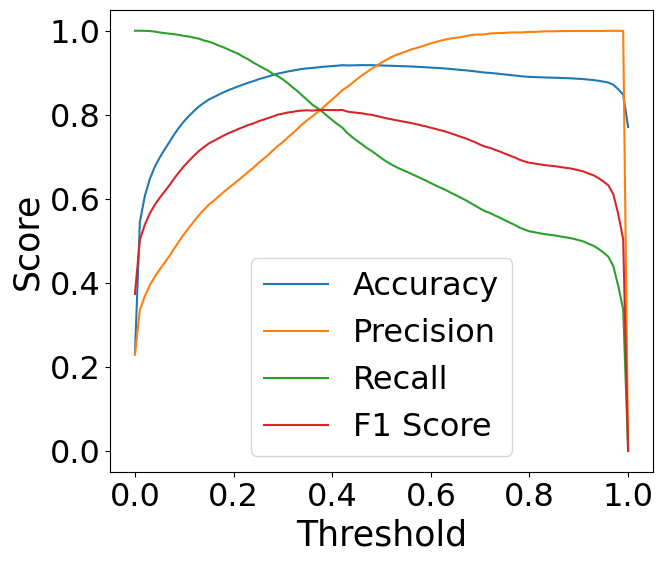

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_GRU_hybrid = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_GRU_hybrid)
    precision = precision_score(y_test, y_pred_binary_GRU_hybrid)
    recall = recall_score(y_test, y_pred_binary_GRU_hybrid)
    f1 = f1_score(y_test, y_pred_binary_GRU_hybrid)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis GRU stat', fontsize=30)
plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig('Threshold_Analysis_GRU_hybrid.pdf', bbox_inches='tight')
plt.show()

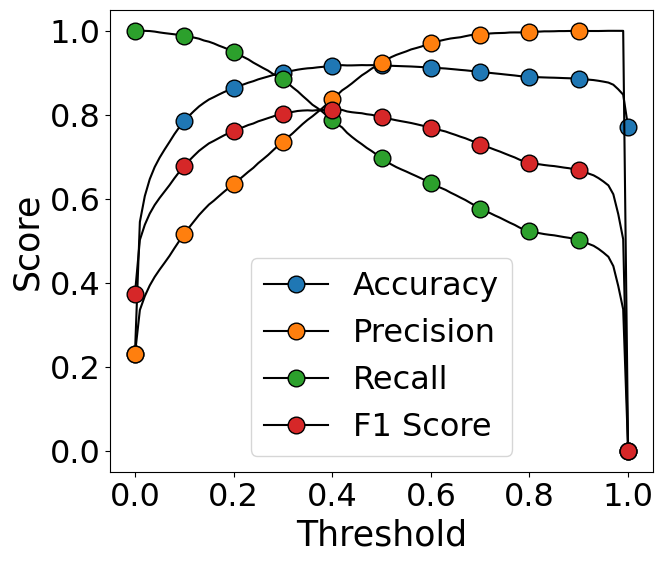

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_GRU_hybrid.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
# Set the sample size and generate random indices
sample_size = 10000
total_instances = X_train_seq_reshaped.shape[0]  # Assuming X_train_seq_reshaped is an array
random_indices = np.random.choice(total_instances, sample_size, replace=False)

# Sample the sequential and static data along with labels
sampled_seq_reshaped = X_train_seq_reshaped[random_indices]
sampled_stat = X_train_stat[random_indices]
sampled_labels = y_train[random_indices]

In [ ]:
# Feature extraction from the sampled sequential data
sequential_features = np.mean(sampled_seq_reshaped, axis=1)  # Taking mean across time steps

# Concatenate with sampled static data
combined_features = np.concatenate([sequential_features, sampled_stat], axis=1)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Initialize and apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_results = tsne.fit_transform(combined_features)

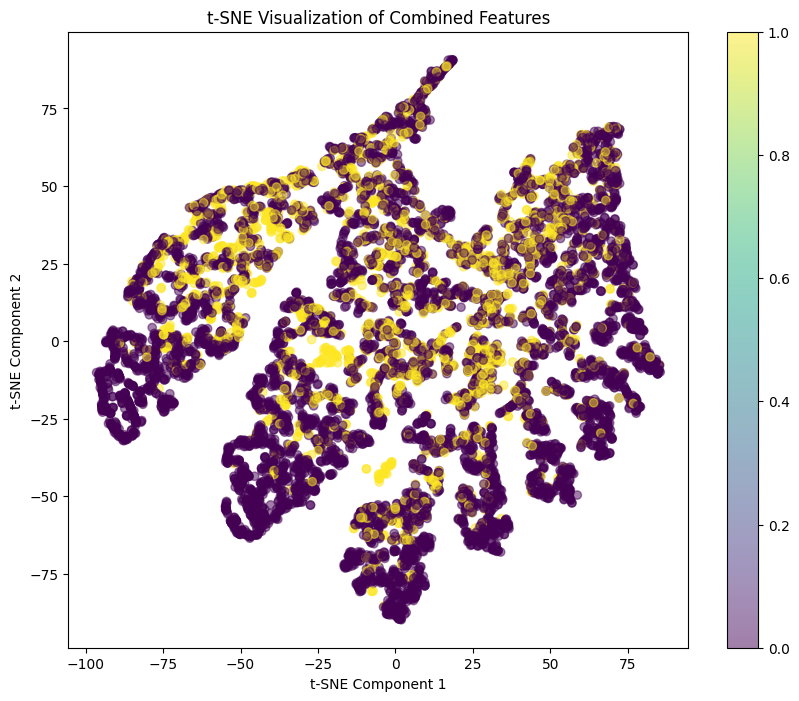

In [ ]:
plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=sampled_labels, cmap='viridis', alpha=0.5)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Combined Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

### SHAP

Shape of background_summary_seq: (5, 30)
Shape of background_summary_stat: (5, 3)
Shape of background_summary_combined: (5, 33)
Shape of test_combined: (200, 33)
1/1 [==============================] - 0s 375ms/step


  0%|          | 0/200 [00:00<?, ?it/s]

330/330 [==============================] - 1s 3ms/step
Shape of shap_values_combined: (200, 33, 1)
Shape of shap_values_seq: (200, 30, 1)
Shape of shap_values_stat: (200, 3, 1)
Shape of shap_values_seq_sum: (200, 1)
Shape of shap_values_stat after reshape: (200, 3)
Shape of combined_shap_values: (200, 4)
Shape of test_combined_display: (200, 4)


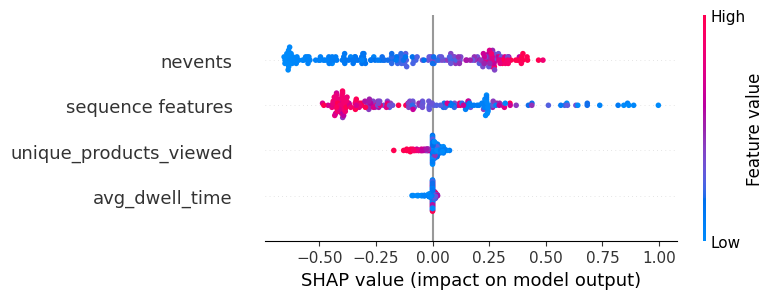

In [ ]:
import numpy as np
import shap
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GRU, Dense, Concatenate

# Assume model_GRU_hybrid is your pre-trained model

# Set a fixed random seed
np.random.seed(42)

# Sample a subset of the test data
sample_size = 200
sample_indices = np.random.choice(len(padded_sequences_test_seq), size=sample_size, replace=False)
subset_X_test_seq_reshaped = padded_sequences_test_seq[sample_indices]
subset_X_test_stat = X_test_stat[sample_indices]

# Use k-means to summarize the background data for sequential features
background_summary_seq = shap.kmeans(subset_X_test_seq_reshaped.reshape(len(subset_X_test_seq_reshaped), -1), 5).data
background_summary_seq = background_summary_seq.reshape(-1, subset_X_test_seq_reshaped.shape[1])

# Use k-means to summarize the background data for static features
background_summary_stat = shap.kmeans(subset_X_test_stat, 5).data

# Verify the shapes of the background summaries
print("Shape of background_summary_seq:", background_summary_seq.shape)
print("Shape of background_summary_stat:", background_summary_stat.shape)

# Define the prediction function to handle both inputs
def model_predict(data):
    seq_data = data[:, :subset_X_test_seq_reshaped.shape[1]].reshape((data.shape[0], -1, 1))
    stat_data = data[:, subset_X_test_seq_reshaped.shape[1]:]
    return model_GRU_hybrid.predict([seq_data, stat_data])

# Concatenate the background summaries and the test data
background_summary_combined = np.hstack((background_summary_seq, background_summary_stat))
test_combined = np.hstack((subset_X_test_seq_reshaped.reshape(sample_size, -1), subset_X_test_stat))

# Verify the shapes of combined summaries and test data
print("Shape of background_summary_combined:", background_summary_combined.shape)
print("Shape of test_combined:", test_combined.shape)

# Create an explainer using the Kernel SHAP method with the summarized background data
kernel_explainer = shap.KernelExplainer(model_predict, background_summary_combined)

# Compute SHAP values for the combined test data
shap_values_combined = kernel_explainer.shap_values(test_combined)

# Verify the shape of combined SHAP values
print("Shape of shap_values_combined:", np.array(shap_values_combined).shape)

# Separate the SHAP values for sequential and static features
shap_values_seq = shap_values_combined[:, :subset_X_test_seq_reshaped.shape[1]]
shap_values_stat = shap_values_combined[:, subset_X_test_seq_reshaped.shape[1]:]

# Verify the shapes of separated SHAP values
print("Shape of shap_values_seq:", shap_values_seq.shape)
print("Shape of shap_values_stat:", shap_values_stat.shape)

# Sum SHAP values across timesteps for sequence features
shap_values_seq_sum = np.sum(shap_values_seq, axis=1)

# Ensure both SHAP values arrays have the correct shapes
shap_values_seq_sum = shap_values_seq_sum.reshape(-1, 1)
shap_values_stat = shap_values_stat.reshape(sample_size, -1)

# Verify the shapes before combining
print("Shape of shap_values_seq_sum:", shap_values_seq_sum.shape)
print("Shape of shap_values_stat after reshape:", shap_values_stat.shape)

# Combine summed sequence SHAP values with static SHAP values
combined_shap_values = np.hstack((shap_values_seq_sum, shap_values_stat))

# Verify the shape of combined SHAP values
print("Shape of combined_shap_values:", combined_shap_values.shape)

# Combine feature names
feature_names_combined = ['sequence features'] + ['nevents', 'unique_products_viewed', 'avg_dwell_time']

# Prepare the test data for display
# We will only use the static features and a placeholder for the sequence feature
test_combined_display = np.hstack((np.mean(subset_X_test_seq_reshaped, axis=1).reshape(sample_size, -1), subset_X_test_stat))

# Verify the shape of test data for display
print("Shape of test_combined_display:", test_combined_display.shape)

# Display the combined SHAP values
shap.summary_plot(combined_shap_values, test_combined_display, feature_names=feature_names_combined)

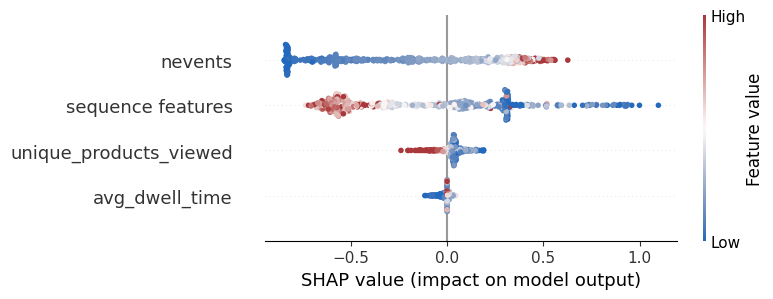

In [ ]:
plt.figure(figsize=(8, 6))

# Display the combined SHAP values
shap.summary_plot(combined_shap_values, test_combined_display, feature_names=feature_names_combined, show=False, cmap = cmap)  # Add 'show=False' to prevent automatic display if running in an interactive environment

# Save the plot to a PDF file
plt.savefig('shap_summary_plot_GRU_hybrid.pdf', bbox_inches='tight')

# Optional: Display the plot in the script or notebook
plt.show()

# Close the plot to free up memory
plt.close()

In [ ]:
# Set a fixed random seed
np.random.seed(42)
# Sample a stratified subset of the test data
sample_size = 500
y_test = y_test  # Assuming y_test contains the labels for the test data
# Create the stratified shuffle split object
stratified_split = StratifiedShuffleSplit(n_splits=1, test_size=sample_size, random_state=42)
# Split the data to get the indices
for train_index, test_index in stratified_split.split(padded_sequences_test_seq, y_test):
    sample_indices = test_index
# Get the stratified subset
subset_X_test_seq_reshaped = padded_sequences_test_seq[sample_indices]
subset_X_test_stat = X_test_stat[sample_indices]

In [ ]:
# Use k-means to summarize the background data for sequential features
background_summary_seq = shap.kmeans(subset_X_test_seq_reshaped.reshape(len(subset_X_test_seq_reshaped), -1), 5).data
background_summary_seq = background_summary_seq.reshape(-1, subset_X_test_seq_reshaped.shape[1])

# Use k-means to summarize the background data for static features
background_summary_stat = shap.kmeans(subset_X_test_stat, 5).data

# Verify the shapes of the background summaries
print("Shape of background_summary_seq:", background_summary_seq.shape)
print("Shape of background_summary_stat:", background_summary_stat.shape)

# Define the prediction function to handle both inputs
def model_predict(data):
    seq_data = data[:, :subset_X_test_seq_reshaped.shape[1]].reshape((data.shape[0], -1, 1))
    stat_data = data[:, subset_X_test_seq_reshaped.shape[1]:]
    return model_GRU_hybrid.predict([seq_data, stat_data])

# Concatenate the background summaries and the test data
background_summary_combined = np.hstack((background_summary_seq, background_summary_stat))
test_combined = np.hstack((subset_X_test_seq_reshaped.reshape(sample_size, -1), subset_X_test_stat))

# Verify the shapes of combined summaries and test data
print("Shape of background_summary_combined:", background_summary_combined.shape)
print("Shape of test_combined:", test_combined.shape)

Shape of background_summary_seq: (5, 30)
Shape of background_summary_stat: (5, 3)
Shape of background_summary_combined: (5, 33)
Shape of test_combined: (500, 33)


In [ ]:
# Create an explainer using the Kernel SHAP method with the summarized background data
# kernel_explainer = shap.KernelExplainer(model_predict, background_summary_combined)

# Compute SHAP values for the combined test data
# shap_values_combined = kernel_explainer.shap_values(test_combined)

# Verify the shape of combined SHAP values
print("Shape of shap_values_combined:", np.array(shap_values_combined).shape)

# Separate the SHAP values for sequential and static features
shap_values_seq = shap_values_combined[:, :subset_X_test_seq_reshaped.shape[1]]
shap_values_stat = shap_values_combined[:, subset_X_test_seq_reshaped.shape[1]:]

# Verify the shapes of separated SHAP values
print("Shape of shap_values_seq:", shap_values_seq.shape)
print("Shape of shap_values_stat:", shap_values_stat.shape)

# Sum SHAP values across timesteps for sequence features
shap_values_seq_sum = np.sum(shap_values_seq, axis=1)

# Ensure both SHAP values arrays have the correct shapes
shap_values_seq_sum = shap_values_seq_sum.reshape(-1, 1)
shap_values_stat = shap_values_stat.reshape(sample_size, -1)

# Verify the shapes before combining
print("Shape of shap_values_seq_sum:", shap_values_seq_sum.shape)
print("Shape of shap_values_stat after reshape:", shap_values_stat.shape)

Shape of shap_values_combined: (500, 33, 1)
Shape of shap_values_seq: (500, 30, 1)
Shape of shap_values_stat: (500, 3, 1)
Shape of shap_values_seq_sum: (500, 1)
Shape of shap_values_stat after reshape: (500, 3)


In [ ]:
np.save('/content/drive/My Drive/Thesis/Datasets/shap_values_combined.npy', shap_values_combined)

In [ ]:
file_path = '/content/drive/My Drive/Thesis/Datasets/shap_values_combined.npy'
shap_values_combined = np.load(file_path)

Shape of combined_shap_values: (500, 4)
Shape of test_combined_display: (500, 4)


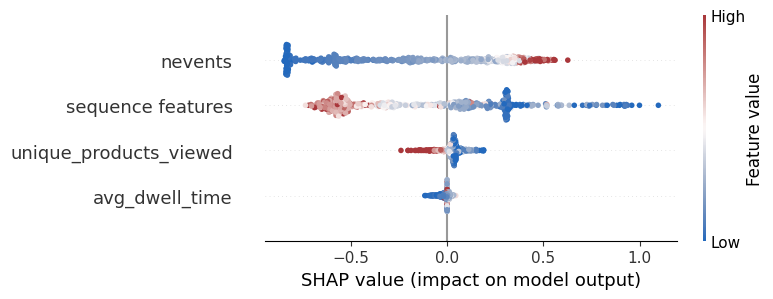

In [ ]:
# Combine summed sequence SHAP values with static SHAP values
combined_shap_values = np.hstack((shap_values_seq_sum, shap_values_stat))

# Verify the shape of combined SHAP values
print("Shape of combined_shap_values:", combined_shap_values.shape)

# Combine feature names
feature_names_combined = ['sequence features'] + ['nevents', 'unique_products_viewed', 'avg_dwell_time']

# Prepare the test data for display
# We will only use the static features and a placeholder for the sequence feature
test_combined_display = np.hstack((np.mean(subset_X_test_seq_reshaped, axis=1).reshape(sample_size, -1), subset_X_test_stat))

# Verify the shape of test data for display
print("Shape of test_combined_display:", test_combined_display.shape)

# Display the combined SHAP values
shap.summary_plot(combined_shap_values, test_combined_display, feature_names=feature_names_combined, cmap = cmap)

## LSTM

In [ ]:
# Input layers
seq_input = Input(shape=(None, X_train_seq_reshaped.shape[2]), name='seq_input')
stat_input = Input(shape=(X_train_stat.shape[1],), name='stat_input')

# GRU layer for the sequential data
gru_out = LSTM(32)(seq_input)

# Concatenate GRU output with static data
concat_layer = Concatenate()([gru_out, stat_input])

# Dense layer(s) for prediction
dense_layer = Dense(32, activation='relu')(concat_layer)
output_layer = Dense(1, activation='sigmoid')(dense_layer)

# Build the model
model_LSTM_hybrid = Model(inputs=[seq_input, stat_input], outputs=output_layer)

# Define the optimizer with the specified learning rate
optimizer = Adam(learning_rate=0.01)

In [ ]:
model_LSTM_hybrid.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Assuming static data splits
X_train_stat, X_val_stat = train_test_split(X_train_stat, test_size=0.25, random_state=42)  # Align with sequence split

In [ ]:
# Train the model with validation data
history = model_LSTM_hybrid.fit(
    [X_train_seq_reshaped, X_train_stat], y_train,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    batch_size=128,
    epochs=10
)

Epoch 1/10
935/935 [==============================] - 10s 8ms/step - loss: 0.4498 - accuracy: 0.7861 - val_loss: 0.4032 - val_accuracy: 0.8201
Epoch 2/10
935/935 [==============================] - 7s 7ms/step - loss: 0.3680 - accuracy: 0.8330 - val_loss: 0.3432 - val_accuracy: 0.8555
Epoch 3/10
935/935 [==============================] - 7s 7ms/step - loss: 0.3153 - accuracy: 0.8603 - val_loss: 0.2937 - val_accuracy: 0.8759
Epoch 4/10
935/935 [==============================] - 7s 7ms/step - loss: 0.2791 - accuracy: 0.8773 - val_loss: 0.2591 - val_accuracy: 0.8895
Epoch 5/10
935/935 [==============================] - 6s 7ms/step - loss: 0.2512 - accuracy: 0.8908 - val_loss: 0.2388 - val_accuracy: 0.8926
Epoch 6/10
935/935 [==============================] - 7s 8ms/step - loss: 0.2322 - accuracy: 0.8975 - val_loss: 0.2245 - val_accuracy: 0.9094
Epoch 7/10
935/935 [==============================] - 6s 7ms/step - loss: 0.2185 - accuracy: 0.9030 - val_loss: 0.2082 - val_accuracy: 0.9066
Epoch

In [ ]:
model_save_name = 'model_LSTM_hybrid.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_hybrid.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_LSTM_hybrid.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_hybrid = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid.predict([X_train_seq, X_train_stat])
y_pred_binary_LSTM_hybrid = (y_pred > 0.36718).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train, y_pred_binary_LSTM_hybrid)

print("F1 Score:", f1)

3739/3739 [==============================] - 15s 4ms/step
F1 Score: 0.81018424968312


In [ ]:
# Predict labels for the test set
y_pred_probs = model_LSTM_hybrid.predict([X_train_seq, X_train_stat])

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_train, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

3739/3739 [==============================] - 10s 3ms/step
Optimal Threshold: 0.3671875
Optimal F1 Score: 0.81018424968312


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid.predict([X_train_seq, X_train_stat])
y_pred_binary_LSTM_hybrid = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train, y_pred_binary_LSTM_hybrid)

print("F1 Score:", f1)

3739/3739 [==============================] - 10s 3ms/step
F1 Score: 0.7852490907553075


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid.predict([X_val_seq, X_val_stat])
y_pred_binary_LSTM_hybrid = (y_pred > 0.36718).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_LSTM_hybrid)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.8072502210433244


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid.predict([X_val_seq, X_val_stat])
y_pred_binary_LSTM_hybrid = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_LSTM_hybrid)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.7843062686188755


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid.predict([padded_sequences_test_seq, X_test_stat])
y_pred_binary_LSTM_hybrid = (y_pred > 0.36718).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_hybrid)

print("F1 Score:", f1)

1247/1247 [==============================] - 13s 9ms/step
F1 Score: 0.8084403063192109


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid.predict([padded_sequences_test_seq, X_test_stat])
y_pred_binary_LSTM_hybrid = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_hybrid)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.7788951120162932


### Hyperparameter Tuning

In [ ]:
# Suppress TensorFlow logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

def build_model(hp):
    # Input for sequential data
    seq_input = Input(shape=(None, 1), name='seq_input')
    gru_out = LSTM(units=32)(seq_input)
    # Input for static data
    stat_input = Input(shape=(X_train_stat.shape[1],), name='stat_input')
    # Concatenate GRU output with static data
    concat = Concatenate()([gru_out, stat_input])
    # Add a dense layer with dropout
    dropout_rate = hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.25)
    x = Dropout(rate=dropout_rate)(concat)
    x = Dense(units=32, activation="relu")(x)
    # Output layer
    output = Dense(1, activation="sigmoid")(x)
    # Build the model
    model = Model(inputs=[seq_input, stat_input], outputs=output)
    # Compile the model
    learning_rate = hp.Choice("learning_rate", [0.001, 0.01])
    batch_size = hp.Choice("batch_size", [128, 64, 32])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model


# Initialize a GridSearch tuner
tuner = GridSearch(
    build_model,
    objective='val_loss',
    overwrite=True)

# Perform the search
tuner.search(
    [X_train_seq_reshaped, X_train_stat], y_train,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    epochs=10)

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hps.values)

Trial 18 Complete [00h 04m 24s]
val_loss: 0.4253203272819519

Best val_loss So Far: 0.153755322098732
Total elapsed time: 01h 18m 50s
Best Hyperparameters:
{'dropout': 0.0, 'learning_rate': 0.01, 'batch_size': 128}


In [ ]:
hyperparameters_data = []
for trial in tuner.oracle.get_best_trials(num_trials=len(tuner.oracle.trials)):
    hyperparameters = trial.hyperparameters.values
    val_loss = trial.score
    hyperparameters_data.append({
        'Batch Size': hyperparameters['batch_size'],
        'Dropout': hyperparameters['dropout'],
        'Learning Rate': hyperparameters['learning_rate'],
        'Validation Loss': val_loss
    })

# Create DataFrame
df_results_LSTM_stat = pd.DataFrame(hyperparameters_data)

In [ ]:
df_results_LSTM_stat

,Batch Size,Dropout,Learning Rate,Validation Loss
0,128,0.00,0.010,0.153755
1,32,0.00,0.010,0.155307
2,64,0.00,0.010,0.156144
3,128,0.00,0.001,0.163050
4,64,0.00,0.001,0.164581
5,32,0.00,0.001,0.167564
6,64,0.25,0.001,0.381599
7,32,0.25,0.001,0.398694
8,128,0.50,0.001,0.418867
9,32,0.50,0.010,0.425320


In [ ]:
df_results_LSTM_stat.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_LSTM_stat.csv", index = False)

In [ ]:
df_results_LSTM_stat = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_LSTM_stat.csv")

In [ ]:
results_df = df_results_LSTM_stat

In [ ]:
def plot_parcoords(results_df):
    fig = go.Figure(data=
        go.Parcoords(
            line=dict(color=results_df['Validation Loss'], colorscale='Tealrose', showscale=True),
            dimensions=[
                dict(range=[min(results_df['Dropout']), max(results_df['Dropout'])],
                     label='Dropout', values=results_df['Dropout']),
                dict(range=[min(results_df['Batch Size']), max(results_df['Batch Size'])],
                     label='Batch Size', values=results_df['Batch Size']),
                dict(range=[min(results_df['Learning Rate']), max(results_df['Learning Rate'])],
                     label='Learning Rate', values=results_df['Learning Rate']),
                dict(range=[min(results_df['Validation Loss']), max(results_df['Validation Loss'])],
                     label='Validation Loss', values=results_df['Validation Loss'])
            ])
        )

    fig.show()

# Call the function with your dataframe
plot_parcoords(results_df)

In [ ]:
import plotly.graph_objects as go
import plotly.io as pio

# Create the contour plot
fig = go.Figure(data=go.Contour(
    x=results_df['Dropout'],
    y=results_df['Learning Rate'],
    z=results_df['Validation Loss'],
    colorscale='Blues',  # Choose a colorscale
    colorbar=dict(
        title=dict(text='Validation Loss', font=dict(size=26)),
        thickness=50,  # Increase the thickness of the colorbar
        len=1.1,
        tickfont=dict(size=24)
    ),
))

# Update layout with increased font sizes
fig.update_layout(
#     title=dict(text='Contour Plot of Hyperparameters GRU Hybrid', font=dict(size=22)),
    xaxis=dict(title=dict(text='Dropout Rate', font=dict(size=26)), tickfont=dict(size=24)),
    yaxis=dict(title=dict(text='Learning Rate', font=dict(size=26)), tickfont=dict(size=24))
)

fig.show()
pio.write_image(fig, 'hyperparameters_contour_plot_LSTM_hybrid.pdf')

### Error Analysis

              precision    recall  f1-score   support

         0.0       0.94      0.95      0.94     30729
         1.0       0.81      0.80      0.81      9145

    accuracy                           0.91     39874
   macro avg       0.88      0.87      0.88     39874
weighted avg       0.91      0.91      0.91     39874



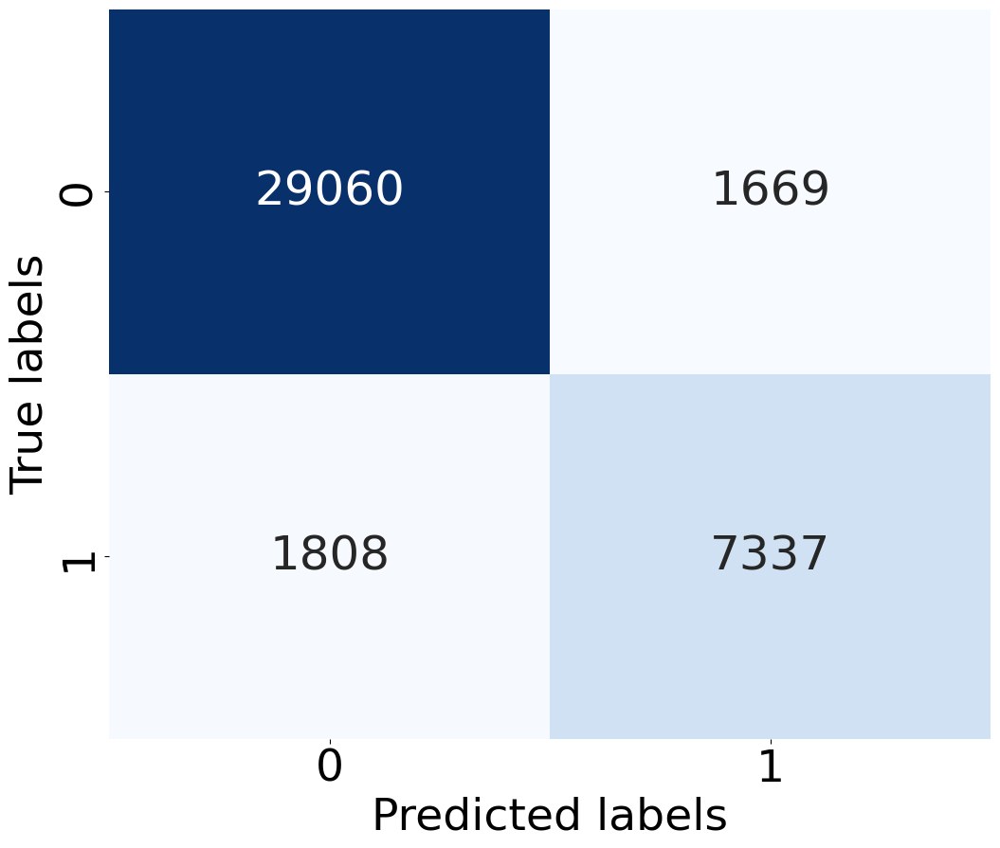

In [ ]:
# Compute confusion matrix and classification report
conf_matrix = confusion_matrix(y_test, y_pred_binary_LSTM_hybrid)
cr_error = classification_report(y_test, y_pred_binary_LSTM_hybrid)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 36})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix LSTM stat', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_LSTM_hybrid.pdf', format='pdf', bbox_inches='tight')
plt.show()

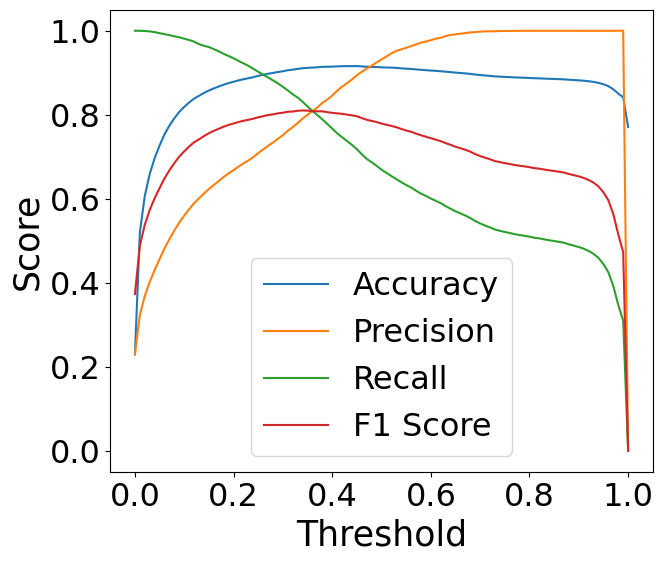

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_LSTM_hybrid = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_LSTM_hybrid)
    precision = precision_score(y_test, y_pred_binary_LSTM_hybrid)
    recall = recall_score(y_test, y_pred_binary_LSTM_hybrid)
    f1 = f1_score(y_test, y_pred_binary_LSTM_hybrid)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis LSTM stat', fontsize=30)
plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig('Threshold_Analysis_LSTM_hybrid.pdf', bbox_inches='tight')
plt.show()

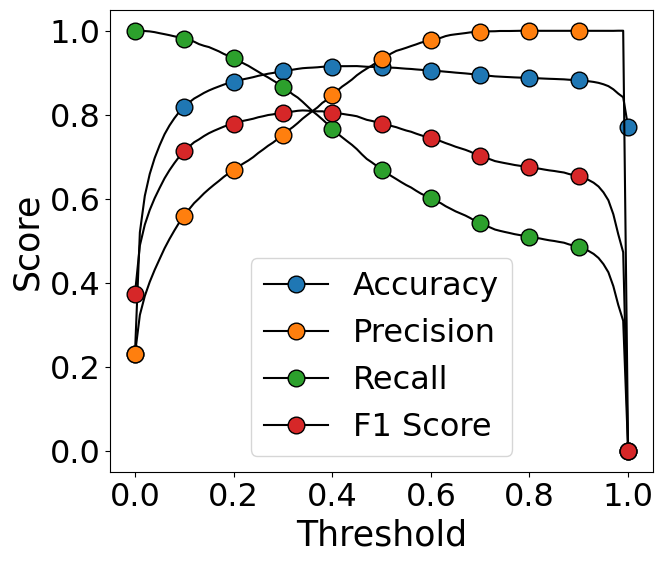

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_LSTM_hybrid.pdf', format='pdf', bbox_inches='tight')
plt.show()

# Hybrid Models (SMOTE)

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed_trimmed.csv")

In [ ]:
X_seq = df_train[["session_id_hash", "session"]]  # Features
X_stat = df_train[["nevents", "unique_products_viewed", "avg_dwell_time"]]
y = df_train["conversion"]  # Target variable

# Splitting the data into training and test sets
X_train_seq, X_test_seq, y_train, y_test = train_test_split(X_seq, y, test_size=0.2, random_state=42)
X_train_stat, X_test_stat, y_train, y_test = train_test_split(X_stat, y, test_size=0.2, random_state=42)

In [ ]:
sequences_train_seq = X_train_seq['session'].tolist()
sequences_test_seq = X_test_seq['session'].tolist()
sequences_train_seq = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_seq]
sequences_test_seq = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_test_seq]

# Pad sequences to a fixed length
max_length = 30  # Choose the maximum length you want
padded_sequences_train_seq = pad_sequences(sequences_train_seq, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test_seq = pad_sequences(sequences_test_seq, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train_seq = np.array(padded_sequences_train_seq)
labels_train = np.array(y_train)
sequences_test_seq = np.array(padded_sequences_test_seq)
labels_test = np.array(y_test)

In [ ]:
# Split the data into train, validation, and test sets
X_train_seq, X_val_seq, y_train, y_val = train_test_split(sequences_train_seq, labels_train, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Reshape the input data to match the expected input shape of the GRU layer
X_train_seq_reshaped = np.expand_dims(X_train_seq, axis=-1)
X_val_seq_reshaped = np.expand_dims(X_val_seq, axis=-1)
X_test_seq_reshaped = np.expand_dims(padded_sequences_test_seq, axis=-1)

In [ ]:
# Scale static features
scaler = StandardScaler()
X_train_stat = scaler.fit_transform(X_train_stat)
X_test_stat = scaler.transform(X_test_stat)

# Assuming static data splits
X_train_stat, X_val_stat = train_test_split(X_train_stat, test_size=0.25, random_state=42)

In [ ]:
print(len(X_train_seq))

119619


In [ ]:
print(len(X_train_stat))

119619


In [ ]:
print(len(y_train))

119619


In [ ]:
print("Class distribution before oversampling:", Counter(y_train))
# transform the dataset
oversample = SMOTE(sampling_strategy = 'minority', k_neighbors = 3)

X_train_seq_smote, y_train_smote = oversample.fit_resample(X_train_seq, y_train)
X_train_stat_smote, y_train_smote = oversample.fit_resample(X_train_stat, y_train)
# Print the distribution of classes after oversampling
print("Class distribution after oversampling:", Counter(y_train_smote))

Class distribution before oversampling: Counter({0.0: 92300, 1.0: 27319})
Class distribution after oversampling: Counter({0.0: 92300, 1.0: 92300})


In [ ]:
# Reshape the input data to match the expected input shape of the GRU layer
X_train_seq_smote_reshaped = np.expand_dims(X_train_seq_smote, axis=-1)

### GRU

In [ ]:
# Input layers
seq_input = Input(shape=(None, X_train_seq_smote_reshaped.shape[2]), name='seq_input')
stat_input = Input(shape=(X_train_stat_smote.shape[1],), name='stat_input')

# GRU layer for the sequential data
gru_out = GRU(32)(seq_input)

# Concatenate GRU output with static data
concat_layer = Concatenate()([gru_out, stat_input])

# Dense layer(s) for prediction
dense_layer = Dense(32, activation='relu')(concat_layer)
output_layer = Dense(1, activation='sigmoid')(dense_layer)

# Build the model
model_GRU_hybrid_smote = Model(inputs=[seq_input, stat_input], outputs=output_layer)

# Define the optimizer with the specified learning rate
optimizer = Adam(learning_rate=0.01)

In [ ]:
model_GRU_hybrid_smote.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model with validation data
history = model_GRU_hybrid_smote.fit(
    [X_train_seq_smote_reshaped, X_train_stat_smote], y_train_smote,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    batch_size=32,
    epochs=10
)

Epoch 1/10
5769/5769 [==============================] - 40s 7ms/step - loss: 0.4240 - accuracy: 0.7915 - val_loss: 0.3893 - val_accuracy: 0.8320
Epoch 2/10
5769/5769 [==============================] - 37s 6ms/step - loss: 0.2909 - accuracy: 0.8646 - val_loss: 0.2590 - val_accuracy: 0.8968
Epoch 3/10
5769/5769 [==============================] - 37s 6ms/step - loss: 0.2383 - accuracy: 0.8857 - val_loss: 0.2579 - val_accuracy: 0.8858
Epoch 4/10
5769/5769 [==============================] - 38s 7ms/step - loss: 0.2139 - accuracy: 0.8946 - val_loss: 0.2404 - val_accuracy: 0.8860
Epoch 5/10
5769/5769 [==============================] - 39s 7ms/step - loss: 0.2033 - accuracy: 0.8994 - val_loss: 0.2213 - val_accuracy: 0.8928
Epoch 6/10
5769/5769 [==============================] - 38s 7ms/step - loss: 0.1969 - accuracy: 0.9018 - val_loss: 0.2360 - val_accuracy: 0.8705
Epoch 7/10
5769/5769 [==============================] - 38s 7ms/step - loss: 0.1929 - accuracy: 0.9037 - val_loss: 0.2058 - val_ac

In [ ]:
model_save_name = 'model_GRU_hybrid_smote.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_hybrid_smote.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_GRU_hybrid_smote.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_hybrid_smote = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_smote.predict([X_train_seq_smote_reshaped, X_train_stat_smote])
y_pred_binary_GRU_hybrid_smote = (y_pred > 0.43408).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train_smote, y_pred_binary_GRU_hybrid_smote)

print("F1 Score:", f1)

5769/5769 [==============================] - 20s 3ms/step
F1 Score: 0.9088237042159918


In [ ]:
# Predict labels for the test set
y_pred_probs = model_GRU_hybrid_smote.predict([X_train_seq_smote_reshaped, X_train_stat_smote])

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_train_smote, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

5769/5769 [==============================] - 15s 3ms/step
Optimal Threshold: 0.43408203125
Optimal F1 Score: 0.9088237042159918


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_smote.predict([X_train_seq_smote_reshaped, X_train_stat_smote])
y_pred_binary_GRU_hybrid_smote = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train_smote, y_pred_binary_GRU_hybrid_smote)

print("F1 Score:", f1)

5769/5769 [==============================] - 16s 3ms/step
F1 Score: 0.9060199461066201


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_smote.predict([X_val_seq_reshaped, X_val_stat])
y_pred_binary_GRU_hybrid_smote = (y_pred > 0.43408).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_GRU_hybrid_smote)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 3ms/step
F1 Score: 0.7831429296775831


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_smote.predict([X_val_seq_reshaped, X_val_stat])
y_pred_binary_GRU_hybrid_smote = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_GRU_hybrid_smote)

print("F1 Score:", f1)

1247/1247 [==============================] - 4s 4ms/step
F1 Score: 0.7931053173613746


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_smote.predict([X_test_seq_reshaped, X_test_stat])
y_pred_binary_GRU_hybrid_smote = (y_pred > 0.43408).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_hybrid_smote)

print("F1 Score:", f1)

1247/1247 [==============================] - 13s 8ms/step
F1 Score: 0.7812468424775185


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_smote.predict([X_test_seq_reshaped, X_test_stat])
y_pred_binary_GRU_hybrid_smote = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_hybrid_smote)

print("F1 Score:", f1)

1247/1247 [==============================] - 11s 9ms/step
F1 Score: 0.7899360156165275


#### Hyperparameter Tuning

In [ ]:
# Suppress TensorFlow logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

def build_model(hp):
    # Input for sequential data
    seq_input = Input(shape=(None, 1), name='seq_input')
    gru_out = GRU(units=32)(seq_input)
    # Input for static data
    stat_input = Input(shape=(X_train_stat_smote.shape[1],), name='stat_input')
    # Concatenate GRU output with static data
    concat = Concatenate()([gru_out, stat_input])
    # Add a dense layer with dropout
    dropout_rate = hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.25)
    x = Dropout(rate=dropout_rate)(concat)
    x = Dense(units=32, activation="relu")(x)
    # Output layer
    output = Dense(1, activation="sigmoid")(x)
    # Build the model
    model = Model(inputs=[seq_input, stat_input], outputs=output)
    # Compile the model
    learning_rate = hp.Choice("learning_rate", [0.001, 0.01])
    batch_size = hp.Choice("batch_size", [128, 64, 32])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model


# Initialize a GridSearch tuner
tuner = GridSearch(
    build_model,
    objective='val_loss',
    overwrite=True)

# Perform the search
tuner.search(
    [X_train_seq_smote_reshaped, X_train_stat_smote], y_train_smote,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    epochs=10)

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hps.values)

Trial 18 Complete [00h 06m 25s]
val_loss: 0.5007994174957275

Best val_loss So Far: 0.18093177676200867
Total elapsed time: 01h 53m 50s
Best Hyperparameters:
{'dropout': 0.0, 'learning_rate': 0.01, 'batch_size': 32}


In [ ]:
hyperparameters_data = []
for trial in tuner.oracle.get_best_trials(num_trials=len(tuner.oracle.trials)):
    hyperparameters = trial.hyperparameters.values
    val_loss = trial.score
    hyperparameters_data.append({
        'Batch Size': hyperparameters['batch_size'],
        'Dropout': hyperparameters['dropout'],
        'Learning Rate': hyperparameters['learning_rate'],
        'Validation Loss': val_loss
    })

# Create DataFrame
df_results_GRU_hybrid_smote = pd.DataFrame(hyperparameters_data)

In [ ]:
df_results_GRU_hybrid_smote

,Batch Size,Dropout,Learning Rate,Validation Loss
0,32,0.00,0.010,0.180932
1,128,0.00,0.010,0.188580
2,128,0.00,0.001,0.194346
3,64,0.00,0.010,0.199875
4,64,0.00,0.001,0.201478
5,32,0.00,0.001,0.203920
6,128,0.25,0.001,0.402529
7,32,0.25,0.001,0.410488
8,64,0.25,0.001,0.416031
9,32,0.50,0.001,0.435628


In [ ]:
df_results_GRU_hybrid_smote.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_GRU_hybrid_smote.csv", index = False)

In [ ]:
df_results_GRU_hybrid_smote = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_GRU_hybrid_smote.csv")

In [ ]:
results_df = df_results_GRU_hybrid_smote

In [ ]:
def plot_parcoords(results_df):
    fig = go.Figure(data=
        go.Parcoords(
            line=dict(color=results_df['Validation Loss'], colorscale='Tealrose', showscale=True),
            dimensions=[
                dict(range=[min(results_df['Dropout']), max(results_df['Dropout'])],
                     label='Dropout', values=results_df['Dropout']),
                dict(range=[min(results_df['Batch Size']), max(results_df['Batch Size'])],
                     label='Batch Size', values=results_df['Batch Size']),
                dict(range=[min(results_df['Learning Rate']), max(results_df['Learning Rate'])],
                     label='Learning Rate', values=results_df['Learning Rate']),
                dict(range=[min(results_df['Validation Loss']), max(results_df['Validation Loss'])],
                     label='Validation Loss', values=results_df['Validation Loss'])
            ])
        )

    fig.show()

# Call the function with your dataframe
plot_parcoords(results_df)

In [ ]:
import plotly.graph_objects as go
import plotly.io as pio

# Create the contour plot
fig = go.Figure(data=go.Contour(
    x=results_df['Dropout'],
    y=results_df['Batch Size'],
    z=results_df['Validation Loss'],
    colorscale='Blues',  # Choose a colorscale
    colorbar=dict(
        title=dict(text='Validation Loss', font=dict(size=26)),
        thickness=50,  # Increase the thickness of the colorbar
        len=1.1,
        tickfont=dict(size=24)
    ),
))

# Update layout with increased font sizes
fig.update_layout(
#     title=dict(text='Contour Plot of Hyperparameters GRU Hybrid', font=dict(size=22)),
    xaxis=dict(title=dict(text='Dropout Rate', font=dict(size=26)), tickfont=dict(size=24)),
    yaxis=dict(title=dict(text='Batch Size', font=dict(size=26)), tickfont=dict(size=24))
)

fig.show()
pio.write_image(fig, 'hyperparameters_contour_plot_GRU_hybrid_SMOTE.pdf')

#### Error Analysis

              precision    recall  f1-score   support

         0.0       0.94      0.93      0.94     30729
         1.0       0.78      0.80      0.79      9145

    accuracy                           0.90     39874
   macro avg       0.86      0.87      0.86     39874
weighted avg       0.90      0.90      0.90     39874



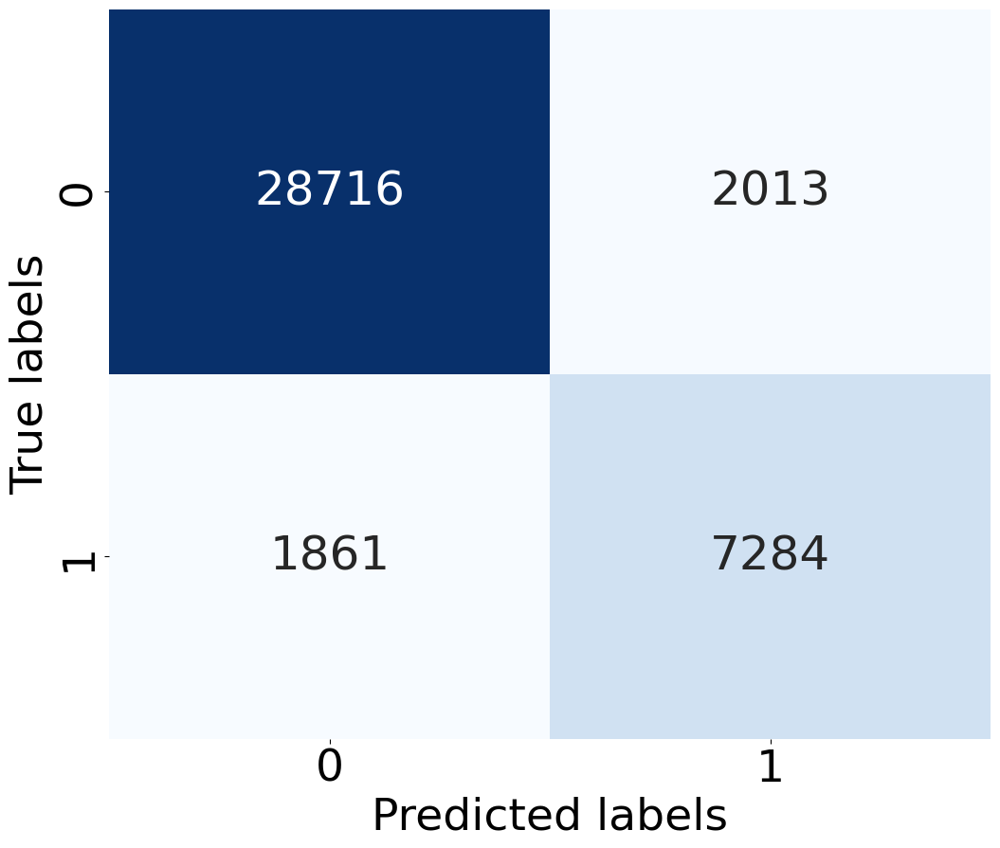

In [ ]:
# Compute confusion matrix and classification report
conf_matrix = confusion_matrix(y_test, y_pred_binary_GRU_hybrid_smote)
cr_error = classification_report(y_test, y_pred_binary_GRU_hybrid_smote)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 36})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix GRU stat', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_GRU_hybrid_smote.pdf', format='pdf', bbox_inches='tight')
plt.show()

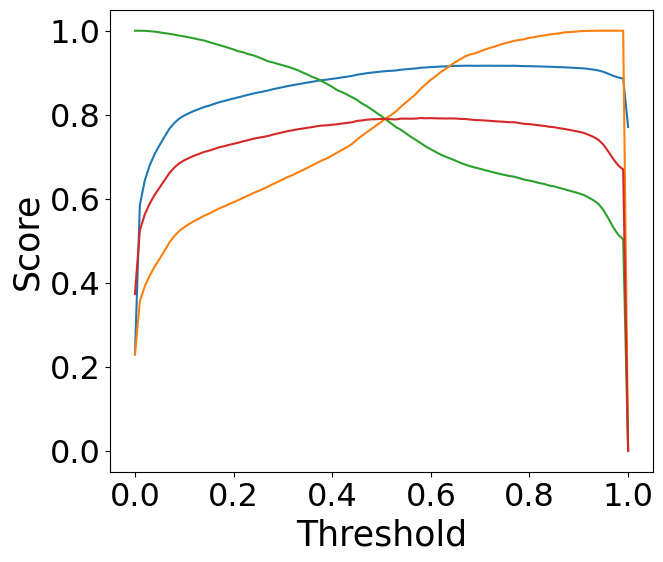

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_GRU_hybrid_smote = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_GRU_hybrid_smote)
    precision = precision_score(y_test, y_pred_binary_GRU_hybrid_smote)
    recall = recall_score(y_test, y_pred_binary_GRU_hybrid_smote)
    f1 = f1_score(y_test, y_pred_binary_GRU_hybrid_smote)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis LSTM stat', fontsize=30)
# plt.legend(fontsize=22)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig('Threshold_Analysis_GRU_hybrid_smote.pdf', bbox_inches='tight')
plt.show()

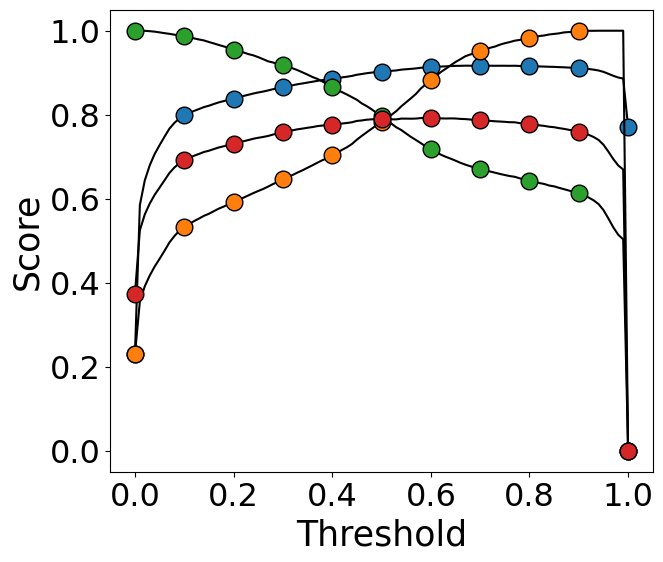

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_GRU_hybrid_smote.pdf', format='pdf', bbox_inches='tight')
plt.show()

## LSTM

In [ ]:
# Input layers
seq_input = Input(shape=(None, X_train_seq_smote_reshaped.shape[2]), name='seq_input')
stat_input = Input(shape=(X_train_stat_smote.shape[1],), name='stat_input')

# LSTM layer for the sequential data
gru_out = LSTM(32)(seq_input)

# Concatenate GRU output with static data
concat_layer = Concatenate()([gru_out, stat_input])

# Dense layer(s) for prediction
dense_layer = Dense(32, activation='relu')(concat_layer)
output_layer = Dense(1, activation='sigmoid')(dense_layer)

# Build the model
model_LSTM_hybrid_smote = Model(inputs=[seq_input, stat_input], outputs=output_layer)

# Define the optimizer with the specified learning rate
optimizer = Adam(learning_rate=0.01)

In [ ]:
model_LSTM_hybrid_smote.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model with validation data
history = model_LSTM_hybrid_smote.fit(
    [X_train_seq_smote_reshaped, X_train_stat_smote], y_train_smote,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    batch_size=32,
    epochs=10
)

Epoch 1/10
5769/5769 [==============================] - 39s 6ms/step - loss: 0.4151 - accuracy: 0.7956 - val_loss: 0.3894 - val_accuracy: 0.8168
Epoch 2/10
5769/5769 [==============================] - 40s 7ms/step - loss: 0.3038 - accuracy: 0.8578 - val_loss: 0.3142 - val_accuracy: 0.8636
Epoch 3/10
5769/5769 [==============================] - 39s 7ms/step - loss: 0.2537 - accuracy: 0.8833 - val_loss: 0.2670 - val_accuracy: 0.8850
Epoch 4/10
5769/5769 [==============================] - 39s 7ms/step - loss: 0.2273 - accuracy: 0.8955 - val_loss: 0.2604 - val_accuracy: 0.8874
Epoch 5/10
5769/5769 [==============================] - 39s 7ms/step - loss: 0.2119 - accuracy: 0.9009 - val_loss: 0.2420 - val_accuracy: 0.9017
Epoch 6/10
5769/5769 [==============================] - 38s 7ms/step - loss: 0.2005 - accuracy: 0.9059 - val_loss: 0.2296 - val_accuracy: 0.9030
Epoch 7/10
5769/5769 [==============================] - 36s 6ms/step - loss: 0.1930 - accuracy: 0.9091 - val_loss: 0.2121 - val_ac

In [ ]:
model_save_name = 'model_LSTM_hybrid_smote.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_hybrid_smote.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_LSTM_hybrid_smote.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_hybrid_smote = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_smote.predict([X_train_seq_smote_reshaped, X_train_stat_smote])
y_pred_binary_LSTM_hybrid_smote = (y_pred > 0.42626).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train_smote, y_pred_binary_LSTM_hybrid_smote)

print("F1 Score:", f1)

5769/5769 [==============================] - 17s 3ms/step
F1 Score: 0.9183488063304001


In [ ]:
# Predict labels for the test set
y_pred_probs = model_LSTM_hybrid_smote.predict([X_train_seq_smote_reshaped, X_train_stat_smote])

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_train_smote, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

5769/5769 [==============================] - 15s 3ms/step
Optimal Threshold: 0.42626953125
Optimal F1 Score: 0.9183488063304001


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_smote.predict([X_train_seq_smote_reshaped, X_train_stat_smote])
y_pred_binary_LSTM_hybrid_smote = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train_smote, y_pred_binary_LSTM_hybrid_smote)

print("F1 Score:", f1)

5769/5769 [==============================] - 17s 3ms/step
F1 Score: 0.9160242062505182


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_smote.predict([X_val_seq_reshaped, X_val_stat])
y_pred_binary_LSTM_hybrid_smote = (y_pred > 0.42626).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_LSTM_hybrid_smote)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.7913910654319731


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_smote.predict([X_val_seq_reshaped, X_val_stat])
y_pred_binary_LSTM_hybrid_smote = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_LSTM_hybrid_smote)

print("F1 Score:", f1)

1247/1247 [==============================] - 4s 3ms/step
F1 Score: 0.8003042155584529


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_smote.predict([X_test_seq_reshaped, X_test_stat])
y_pred_binary_LSTM_hybrid_smote = (y_pred > 0.42626).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_hybrid_smote)

print("F1 Score:", f1)

1247/1247 [==============================] - 13s 10ms/step
F1 Score: 0.7915441549224375


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_smote.predict([X_test_seq_reshaped, X_test_stat])
y_pred_binary_LSTM_hybrid_smote = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_hybrid_smote)

print("F1 Score:", f1)

1247/1247 [==============================] - 13s 10ms/step
F1 Score: 0.7983065566652193


### Hyperparameter Tuning

In [ ]:
# Suppress TensorFlow logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

def build_model(hp):
    # Input for sequential data
    seq_input = Input(shape=(None, 1), name='seq_input')
    gru_out = LSTM(units=32)(seq_input)
    # Input for static data
    stat_input = Input(shape=(X_train_stat_smote.shape[1],), name='stat_input')
    # Concatenate LSTM output with static data
    concat = Concatenate()([gru_out, stat_input])
    # Add a dense layer with dropout
    dropout_rate = hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.25)
    x = Dropout(rate=dropout_rate)(concat)
    x = Dense(units=32, activation="relu")(x)
    # Output layer
    output = Dense(1, activation="sigmoid")(x)
    # Build the model
    model = Model(inputs=[seq_input, stat_input], outputs=output)
    # Compile the model
    learning_rate = hp.Choice("learning_rate", [0.001, 0.01])
    batch_size = hp.Choice("batch_size", [128, 64, 32])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model


# Initialize a GridSearch tuner
tuner = GridSearch(
    build_model,
    objective='val_loss',
    overwrite=True)

# Perform the search
tuner.search(
    [X_train_seq_smote_reshaped, X_train_stat_smote], y_train_smote,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    epochs=10)

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hps.values)

Trial 18 Complete [00h 06m 33s]
val_loss: 0.4913623034954071

Best val_loss So Far: 0.18469147384166718
Total elapsed time: 02h 02m 57s
Best Hyperparameters:
{'dropout': 0.0, 'learning_rate': 0.01, 'batch_size': 32}


In [ ]:
hyperparameters_data = []
for trial in tuner.oracle.get_best_trials(num_trials=len(tuner.oracle.trials)):
    hyperparameters = trial.hyperparameters.values
    val_loss = trial.score
    hyperparameters_data.append({
        'Batch Size': hyperparameters['batch_size'],
        'Dropout': hyperparameters['dropout'],
        'Learning Rate': hyperparameters['learning_rate'],
        'Validation Loss': val_loss
    })

# Create DataFrame
df_results_LSTM_hybrid_smote = pd.DataFrame(hyperparameters_data)

In [ ]:
df_results_LSTM_hybrid_smote

,Batch Size,Dropout,Learning Rate,Validation Loss
0,32,0.00,0.010,0.184691
1,128,0.00,0.010,0.185004
2,64,0.00,0.010,0.188303
3,64,0.00,0.001,0.188452
4,128,0.00,0.001,0.191383
5,32,0.00,0.001,0.196022
6,32,0.25,0.001,0.420426
7,64,0.25,0.001,0.420551
8,32,0.50,0.001,0.442906
9,64,0.50,0.001,0.446211


In [ ]:
df_results_LSTM_hybrid_smote.to_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_LSTM_hybrid_smote.csv", index = False)

In [ ]:
df_results_LSTM_hybrid_smote = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_results_LSTM_hybrid_smote.csv")

In [ ]:
results_df = df_results_LSTM_hybrid_smote

In [ ]:
def plot_parcoords(results_df):
    fig = go.Figure(data=
        go.Parcoords(
            line=dict(color=results_df['Validation Loss'], colorscale='Tealrose', showscale=True),
            dimensions=[
                dict(range=[min(results_df['Dropout']), max(results_df['Dropout'])],
                     label='Dropout', values=results_df['Dropout']),
                dict(range=[min(results_df['Batch Size']), max(results_df['Batch Size'])],
                     label='Batch Size', values=results_df['Batch Size']),
                dict(range=[min(results_df['Learning Rate']), max(results_df['Learning Rate'])],
                     label='Learning Rate', values=results_df['Learning Rate']),
                dict(range=[min(results_df['Validation Loss']), max(results_df['Validation Loss'])],
                     label='Validation Loss', values=results_df['Validation Loss'])
            ])
        )

    fig.show()

# Call the function with your dataframe
plot_parcoords(results_df)

In [ ]:
import plotly.graph_objects as go
import plotly.io as pio

# Create the contour plot
fig = go.Figure(data=go.Contour(
    x=results_df['Dropout'],
    y=results_df['Batch Size'],
    z=results_df['Validation Loss'],
    colorscale='Blues',  # Choose a colorscale
    colorbar=dict(
        title=dict(text='Validation Loss', font=dict(size=26)),
        thickness=50,  # Increase the thickness of the colorbar
        len=1.1,
        tickfont=dict(size=24)
    ),
))

# Update layout with increased font sizes
fig.update_layout(
#     title=dict(text='Contour Plot of Hyperparameters GRU Hybrid', font=dict(size=22)),
    xaxis=dict(title=dict(text='Dropout Rate', font=dict(size=26)), tickfont=dict(size=24)),
    yaxis=dict(title=dict(text='Batch Size', font=dict(size=26)), tickfont=dict(size=24))
)

fig.show()
pio.write_image(fig, 'hyperparameters_contour_plot_LSTM_hybrid_SMOTE.pdf')

### Error Analysis

              precision    recall  f1-score   support

         0.0       0.94      0.94      0.94     30729
         1.0       0.79      0.80      0.80      9145

    accuracy                           0.91     39874
   macro avg       0.87      0.87      0.87     39874
weighted avg       0.91      0.91      0.91     39874



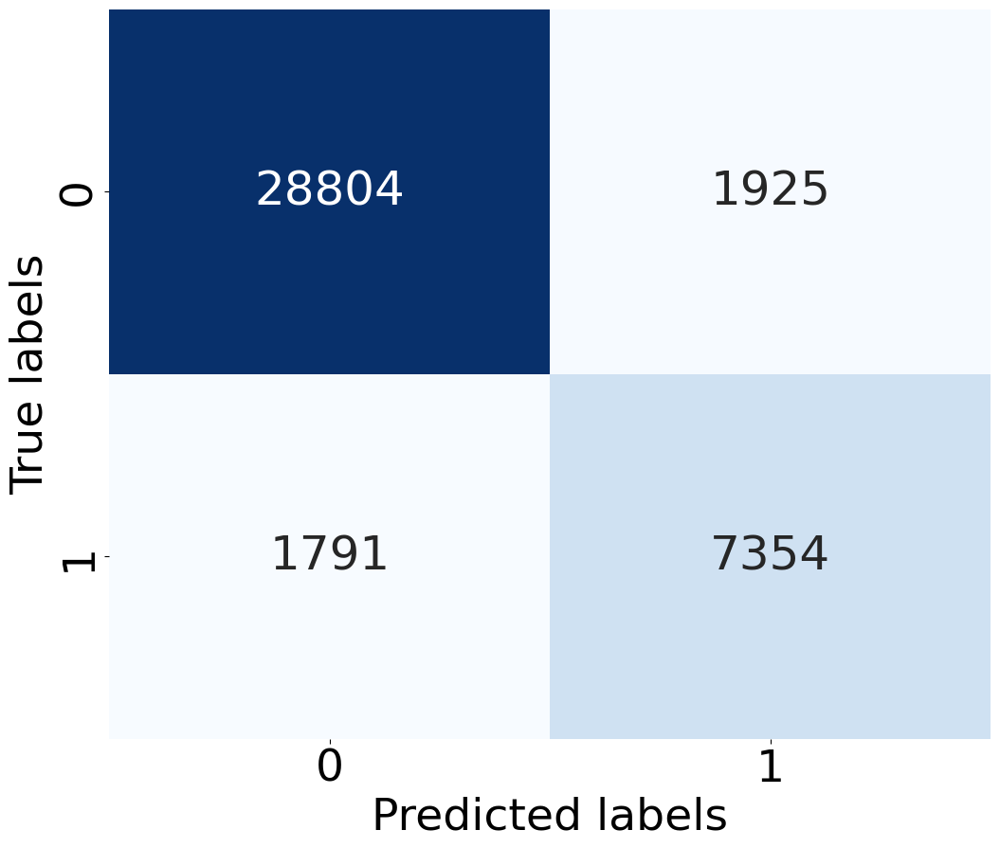

In [ ]:
# Compute confusion matrix and classification report
conf_matrix = confusion_matrix(y_test, y_pred_binary_LSTM_hybrid_smote)
cr_error = classification_report(y_test, y_pred_binary_LSTM_hybrid_smote)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 36})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix LSTM stat', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_LSTM_hybrid_smote.pdf', format='pdf', bbox_inches='tight')
plt.show()

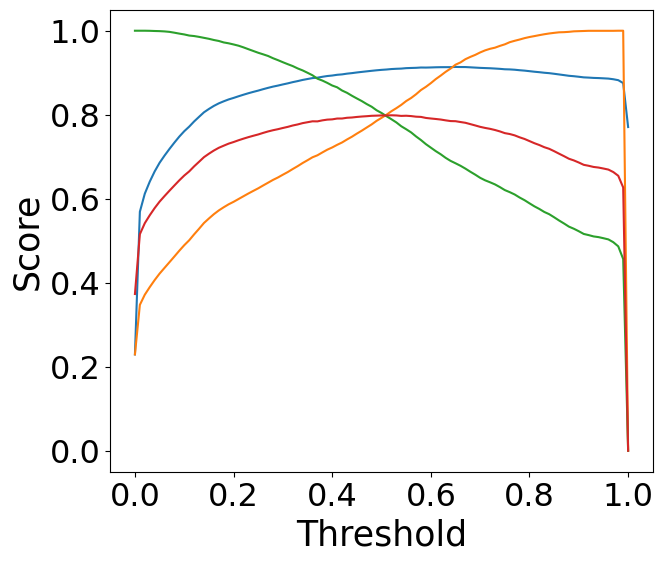

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_LSTM_hybrid_smote = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_LSTM_hybrid_smote)
    precision = precision_score(y_test, y_pred_binary_LSTM_hybrid_smote)
    recall = recall_score(y_test, y_pred_binary_LSTM_hybrid_smote)
    f1 = f1_score(y_test, y_pred_binary_LSTM_hybrid_smote)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis LSTM stat', fontsize=30)
# plt.legend(fontsize=22)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig('Threshold_Analysis_LSTM_hybrid_smote.pdf', bbox_inches='tight')
plt.show()

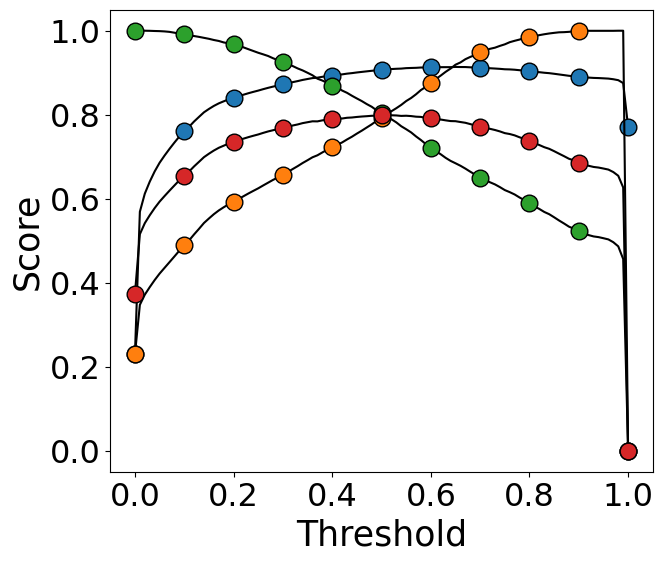

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_LSTM_hybrid_smote.pdf', format='pdf', bbox_inches='tight')
plt.show()

# Hybrid Models (ENN)

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Thesis/Datasets/df_train_processed_trimmed.csv")

In [ ]:
X_seq = df_train[["session_id_hash", "session"]]  # Features
X_stat = df_train[["nevents", "unique_products_viewed", "avg_dwell_time"]]
y = df_train["conversion"]  # Target variable

# Splitting the data into training and test sets
X_train_seq, X_test_seq, y_train, y_test = train_test_split(X_seq, y, test_size=0.2, random_state=42)
X_train_stat, X_test_stat, y_train, y_test = train_test_split(X_stat, y, test_size=0.2, random_state=42)

In [ ]:
sequences_train_seq = X_train_seq['session'].tolist()
sequences_test_seq = X_test_seq['session'].tolist()
sequences_train_seq = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_train_seq]
sequences_test_seq = [[int(num) for num in item.strip("[]").split(', ')] for item in sequences_test_seq]

# Pad sequences to a fixed length
max_length = 30  # Choose the maximum length you want
padded_sequences_train_seq = pad_sequences(sequences_train_seq, maxlen= max_length, padding='post', truncating='post')
padded_sequences_test_seq = pad_sequences(sequences_test_seq, maxlen= max_length, padding='post', truncating='post')

# Convert padded sequences to NumPy array
sequences_train_seq = np.array(padded_sequences_train_seq)
labels_train = np.array(y_train)
sequences_test_seq = np.array(padded_sequences_test_seq)
labels_test = np.array(y_test)

In [ ]:
# Split the data into train, validation, and test sets
X_train_seq, X_val_seq, y_train, y_val = train_test_split(sequences_train_seq, labels_train, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Reshape the input data to match the expected input shape of the GRU layer
X_train_seq_reshaped = np.expand_dims(X_train_seq, axis=-1)
X_val_seq_reshaped = np.expand_dims(X_val_seq, axis=-1)
X_test_seq_reshaped = np.expand_dims(padded_sequences_test_seq, axis=-1)

In [ ]:
# Scale static features
scaler = StandardScaler()
X_train_stat = scaler.fit_transform(X_train_stat)
X_test_stat = scaler.transform(X_test_stat)

# Assuming static data splits
X_train_stat, X_val_stat = train_test_split(X_train_stat, test_size=0.25, random_state=42)

In [ ]:
print(len(X_train_seq))
print(len(X_train_stat))
print(len(y_train))

119619
119619
119619


In [ ]:
# Print class distribution before oversampling
print("Class distribution before oversampling:", Counter(y_train))
# Initialize Edited Nearest Neighbours with n_neighbors parameter
enn = EditedNearestNeighbours(n_neighbors=5)
# Resample the sequential data and get the indices of the retained samples
X_train_seq_enn, y_train_enn = enn.fit_resample(X_train_seq, y_train)
indices_seq = enn.sample_indices_
# Apply the same indices to the static data
X_train_stat_enn = X_train_stat[indices_seq]
# Ensure the lengths are the same
assert len(X_train_seq_enn) == len(X_train_stat_enn) == len(y_train_enn)
# Print class distribution after oversampling
print("Class distribution after oversampling:", Counter(y_train_enn))
# Check lengths
print(len(X_train_seq_enn))
print(len(X_train_stat_enn))

Class distribution before oversampling: Counter({0.0: 92300, 1.0: 27319})
Class distribution after oversampling: Counter({0.0: 34893, 1.0: 27319})
62212
62212


In [ ]:
# Reshape the input data to match the expected input shape of the GRU layer
X_train_seq_enn_reshaped = np.expand_dims(X_train_seq_enn, axis=-1)

## GRU

In [ ]:
# Input layers
seq_input = Input(shape=(None, X_train_seq_enn_reshaped.shape[2]), name='seq_input')
stat_input = Input(shape=(X_train_stat_enn.shape[1],), name='stat_input')

# GRU layer for the sequential data
gru_out = GRU(32)(seq_input)

# Concatenate GRU output with static data
concat_layer = Concatenate()([gru_out, stat_input])

# Dense layer(s) for prediction
dense_layer = Dense(32, activation='relu')(concat_layer)
output_layer = Dense(1, activation='sigmoid')(dense_layer)

# Build the model
model_GRU_hybrid_enn = Model(inputs=[seq_input, stat_input], outputs=output_layer)

# Define the optimizer with the specified learning rate
optimizer = Adam(learning_rate=0.01)

NameError: name 'X_train_seq_enn_reshaped' is not defined

In [ ]:
model_GRU_hybrid_enn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
print(len(X_train_seq_enn_reshaped))
print(len(X_train_stat_enn))

62218
62218


In [ ]:
# Train the model with validation data
history = model_GRU_hybrid_enn.fit(
    [X_train_seq_enn_reshaped, X_train_stat_enn], y_train_enn,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    batch_size=32,
    epochs=10
)

Epoch 1/10
1945/1945 [==============================] - 18s 8ms/step - loss: 0.4787 - accuracy: 0.7655 - val_loss: 0.5046 - val_accuracy: 0.7440
Epoch 2/10
1945/1945 [==============================] - 16s 8ms/step - loss: 0.3295 - accuracy: 0.8533 - val_loss: 0.4004 - val_accuracy: 0.7927
Epoch 3/10
1945/1945 [==============================] - 15s 7ms/step - loss: 0.2496 - accuracy: 0.8862 - val_loss: 0.4219 - val_accuracy: 0.7644
Epoch 4/10
1945/1945 [==============================] - 16s 8ms/step - loss: 0.2275 - accuracy: 0.8954 - val_loss: 0.4237 - val_accuracy: 0.7766
Epoch 5/10
1945/1945 [==============================] - 14s 7ms/step - loss: 0.2134 - accuracy: 0.9026 - val_loss: 0.3909 - val_accuracy: 0.7809
Epoch 6/10
1945/1945 [==============================] - 15s 7ms/step - loss: 0.2014 - accuracy: 0.9077 - val_loss: 0.3255 - val_accuracy: 0.8293
Epoch 7/10
1945/1945 [==============================] - 17s 8ms/step - loss: 0.1913 - accuracy: 0.9125 - val_loss: 0.3551 - val_ac

In [ ]:
model_save_name = 'model_GRU_hybrid_enn.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_hybrid_enn.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_GRU_hybrid_enn.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_GRU_hybrid_enn = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_enn.predict([X_train_seq_enn_reshaped, X_train_stat_enn])
y_pred_binary_GRU_hybrid_enn = (y_pred > 0.49609).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train_enn, y_pred_binary_GRU_hybrid_enn)

print("F1 Score:", f1)

1945/1945 [==============================] - 6s 3ms/step
F1 Score: 0.9179447034124469


In [ ]:
# Predict labels for the test set
y_pred_probs = model_GRU_hybrid_enn.predict([X_train_seq_enn_reshaped, X_train_stat_enn])

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_train_enn, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

1945/1945 [==============================] - 6s 3ms/step
Optimal Threshold: 0.49609375
Optimal F1 Score: 0.9179447034124469


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_enn.predict([X_train_seq_enn_reshaped, X_train_stat_enn])
y_pred_binary_GRU_hybrid_enn = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train_enn, y_pred_binary_GRU_hybrid_enn)

print("F1 Score:", f1)

1945/1945 [==============================] - 6s 3ms/step
F1 Score: 0.9176407697790449


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_enn.predict([X_val_seq_reshaped, X_val_stat])
y_pred_binary_GRU_hybrid_enn = (y_pred > 0.49609).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_GRU_hybrid_enn)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 3ms/step
F1 Score: 0.7430429128738621


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_enn.predict([X_val_seq_reshaped, X_val_stat])
y_pred_binary_GRU_hybrid_enn = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_GRU_hybrid_enn)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.7446697415368548


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_enn.predict([X_test_seq_reshaped, X_test_stat])
y_pred_binary_GRU_hybrid_enn = (y_pred > 0.49609).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_hybrid_enn)

print("F1 Score:", f1)

1247/1247 [==============================] - 8s 6ms/step
F1 Score: 0.7459637276544171


In [ ]:
# Predict labels for the test set
y_pred = model_GRU_hybrid_enn.predict([X_test_seq_reshaped, X_test_stat])
y_pred_binary_GRU_hybrid_enn = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_GRU_hybrid_enn)

print("F1 Score:", f1)

1247/1247 [==============================] - 8s 6ms/step
F1 Score: 0.7468843631942333


#### Error Analysis

              precision    recall  f1-score   support

         0.0       0.98      0.83      0.90     30729
         1.0       0.62      0.94      0.75      9145

    accuracy                           0.85     39874
   macro avg       0.80      0.88      0.82     39874
weighted avg       0.90      0.85      0.86     39874



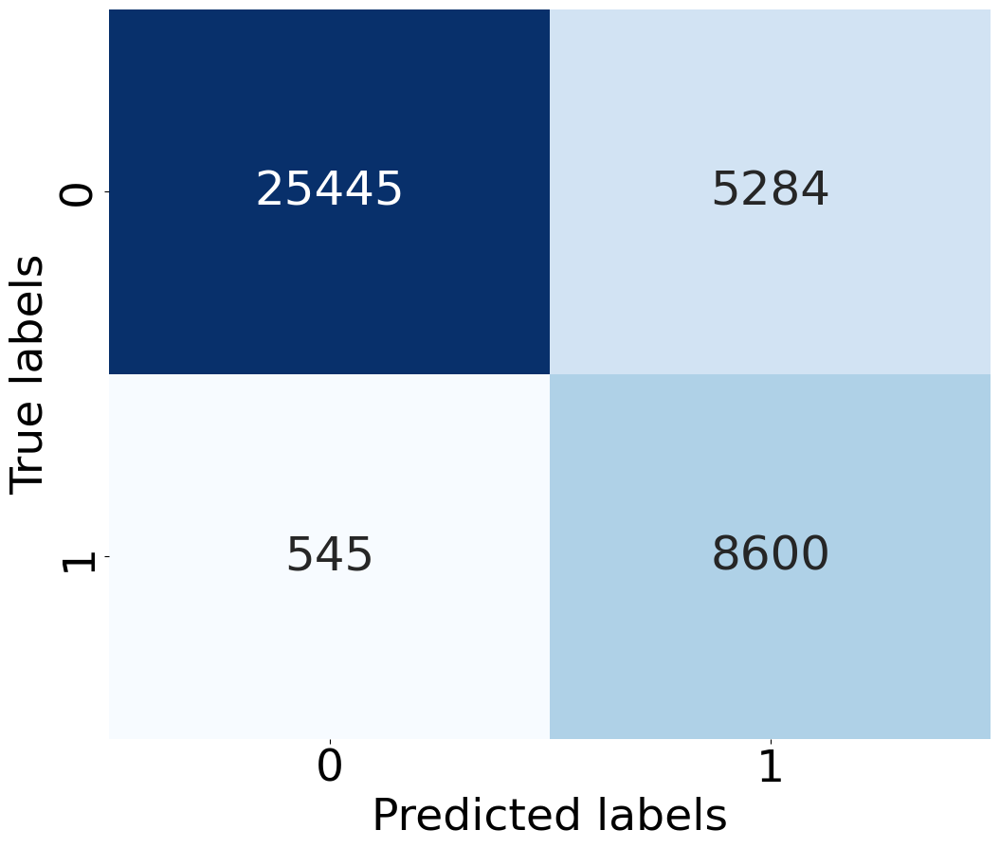

In [ ]:
# Compute confusion matrix and classification report
conf_matrix = confusion_matrix(y_test, y_pred_binary_GRU_hybrid_enn)
cr_error = classification_report(y_test, y_pred_binary_GRU_hybrid_enn)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 36})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix GRU stat', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_GRU_hybrid_enn.pdf', format='pdf', bbox_inches='tight')
plt.show()

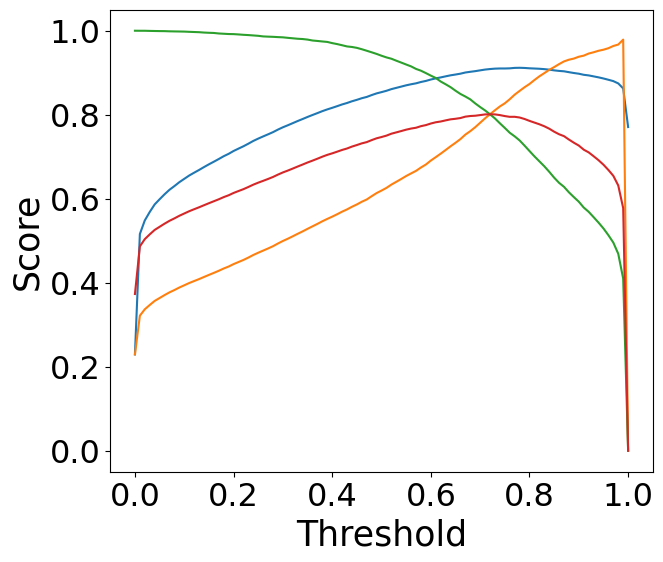

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_GRU_hybrid_enn = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_GRU_hybrid_enn)
    precision = precision_score(y_test, y_pred_binary_GRU_hybrid_enn)
    recall = recall_score(y_test, y_pred_binary_GRU_hybrid_enn)
    f1 = f1_score(y_test, y_pred_binary_GRU_hybrid_enn)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis LSTM stat', fontsize=30)
# plt.legend(fontsize=22)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig('Threshold_Analysis_GRU_hybrid_enn.pdf', bbox_inches='tight')
plt.show()

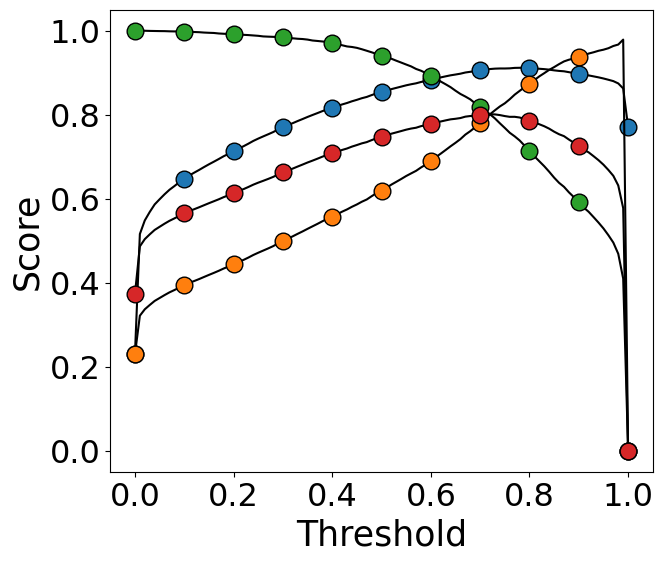

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_GRU_hybrid_enn.pdf', format='pdf', bbox_inches='tight')
plt.show()

## LSTM

In [ ]:
# Input layers
seq_input = Input(shape=(None, X_train_seq_enn_reshaped.shape[2]), name='seq_input')
stat_input = Input(shape=(X_train_stat_enn.shape[1],), name='stat_input')

# GRU layer for the sequential data
gru_out = LSTM(32)(seq_input)

# Concatenate GRU output with static data
concat_layer = Concatenate()([gru_out, stat_input])

# Dense layer(s) for prediction
dense_layer = Dense(32, activation='relu')(concat_layer)
output_layer = Dense(1, activation='sigmoid')(dense_layer)

# Build the model
model_LSTM_hybrid_enn = Model(inputs=[seq_input, stat_input], outputs=output_layer)

# Define the optimizer with the specified learning rate
optimizer = Adam(learning_rate=0.01)

In [ ]:
model_LSTM_hybrid_enn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model with validation data
history = model_LSTM_hybrid_enn.fit(
    [X_train_seq_enn_reshaped, X_train_stat_enn], y_train_enn,
    validation_data=([X_val_seq_reshaped, X_val_stat], y_val),
    batch_size=64,
    epochs=10
)

Epoch 1/10
973/973 [==============================] - 8s 8ms/step - loss: 0.2884 - accuracy: 0.8737 - val_loss: 0.5406 - val_accuracy: 0.7158
Epoch 2/10
973/973 [==============================] - 7s 7ms/step - loss: 0.2571 - accuracy: 0.8873 - val_loss: 0.5257 - val_accuracy: 0.7167
Epoch 3/10
973/973 [==============================] - 8s 9ms/step - loss: 0.2362 - accuracy: 0.8953 - val_loss: 0.3815 - val_accuracy: 0.8031
Epoch 4/10
973/973 [==============================] - 7s 7ms/step - loss: 0.2235 - accuracy: 0.9007 - val_loss: 0.4388 - val_accuracy: 0.7594
Epoch 5/10
973/973 [==============================] - 8s 8ms/step - loss: 0.2103 - accuracy: 0.9052 - val_loss: 0.3772 - val_accuracy: 0.8058
Epoch 6/10
973/973 [==============================] - 7s 7ms/step - loss: 0.2014 - accuracy: 0.9091 - val_loss: 0.4285 - val_accuracy: 0.7625
Epoch 7/10
973/973 [==============================] - 8s 8ms/step - loss: 0.1953 - accuracy: 0.9122 - val_loss: 0.4394 - val_accuracy: 0.7660
Epoch 

In [ ]:
model_save_name = 'model_LSTM_hybrid_enn.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_hybrid_enn.save(path)

In [ ]:
# Load the model from the saved HDF5 file
model_save_name = 'model_LSTM_hybrid_enn.h5'
path = "/content/drive/MyDrive/Thesis/Models/" + model_save_name
model_LSTM_hybrid_enn = load_model(path)

In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_enn.predict([X_train_seq_enn_reshaped, X_train_stat_enn])
y_pred_binary_LSTM_hybrid_enn = (y_pred > 0.44140).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train_enn, y_pred_binary_LSTM_hybrid_enn)

print("F1 Score:", f1)

1945/1945 [==============================] - 6s 3ms/step
F1 Score: 0.9107357632170684


In [ ]:
# Predict labels for the test set
y_pred_probs = model_LSTM_hybrid_enn.predict([X_train_seq_enn_reshaped, X_train_stat_enn])

# Conduct binary search to find the optimal threshold
optimal_threshold, optimal_f1 = binary_search_threshold(y_train_enn, y_pred_probs)

print("Optimal Threshold:", optimal_threshold)
print("Optimal F1 Score:", optimal_f1)

1945/1945 [==============================] - 5s 3ms/step
Optimal Threshold: 0.44140625
Optimal F1 Score: 0.9107357632170684


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_enn.predict([X_train_seq_enn_reshaped, X_train_stat_enn])
y_pred_binary_LSTM_hybrid_enn = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_train_enn, y_pred_binary_LSTM_hybrid_enn)

print("F1 Score:", f1)

1945/1945 [==============================] - 6s 3ms/step
F1 Score: 0.9091752448575455


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_enn.predict([X_val_seq_reshaped, X_val_stat])
y_pred_binary_LSTM_hybrid_enn = (y_pred > 0.44140).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_LSTM_hybrid_enn)

print("F1 Score:", f1)

1247/1247 [==============================] - 4s 3ms/step
F1 Score: 0.7208685562738273


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_enn.predict([X_val_seq_reshaped, X_val_stat])
y_pred_binary_LSTM_hybrid_enn = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_val, y_pred_binary_LSTM_hybrid_enn)

print("F1 Score:", f1)

1247/1247 [==============================] - 3s 2ms/step
F1 Score: 0.7442674601785402


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_enn.predict([X_test_seq_reshaped, X_test_stat])
y_pred_binary_LSTM_hybrid_enn = (y_pred > 0.44140).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_hybrid_enn)

print("F1 Score:", f1)

1247/1247 [==============================] - 9s 7ms/step
F1 Score: 0.7231151615575808


In [ ]:
# Predict labels for the test set
y_pred = model_LSTM_hybrid_enn.predict([X_test_seq_reshaped, X_test_stat])
y_pred_binary_LSTM_hybrid_enn = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the F1 score
f1 = f1_score(y_test, y_pred_binary_LSTM_hybrid_enn)

print("F1 Score:", f1)

1247/1247 [==============================] - 7s 5ms/step
F1 Score: 0.7450209643605871


#### Error Analysis

              precision    recall  f1-score   support

         0.0       0.98      0.83      0.90     30729
         1.0       0.62      0.93      0.75      9145

    accuracy                           0.85     39874
   macro avg       0.80      0.88      0.82     39874
weighted avg       0.89      0.85      0.86     39874



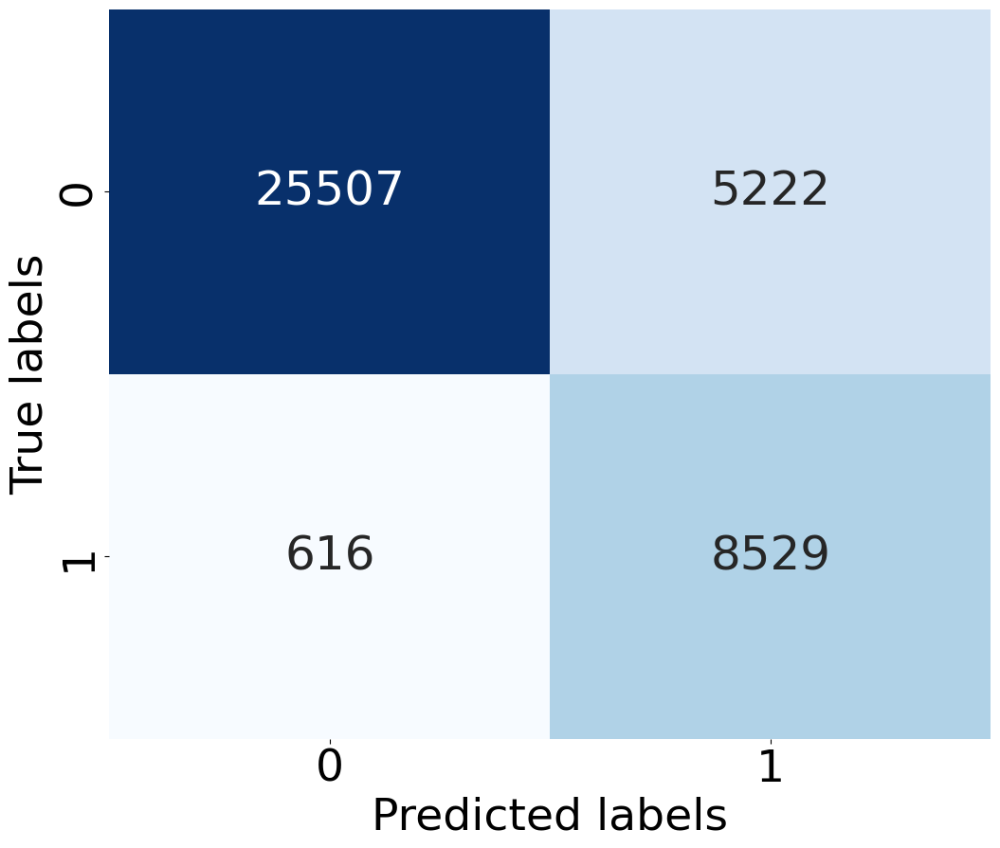

In [ ]:
# Compute confusion matrix and classification report
conf_matrix = confusion_matrix(y_test, y_pred_binary_LSTM_hybrid_enn)
cr_error = classification_report(y_test, y_pred_binary_LSTM_hybrid_enn)
print(cr_error)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 36})
plt.xlabel('Predicted labels', fontsize=34)
plt.ylabel('True labels', fontsize=34)
# plt.title('Confusion Matrix LSTM stat', fontsize=32)
plt.xticks(fontsize=34)
plt.yticks(fontsize=34)
plt.savefig('Confusion_Matrix_LSTM_hybrid_enn.pdf', format='pdf', bbox_inches='tight')
plt.show()

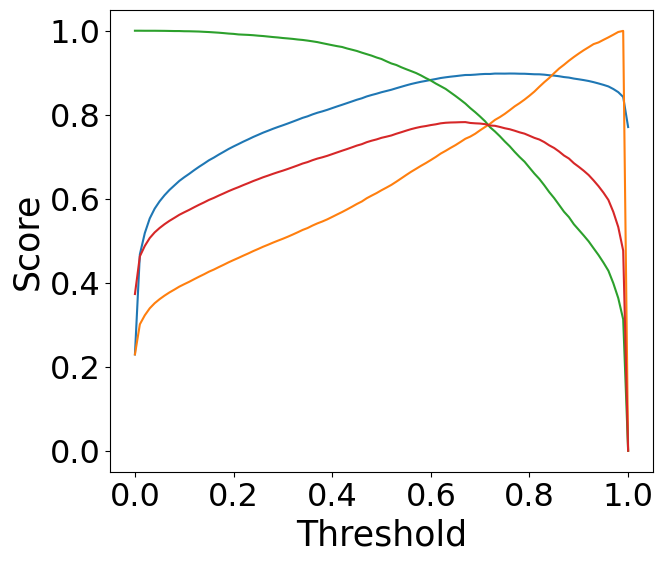

In [ ]:
thresholds = np.linspace(0, 1, 101)  # 100 thresholds from 0 to 1

# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary_LSTM_hybrid_enn = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary_LSTM_hybrid_enn)
    precision = precision_score(y_test, y_pred_binary_LSTM_hybrid_enn)
    recall = recall_score(y_test, y_pred_binary_LSTM_hybrid_enn)
    f1 = f1_score(y_test, y_pred_binary_LSTM_hybrid_enn)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

plt.plot(thresholds, accuracy_scores, label='Accuracy')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, f1_scores, label='F1 Score')

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.title('Threshold Analysis LSTM stat', fontsize=30)
# plt.legend(fontsize=22)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)
# plt.grid(True)

plt.savefig('Threshold_Analysis_LSTM_hybrid_enn.pdf', bbox_inches='tight')
plt.show()

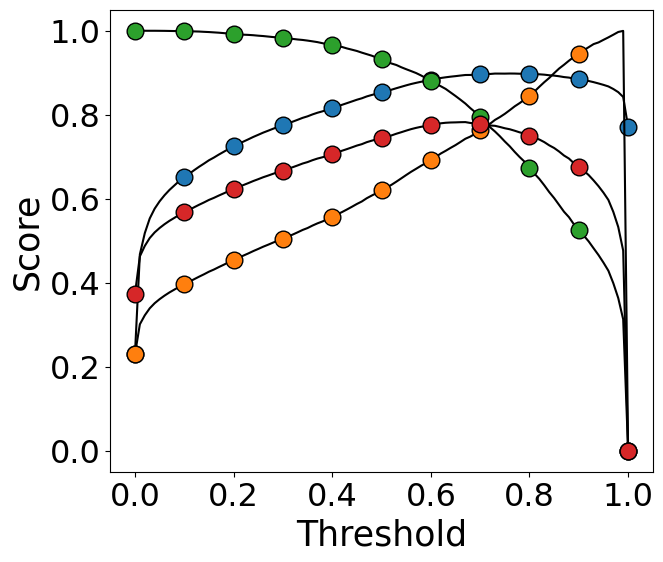

In [ ]:
thresholds = np.linspace(0, 1, 101)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each threshold
for threshold in thresholds:
    # Convert probabilities to binary predictions based on the threshold
    y_pred_binary = np.where(y_pred > threshold, 1, 0)

    # Evaluate the model using the current threshold
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Append evaluation metrics to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

plt.figure(figsize=(7, 6))

# Reduce the frequency of markers by plotting only a subset of the points for markers
marker_every = 10  # Show marker every 10 points

# Define colors for the markers
tab10 = plt.get_cmap('tab10')

plt.plot(thresholds, accuracy_scores, linestyle='-', color='black', label='Accuracy', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(0))
plt.plot(thresholds, precision_scores, linestyle='-', color='black', label='Precision', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(1))
plt.plot(thresholds, recall_scores, linestyle='-', color='black', label='Recall', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(2))
plt.plot(thresholds, f1_scores, linestyle='-', color='black', label='F1 Score', marker='o', markersize=12, markevery=marker_every, markerfacecolor=tab10(3))

plt.xlabel('Threshold', fontsize=25)
plt.ylabel('Score', fontsize=25)
# plt.legend(fontsize=23)
plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.savefig('Threshold_Analysis_LSTM_hybrid_enn.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
y_pred_hybrid_GRU = model_GRU_hybrid.predict([padded_sequences_test_seq, X_test_stat])
y_pred_hybrid_LSTM  = model_LSTM_hybrid.predict([padded_sequences_test_seq, X_test_stat])
y_pred_hybrid_GRU_SMOTE = model_GRU_hybrid_smote.predict([X_test_seq_reshaped, X_test_stat])
y_pred_hybrid_LSTM_SMOTE  = model_LSTM_hybrid_smote.predict([X_test_seq_reshaped, X_test_stat])
y_pred_hybrid_GRU_ENN  = model_GRU_hybrid_enn.predict([X_test_seq_reshaped, X_test_stat])
y_pred_hybrid_LSTM_ENN  = model_LSTM_hybrid_enn.predict([X_test_seq_reshaped, X_test_stat])

1247/1247 [==============================] - 7s 5ms/step


In [ ]:
# Compute Brier score
brier_score = brier_score_loss(y_test, y_pred_hybrid_GRU)
print("Brier Score GRU:", brier_score)
brier_score = brier_score_loss(y_test, y_pred_hybrid_GRU_SMOTE)
print("Brier Score GRU_SMOTE:", brier_score)
brier_score = brier_score_loss(y_test, y_pred_hybrid_GRU_ENN)
print("Brier Score GRU_ENN:", brier_score)
brier_score = brier_score_loss(y_test, y_pred_hybrid_LSTM)
print("Brier Score LSTM:", brier_score)
brier_score = brier_score_loss(y_test, y_pred_hybrid_LSTM_SMOTE)
print("Brier Score LSTM_SMOTE:", brier_score)
brier_score = brier_score_loss(y_test, y_pred_hybrid_LSTM_ENN)
print("Brier Score LSTM_ENN:", brier_score)

Brier Score GRU: 0.05755668163301488
Brier Score GRU_SMOTE: 0.06173133973550813
Brier Score GRU_ENN: 0.09656741745980335
Brier Score LSTM: 0.058798400568129246
Brier Score LSTM_SMOTE: 0.061499450612301595
Brier Score LSTM_ENN: 0.09739228356072237


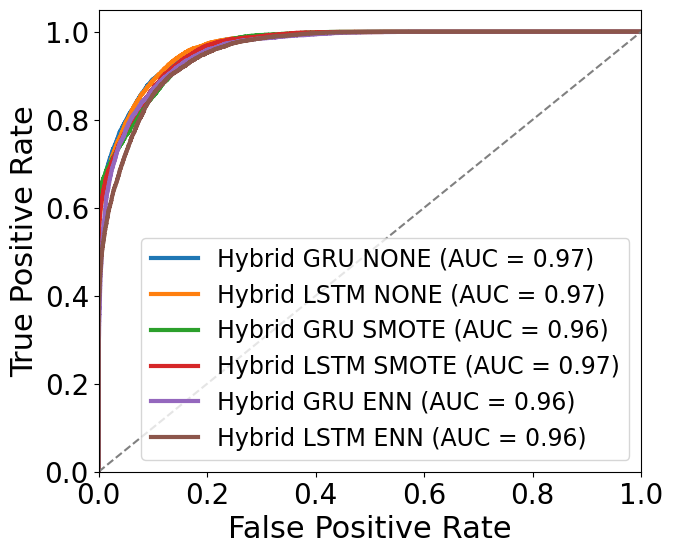

In [ ]:
# Compute ROC curve for GRU
fpr_hybrid_GRU, tpr_hybrid_GRU, thresholds_hybrid_GRU = roc_curve(y_test, y_pred_hybrid_GRU)
roc_auc_hybrid_GRU = auc(fpr_hybrid_GRU, tpr_hybrid_GRU)

# Compute ROC curve for LSTM
fpr_hybrid_LSTM, tpr_hybrid_LSTM, thresholds_hybrid_LSTM = roc_curve(y_test, y_pred_hybrid_LSTM)
roc_auc_hybrid_LSTM = auc(fpr_hybrid_LSTM, tpr_hybrid_LSTM)

# Compute ROC curve for GRU SMOTE
fpr_hybrid_GRU_SMOTE, tpr_hybrid_GRU_SMOTE, thresholds_hybrid_GRU_SMOTE = roc_curve(y_test, y_pred_hybrid_GRU_SMOTE)
roc_auc_hybrid_GRU_SMOTE = auc(fpr_hybrid_GRU_SMOTE, tpr_hybrid_GRU_SMOTE)

# Compute ROC curve for LSTM SMOTE
fpr_hybrid_LSTM_SMOTE, tpr_hybrid_LSTM_SMOTE, thresholds_hybrid_LSTM_SMOTE = roc_curve(y_test, y_pred_hybrid_LSTM_SMOTE)
roc_auc_hybrid_LSTM_SMOTE = auc(fpr_hybrid_LSTM_SMOTE, tpr_hybrid_LSTM_SMOTE)

# Compute ROC curve for GRU ENN
fpr_hybrid_GRU_ENN, tpr_hybrid_GRU_ENN, thresholds_hybrid_GRU_ENN = roc_curve(y_test, y_pred_hybrid_GRU_ENN)
roc_auc_hybrid_GRU_ENN = auc(fpr_hybrid_GRU_ENN, tpr_hybrid_GRU_ENN)

# Compute ROC curve for LSTM ENN
fpr_hybrid_LSTM_ENN, tpr_hybrid_LSTM_ENN, thresholds_hybrid_LSTM_ENN = roc_curve(y_test, y_pred_hybrid_LSTM_ENN)
roc_auc_hybrid_LSTM_ENN  = auc(fpr_hybrid_LSTM_ENN, tpr_hybrid_LSTM_ENN)


# Plot ROC curve
plt.figure(figsize=(7, 6))
plt.plot(fpr_hybrid_GRU, tpr_hybrid_GRU, color='tab:blue', lw=3, label=f'Hybrid GRU NONE (AUC = {roc_auc_hybrid_GRU:.2f})')
plt.plot(fpr_hybrid_LSTM, tpr_hybrid_LSTM, color='tab:orange', lw=3, label=f'Hybrid LSTM NONE (AUC = {roc_auc_hybrid_LSTM:.2f})')
plt.plot(fpr_hybrid_GRU_SMOTE, tpr_hybrid_GRU_SMOTE, color='tab:green', lw=3, label=f'Hybrid GRU SMOTE (AUC = {roc_auc_hybrid_GRU_SMOTE:.2f})')
plt.plot(fpr_hybrid_LSTM_SMOTE, tpr_hybrid_LSTM_SMOTE, color='tab:red', lw=3, label=f'Hybrid LSTM SMOTE (AUC = {roc_auc_hybrid_LSTM_SMOTE:.2f})')
plt.plot(fpr_hybrid_GRU_ENN, tpr_hybrid_GRU_ENN, color='tab:purple', lw=3, label=f'Hybrid GRU ENN (AUC = {roc_auc_hybrid_GRU_ENN:.2f})')
plt.plot(fpr_hybrid_LSTM_ENN, tpr_hybrid_LSTM_ENN, color='tab:brown', lw=3, label=f'Hybrid LSTM ENN (AUC = {roc_auc_hybrid_LSTM_ENN:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=22)
plt.ylabel('True Positive Rate', fontsize=22)
# plt.title('ROC Curves', fontsize=24)
plt.legend(loc="lower right", fontsize=17)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
# plt.grid(True)
plt.savefig('ROC_Curves_hybrid.pdf', format='pdf')
plt.show()